<a href="https://colab.research.google.com/github/thaliaslsblla27-cpu/thalia_DPL/blob/main/TugasPer4_DCGAN_41236805_THALIA_SALSABILLA_TI_2023_KIP_P4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [10]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os

# Konfigurasi agar GPU digunakan secara efisien
physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU Terdeteksi: ", physical_devices[0])
else:
    print("Peringatan: GPU tidak terdeteksi. Training akan lambat.")

GPU Terdeteksi:  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [11]:
# Create the .kaggle directory if it doesn't exist
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the .kaggle directory
# IMPORTANT: Make sure you have uploaded kaggle.json to your Colab session's /content/ directory first.
# If you uploaded it somewhere else, adjust the source path accordingly.
!mv /content/kaggle.json ~/.kaggle/

# Set read-only permissions for the kaggle.json file for security
!chmod 600 ~/.kaggle/kaggle.json

print("Kaggle API credentials set up successfully!")

Kaggle API credentials set up successfully!


In [12]:
# Install kaggle if not already installed
!pip install -q kaggle

# Make sure your Kaggle API credentials (kaggle.json) are set up in ~/.kaggle/
# If you haven't done this, please refer to the previous instructions.

# Download the dataset
!kaggle datasets download -d joosthazelzet/lego-brick-images

# Unzip the downloaded dataset to the specified directory
# The zip file will be downloaded to the current working directory (/content/)
!unzip -q /content/lego-brick-images.zip -d /content/dataset/

# Clean up the zip file after extraction
!rm /content/lego-brick-images.zip

print("Dataset downloaded and extracted to /content/dataset/")

Dataset URL: https://www.kaggle.com/datasets/joosthazelzet/lego-brick-images
License(s): GPL-2.0
 96% 975M/1.00G [00:10<00:00, 69.2MB/s]
100% 1.00G/1.00G [00:11<00:00, 96.0MB/s]
Dataset downloaded and extracted to /content/dataset/


In [13]:
# Parameter Konfigurasi
BATCH_SIZE = 64
IMG_HEIGHT = 64  # Menggunakan 64x64 agar detail LEGO cukup terlihat
IMG_WIDTH = 64
CHANNELS = 3     # RGB


# --- OPSI B: Membuat Dataset Loader ---
# Ganti 'path/to/images' dengan path folder dataset Anda
dataset_dir = '/content/dataset/LEGO brick images v1'

# Jika folder kosong/tidak ada, kita buat dummy data agar kode tetap jalan (untuk testing)
if not os.path.exists(dataset_dir) or not os.listdir(dataset_dir):
    print("Dataset tidak ditemukan. Membuat data dummy untuk demonstrasi struktur kode.")
    os.makedirs(dataset_dir, exist_ok=True)
    # Membuat 100 gambar random noise sebagai placeholder
    for i in range(100):
        img = np.random.randint(0, 255, (64, 64, 3), dtype=np.uint8)
        tf.keras.utils.save_img(f"{dataset_dir}/dummy_{i}.png", img)

# Memuat dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    dataset_dir,
    label_mode=None, # Kita tidak butuh label untuk GAN
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE
)

# Normalisasi ke [-1, 1]
train_dataset = train_dataset.map(lambda x: (x - 127.5) / 127.5)

# Optimasi performa (Caching & Prefetching)
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

Found 6479 files.


In [14]:
latent_dim = 128

def build_generator():
    model = keras.Sequential(name="generator")

    # Input: Latent Vector
    # Mulai dengan dense layer yang cukup besar untuk di-reshape
    # Kita ingin mulai dari ukuran 8x8 dengan 512 filter
    model.add(layers.Dense(8 * 8 * 512, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Reshape menjadi tensor 3D
    model.add(layers.Reshape((8, 8, 512)))

    # Upsampling 1: 8x8 -> 16x16
    model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 2: 16x16 -> 32x32
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 3: 32x32 -> 64x64
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Output Layer: 64x64 -> 64x64x3 (RGB)
    # Aktivasi TANH penting agar output di range [-1, 1]
    model.add(layers.Conv2D(CHANNELS, (3, 3), padding='same', activation='tanh'))

    return model

def build_discriminator():
    model = keras.Sequential(name="discriminator")

    # Input: Gambar 64x64x3
    # Downsampling 1: 64 -> 32
    model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 2: 32 -> 16
    model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 3: 16 -> 8
    model.add(layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Flatten dan Output
    model.add(layers.Flatten())
    model.add(layers.Dense(1)) # Output berupa logit (skor real/fake)

    return model

# Inisialisasi Model
generator = build_generator()
discriminator = build_discriminator()

generator.summary()
# discriminator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2 (Dense)                 │ (None, 32768)          │     4,194,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32768)          │       131,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 16, 16, 256)    │     2,097,152 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_4              │ (None, 32, 32, 128)    │       524,288 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_5              │ (None, 64, 64, 64)     │       131,072 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_10 (LeakyReLU)      │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 3)      │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,081,411 (27.01 MB)

 Trainable params: 7,014,979 (26.76 MB)

 Non-trainable params: 66,432 (259.50 KB)

In [15]:
class DCGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        # Metric trackers
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # 1. Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 2. Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # 3. Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # 4. Assemble labels discriminating real from fake images
        # Label 1 untuk fake, 0 untuk real (atau sebaliknya, teknik ini menggunakan label smoothing)
        # Di sini kita pakai standar: 1=Real, 0=Fake.
        # Namun, karena kita concat [Fake, Real], maka labelnya: [0...0, 1...1]
        labels = tf.concat(
            [tf.zeros((batch_size, 1)), tf.ones((batch_size, 1))], axis=0
        )

        # Tambahkan sedikit noise pada label (Label Smoothing) untuk stabilitas
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # 5. Train the Discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)

        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # 6. Sample random points in the latent space (lagi, untuk Generator)
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 7. Assemble labels that say "all real images" (We want to fool the discriminator)
        misleading_labels = tf.ones((batch_size, 1))

        # 8. Train the Generator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)

        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(
            zip(grads, self.generator.trainable_weights)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [16]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 127.5
        generated_images += 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(10, 4))
        for i in range(self.num_img):
            plt.subplot(1, self.num_img, i+1)
            img = keras.utils.array_to_img(generated_images[i])
            plt.imshow(img)
            plt.axis('off')

        plt.suptitle(f"Epoch {epoch+1}")
        plt.show() # Tampilkan inline di Colab

        # Opsional: Simpan ke file
        # plt.savefig(f"generated_lego_epoch_{epoch}.png")
        # plt.close()

Mulai Training...
Epoch 1/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - d_loss: 0.4789 - g_loss: 0.7350

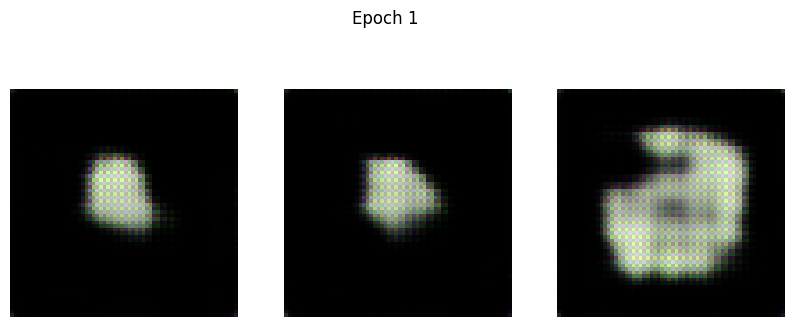

102/102 ━━━━━━━━━━━━━━━━━━━━ 29s 176ms/step - d_loss: 0.4795 - g_loss: 0.7351
Epoch 2/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - d_loss: 0.6741 - g_loss: 0.7422

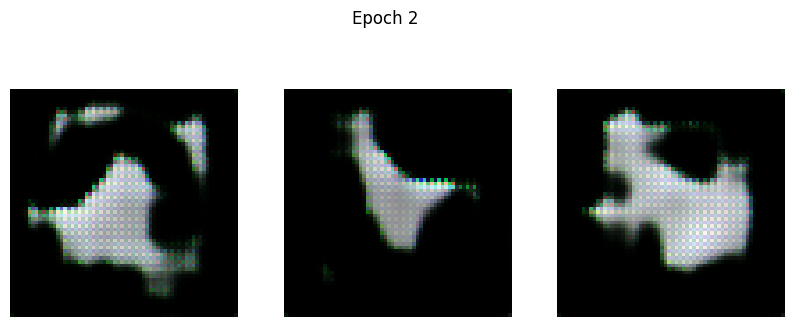

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - d_loss: 0.6741 - g_loss: 0.7421
Epoch 3/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - d_loss: 0.6651 - g_loss: 0.7596

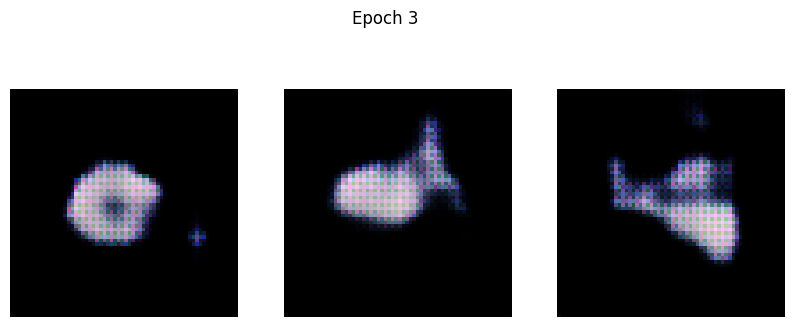

102/102 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - d_loss: 0.6651 - g_loss: 0.7597
Epoch 4/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - d_loss: 0.6568 - g_loss: 0.7805

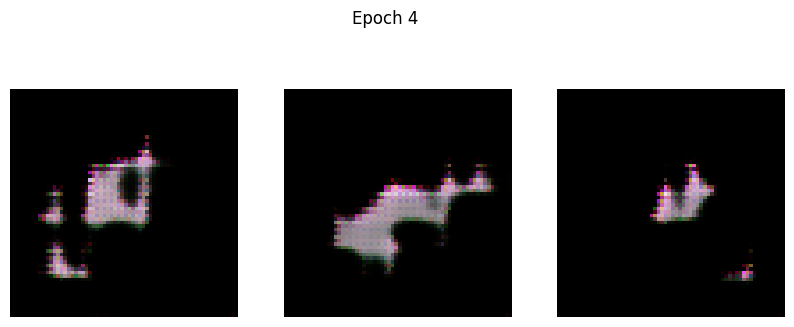

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - d_loss: 0.6568 - g_loss: 0.7805
Epoch 5/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - d_loss: 0.6546 - g_loss: 0.8034

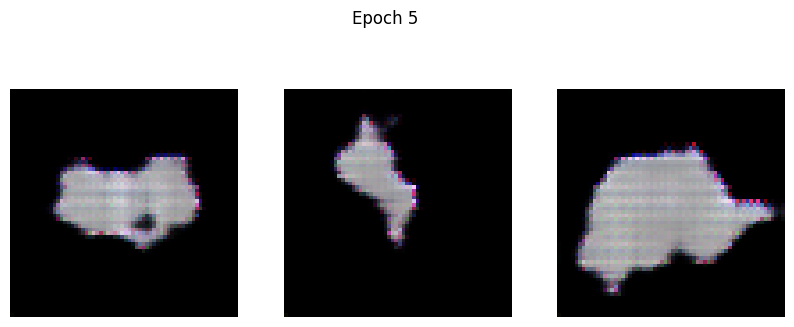

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - d_loss: 0.6547 - g_loss: 0.8032
Epoch 6/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - d_loss: 0.6494 - g_loss: 0.8081

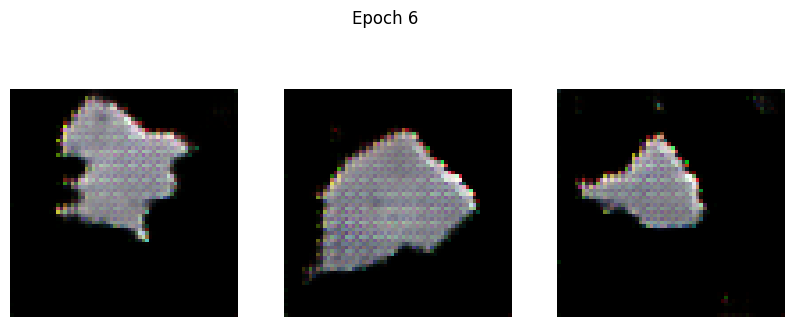

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - d_loss: 0.6494 - g_loss: 0.8079
Epoch 7/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - d_loss: 0.6492 - g_loss: 0.7914

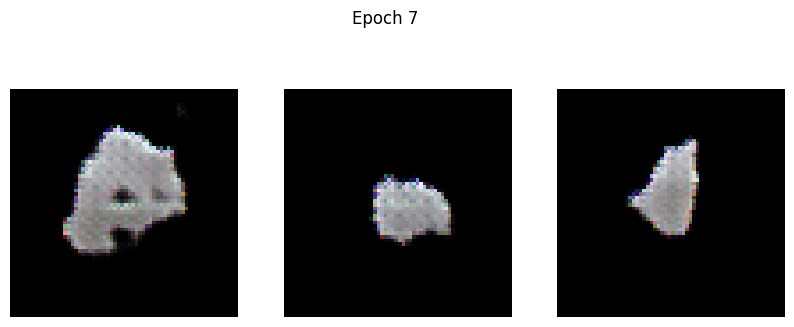

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step - d_loss: 0.6492 - g_loss: 0.7913
Epoch 8/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - d_loss: 0.6661 - g_loss: 0.7457

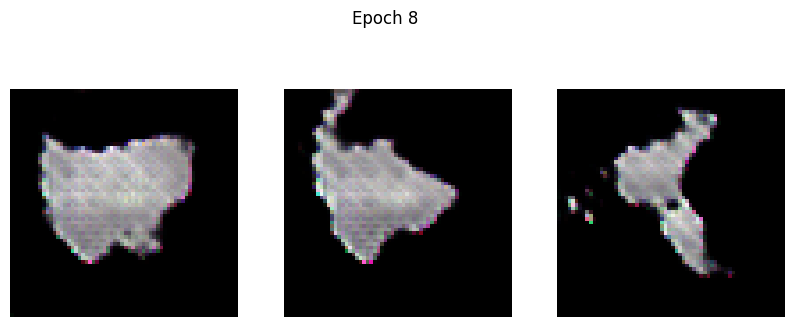

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - d_loss: 0.6661 - g_loss: 0.7458
Epoch 9/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - d_loss: 0.6516 - g_loss: 0.7404

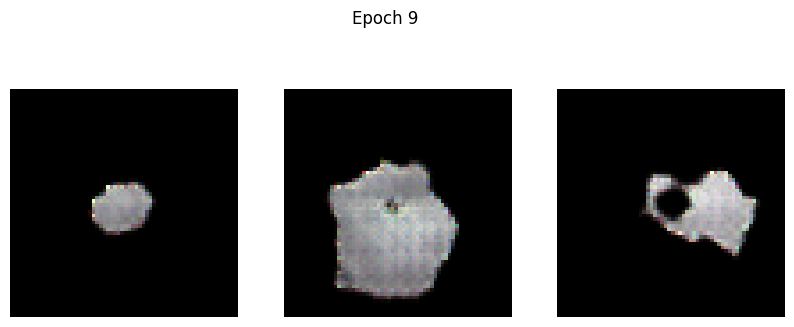

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - d_loss: 0.6516 - g_loss: 0.7405
Epoch 10/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - d_loss: 0.6462 - g_loss: 0.7480

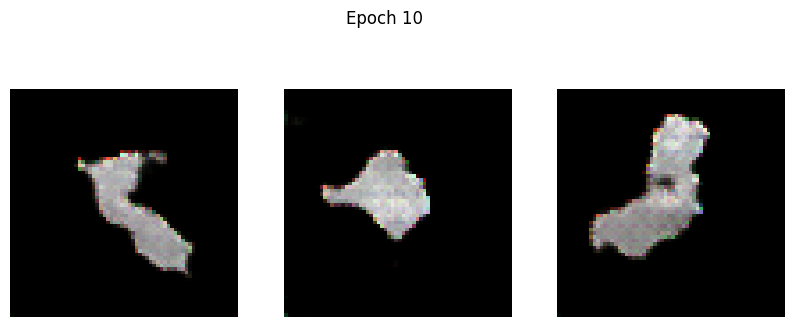

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - d_loss: 0.6462 - g_loss: 0.7481
Epoch 11/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - d_loss: 0.6406 - g_loss: 0.7679

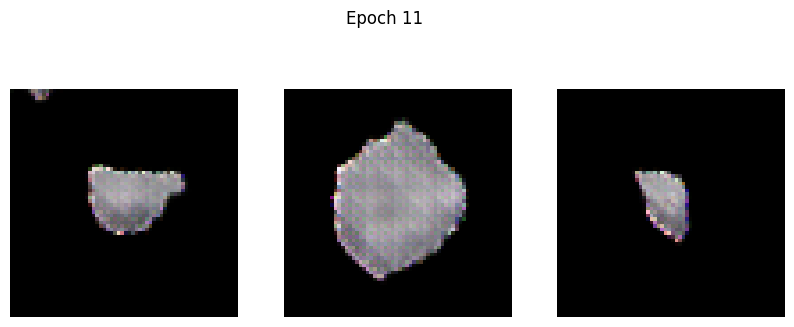

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step - d_loss: 0.6406 - g_loss: 0.7680
Epoch 12/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - d_loss: 0.6309 - g_loss: 0.8191

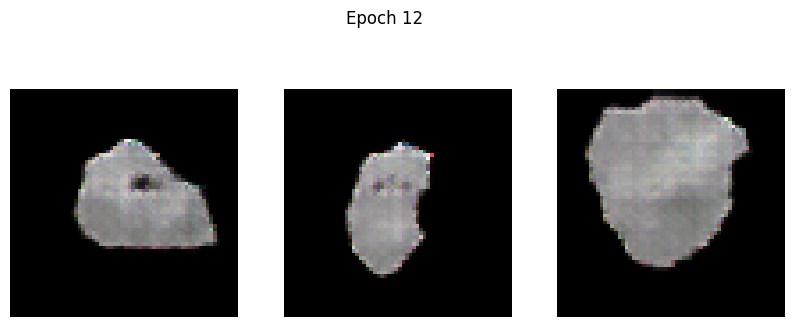

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step - d_loss: 0.6309 - g_loss: 0.8191
Epoch 13/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - d_loss: 0.6228 - g_loss: 0.8541

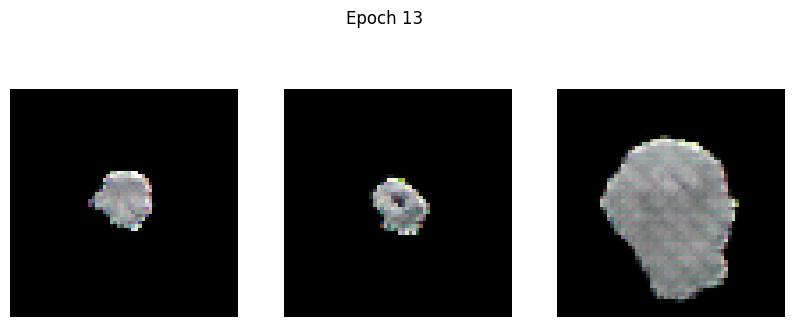

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step - d_loss: 0.6228 - g_loss: 0.8544
Epoch 14/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - d_loss: 0.6193 - g_loss: 0.9003

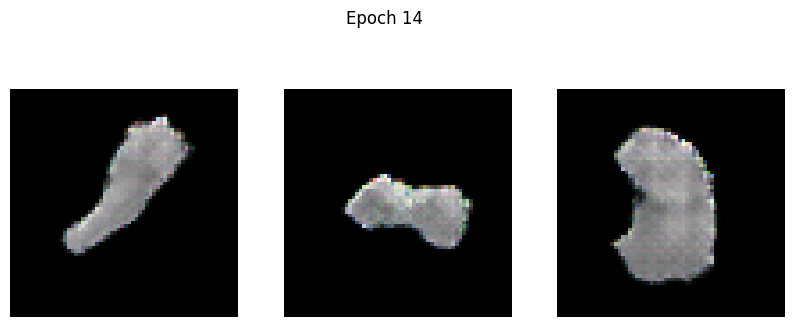

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - d_loss: 0.6193 - g_loss: 0.9004
Epoch 15/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - d_loss: 0.5968 - g_loss: 0.9011

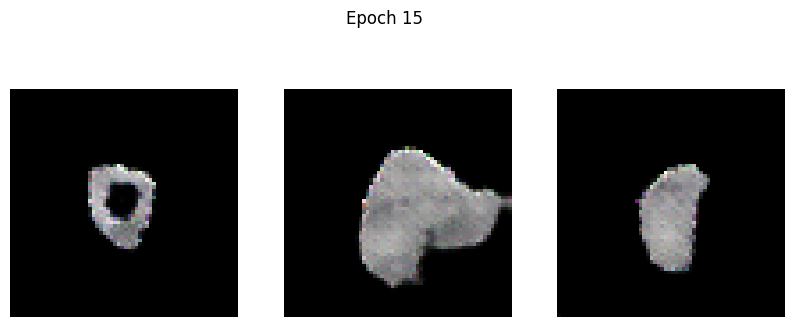

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - d_loss: 0.5968 - g_loss: 0.9011
Epoch 16/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - d_loss: 0.6017 - g_loss: 0.9098

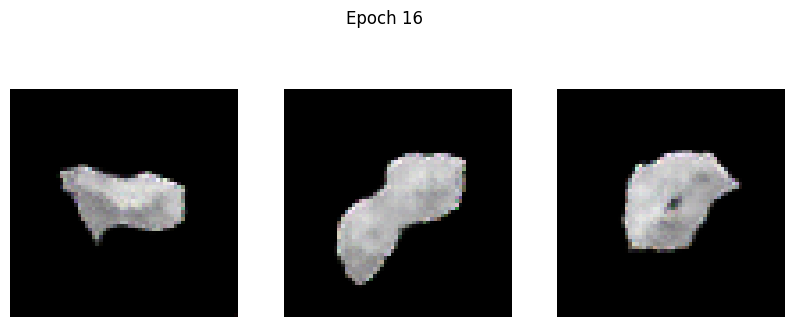

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - d_loss: 0.6016 - g_loss: 0.9098
Epoch 17/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - d_loss: 0.5817 - g_loss: 0.9160

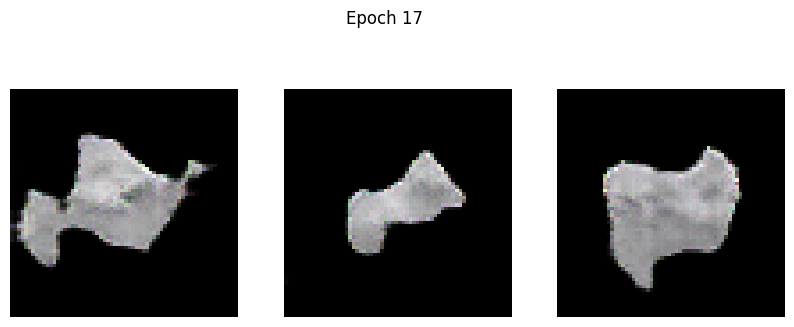

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - d_loss: 0.5817 - g_loss: 0.9160
Epoch 18/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - d_loss: 0.5728 - g_loss: 0.9354

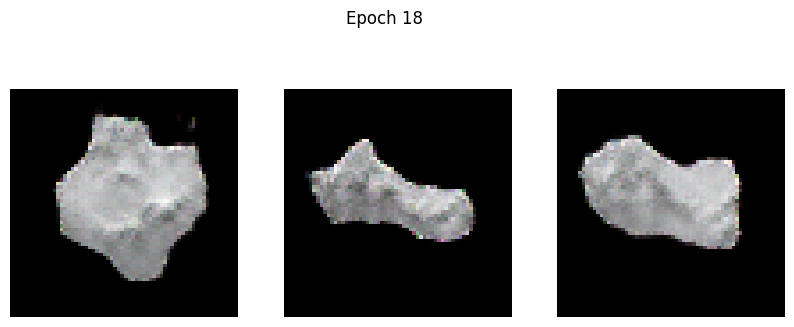

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - d_loss: 0.5729 - g_loss: 0.9355
Epoch 19/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - d_loss: 0.5701 - g_loss: 0.9334

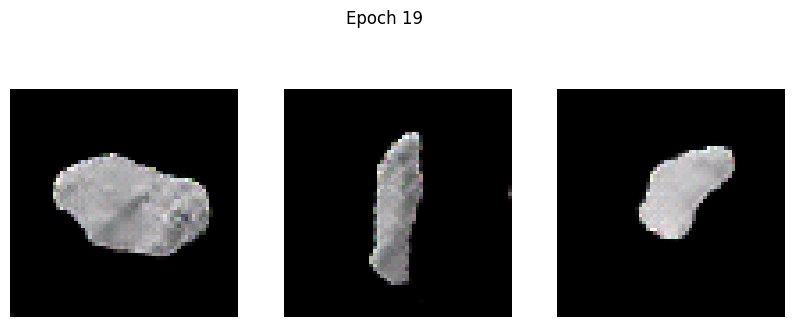

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - d_loss: 0.5701 - g_loss: 0.9336
Epoch 20/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - d_loss: 0.5534 - g_loss: 0.9699

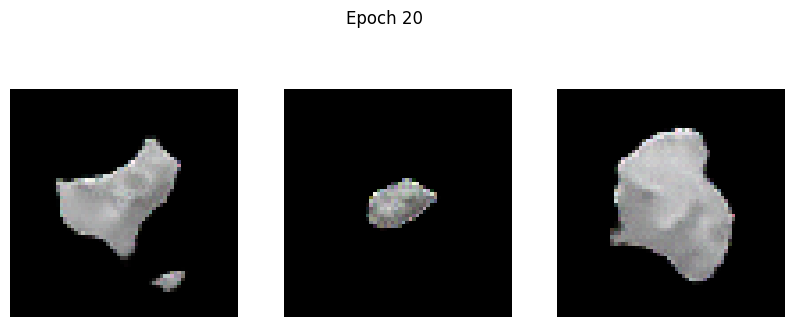

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - d_loss: 0.5535 - g_loss: 0.9700
Epoch 21/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - d_loss: 0.5557 - g_loss: 0.9832

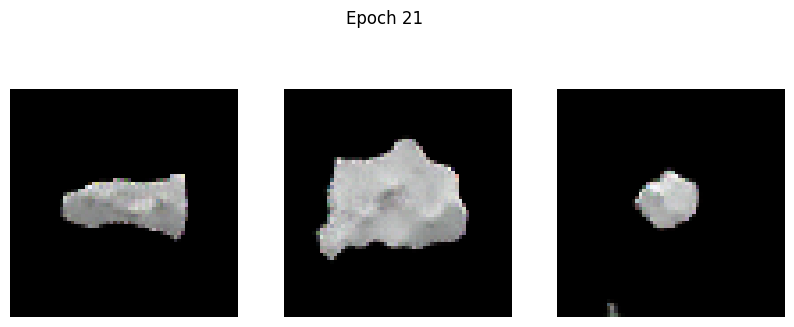

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - d_loss: 0.5558 - g_loss: 0.9836
Epoch 22/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - d_loss: 0.5485 - g_loss: 1.0220

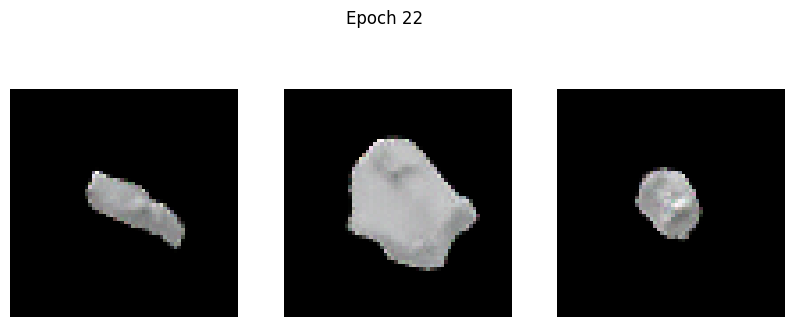

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - d_loss: 0.5484 - g_loss: 1.0219
Epoch 23/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.5327 - g_loss: 1.0237

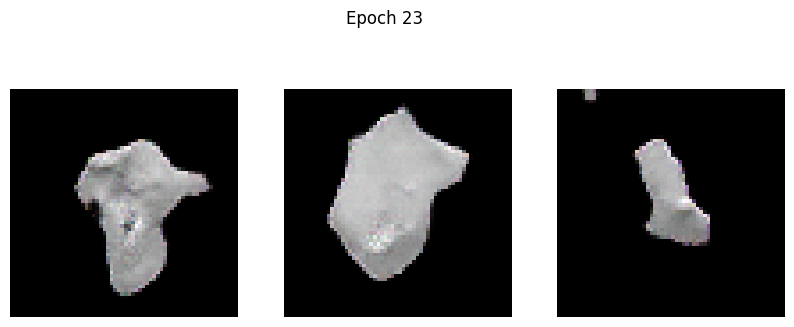

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - d_loss: 0.5326 - g_loss: 1.0238
Epoch 24/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.5260 - g_loss: 1.0793

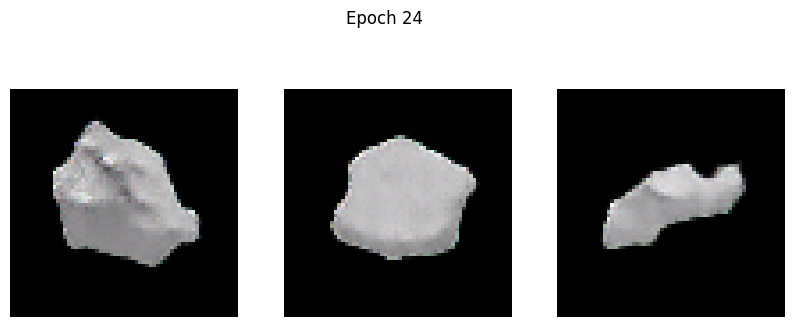

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - d_loss: 0.5260 - g_loss: 1.0794
Epoch 25/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.5020 - g_loss: 1.0784

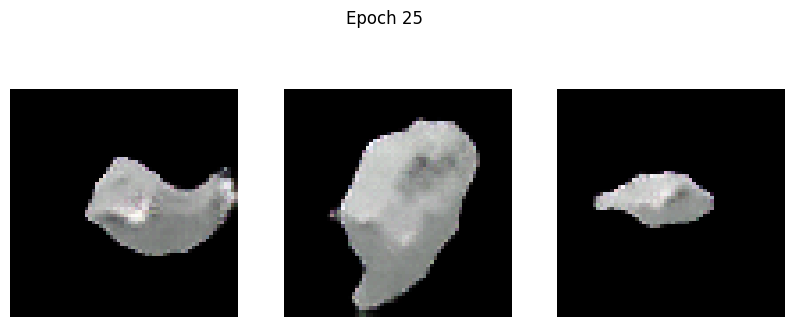

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - d_loss: 0.5020 - g_loss: 1.0788
Epoch 26/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.4933 - g_loss: 1.1377

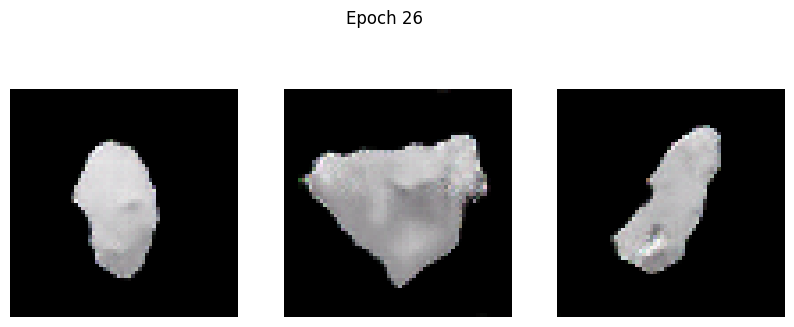

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 0.4933 - g_loss: 1.1378
Epoch 27/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.4808 - g_loss: 1.2107

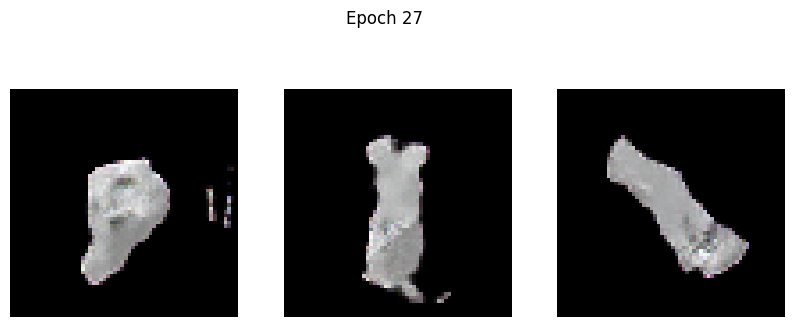

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.4809 - g_loss: 1.2105
Epoch 28/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.4715 - g_loss: 1.2328

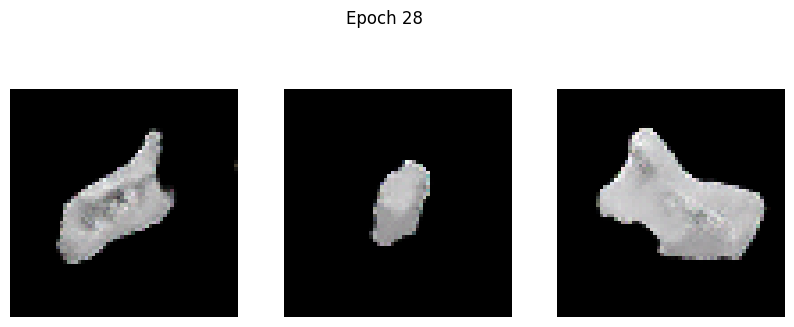

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.4715 - g_loss: 1.2328
Epoch 29/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.4570 - g_loss: 1.3109

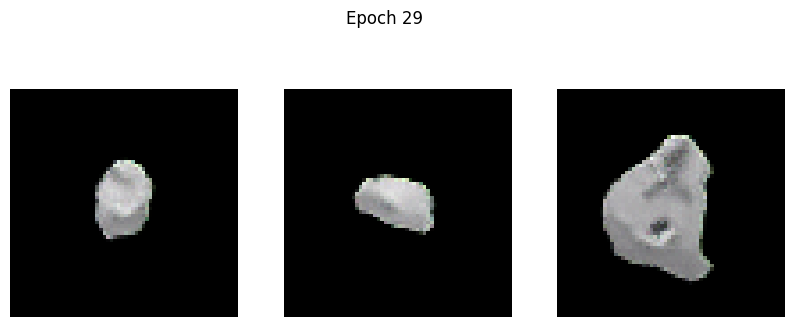

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.4571 - g_loss: 1.3109
Epoch 30/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.4354 - g_loss: 1.3354

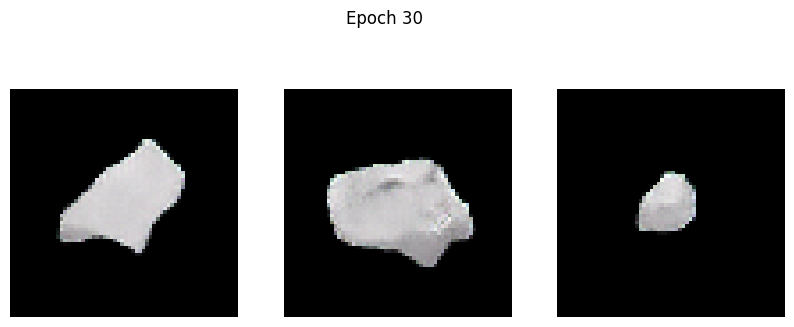

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.4355 - g_loss: 1.3353
Epoch 31/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.4527 - g_loss: 1.3280

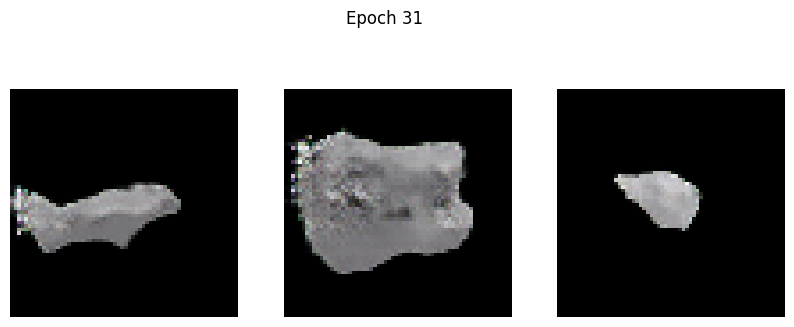

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.4525 - g_loss: 1.3280
Epoch 32/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.4250 - g_loss: 1.4927

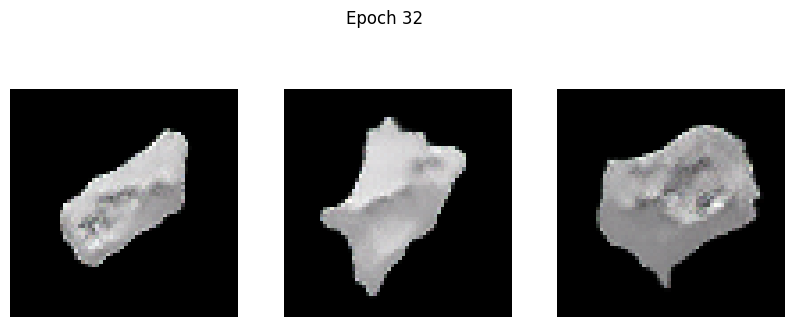

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.4252 - g_loss: 1.4927
Epoch 33/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.3960 - g_loss: 1.4010

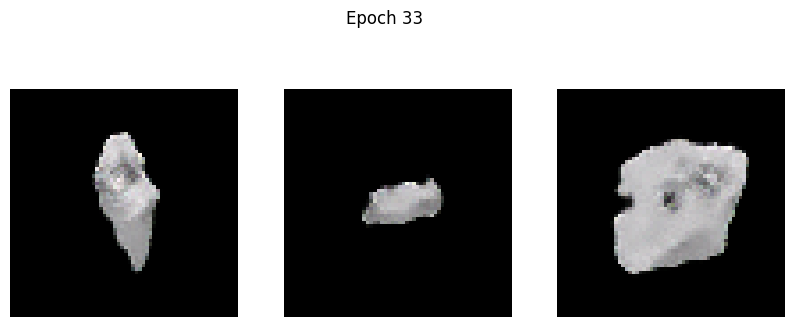

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.3961 - g_loss: 1.4013
Epoch 34/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.4013 - g_loss: 1.4316

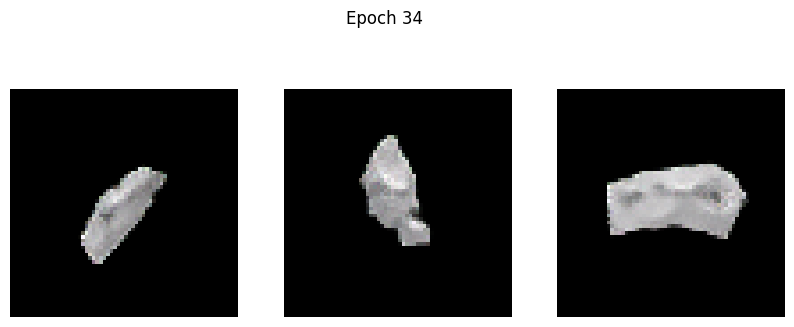

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.4015 - g_loss: 1.4318
Epoch 35/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.3895 - g_loss: 1.4641

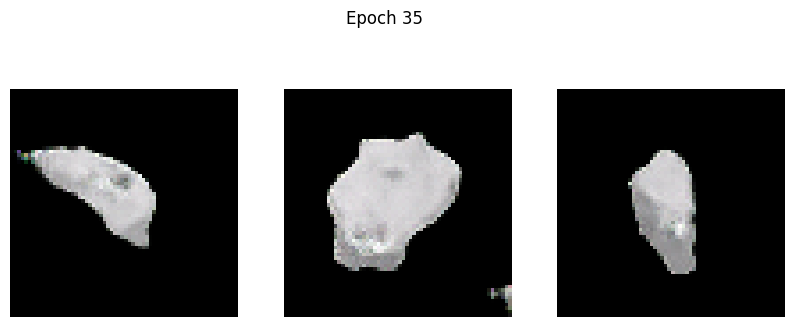

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3895 - g_loss: 1.4643
Epoch 36/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.3944 - g_loss: 1.5711

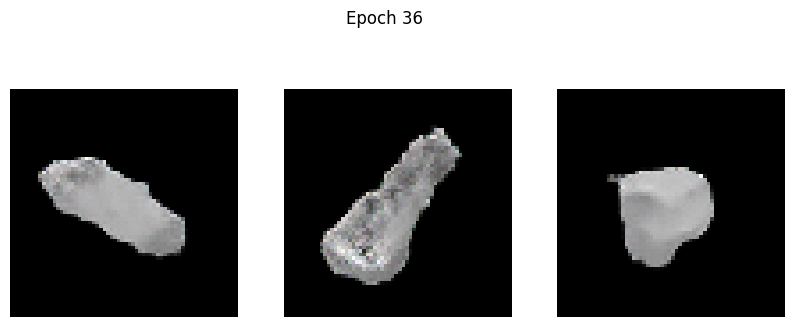

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3942 - g_loss: 1.5710
Epoch 37/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.4251 - g_loss: 1.6237

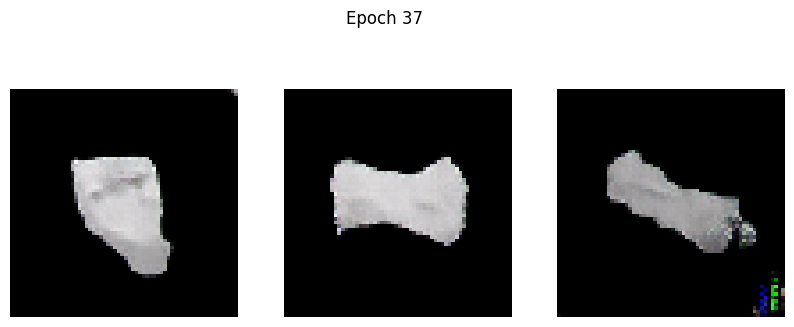

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.4249 - g_loss: 1.6234
Epoch 38/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.3947 - g_loss: 1.5577

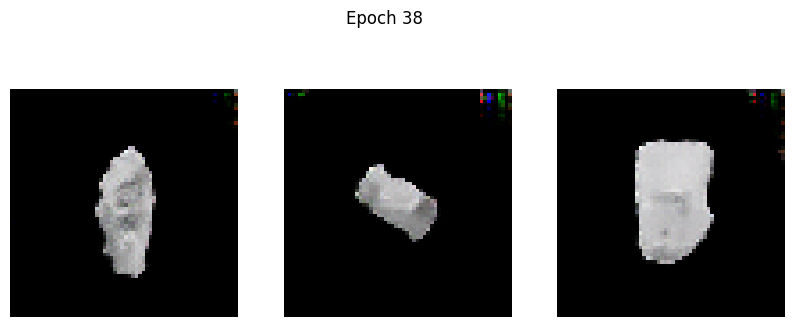

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3946 - g_loss: 1.5575
Epoch 39/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.4317 - g_loss: 1.6004

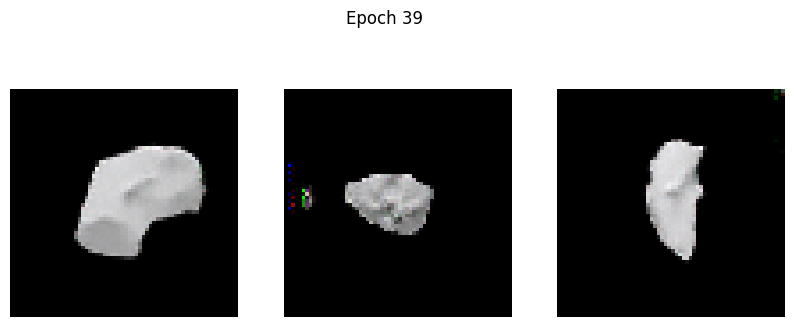

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.4315 - g_loss: 1.6000
Epoch 40/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.3662 - g_loss: 1.5666

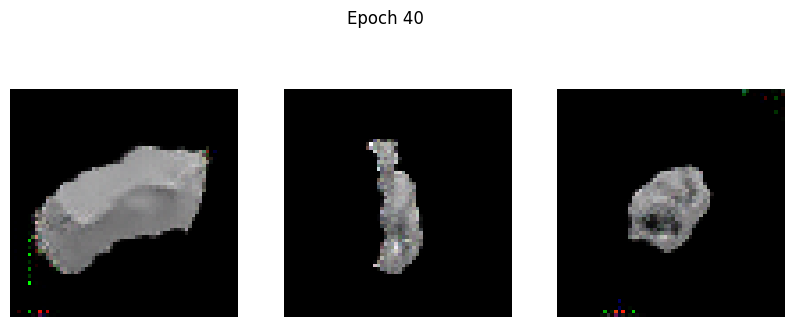

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3663 - g_loss: 1.5669
Epoch 41/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.3795 - g_loss: 1.6303

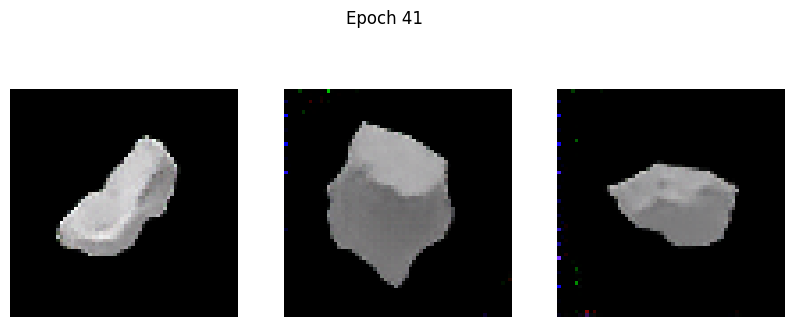

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3797 - g_loss: 1.6303
Epoch 42/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.3396 - g_loss: 1.5792

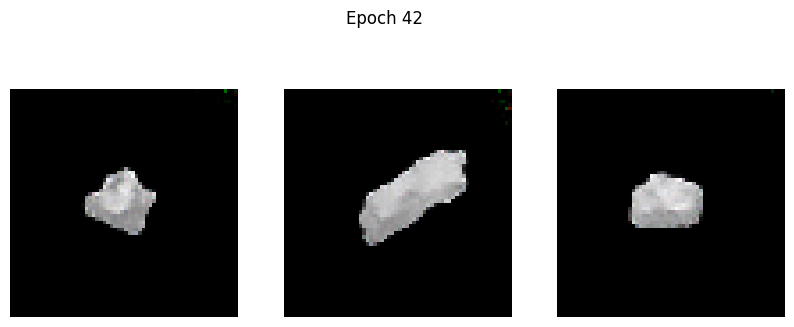

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3398 - g_loss: 1.5795
Epoch 43/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.3743 - g_loss: 1.6708

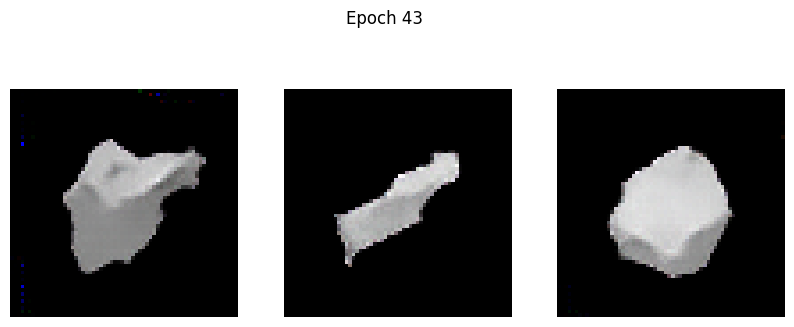

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3741 - g_loss: 1.6705
Epoch 44/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.5095 - g_loss: 1.8952

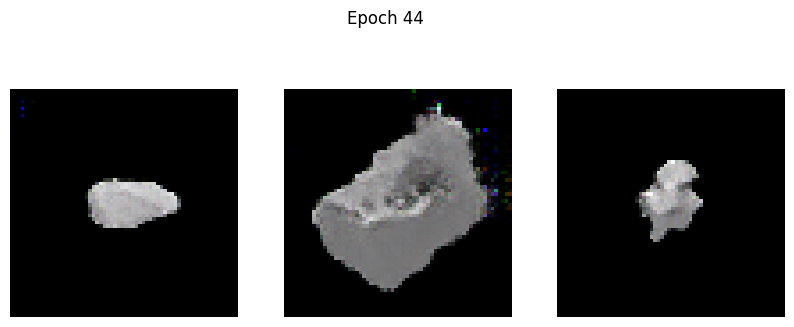

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.5089 - g_loss: 1.8935
Epoch 45/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.3174 - g_loss: 1.5588

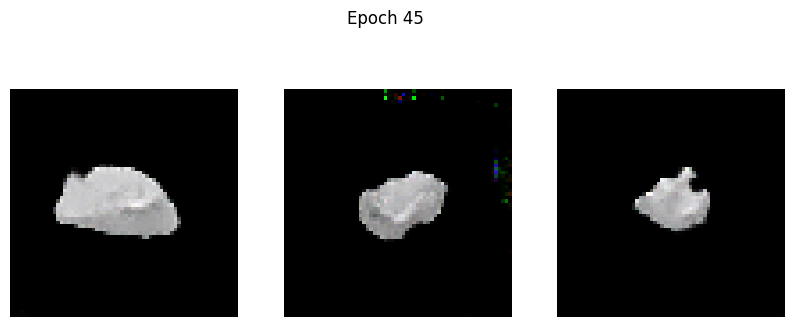

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3175 - g_loss: 1.5590
Epoch 46/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.3432 - g_loss: 1.6830

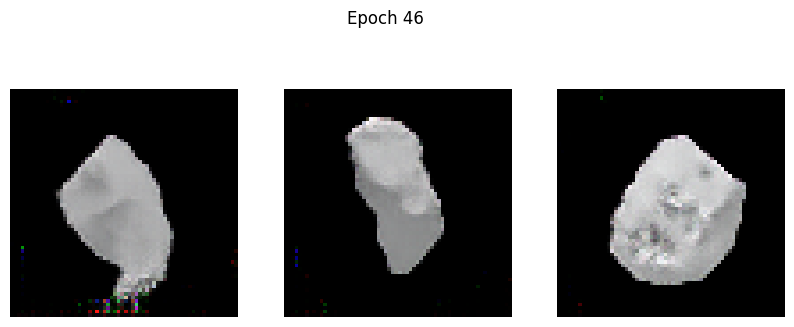

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3432 - g_loss: 1.6832
Epoch 47/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.3435 - g_loss: 1.7191

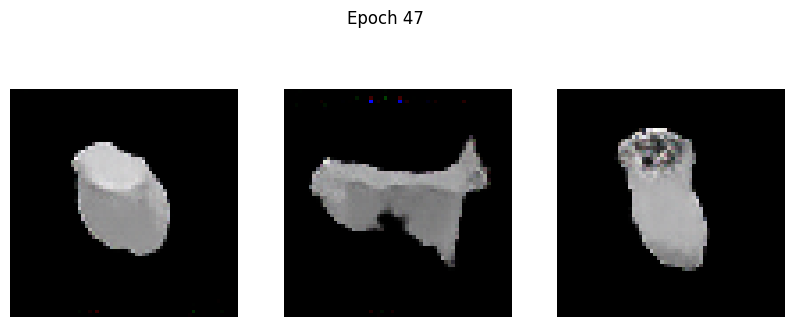

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3437 - g_loss: 1.7195
Epoch 48/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.3259 - g_loss: 1.7290

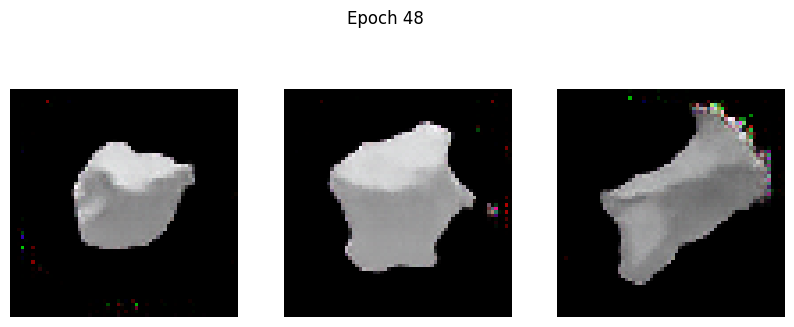

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3260 - g_loss: 1.7289
Epoch 49/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.3227 - g_loss: 1.7477

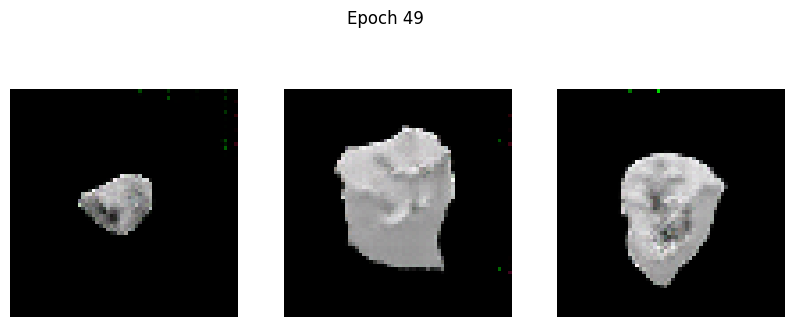

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3232 - g_loss: 1.7489
Epoch 50/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.3138 - g_loss: 1.6916

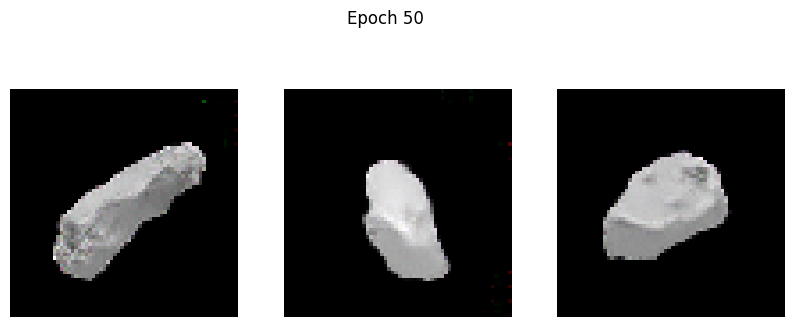

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.3138 - g_loss: 1.6919
Epoch 51/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2947 - g_loss: 1.7663

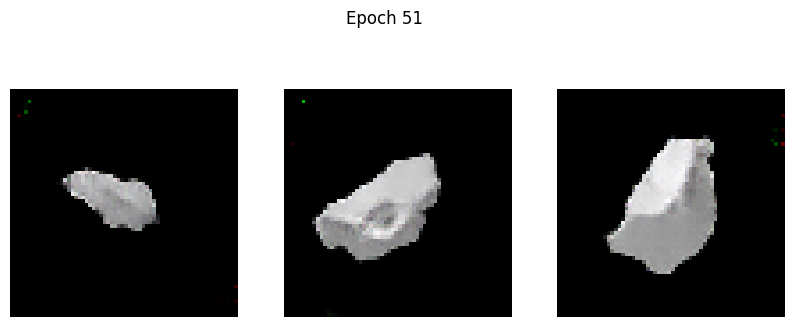

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.2948 - g_loss: 1.7667
Epoch 52/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.3404 - g_loss: 1.9389

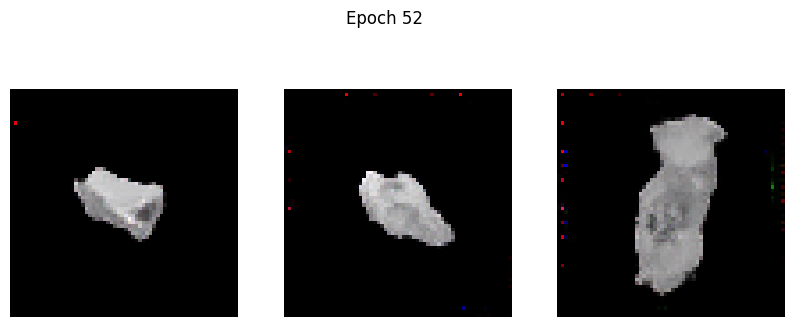

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3405 - g_loss: 1.9384
Epoch 53/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2839 - g_loss: 1.8076

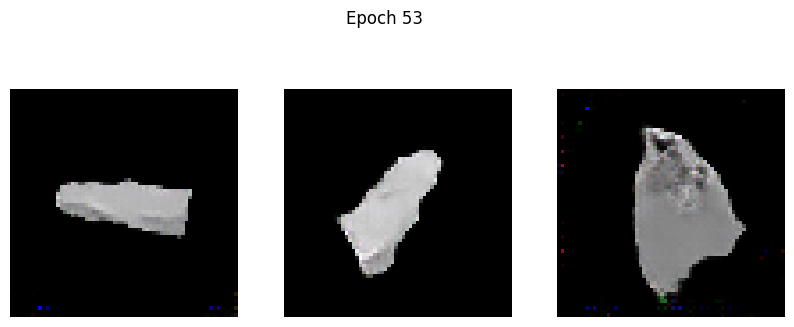

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2839 - g_loss: 1.8080
Epoch 54/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2936 - g_loss: 1.8607

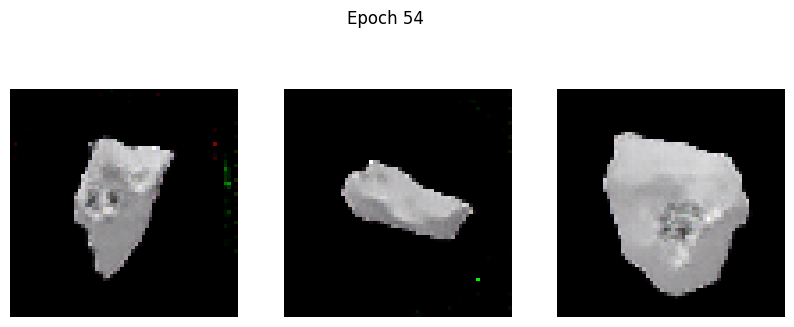

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2937 - g_loss: 1.8607
Epoch 55/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.3335 - g_loss: 1.9849

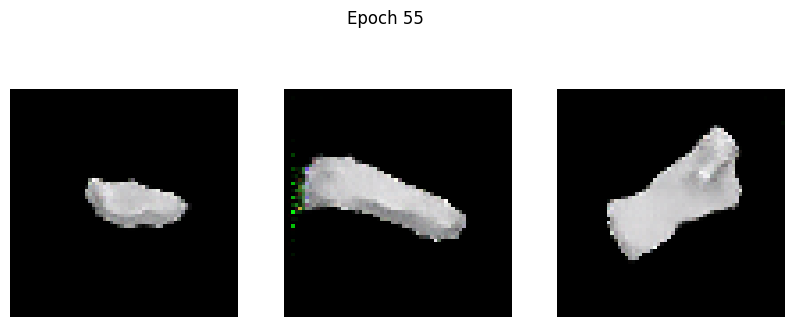

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.3336 - g_loss: 1.9845
Epoch 56/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.2886 - g_loss: 1.8511

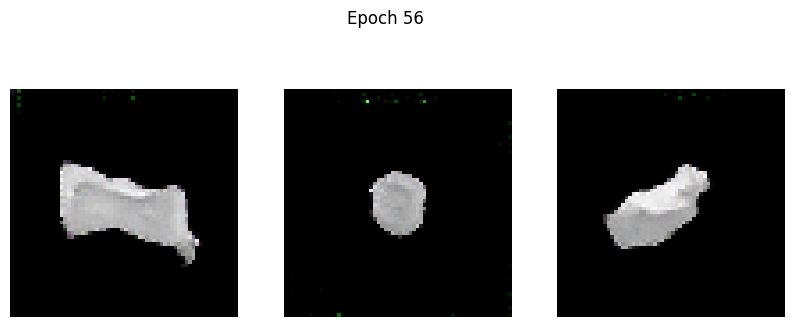

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2887 - g_loss: 1.8509
Epoch 57/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.3088 - g_loss: 1.8998

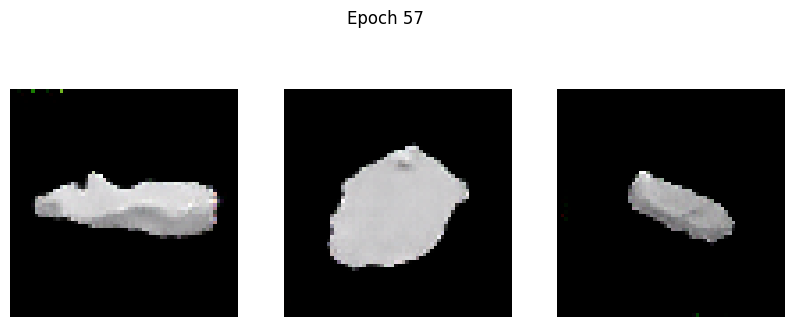

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3088 - g_loss: 1.8999
Epoch 58/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.4323 - g_loss: 1.9759

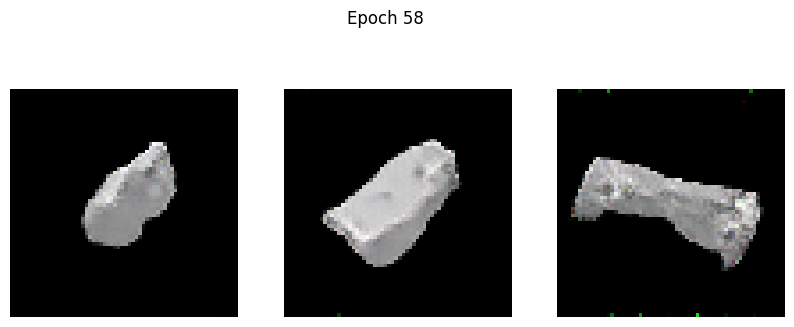

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.4321 - g_loss: 1.9750
Epoch 59/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2576 - g_loss: 1.8214

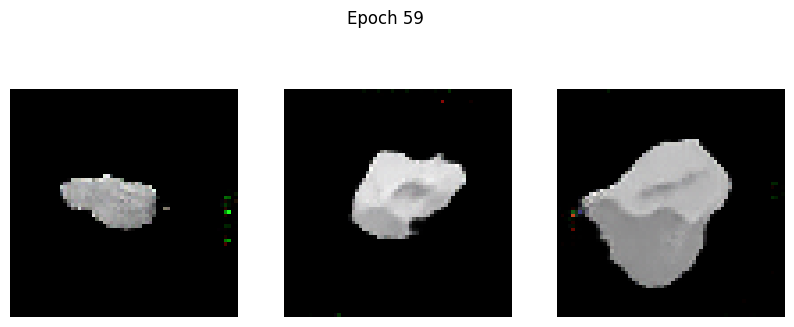

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.2576 - g_loss: 1.8218
Epoch 60/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.2534 - g_loss: 1.8844

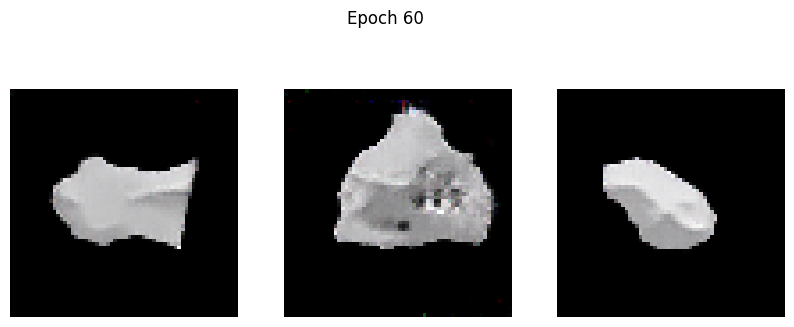

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2534 - g_loss: 1.8847
Epoch 61/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2860 - g_loss: 1.9660

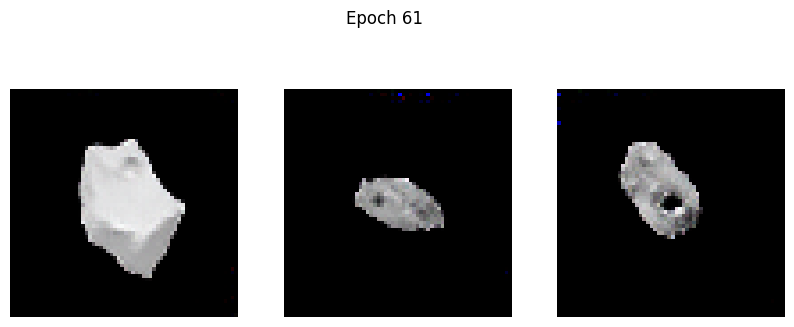

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2858 - g_loss: 1.9660
Epoch 62/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2899 - g_loss: 2.0014

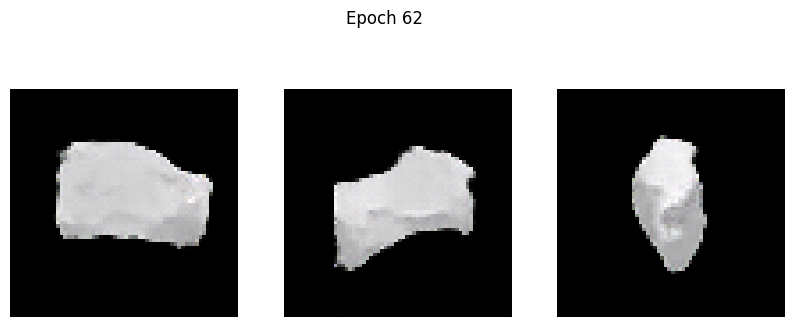

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.2897 - g_loss: 2.0015
Epoch 63/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2688 - g_loss: 2.1346

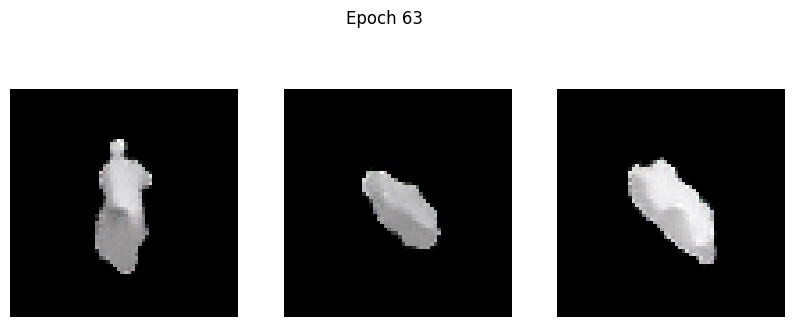

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.2692 - g_loss: 2.1341
Epoch 64/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2448 - g_loss: 1.9307

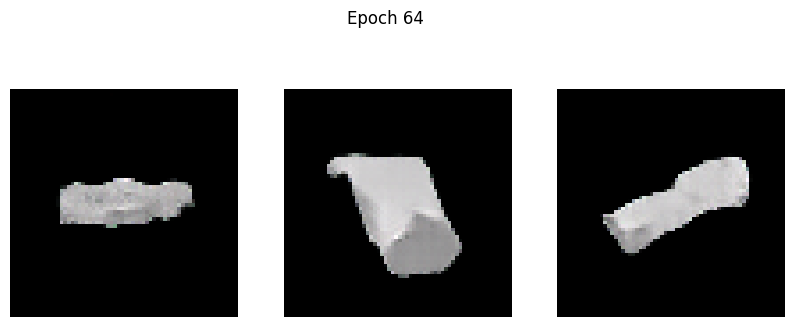

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2448 - g_loss: 1.9310
Epoch 65/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2408 - g_loss: 2.0172

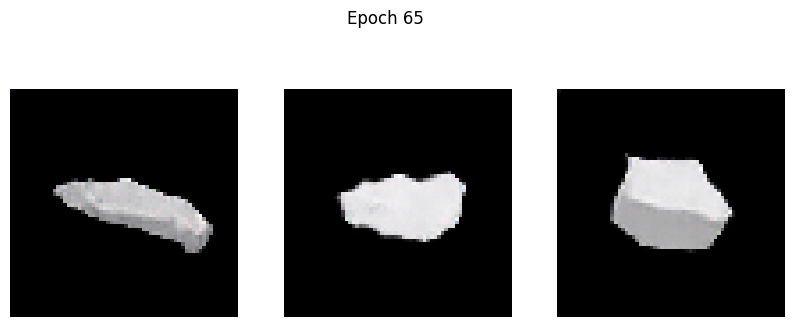

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2408 - g_loss: 2.0172
Epoch 66/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.3333 - g_loss: 2.1714

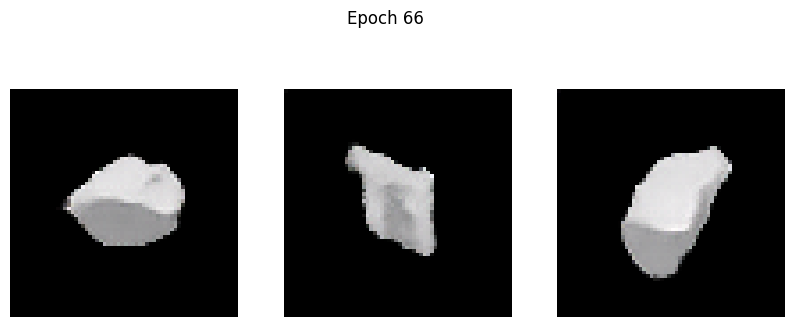

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.3337 - g_loss: 2.1715
Epoch 67/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2292 - g_loss: 2.0050

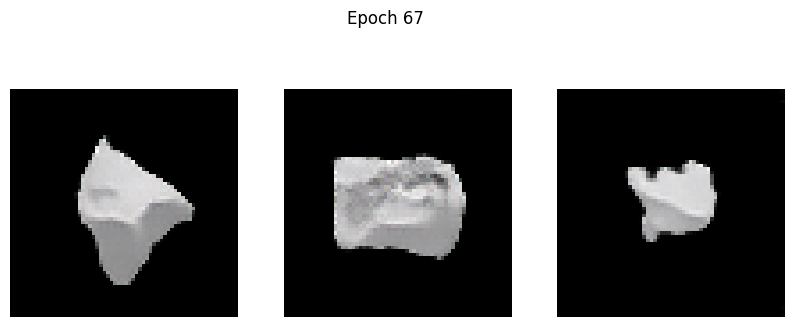

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2291 - g_loss: 2.0049
Epoch 68/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.1942 - g_loss: 2.0681

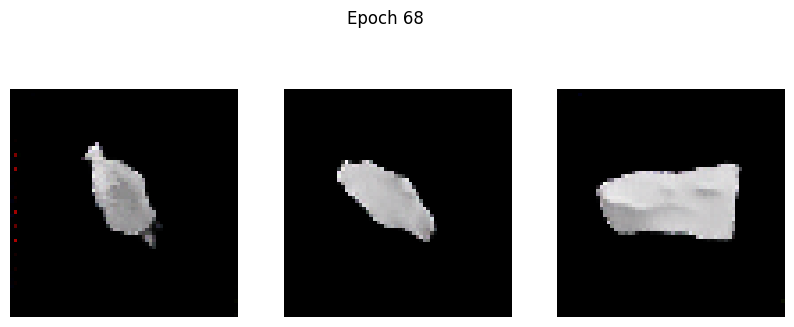

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.1943 - g_loss: 2.0681
Epoch 69/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.2954 - g_loss: 2.1740

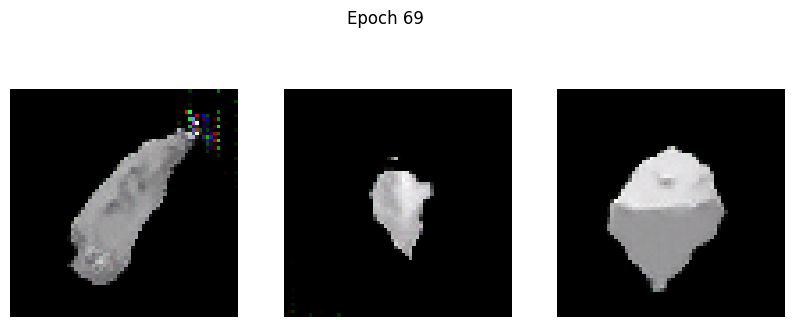

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.2950 - g_loss: 2.1736
Epoch 70/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2611 - g_loss: 2.0977

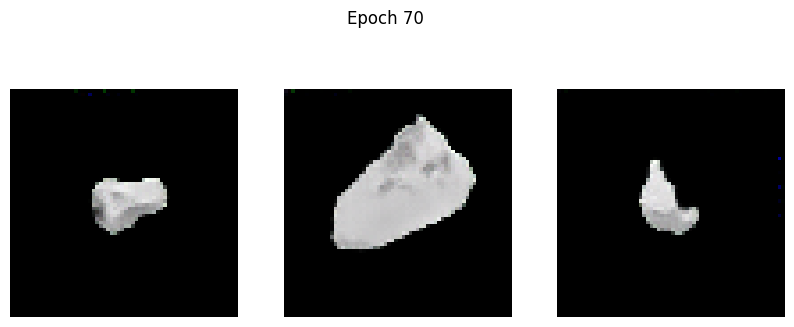

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2610 - g_loss: 2.0979
Epoch 71/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.2686 - g_loss: 2.1606

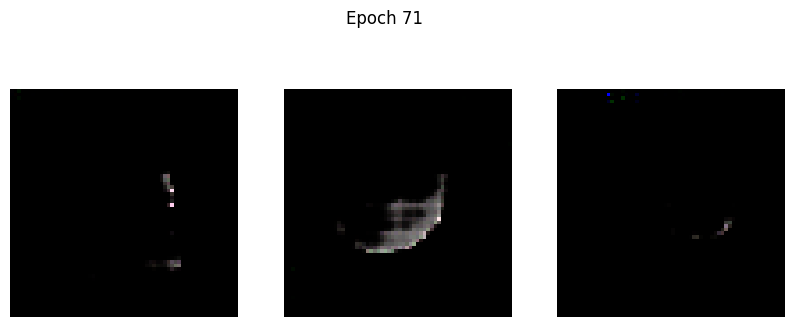

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2759 - g_loss: 2.1656
Epoch 72/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 1.2535 - g_loss: 6.7145

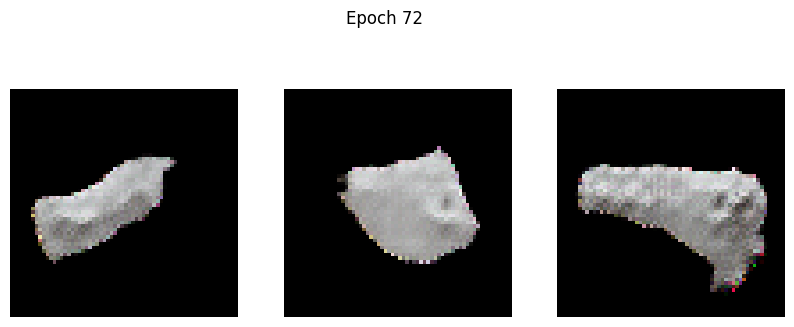

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 1.2498 - g_loss: 6.6781
Epoch 73/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.5040 - g_loss: 1.2680

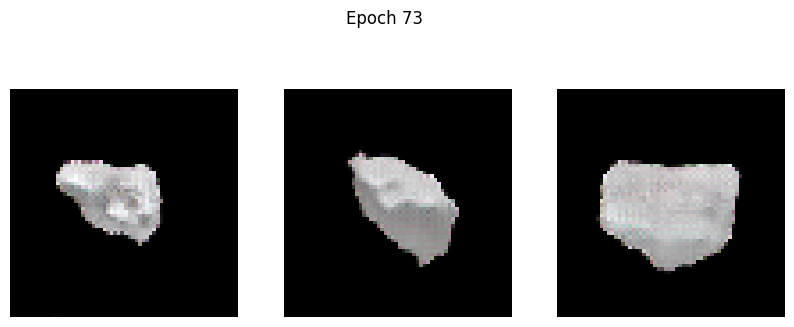

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.5038 - g_loss: 1.2680
Epoch 74/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.4161 - g_loss: 1.2914

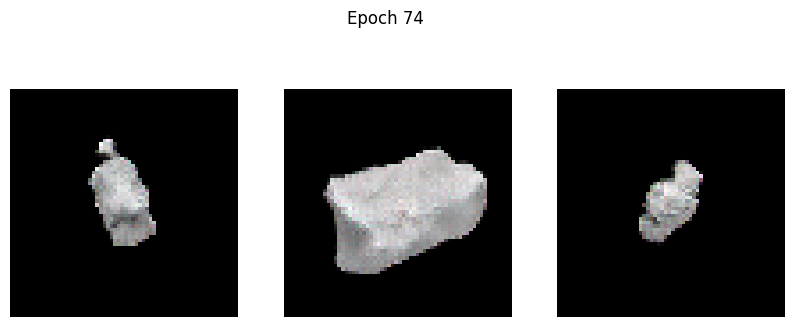

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.4160 - g_loss: 1.2916
Epoch 75/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.3463 - g_loss: 1.4518

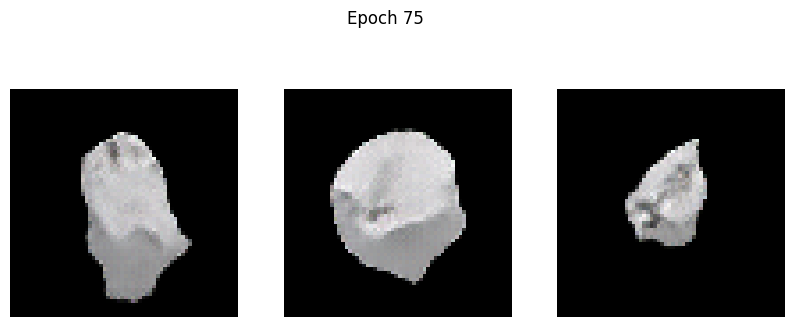

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3461 - g_loss: 1.4522
Epoch 76/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.2800 - g_loss: 1.6184

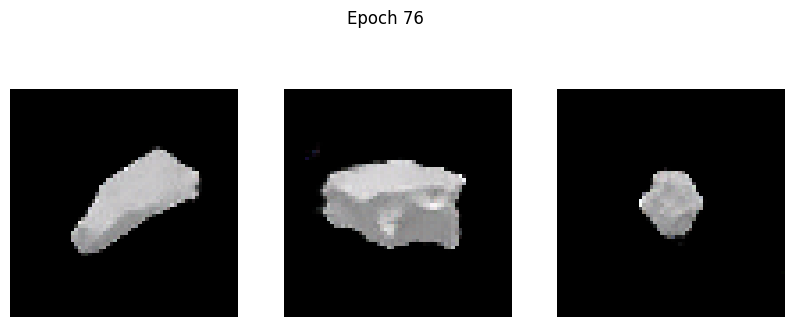

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2801 - g_loss: 1.6184
Epoch 77/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2577 - g_loss: 1.6671

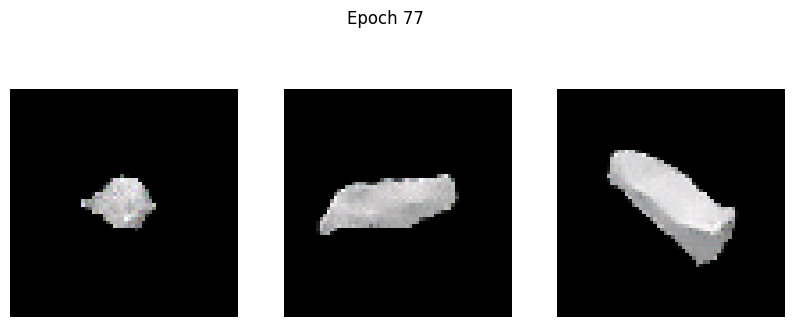

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2576 - g_loss: 1.6673
Epoch 78/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2407 - g_loss: 1.7578

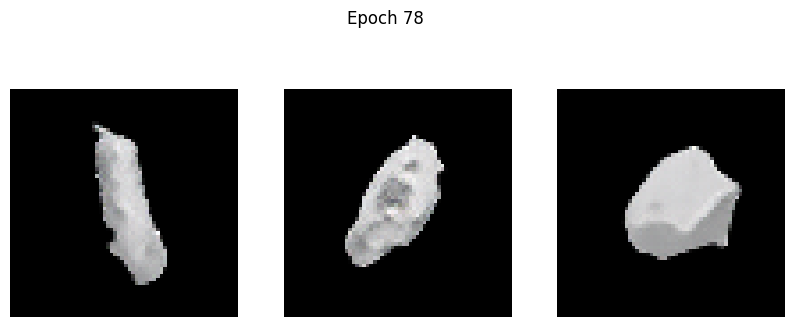

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2406 - g_loss: 1.7581
Epoch 79/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.2088 - g_loss: 1.8824

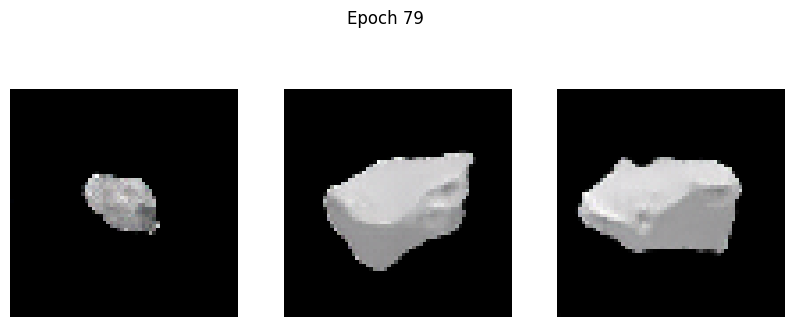

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.2088 - g_loss: 1.8821
Epoch 80/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.2246 - g_loss: 1.9415

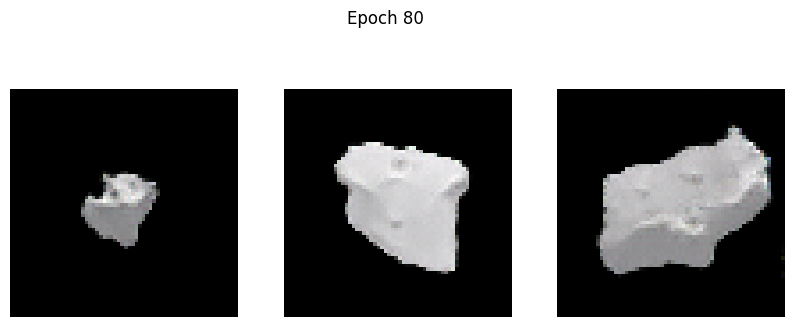

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2246 - g_loss: 1.9415
Epoch 81/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.2001 - g_loss: 2.0372

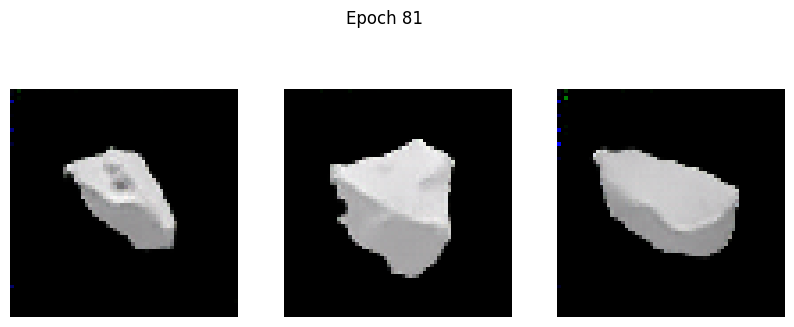

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2002 - g_loss: 2.0369
Epoch 82/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.2320 - g_loss: 2.0175

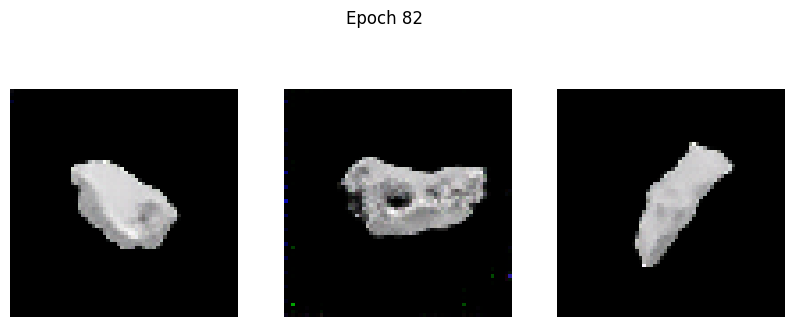

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2319 - g_loss: 2.0179
Epoch 83/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.1716 - g_loss: 2.0578

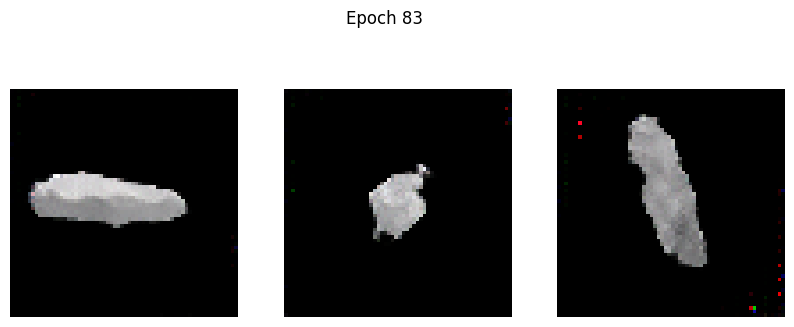

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1718 - g_loss: 2.0581
Epoch 84/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.1769 - g_loss: 2.1242

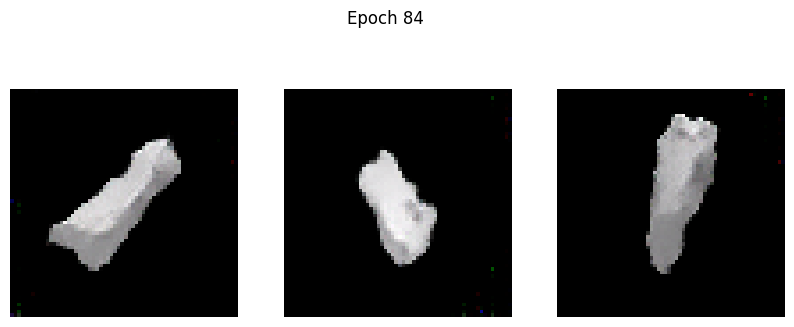

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1770 - g_loss: 2.1240
Epoch 85/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.1794 - g_loss: 2.1241

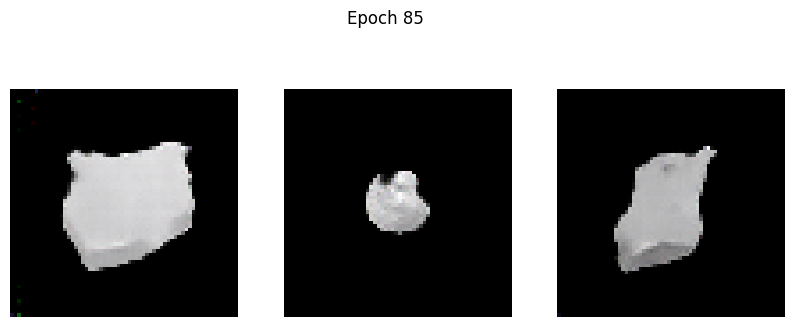

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1798 - g_loss: 2.1244
Epoch 86/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.1758 - g_loss: 2.1527

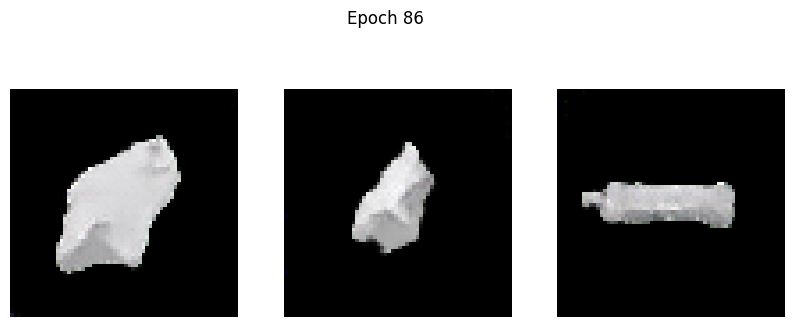

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1758 - g_loss: 2.1523
Epoch 87/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.1763 - g_loss: 2.2082

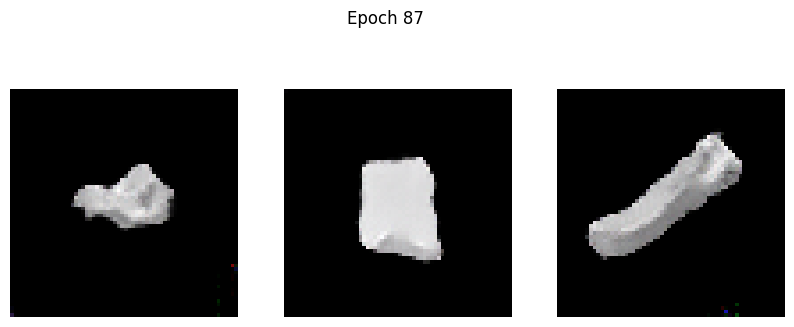

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1763 - g_loss: 2.2084
Epoch 88/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.1572 - g_loss: 2.2819

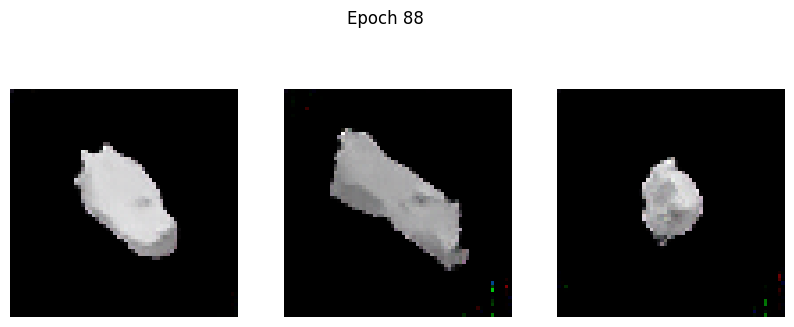

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1573 - g_loss: 2.2817
Epoch 89/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2004 - g_loss: 2.2455

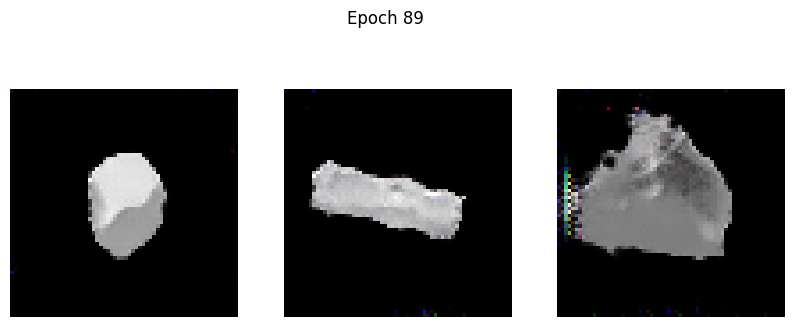

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2002 - g_loss: 2.2455
Epoch 90/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.1925 - g_loss: 2.2503

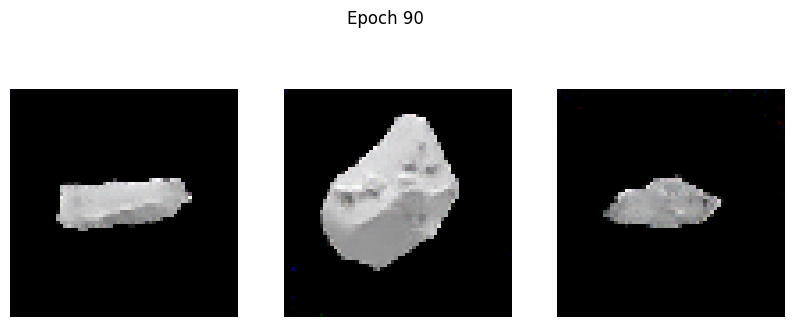

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1921 - g_loss: 2.2502
Epoch 91/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2018 - g_loss: 2.3624

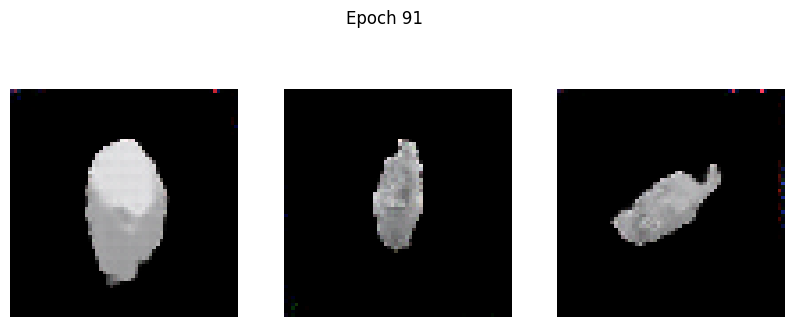

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.2014 - g_loss: 2.3619
Epoch 92/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.1492 - g_loss: 2.3406

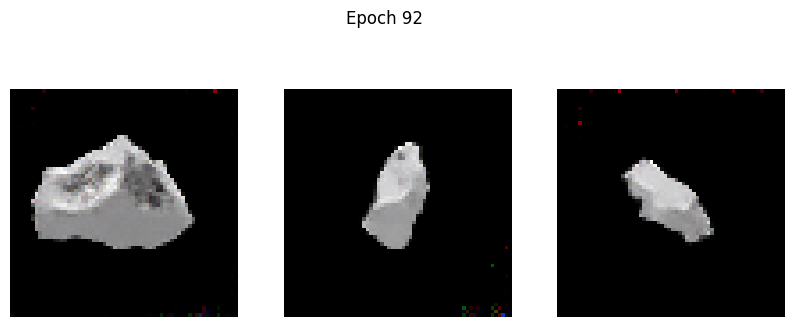

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.1492 - g_loss: 2.3403
Epoch 93/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.2003 - g_loss: 2.4633

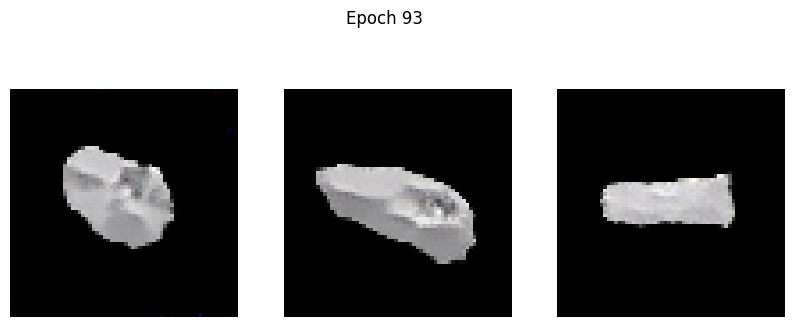

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.2003 - g_loss: 2.4626
Epoch 94/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.0906 - g_loss: 2.3053

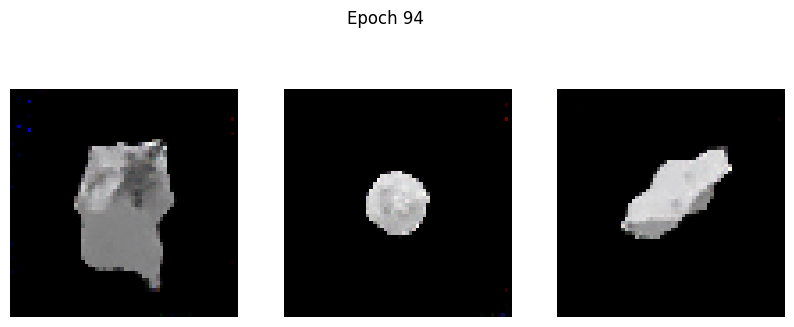

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 0.0906 - g_loss: 2.3054
Epoch 95/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.0970 - g_loss: 2.3895

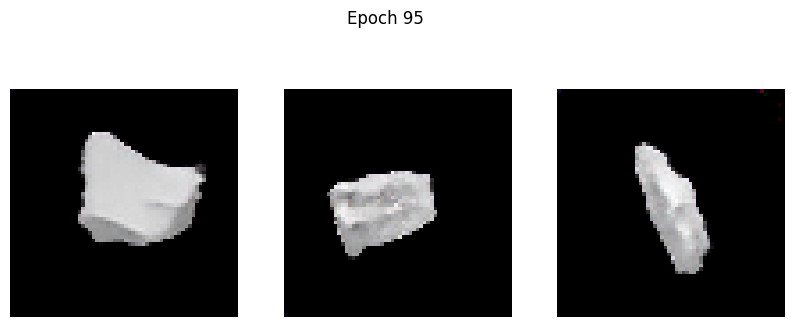

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.0969 - g_loss: 2.3895
Epoch 96/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.1648 - g_loss: 2.5296

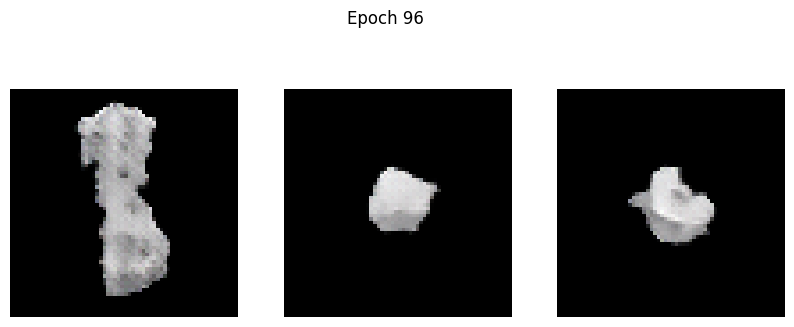

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1666 - g_loss: 2.5325
Epoch 97/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.1451 - g_loss: 2.3626

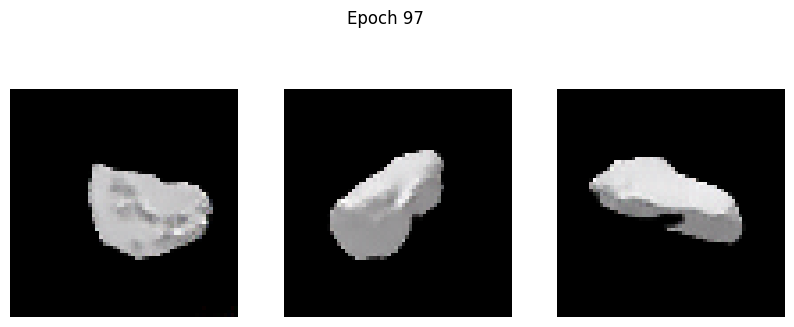

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1450 - g_loss: 2.3620
Epoch 98/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.0304 - g_loss: 2.3017

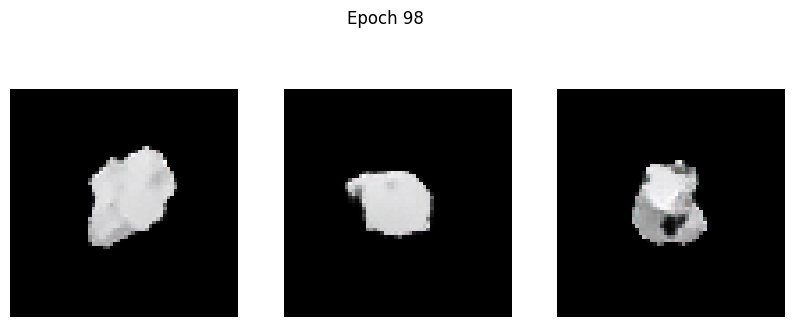

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.0307 - g_loss: 2.3017
Epoch 99/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.0402 - g_loss: 2.4379

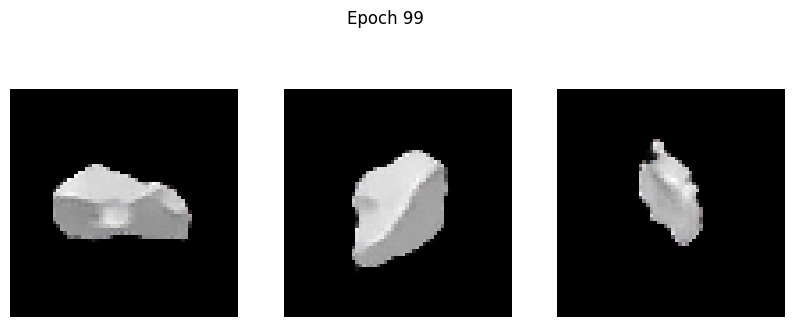

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.0404 - g_loss: 2.4376
Epoch 100/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.1327 - g_loss: 2.6303

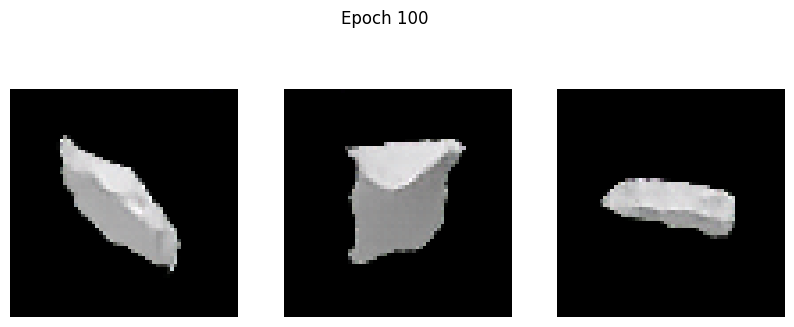

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1325 - g_loss: 2.6291
Epoch 101/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.1375 - g_loss: 2.5177

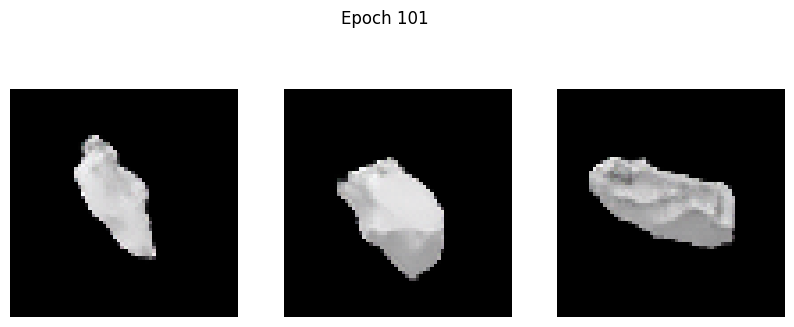

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1373 - g_loss: 2.5173
Epoch 102/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.0303 - g_loss: 2.4316

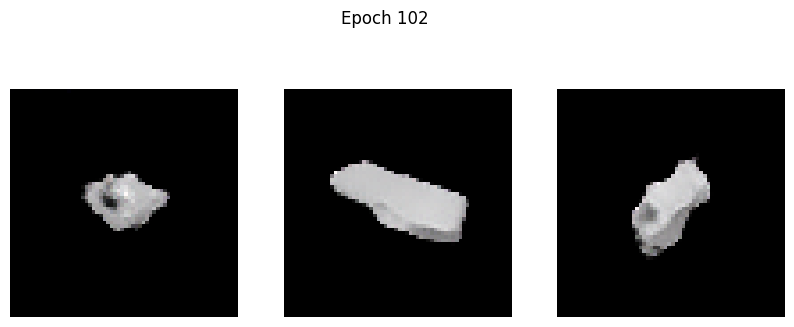

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.0300 - g_loss: 2.4317
Epoch 103/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.1097 - g_loss: 2.5896

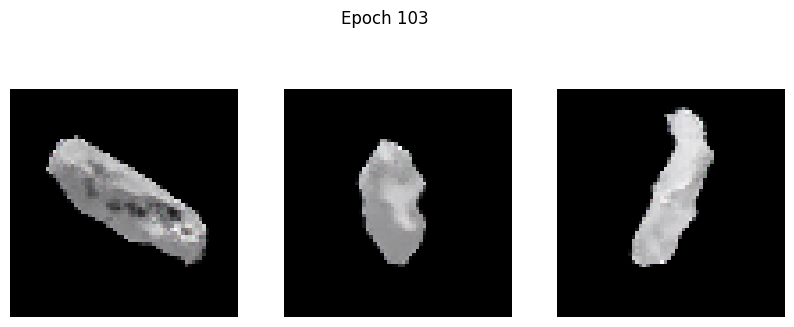

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1107 - g_loss: 2.5903
Epoch 104/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.0112 - g_loss: 2.4562

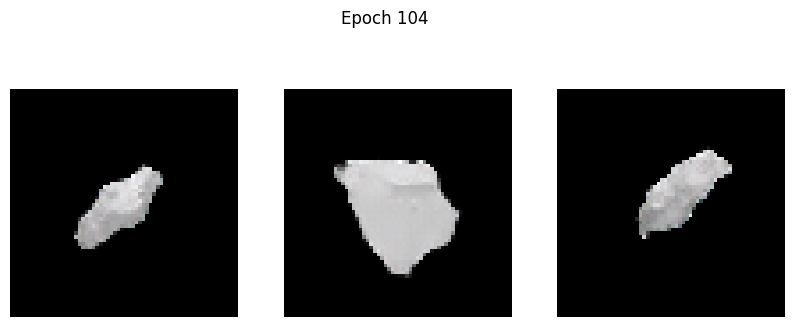

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -0.0112 - g_loss: 2.4564
Epoch 105/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.7296 - g_loss: 3.8427

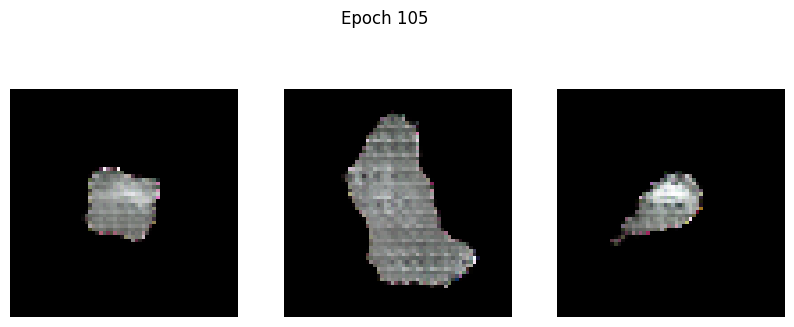

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.7474 - g_loss: 3.8739
Epoch 106/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.8388 - g_loss: 2.3180

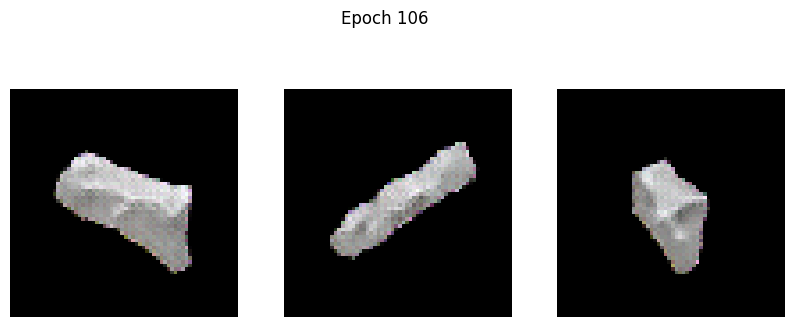

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.8371 - g_loss: 2.3138
Epoch 107/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.3823 - g_loss: 1.5412

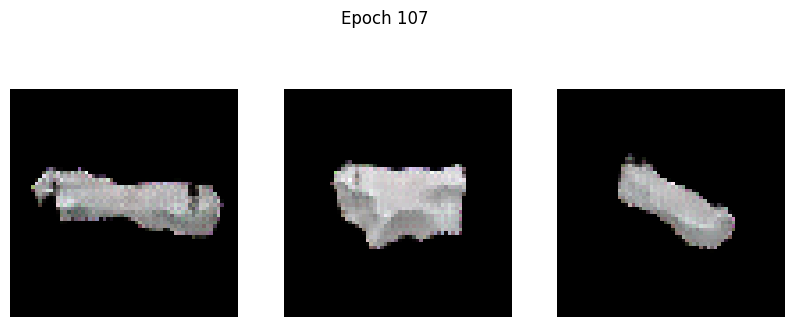

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3818 - g_loss: 1.5412
Epoch 108/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.2626 - g_loss: 1.5989

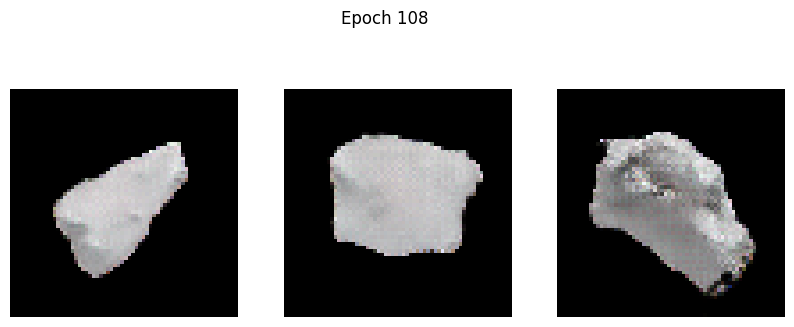

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.2623 - g_loss: 1.5990
Epoch 109/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.1714 - g_loss: 1.6638

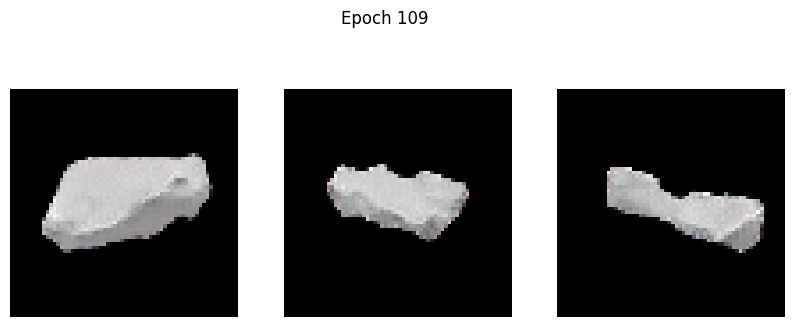

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1714 - g_loss: 1.6644
Epoch 110/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.1036 - g_loss: 1.8301

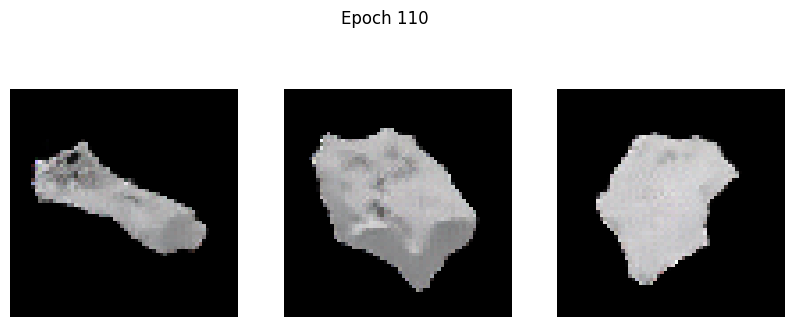

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1034 - g_loss: 1.8303
Epoch 111/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.0248 - g_loss: 1.9513

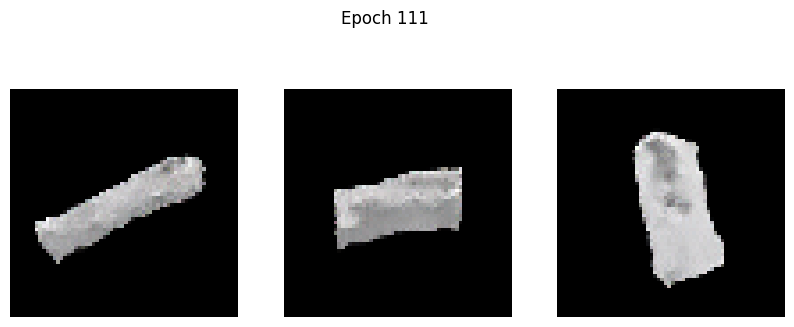

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.0251 - g_loss: 1.9514
Epoch 112/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.0356 - g_loss: 2.0268

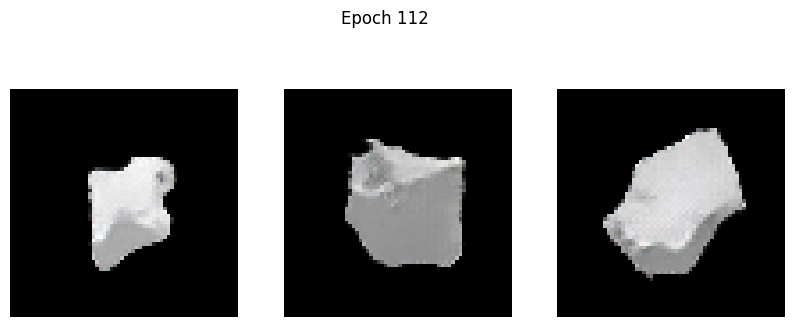

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.0351 - g_loss: 2.0269
Epoch 113/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.0022 - g_loss: 2.0789

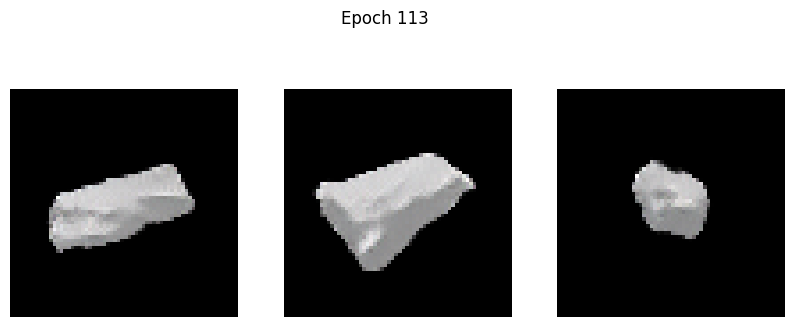

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.0022 - g_loss: 2.0790
Epoch 114/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.0460 - g_loss: 2.1073

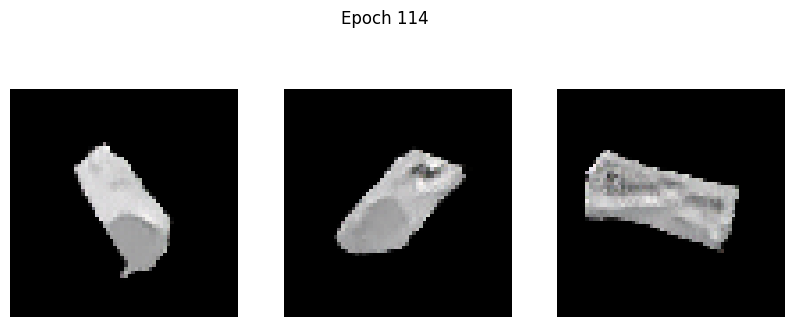

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.0456 - g_loss: 2.1077
Epoch 115/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.0420 - g_loss: 2.2354

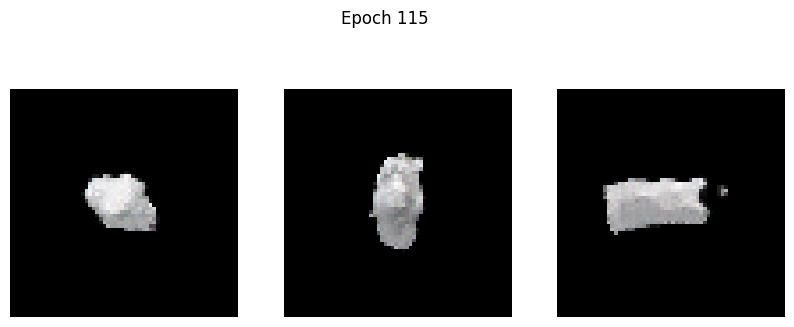

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.0418 - g_loss: 2.2359
Epoch 116/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.0286 - g_loss: 2.3836

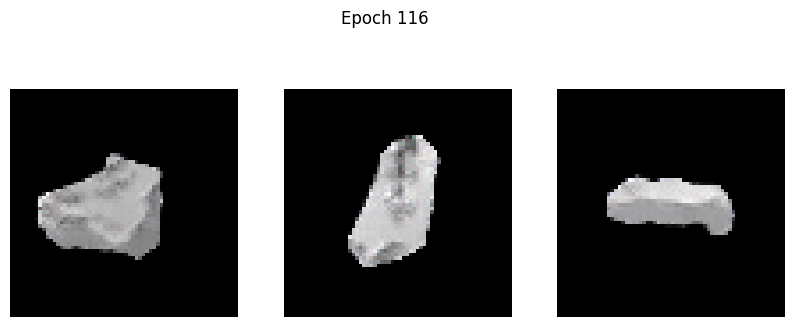

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.0282 - g_loss: 2.3830
Epoch 117/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.0492 - g_loss: 2.3645

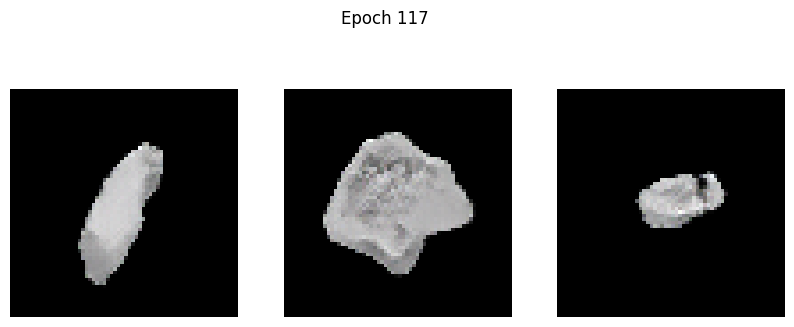

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.0489 - g_loss: 2.3648
Epoch 118/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.2479 - g_loss: 2.3867

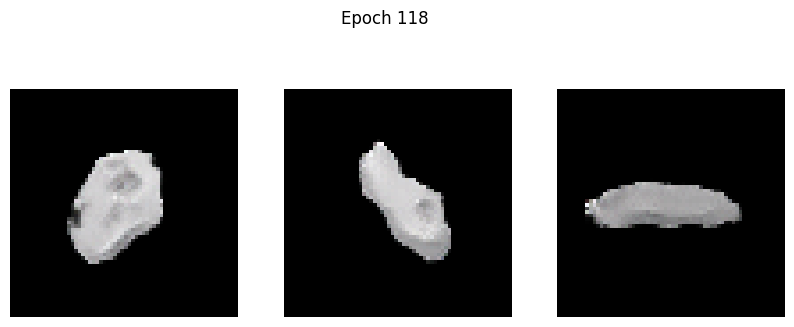

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.2465 - g_loss: 2.3867
Epoch 119/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.0525 - g_loss: 2.5495

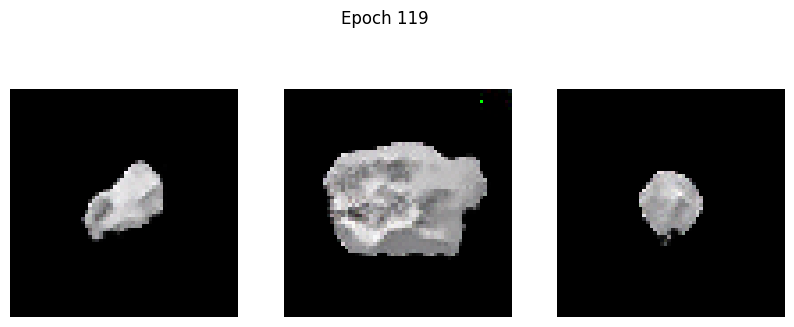

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.0530 - g_loss: 2.5495
Epoch 120/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.3884 - g_loss: 2.7057

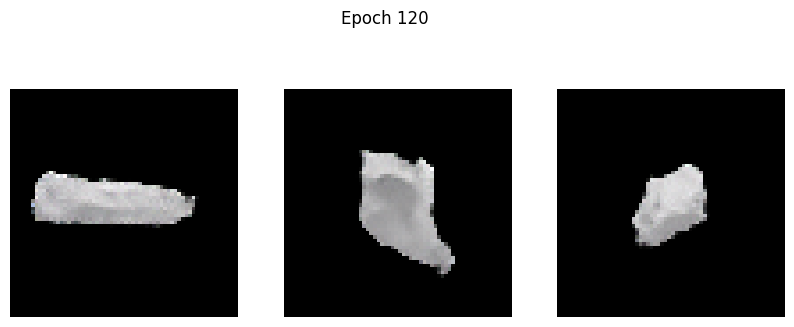

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.3874 - g_loss: 2.7052
Epoch 121/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.1155 - g_loss: 2.4074

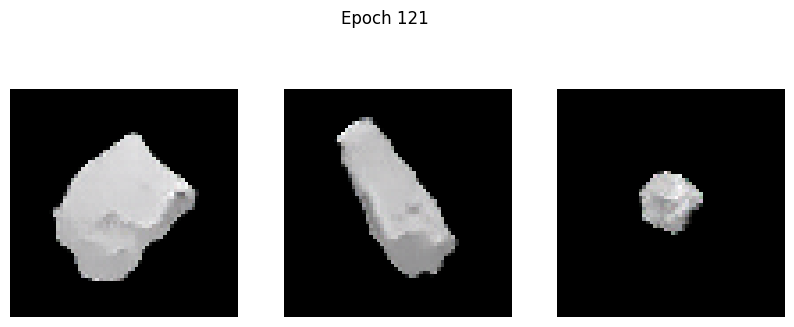

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.1153 - g_loss: 2.4078
Epoch 122/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.1201 - g_loss: 2.4477

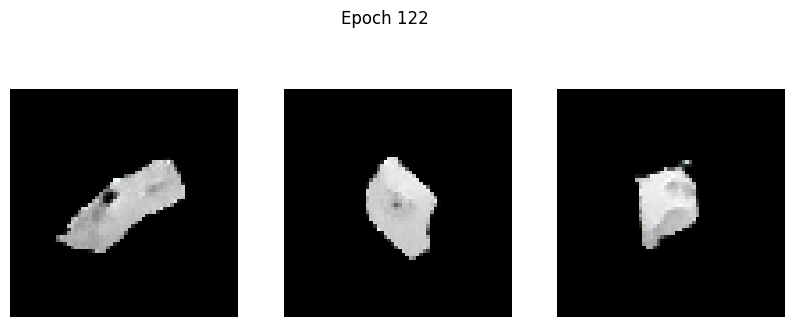

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.1201 - g_loss: 2.4479
Epoch 123/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -0.0462 - g_loss: 2.6957

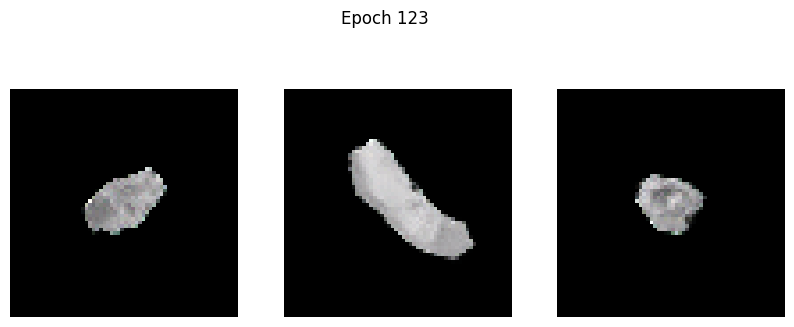

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -0.0465 - g_loss: 2.6954
Epoch 124/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.0034 - g_loss: 2.5968

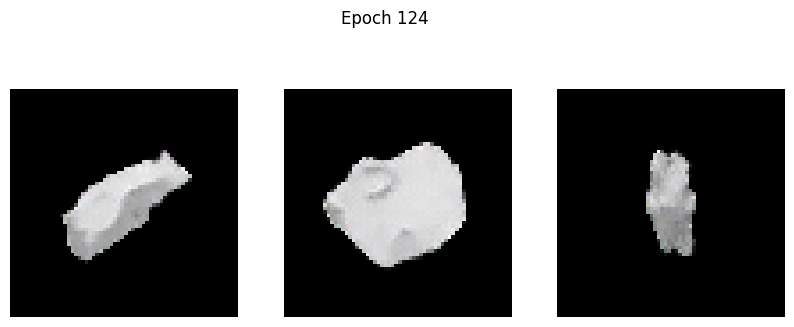

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.0040 - g_loss: 2.5968
Epoch 125/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.1271 - g_loss: 2.7304

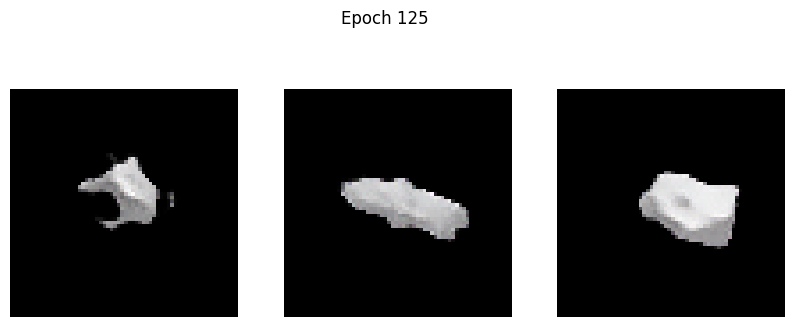

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.1266 - g_loss: 2.7296
Epoch 126/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.1251 - g_loss: 2.8210

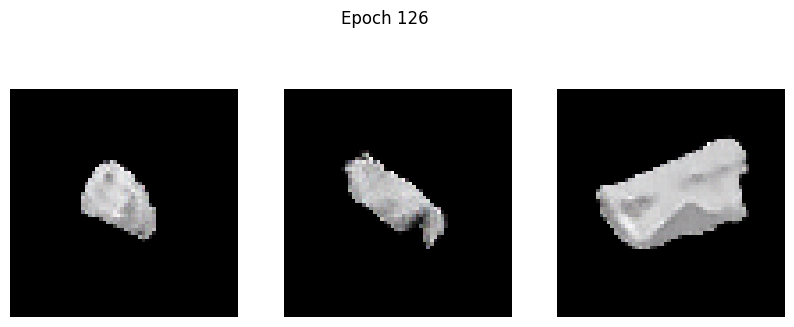

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1255 - g_loss: 2.8220
Epoch 127/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.1043 - g_loss: 2.6210

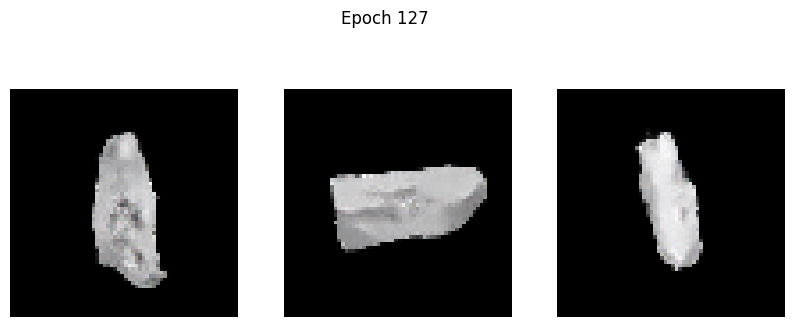

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.1046 - g_loss: 2.6209
Epoch 128/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.2044 - g_loss: 2.6259

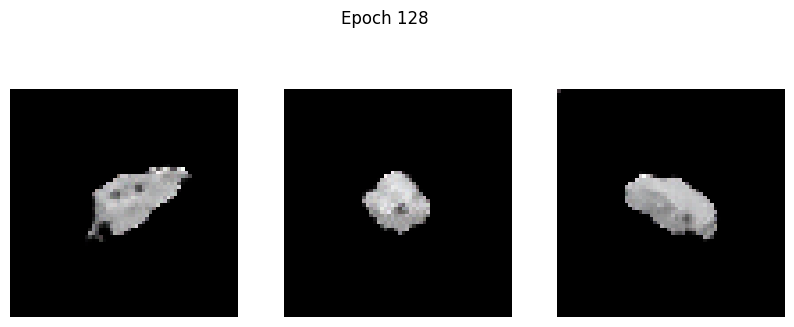

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.2040 - g_loss: 2.6261
Epoch 129/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.3137 - g_loss: 2.6606

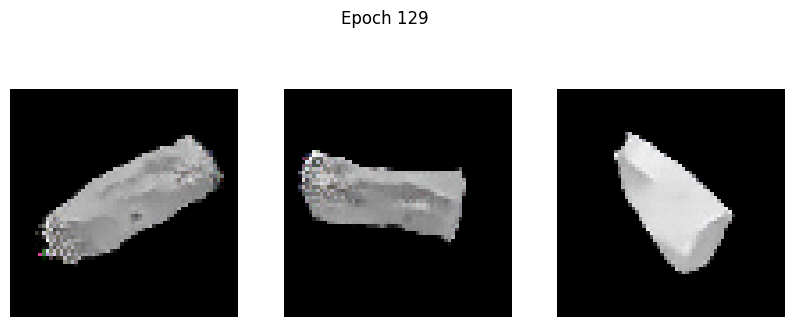

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.3127 - g_loss: 2.6608
Epoch 130/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.2211 - g_loss: 2.7933

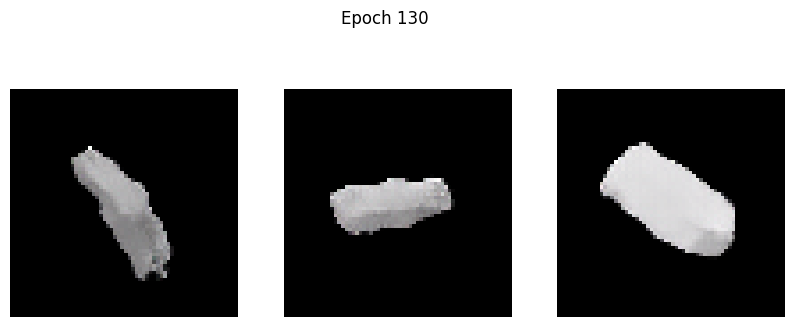

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.2207 - g_loss: 2.7936
Epoch 131/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.0909 - g_loss: 2.8670

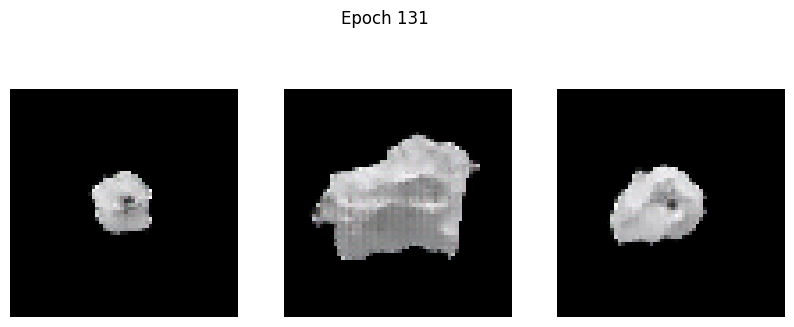

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.0851 - g_loss: 2.8710
Epoch 132/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.0713 - g_loss: 2.7125

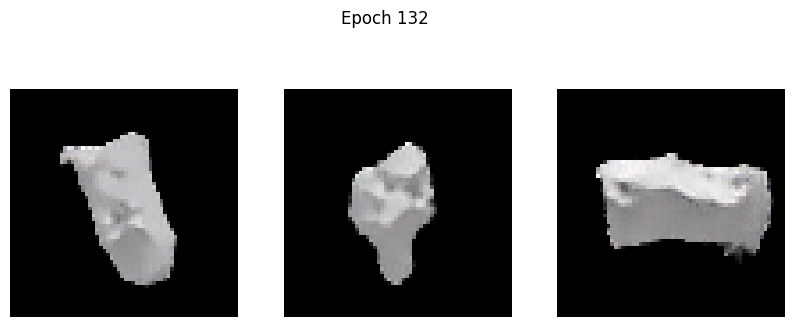

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.0698 - g_loss: 2.7106
Epoch 133/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.1805 - g_loss: 2.5742

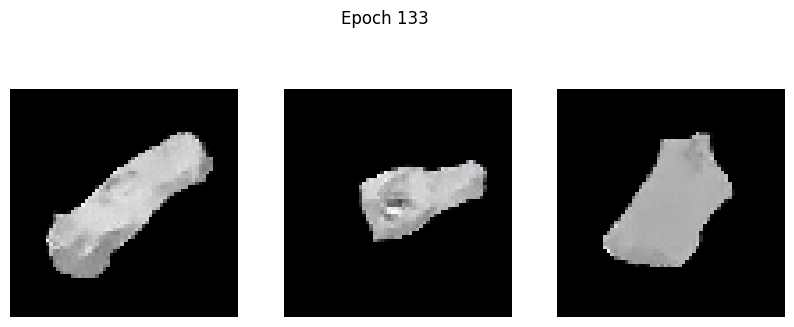

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.1814 - g_loss: 2.5737
Epoch 134/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.2365 - g_loss: 2.6080

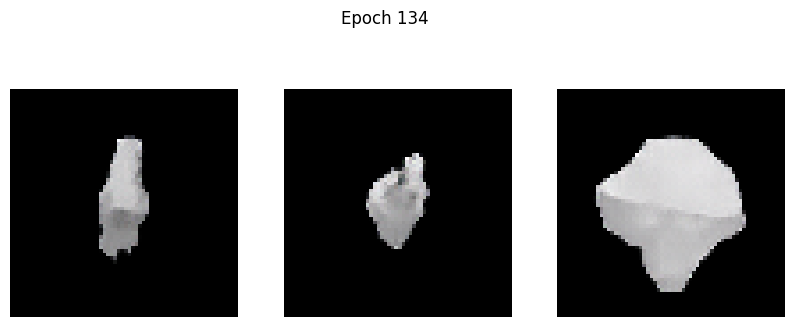

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.2368 - g_loss: 2.6083
Epoch 135/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.4054 - g_loss: 2.7148

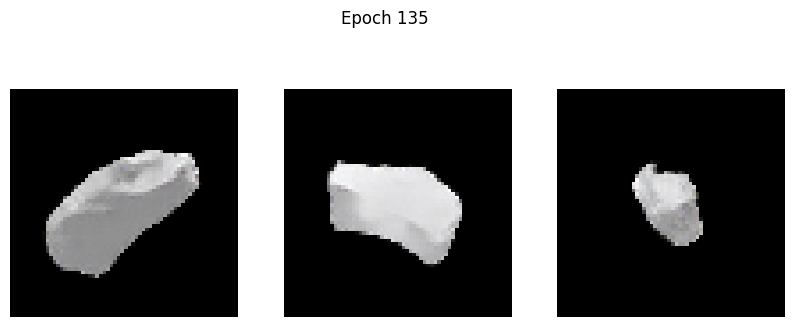

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.4048 - g_loss: 2.7142
Epoch 136/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.0848 - g_loss: 2.8738

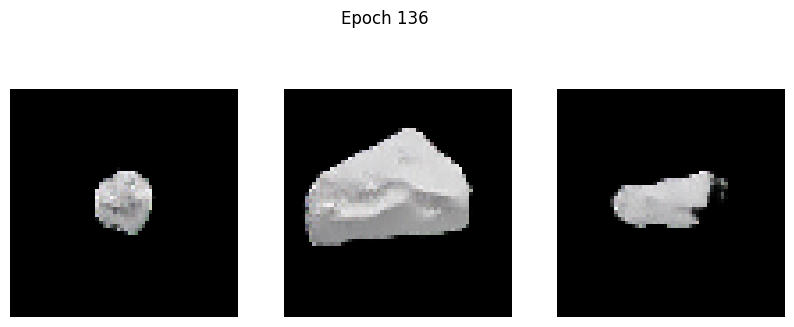

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.0866 - g_loss: 2.8733
Epoch 137/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.2209 - g_loss: 2.9935

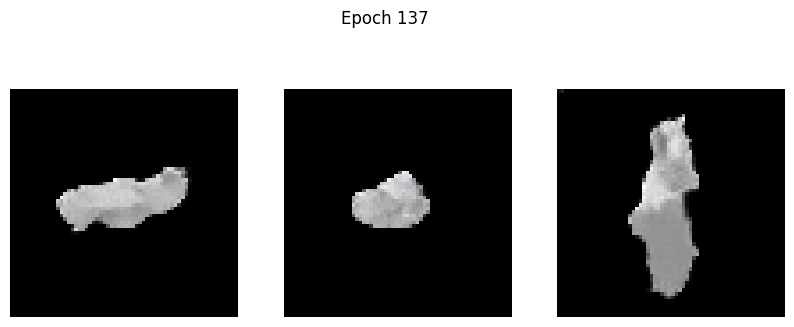

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.2214 - g_loss: 2.9925
Epoch 138/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.3182 - g_loss: 2.8007

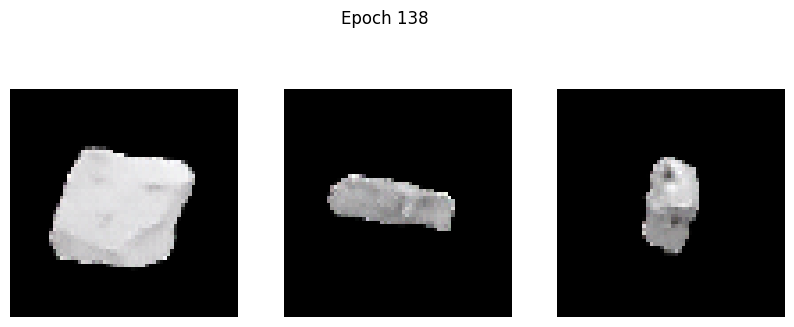

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.3178 - g_loss: 2.8017
Epoch 139/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.1516 - g_loss: 3.0965

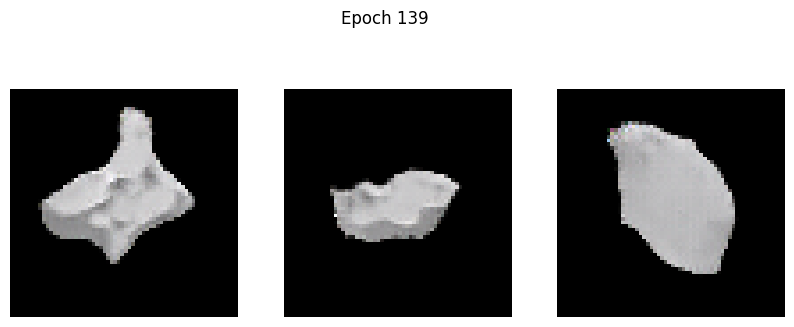

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.1501 - g_loss: 3.0956
Epoch 140/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 1.4934 - g_loss: 3.4671

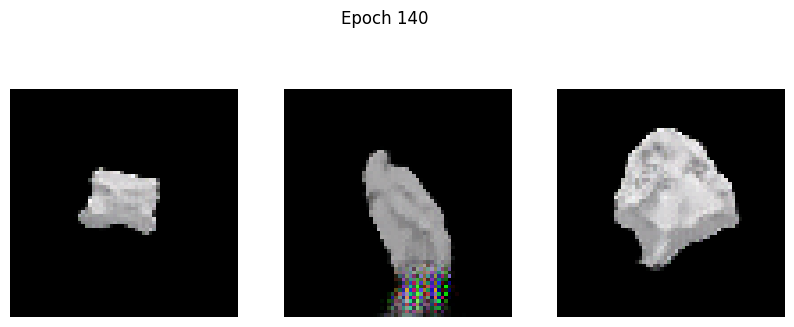

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 1.4922 - g_loss: 3.4669
Epoch 141/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.0956 - g_loss: 2.5461

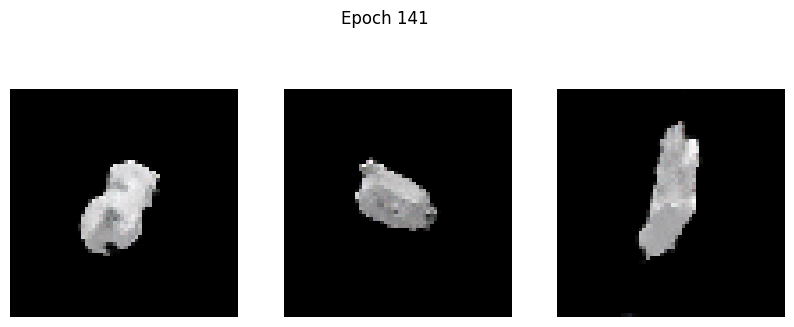

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.0968 - g_loss: 2.5468
Epoch 142/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.5008 - g_loss: 2.5542

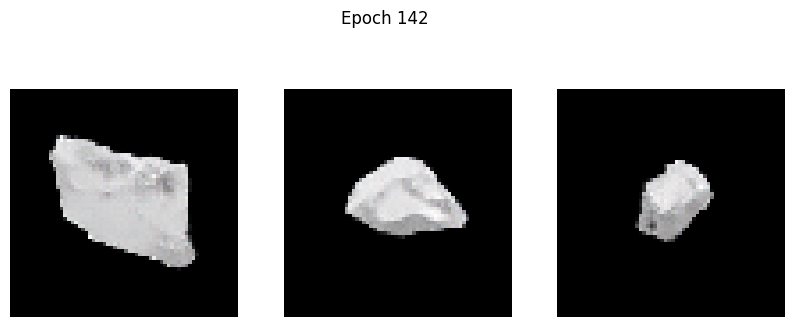

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.4995 - g_loss: 2.5542
Epoch 143/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.4723 - g_loss: 2.6221

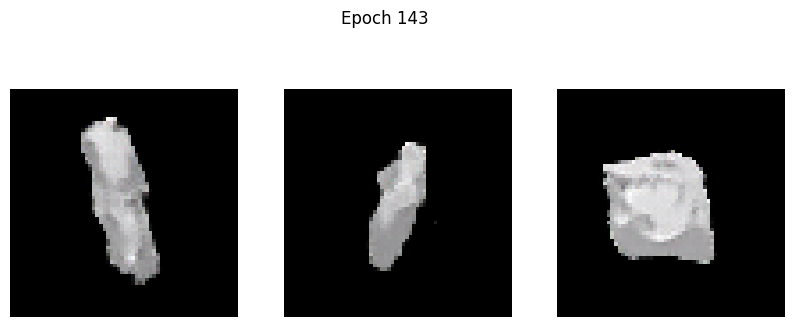

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.4718 - g_loss: 2.6225
Epoch 144/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.4846 - g_loss: 2.7432

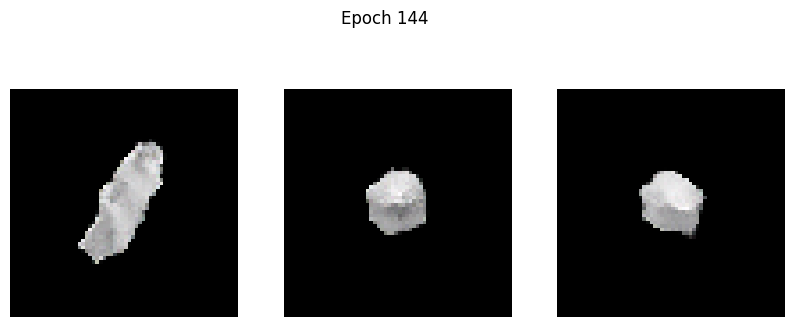

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.4856 - g_loss: 2.7433
Epoch 145/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.6055 - g_loss: 2.8575

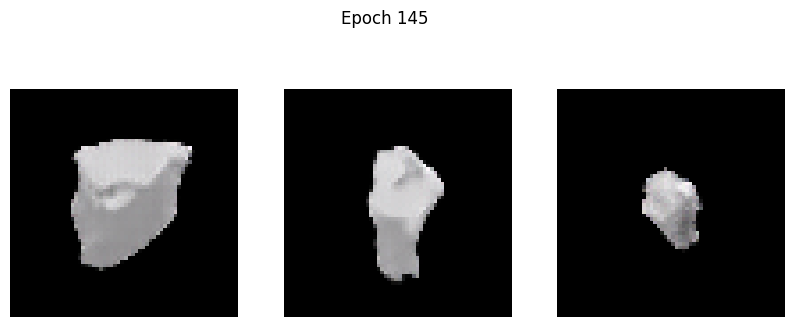

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.6059 - g_loss: 2.8574
Epoch 146/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.4008 - g_loss: 3.1434

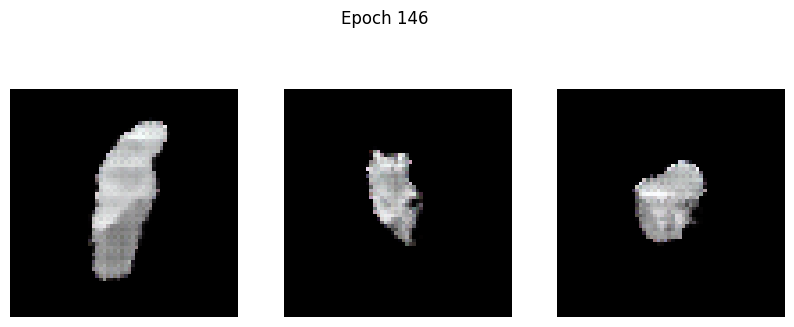

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.3856 - g_loss: 3.1571
Epoch 147/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.1667 - g_loss: 2.8708

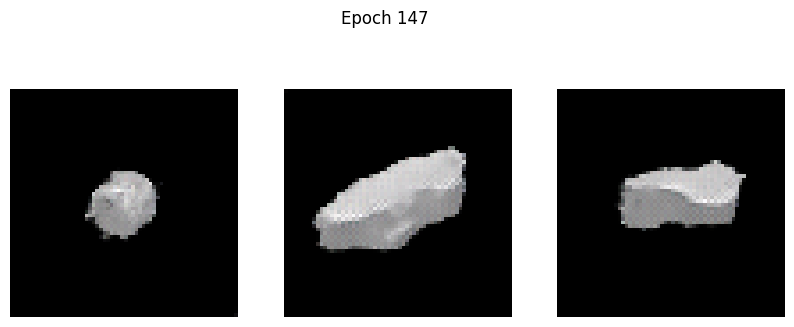

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.1683 - g_loss: 2.8676
Epoch 148/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.6563 - g_loss: 2.4091

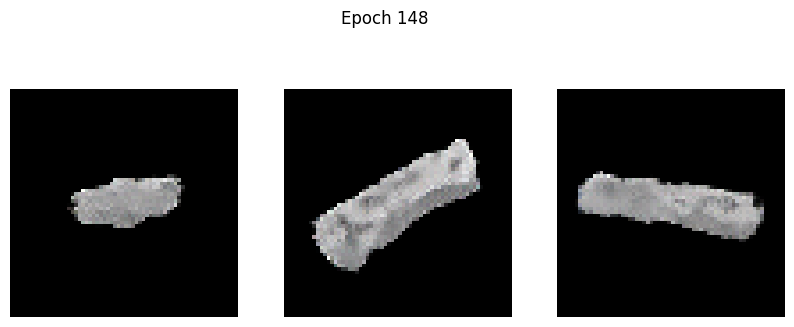

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.6567 - g_loss: 2.4092
Epoch 149/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.9897 - g_loss: 2.5006

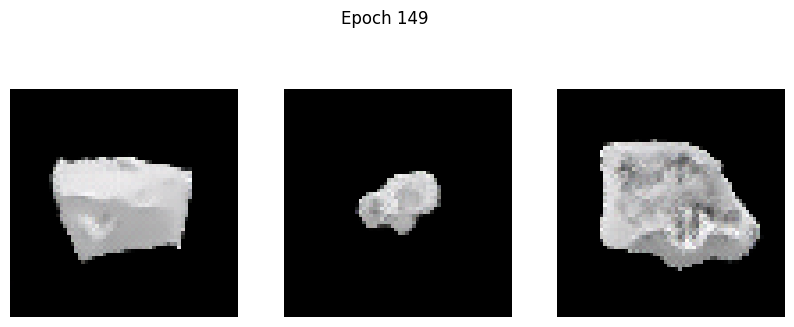

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -0.9892 - g_loss: 2.5008
Epoch 150/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.1438 - g_loss: 3.3972

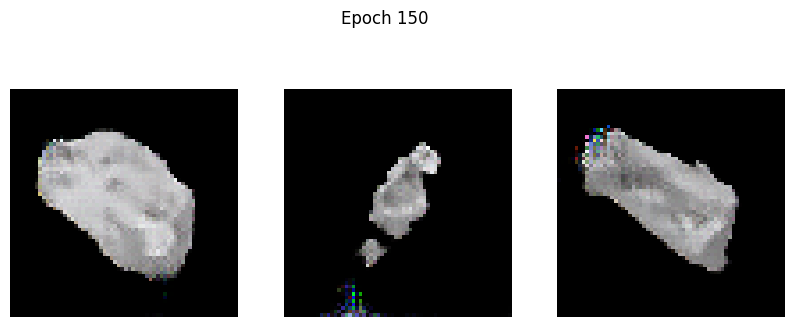

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1460 - g_loss: 3.3950
Epoch 151/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 0.1513 - g_loss: 2.4735

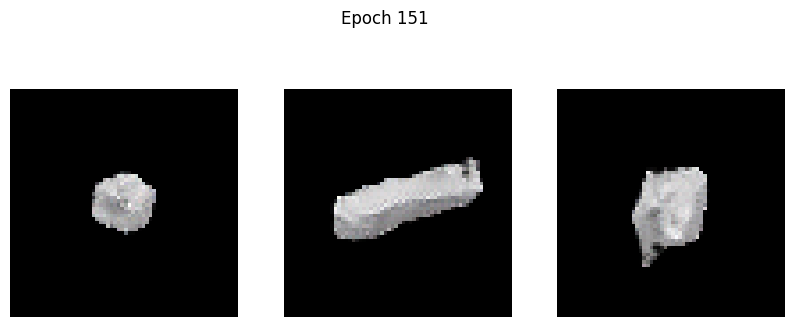

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 0.1472 - g_loss: 2.4734
Epoch 152/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.8183 - g_loss: 2.4896

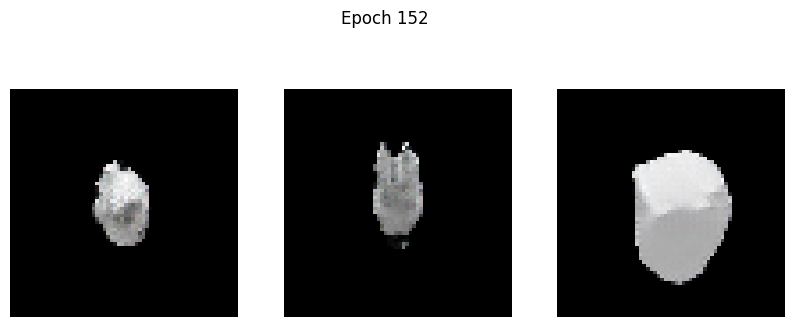

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.8173 - g_loss: 2.4901
Epoch 153/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.9354 - g_loss: 2.5849

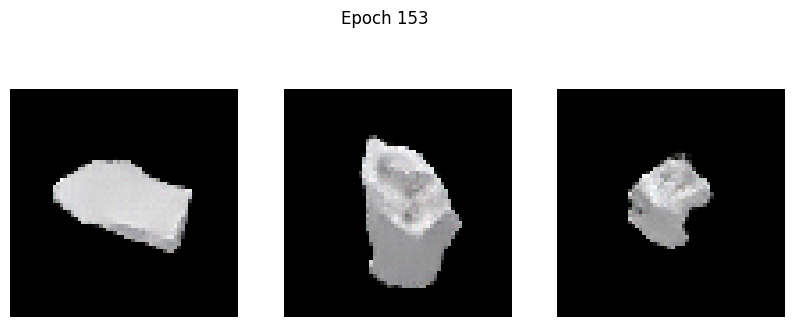

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.9341 - g_loss: 2.5852
Epoch 154/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 1.7879 - g_loss: 3.8954

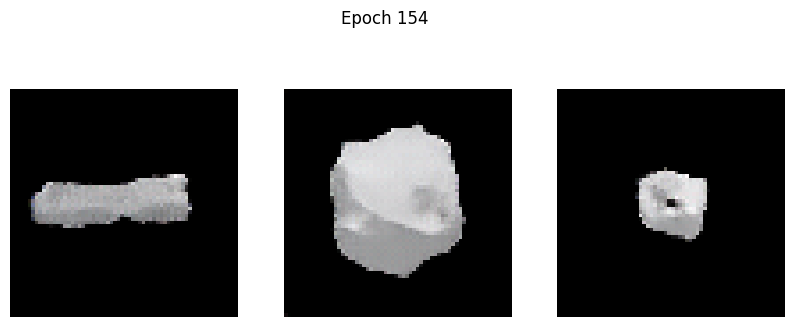

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 1.7801 - g_loss: 3.8918
Epoch 155/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.8936 - g_loss: 2.4563

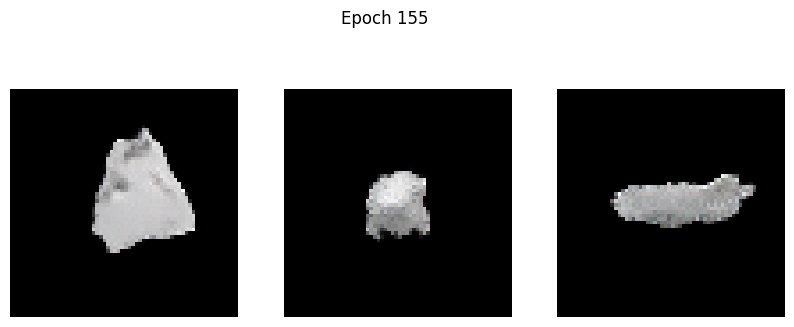

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.8933 - g_loss: 2.4563
Epoch 156/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -1.1157 - g_loss: 2.5624

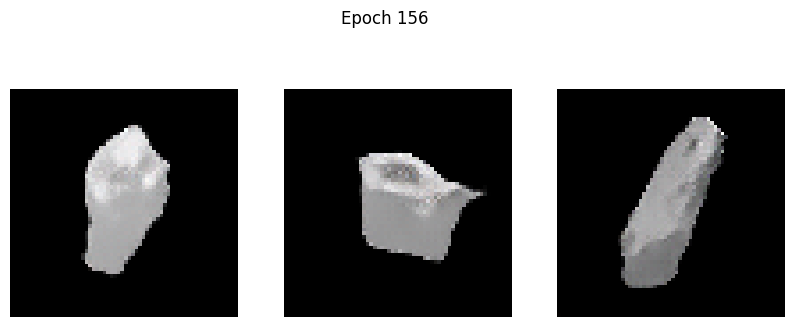

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -1.1134 - g_loss: 2.5626
Epoch 157/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -1.0351 - g_loss: 2.6299

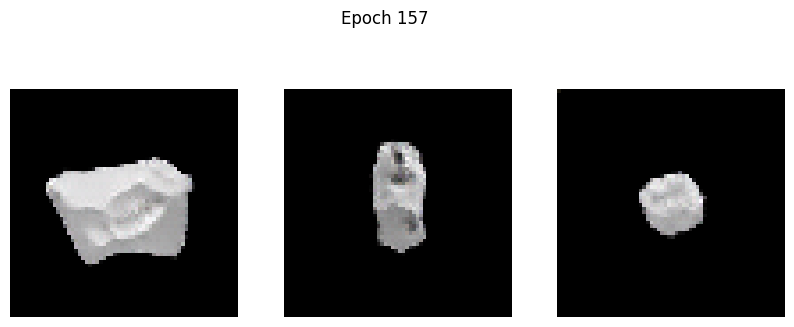

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -1.0352 - g_loss: 2.6306
Epoch 158/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.9414 - g_loss: 2.9433

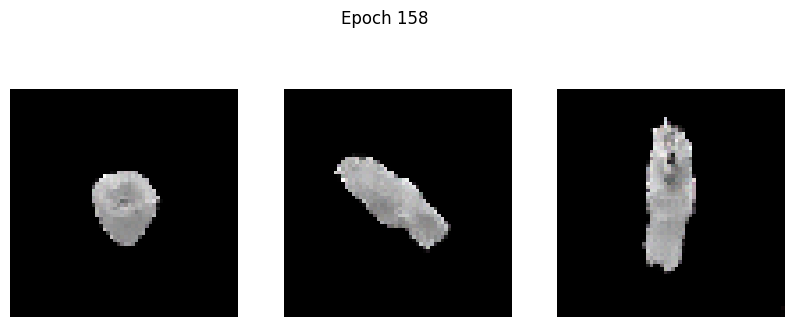

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.9423 - g_loss: 2.9421
Epoch 159/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 0.1473 - g_loss: 3.5707

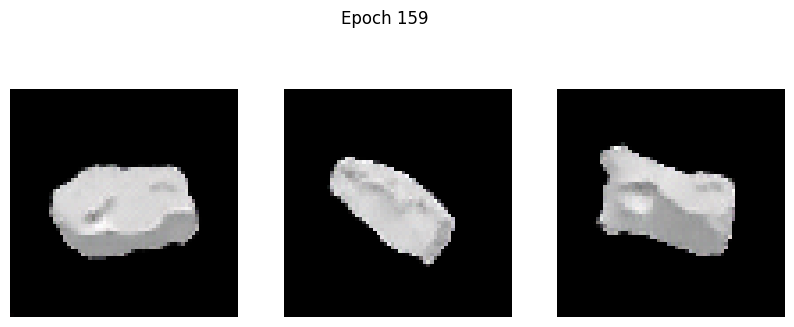

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 0.1471 - g_loss: 3.5697
Epoch 160/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -1.1305 - g_loss: 2.7317

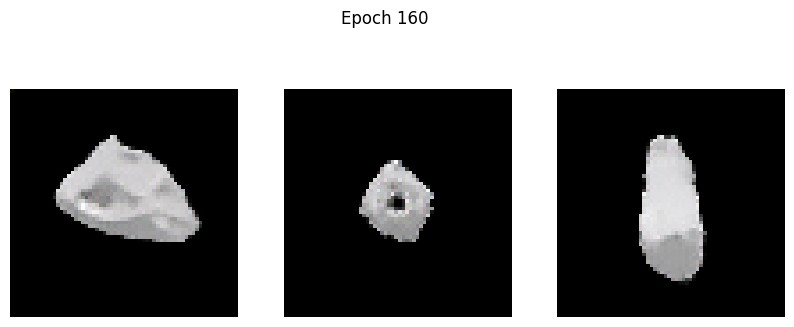

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -1.1310 - g_loss: 2.7313
Epoch 161/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -1.3906 - g_loss: 2.8283

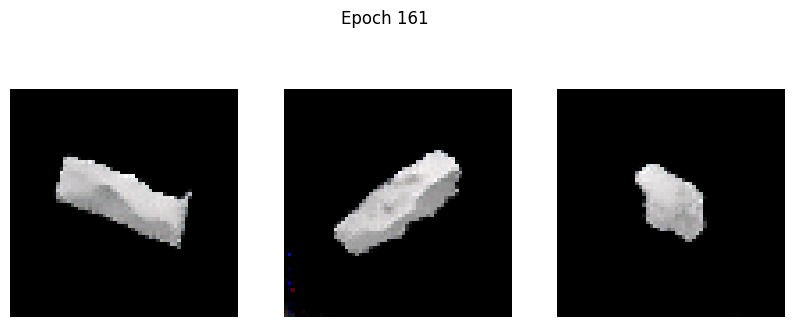

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -1.3892 - g_loss: 2.8286
Epoch 162/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 1.4998 - g_loss: 4.7130

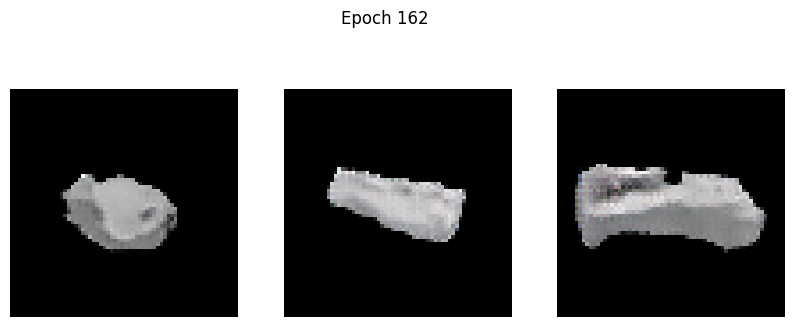

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 1.4918 - g_loss: 4.7079
Epoch 163/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.9293 - g_loss: 2.5990

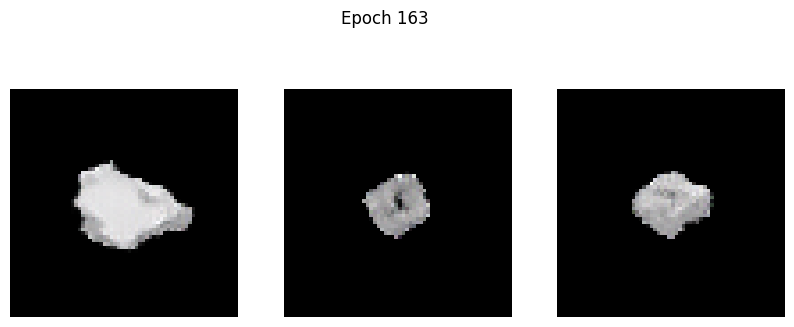

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.9326 - g_loss: 2.5990
Epoch 164/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -1.2411 - g_loss: 2.8893

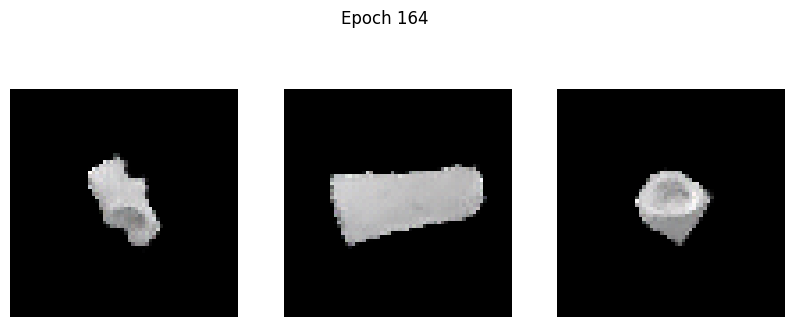

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -1.2439 - g_loss: 2.8881
Epoch 165/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.7296 - g_loss: 3.1821

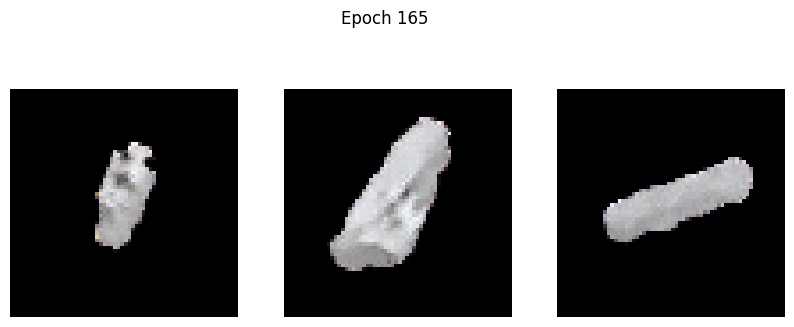

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.7286 - g_loss: 3.1855
Epoch 166/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -1.3261 - g_loss: 2.4270

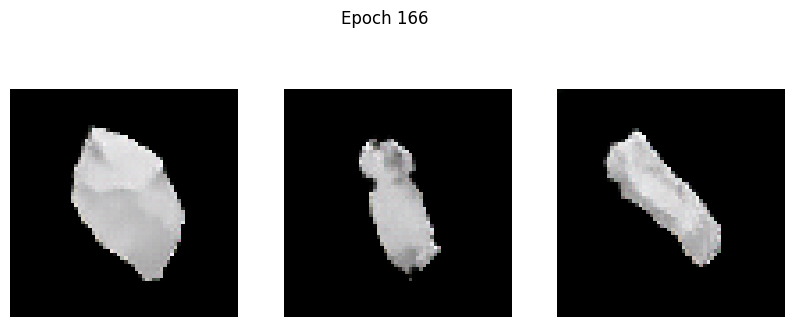

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: -1.3289 - g_loss: 2.4271
Epoch 167/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -1.4973 - g_loss: 2.7883

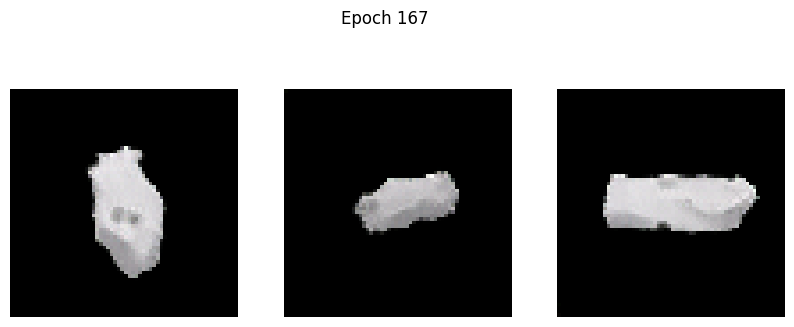

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -1.4991 - g_loss: 2.7875
Epoch 168/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -1.5626 - g_loss: 3.0028

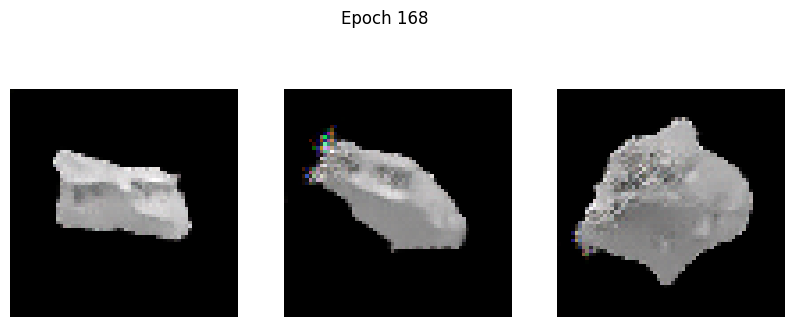

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -1.5646 - g_loss: 3.0021
Epoch 169/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 8.8038 - g_loss: 12.8673

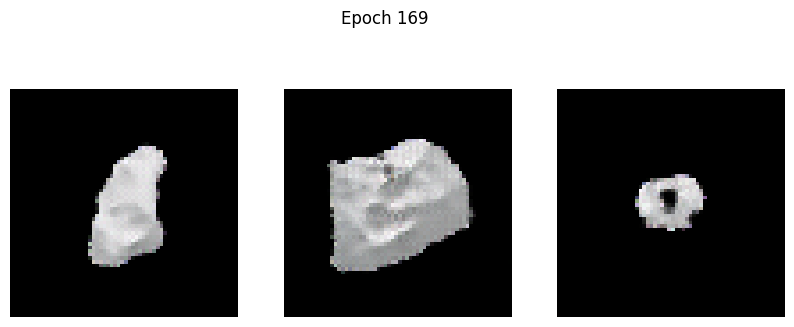

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 8.7854 - g_loss: 12.8378
Epoch 170/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -0.2675 - g_loss: 3.2909

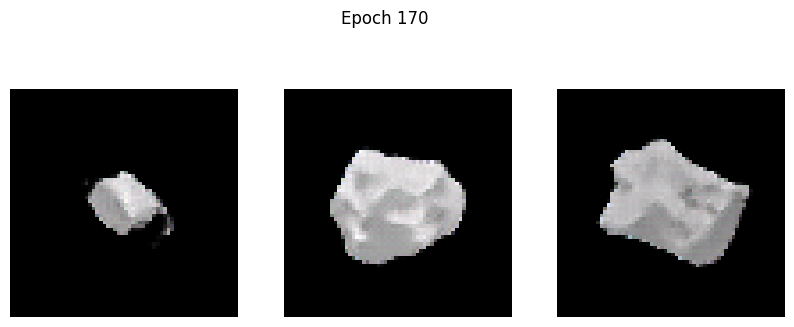

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.2696 - g_loss: 3.2869
Epoch 171/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.9940 - g_loss: 2.2402

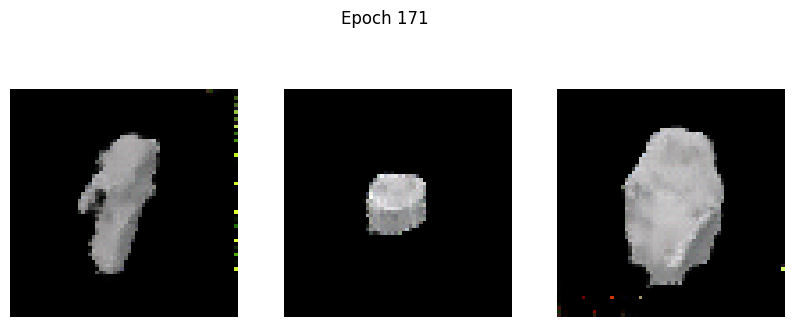

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.9959 - g_loss: 2.2412
Epoch 172/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -1.0075 - g_loss: 2.5233

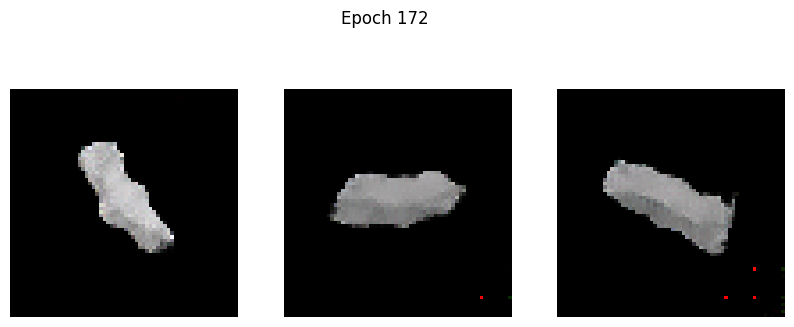

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -1.0091 - g_loss: 2.5229
Epoch 173/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -1.8419 - g_loss: 2.3925

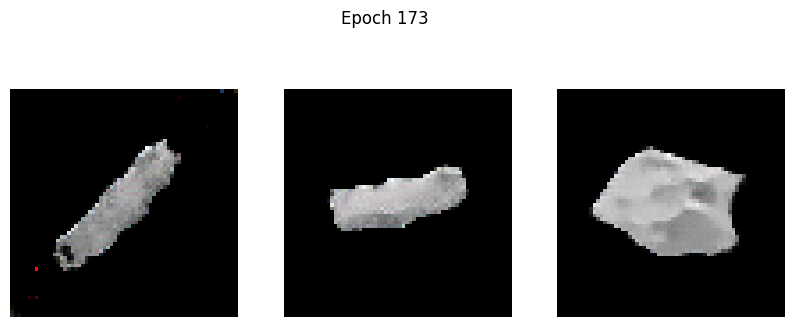

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -1.8427 - g_loss: 2.3923
Epoch 174/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -1.3815 - g_loss: 2.3397

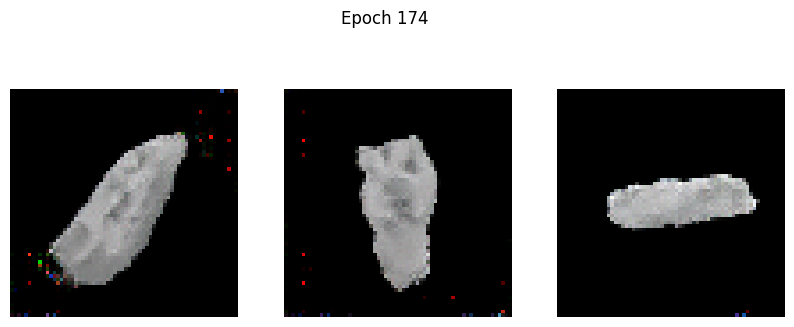

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -1.3845 - g_loss: 2.3403
Epoch 175/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -2.0300 - g_loss: 2.4192

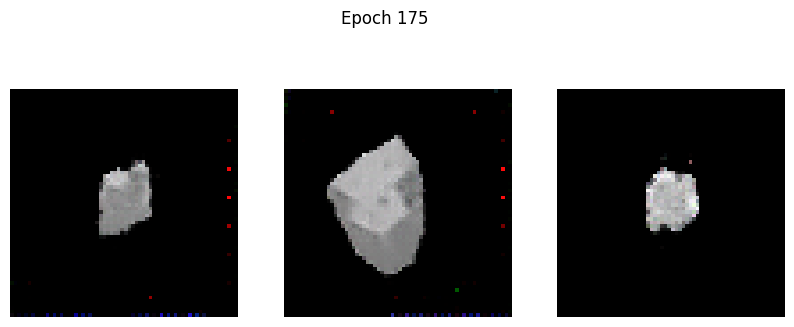

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -2.0301 - g_loss: 2.4191
Epoch 176/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -1.8411 - g_loss: 2.6606

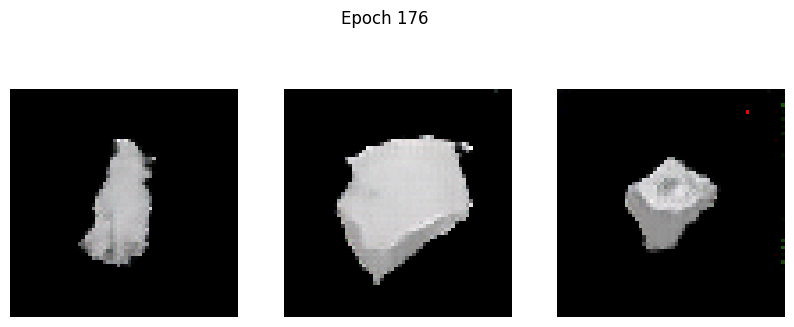

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -1.8442 - g_loss: 2.6602
Epoch 177/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -1.8381 - g_loss: 2.7529

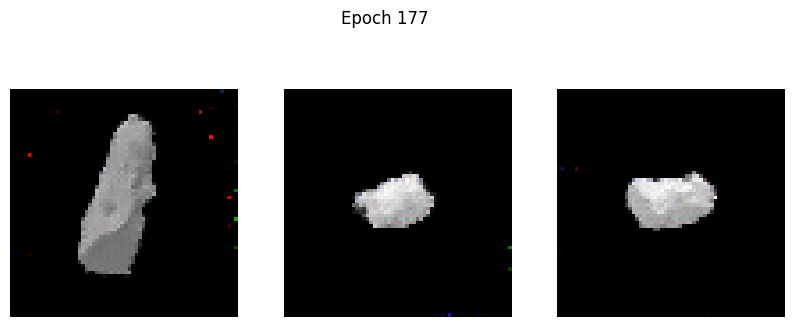

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -1.8386 - g_loss: 2.7533
Epoch 178/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -1.2099 - g_loss: 3.1317

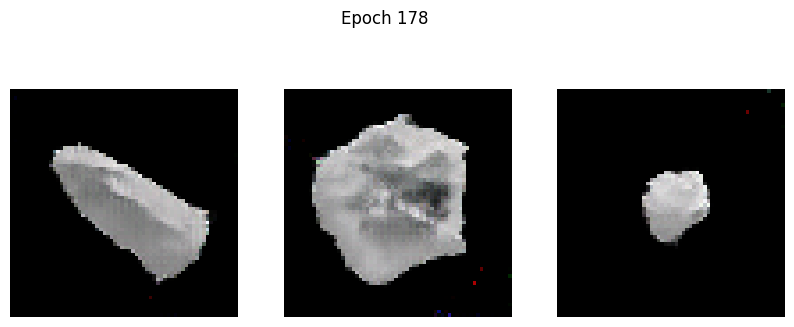

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -1.2165 - g_loss: 3.1307
Epoch 179/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -2.0377 - g_loss: 2.8269

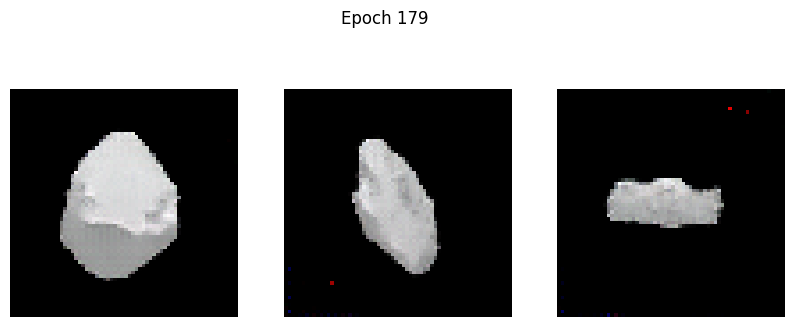

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -2.0384 - g_loss: 2.8279
Epoch 180/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -1.2109 - g_loss: 3.1273

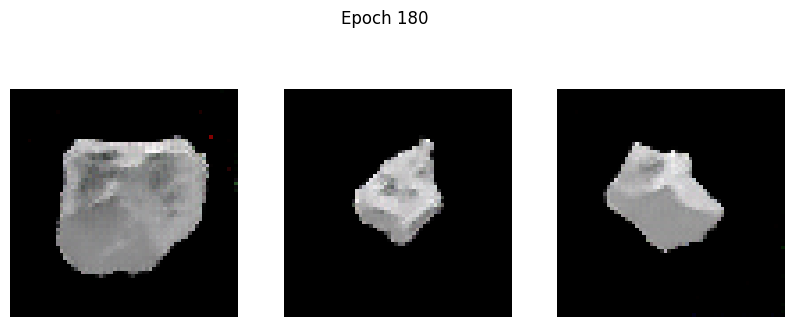

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -1.2141 - g_loss: 3.1279
Epoch 181/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -1.7410 - g_loss: 3.1019

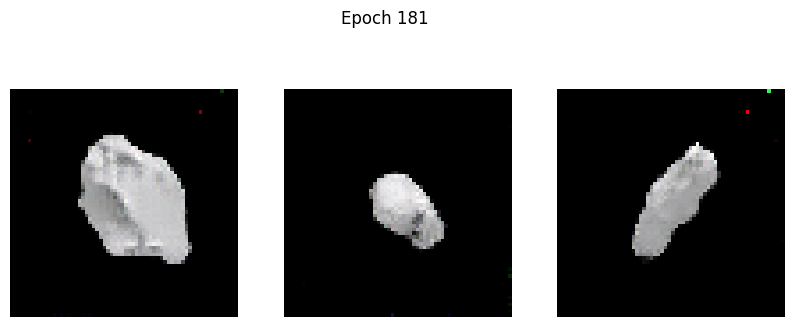

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -1.7438 - g_loss: 3.1014
Epoch 182/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -1.7194 - g_loss: 2.9766

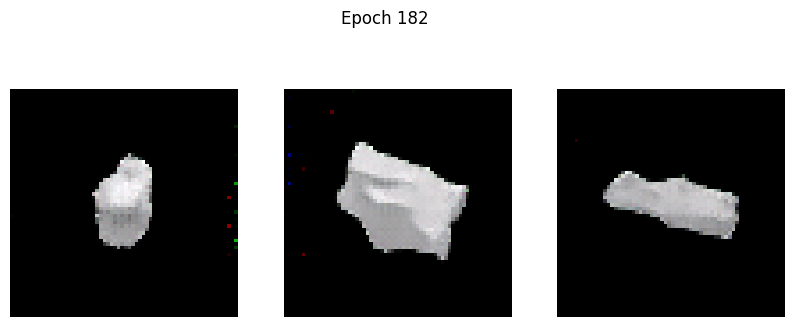

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -1.7209 - g_loss: 2.9779
Epoch 183/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -2.4460 - g_loss: 3.0545

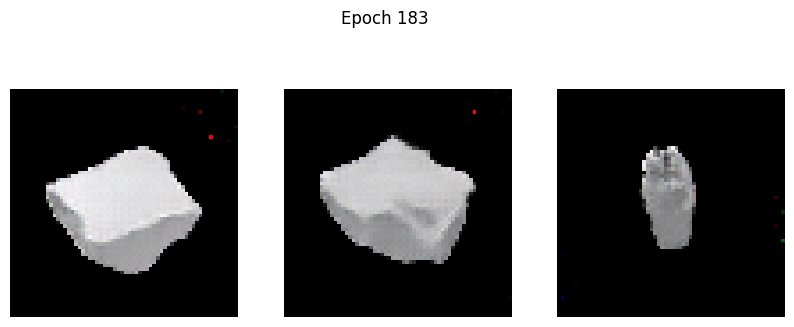

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -2.4535 - g_loss: 3.0535
Epoch 184/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 12.1484 - g_loss: 17.2453

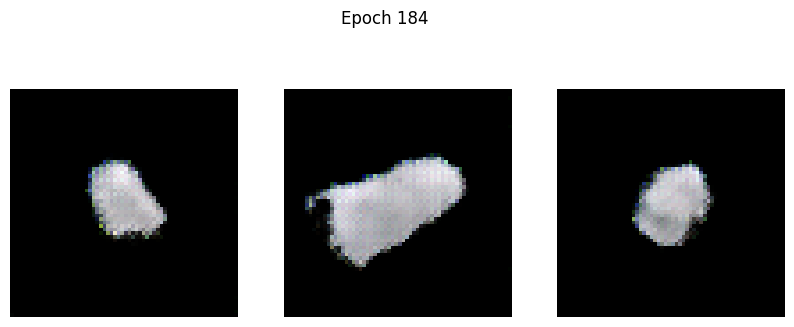

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 12.1576 - g_loss: 17.2709
Epoch 185/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -0.7458 - g_loss: 4.4275

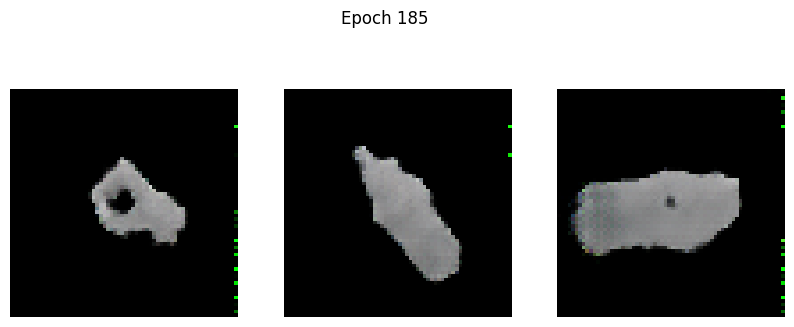

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -0.7496 - g_loss: 4.4187
Epoch 186/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -1.3604 - g_loss: 3.0355

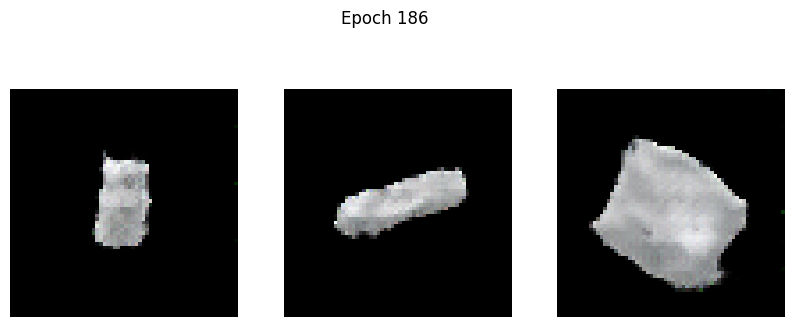

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -1.3677 - g_loss: 3.0351
Epoch 187/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -2.3893 - g_loss: 2.6507

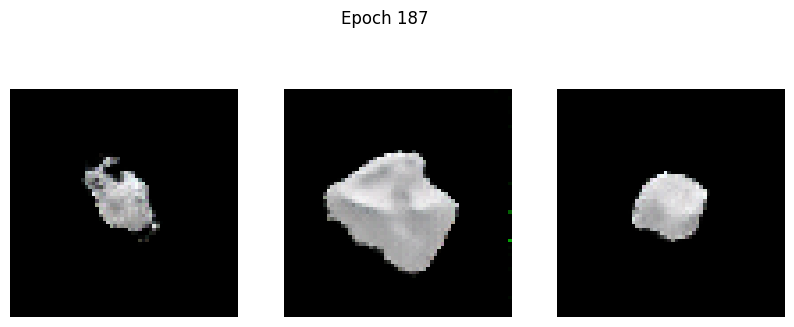

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -2.3907 - g_loss: 2.6513
Epoch 188/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -2.4160 - g_loss: 3.0417

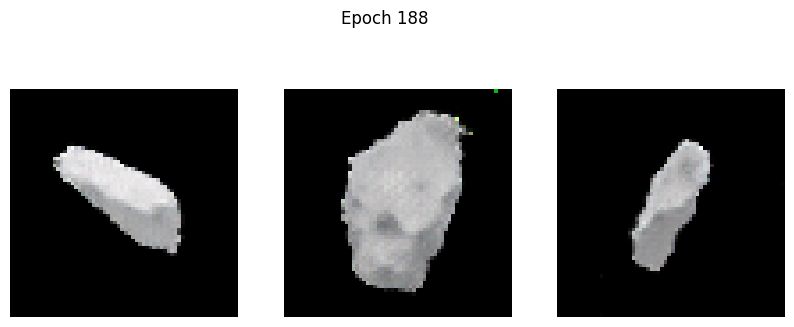

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -2.4163 - g_loss: 3.0397
Epoch 189/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -2.4029 - g_loss: 2.9989

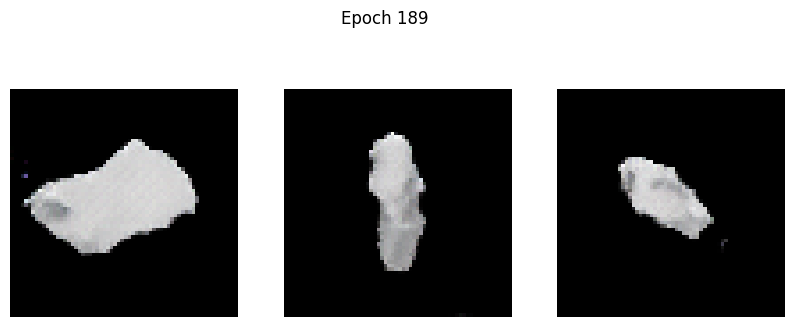

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -2.4045 - g_loss: 2.9974
Epoch 190/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -2.1534 - g_loss: 2.8010

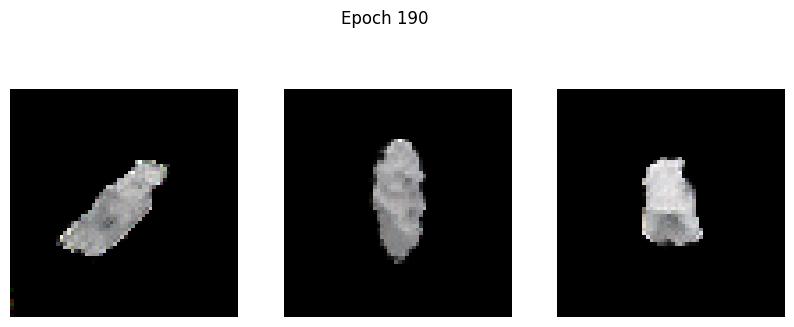

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -2.1515 - g_loss: 2.8031
Epoch 191/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -0.7219 - g_loss: 3.5294

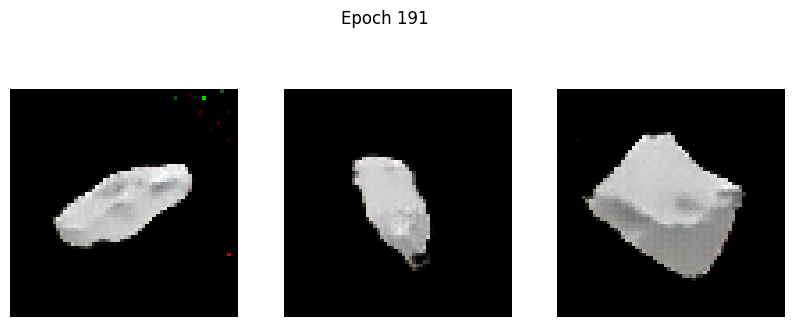

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -0.7261 - g_loss: 3.5291
Epoch 192/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -2.5023 - g_loss: 3.3034

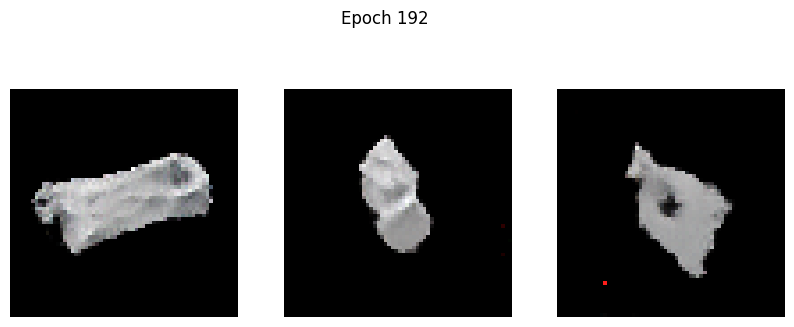

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -2.5033 - g_loss: 3.3009
Epoch 193/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -3.4697 - g_loss: 2.9532

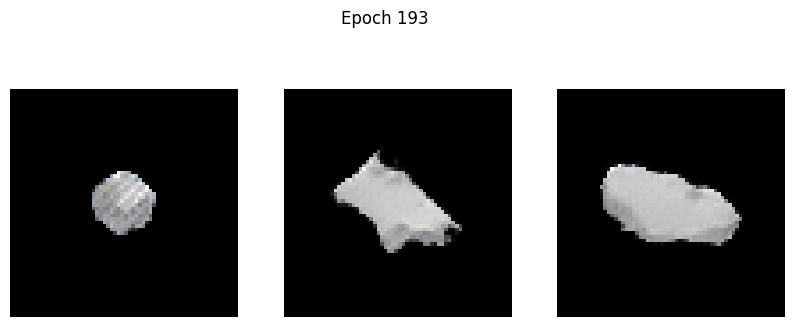

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -3.4686 - g_loss: 2.9529
Epoch 194/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -3.4300 - g_loss: 2.8785

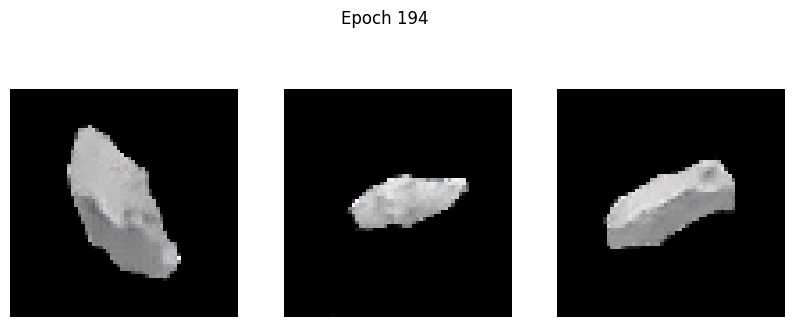

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -3.4324 - g_loss: 2.8780
Epoch 195/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -2.9346 - g_loss: 3.0942

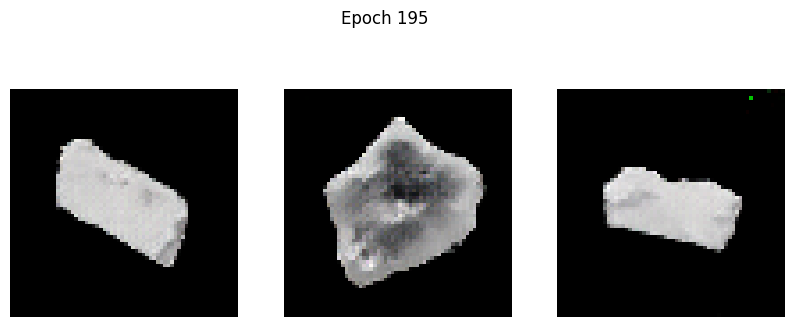

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -2.9391 - g_loss: 3.0941
Epoch 196/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -2.4028 - g_loss: 3.2724

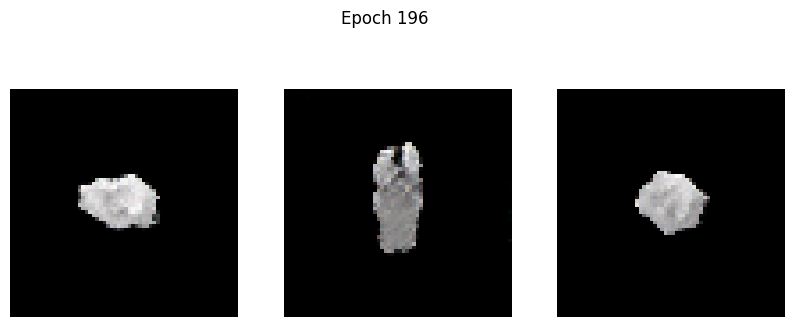

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -2.4087 - g_loss: 3.2723
Epoch 197/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -3.4374 - g_loss: 3.4709

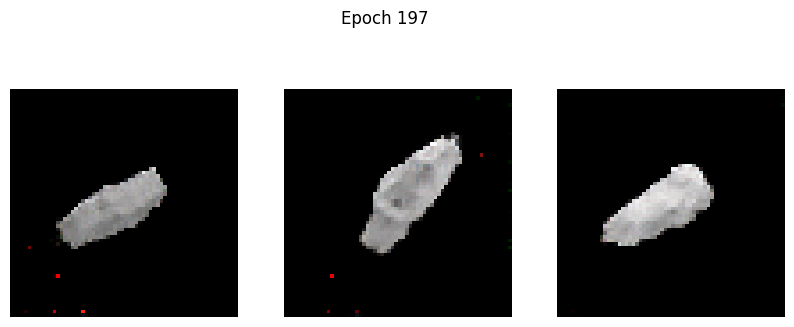

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -3.4303 - g_loss: 3.4718
Epoch 198/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -3.8845 - g_loss: 3.1726

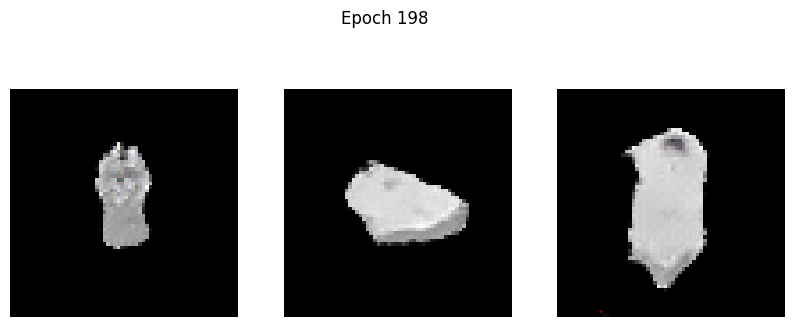

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -3.8843 - g_loss: 3.1723
Epoch 199/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -3.9682 - g_loss: 3.2400

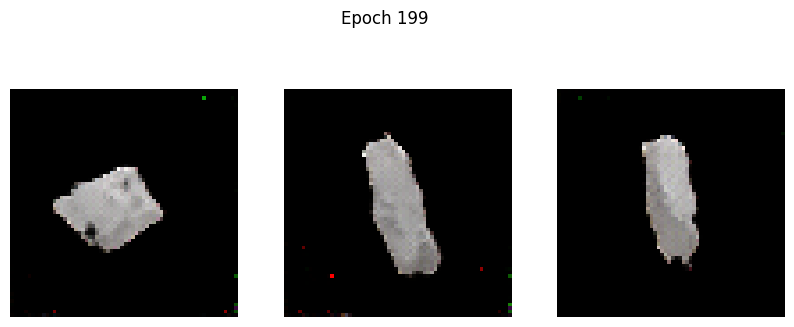

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -3.9502 - g_loss: 3.2433
Epoch 200/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -2.6624 - g_loss: 3.8856

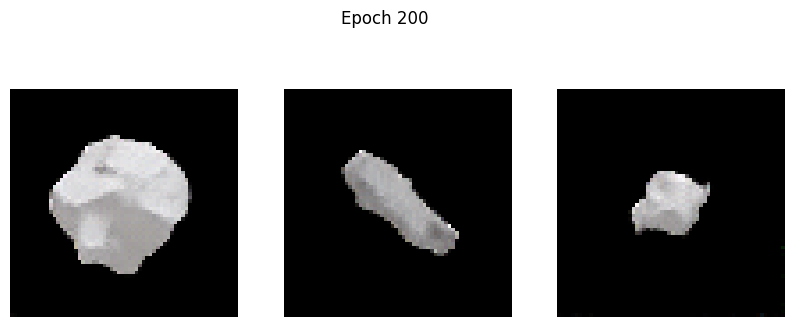

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -2.6686 - g_loss: 3.8809
Epoch 201/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -3.9917 - g_loss: 2.9893

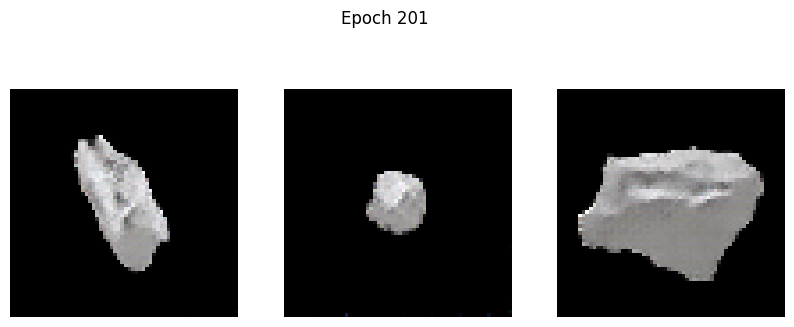

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -3.9947 - g_loss: 2.9895
Epoch 202/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -4.6632 - g_loss: 3.0049

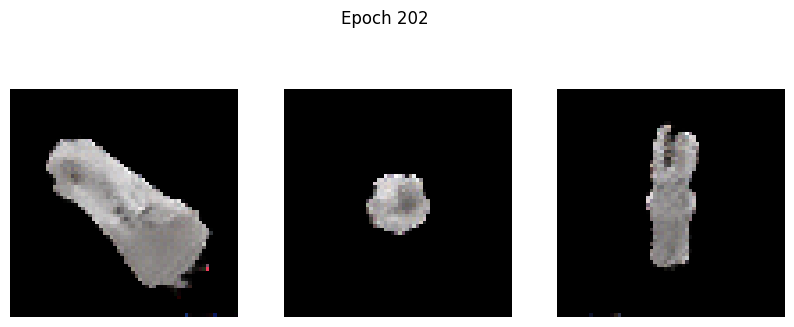

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -4.6588 - g_loss: 3.0063
Epoch 203/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -2.7227 - g_loss: 3.6023

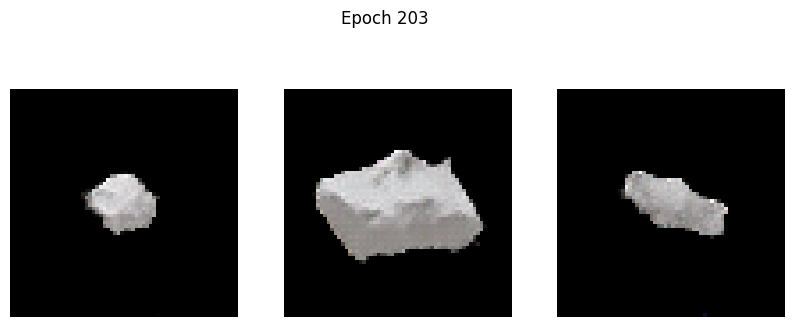

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -2.7224 - g_loss: 3.6036
Epoch 204/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -3.9411 - g_loss: 3.4444

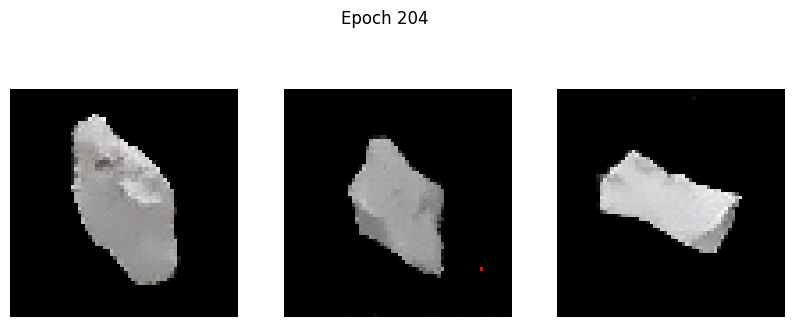

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -3.9443 - g_loss: 3.4419
Epoch 205/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -5.0336 - g_loss: 3.4640

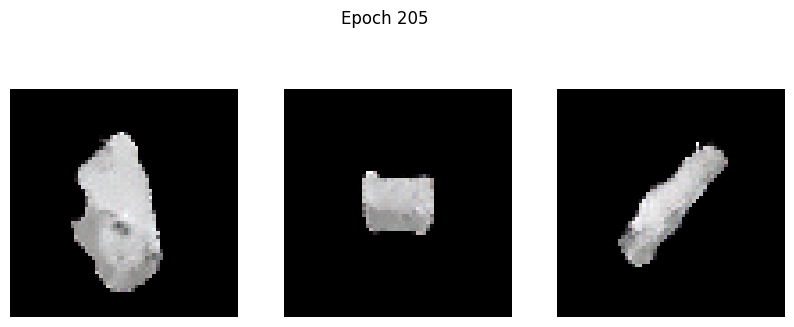

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -5.0250 - g_loss: 3.4653
Epoch 206/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -4.2974 - g_loss: 3.6325

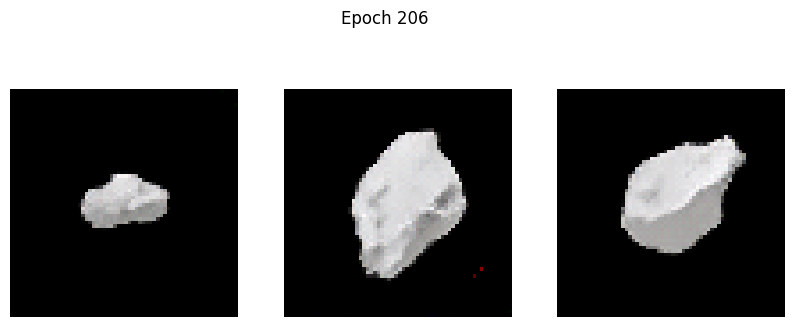

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -4.2992 - g_loss: 3.6319
Epoch 207/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -5.2421 - g_loss: 3.3970

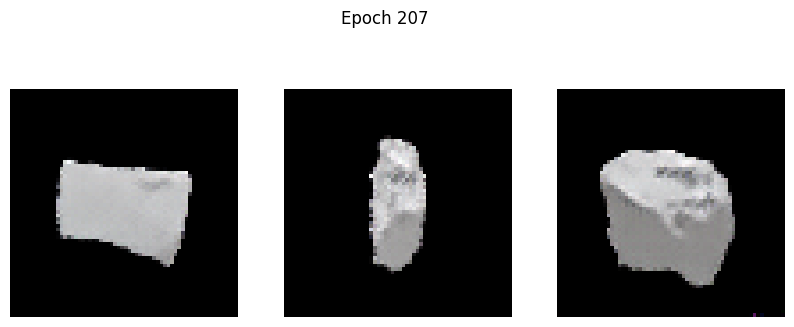

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -5.2464 - g_loss: 3.3977
Epoch 208/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -3.9694 - g_loss: 3.8938

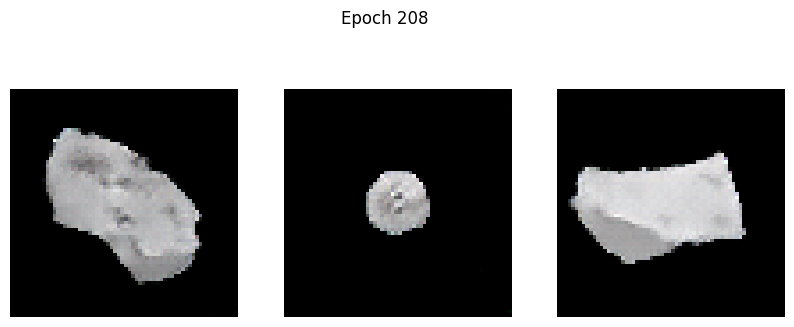

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -3.9847 - g_loss: 3.8913
Epoch 209/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -5.8421 - g_loss: 3.7330

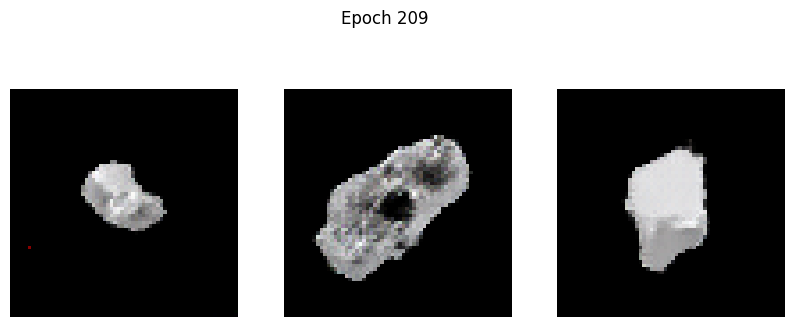

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -5.8379 - g_loss: 3.7335
Epoch 210/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -6.2445 - g_loss: 3.6716

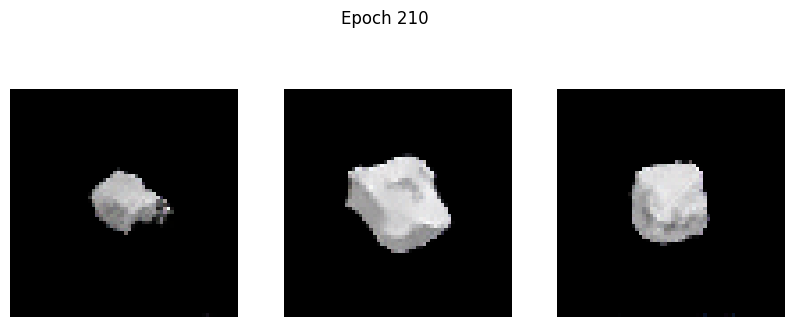

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -6.2396 - g_loss: 3.6717
Epoch 211/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -3.9028 - g_loss: 4.2268

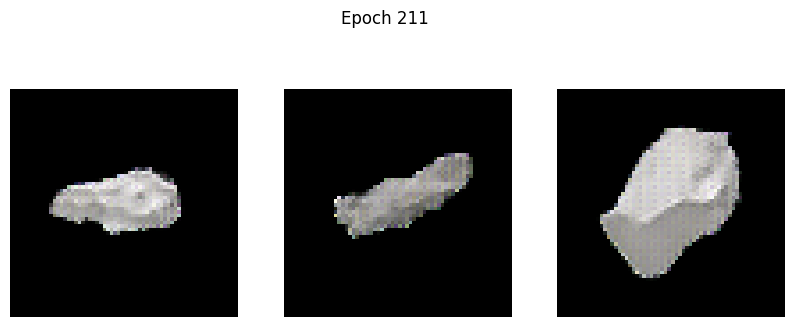

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -3.8771 - g_loss: 4.2332
Epoch 212/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -5.5229 - g_loss: 3.4146

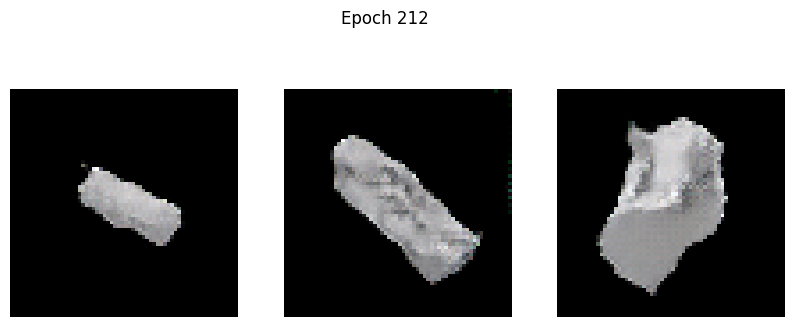

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -5.5282 - g_loss: 3.4123
Epoch 213/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -6.8835 - g_loss: 2.9451

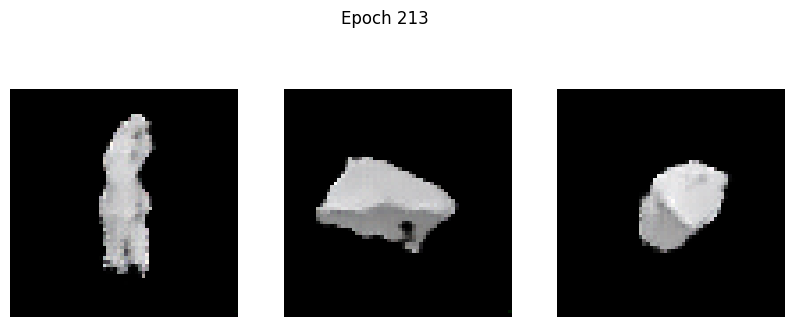

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -6.8871 - g_loss: 2.9477
Epoch 214/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -5.7087 - g_loss: 3.5480

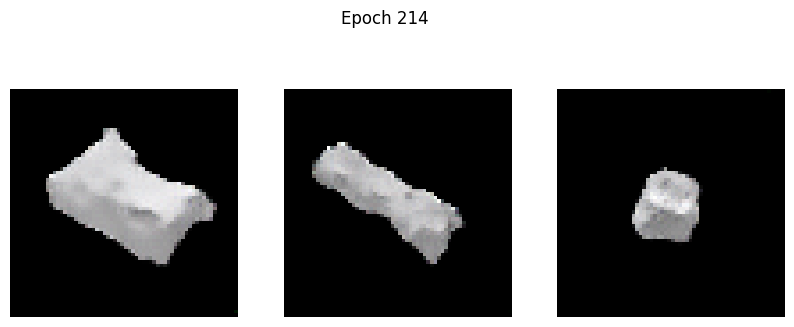

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -5.7229 - g_loss: 3.5519
Epoch 215/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -8.2136 - g_loss: 3.8406

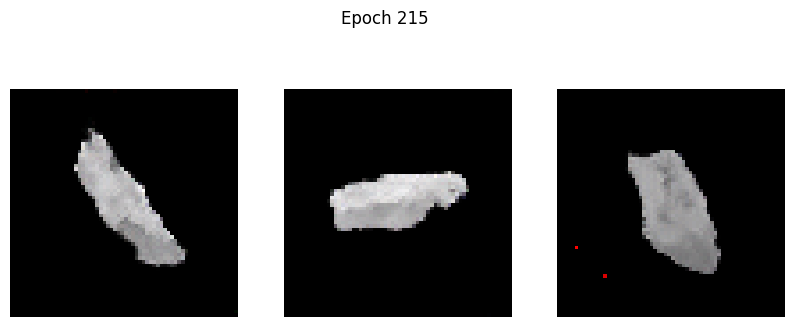

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -8.2113 - g_loss: 3.8382
Epoch 216/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -10.5388 - g_loss: 3.3122

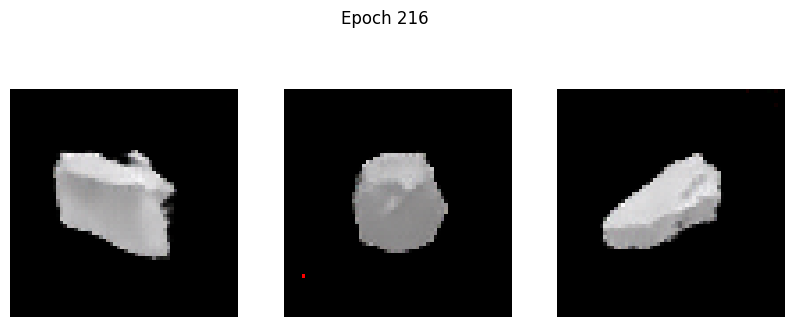

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -10.5222 - g_loss: 3.3136
Epoch 217/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 4.1290 - g_loss: 8.7272

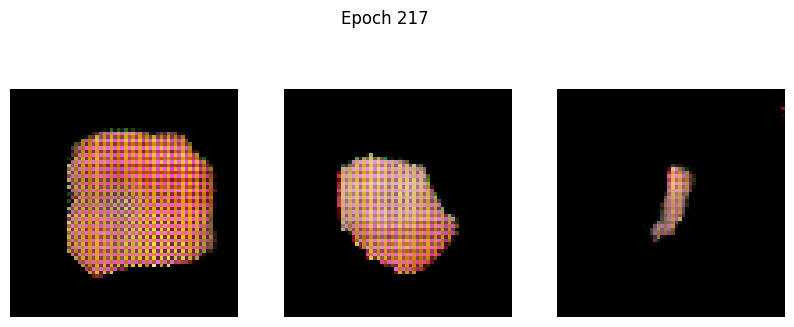

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 4.7427 - g_loss: 9.0944
Epoch 218/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 34.4887 - g_loss: 43.6562

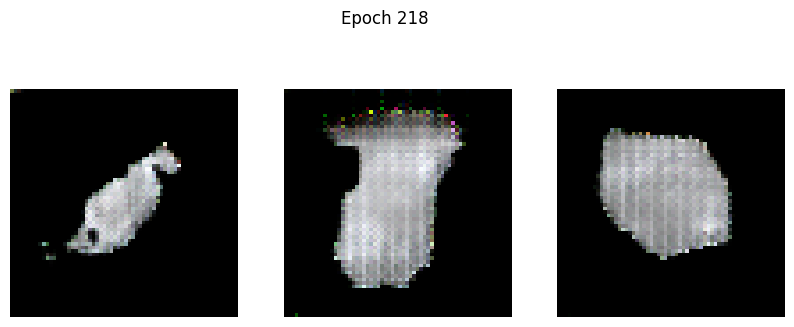

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 34.3755 - g_loss: 43.4773
Epoch 219/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 9.7292 - g_loss: 14.5931

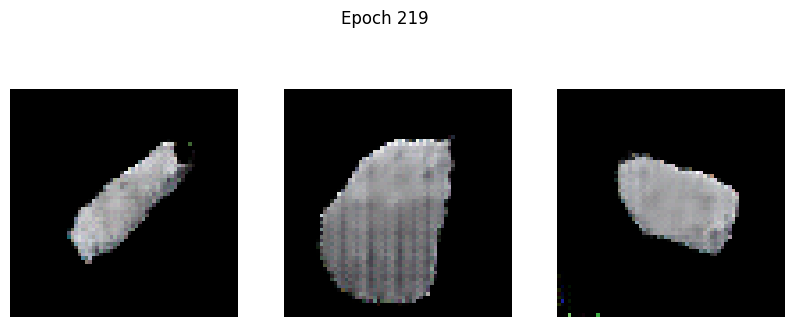

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 9.7039 - g_loss: 14.5651
Epoch 220/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 3.5158 - g_loss: 6.3223

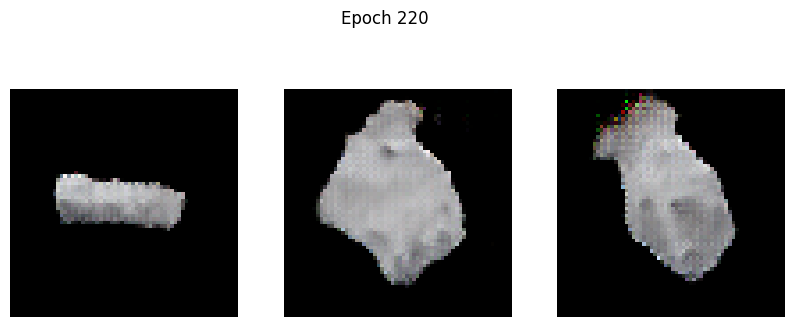

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 3.5068 - g_loss: 6.3196
Epoch 221/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 1.6395 - g_loss: 5.9840

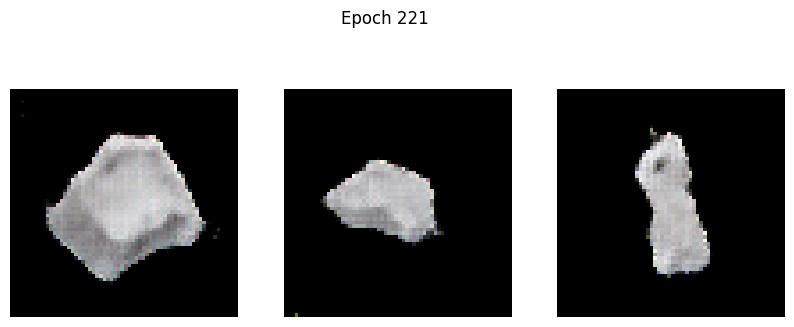

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 1.6282 - g_loss: 5.9807
Epoch 222/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -0.1461 - g_loss: 4.6389

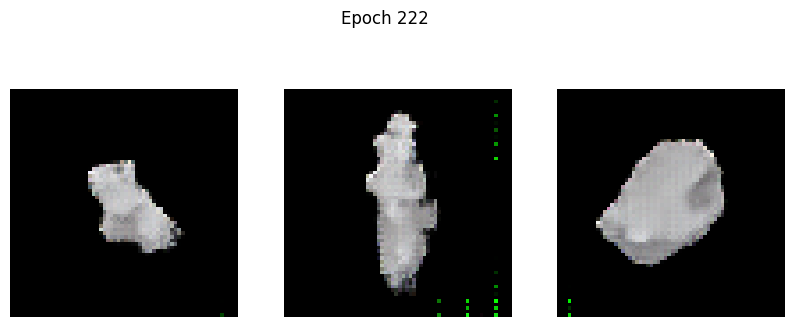

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -0.1493 - g_loss: 4.6393
Epoch 223/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -1.7731 - g_loss: 3.9888

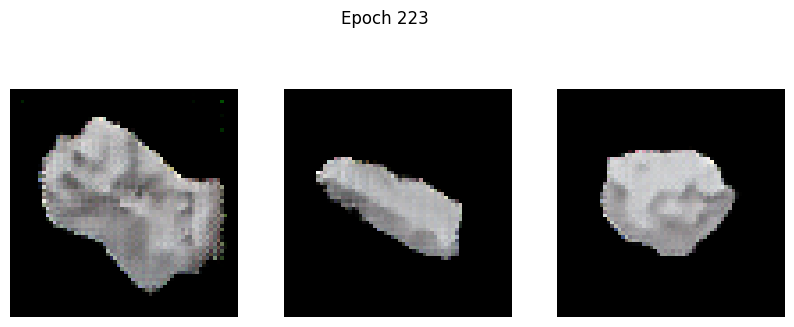

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -1.7685 - g_loss: 3.9896
Epoch 224/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -2.6735 - g_loss: 3.7051

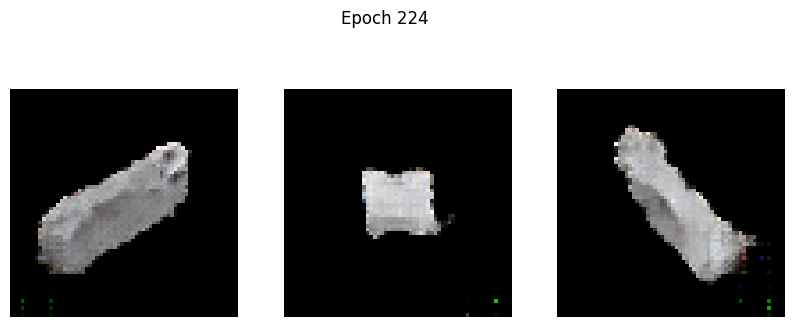

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -2.6693 - g_loss: 3.7046
Epoch 225/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -3.4297 - g_loss: 3.4306

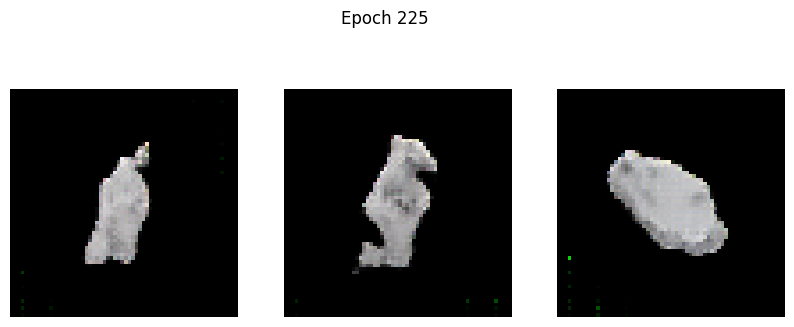

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -3.4247 - g_loss: 3.4302
Epoch 226/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -3.8147 - g_loss: 3.1367

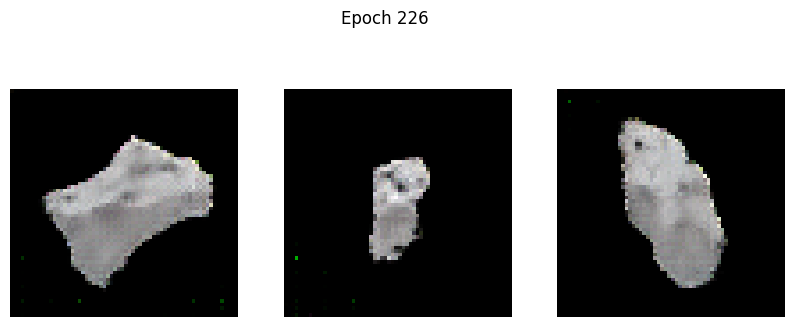

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -3.8166 - g_loss: 3.1374
Epoch 227/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -4.4841 - g_loss: 3.1014

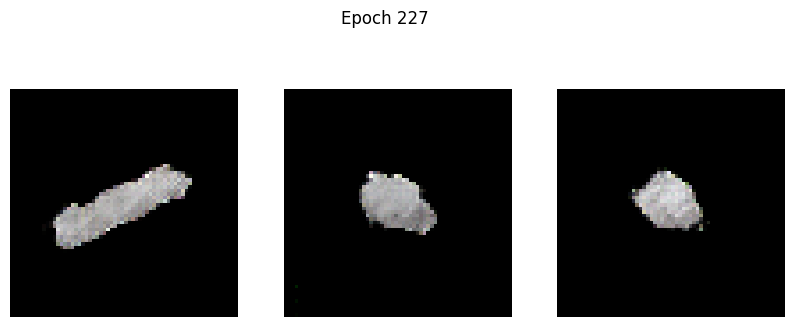

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -4.4776 - g_loss: 3.1010
Epoch 228/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -4.4112 - g_loss: 3.0043

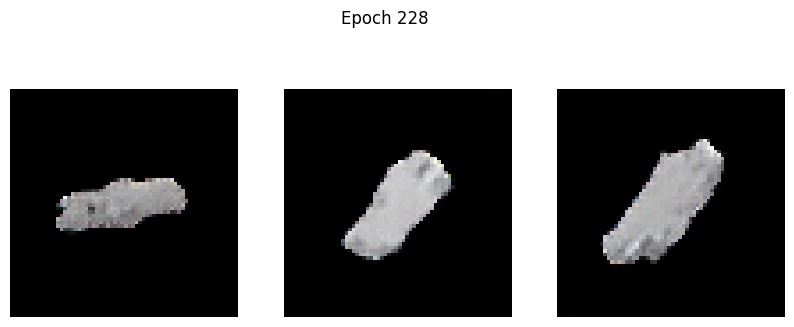

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -4.4171 - g_loss: 3.0037
Epoch 229/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -4.4049 - g_loss: 2.8117

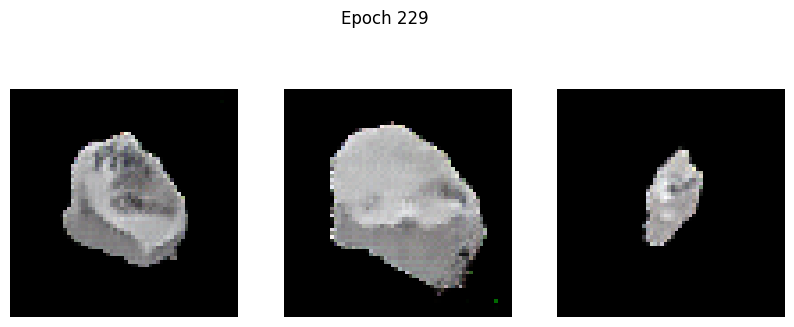

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -4.4134 - g_loss: 2.8104
Epoch 230/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -5.7359 - g_loss: 2.6671

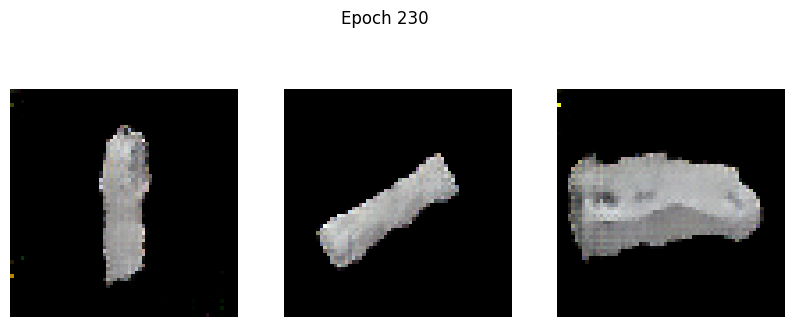

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -5.7281 - g_loss: 2.6671
Epoch 231/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -6.0235 - g_loss: 2.7177

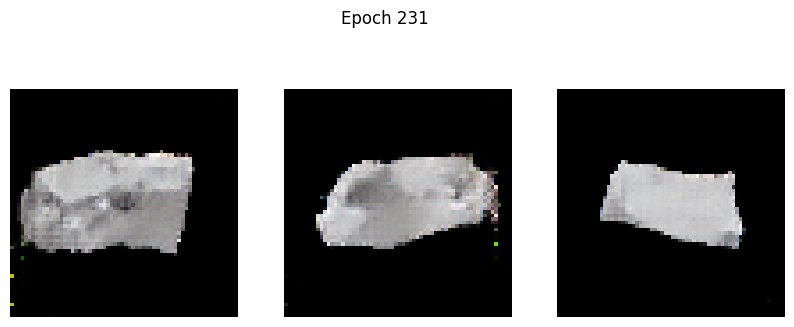

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -6.0209 - g_loss: 2.7168
Epoch 232/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -6.7335 - g_loss: 2.4731

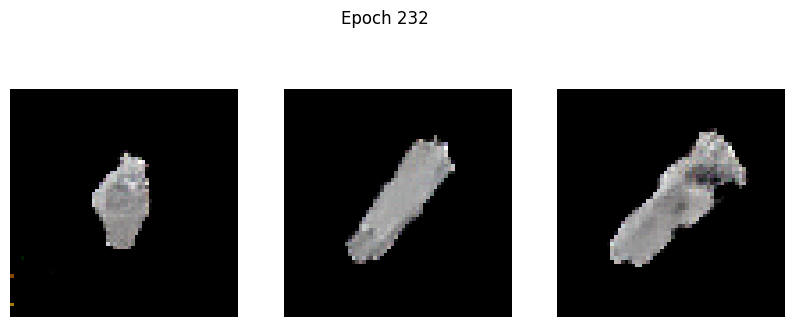

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -6.7309 - g_loss: 2.4736
Epoch 233/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -4.8779 - g_loss: 2.5432

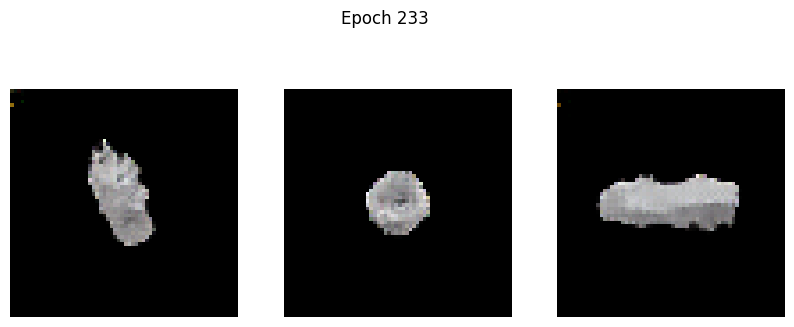

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -4.8892 - g_loss: 2.5420
Epoch 234/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -7.1166 - g_loss: 2.4269

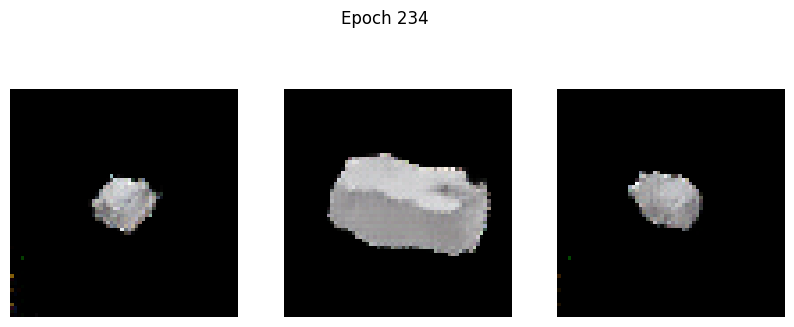

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -7.1158 - g_loss: 2.4273
Epoch 235/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -7.2970 - g_loss: 2.3938

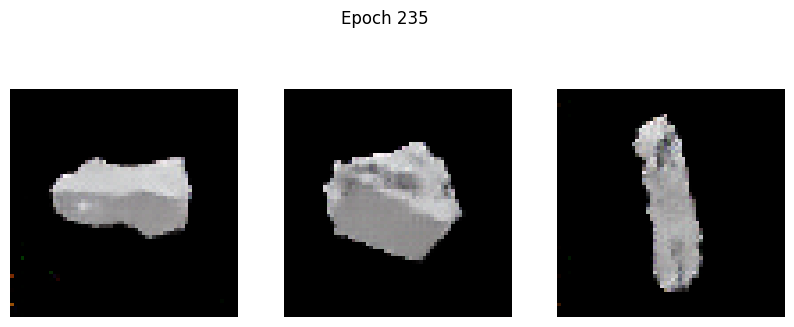

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -7.2941 - g_loss: 2.3946
Epoch 236/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -7.1249 - g_loss: 2.2663

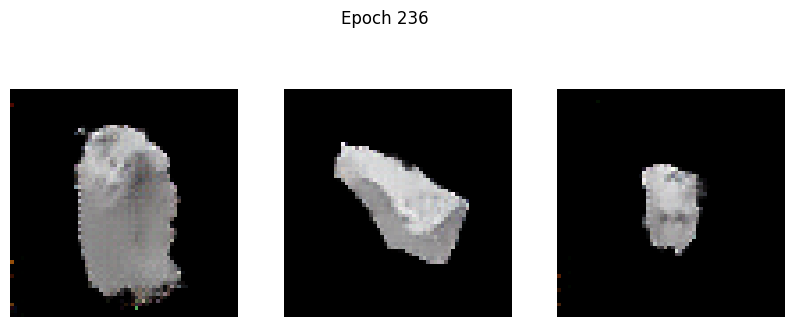

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -7.1301 - g_loss: 2.2671
Epoch 237/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -6.6456 - g_loss: 2.3565

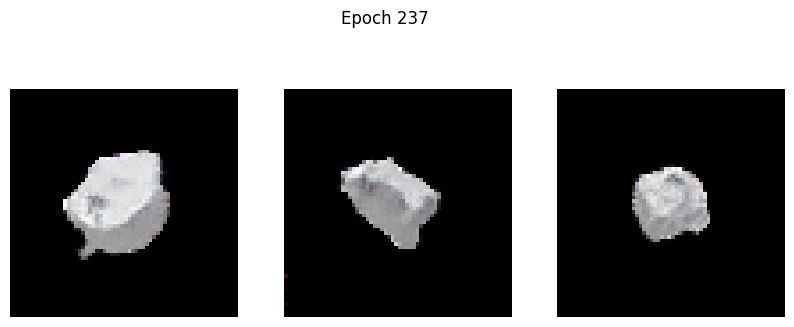

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -6.6528 - g_loss: 2.3569
Epoch 238/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -7.1868 - g_loss: 2.3503

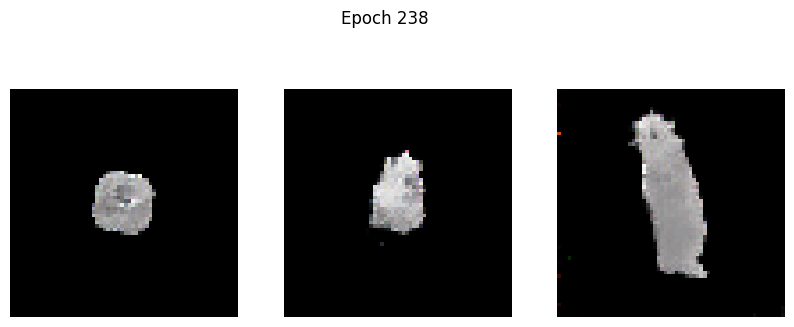

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - d_loss: -7.1850 - g_loss: 2.3502
Epoch 239/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -6.9892 - g_loss: 2.3905

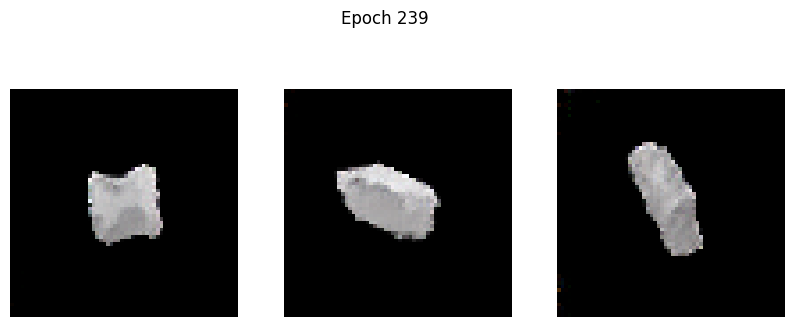

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -6.9943 - g_loss: 2.3904
Epoch 240/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -7.3689 - g_loss: 2.5167

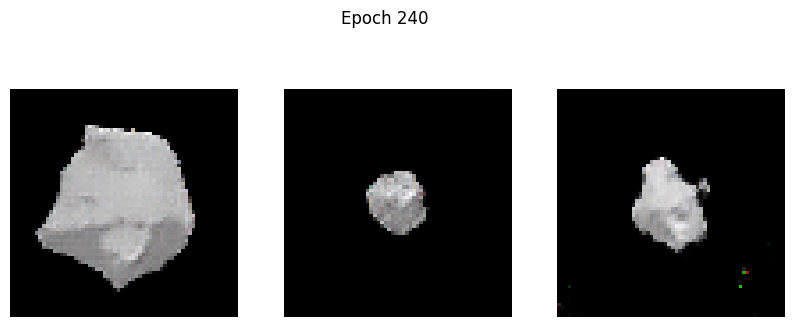

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -7.3842 - g_loss: 2.5159
Epoch 241/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -7.9513 - g_loss: 2.2242

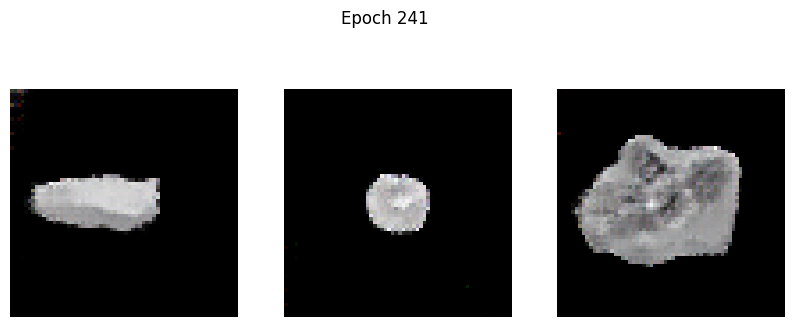

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -7.9606 - g_loss: 2.2251
Epoch 242/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -9.4249 - g_loss: 2.2431

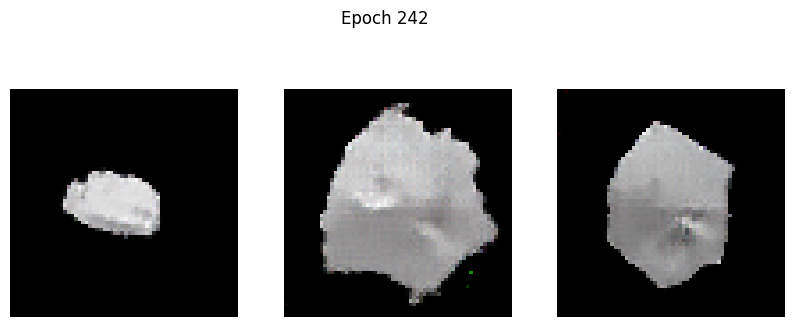

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -9.4323 - g_loss: 2.2432
Epoch 243/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -9.7517 - g_loss: 2.3442

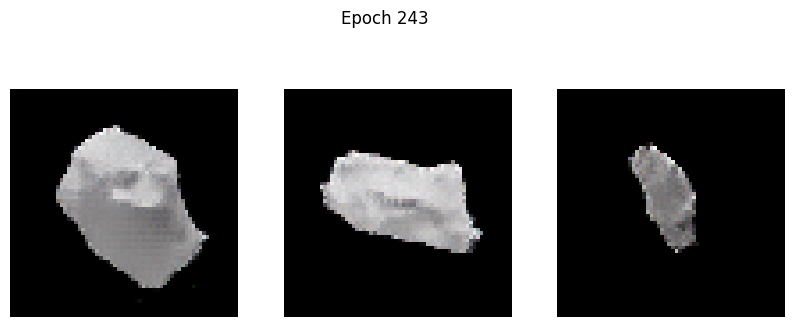

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -9.7555 - g_loss: 2.3457
Epoch 244/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -8.7064 - g_loss: 3.3483

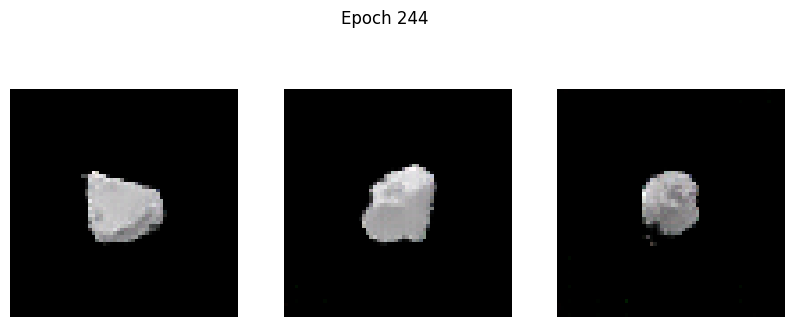

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -8.7152 - g_loss: 3.3499
Epoch 245/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -9.5179 - g_loss: 3.0273

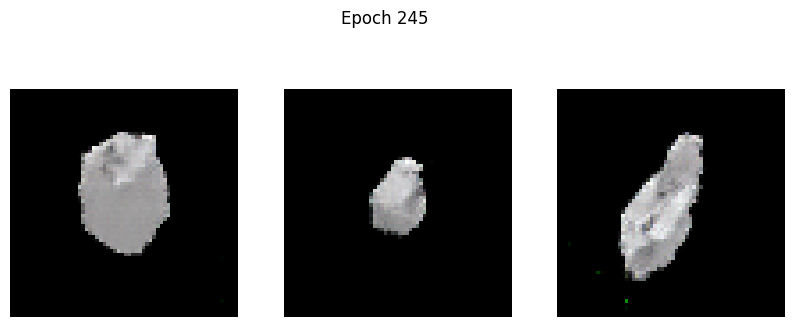

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -9.5609 - g_loss: 3.0251
Epoch 246/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -11.1791 - g_loss: 3.2376

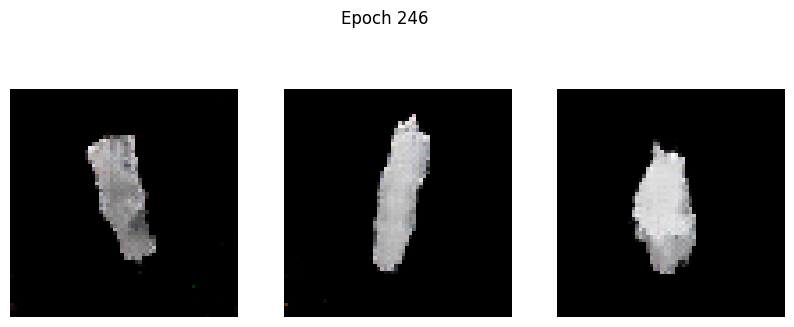

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -11.1752 - g_loss: 3.2384
Epoch 247/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -12.3283 - g_loss: 3.3355

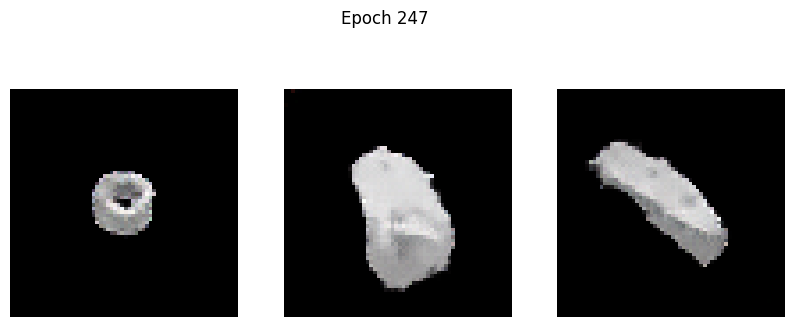

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -12.3154 - g_loss: 3.3339
Epoch 248/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -10.5384 - g_loss: 3.0538

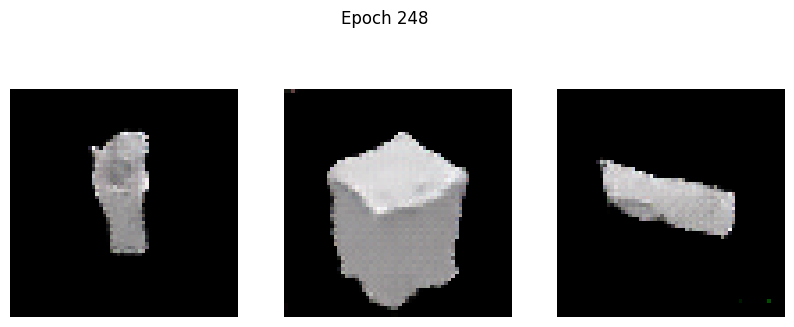

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -10.5341 - g_loss: 3.0569
Epoch 249/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -11.3197 - g_loss: 3.2511

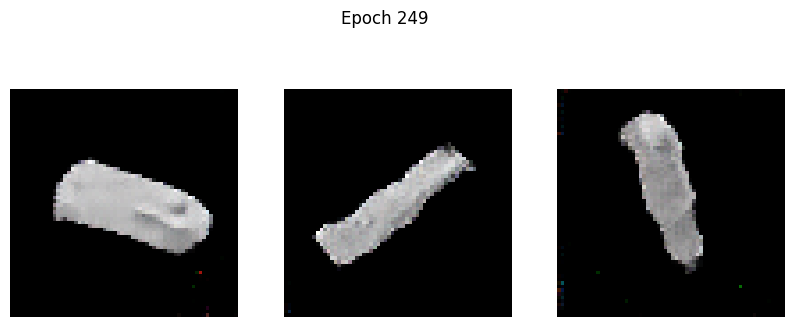

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -11.3386 - g_loss: 3.2499
Epoch 250/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -11.5053 - g_loss: 3.2396

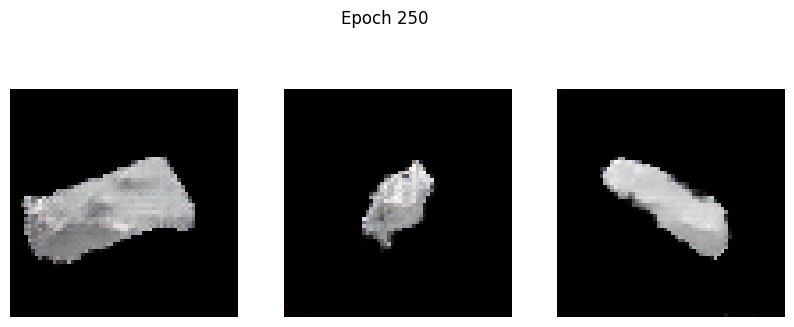

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -11.4995 - g_loss: 3.2473
Epoch 251/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -18.4238 - g_loss: 3.5403

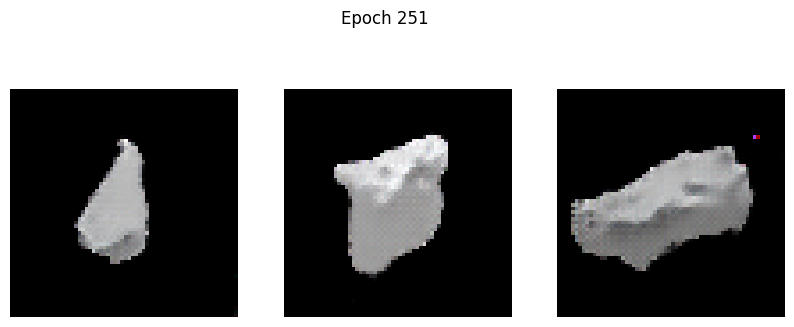

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -18.3923 - g_loss: 3.5383
Epoch 252/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -12.6469 - g_loss: 3.2125

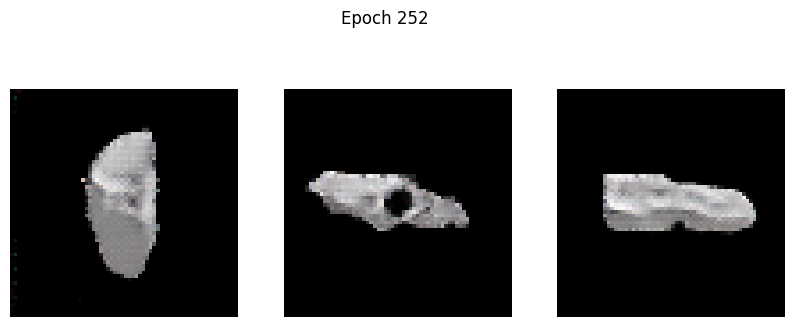

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -12.6424 - g_loss: 3.2142
Epoch 253/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -16.5347 - g_loss: 3.5016

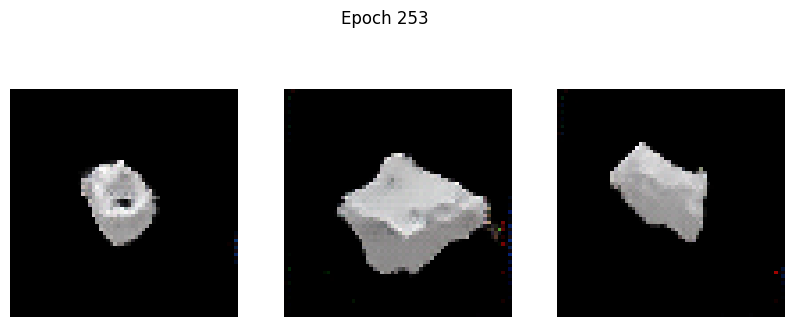

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -16.5257 - g_loss: 3.5011
Epoch 254/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -12.7025 - g_loss: 3.6645

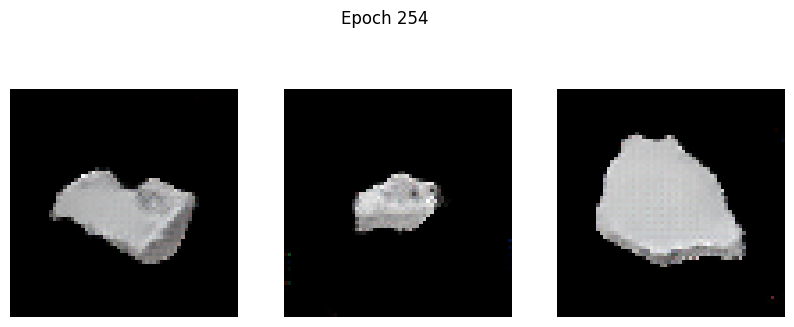

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -12.6991 - g_loss: 3.6649
Epoch 255/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -14.2867 - g_loss: 3.3305

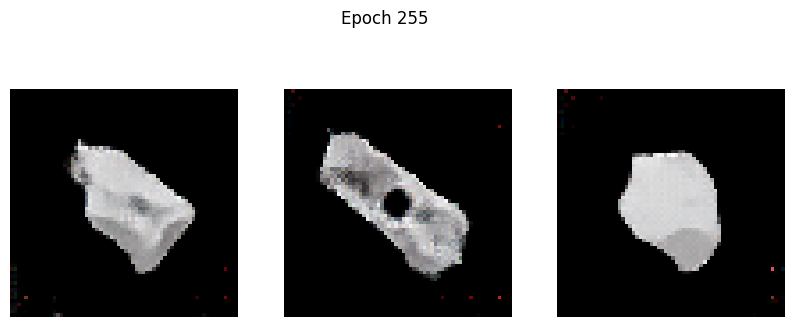

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -14.2862 - g_loss: 3.3303
Epoch 256/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -13.2678 - g_loss: 4.6368

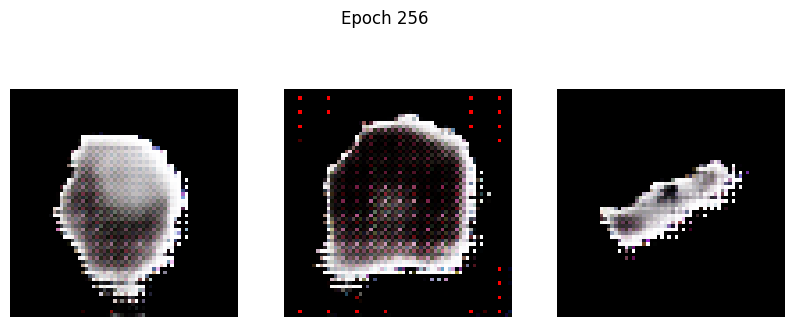

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -13.1480 - g_loss: 4.7315
Epoch 257/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -7.4210 - g_loss: 17.5372

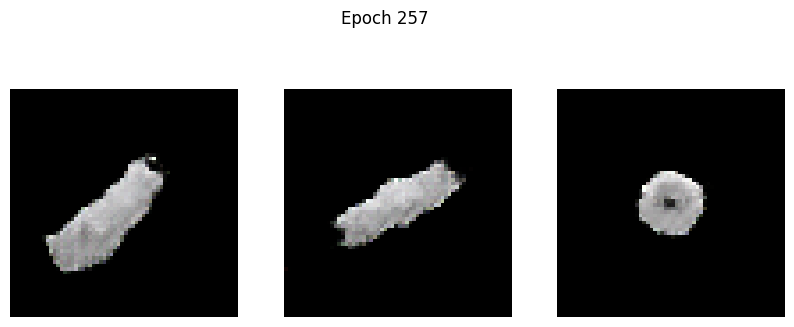

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -7.4406 - g_loss: 17.4680
Epoch 258/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -16.5837 - g_loss: 4.4932

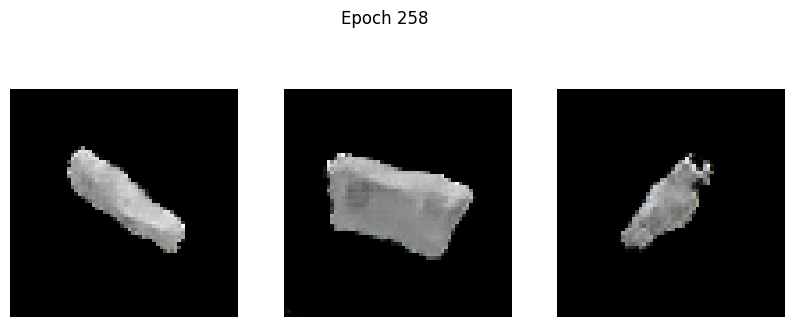

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -16.5979 - g_loss: 4.4877
Epoch 259/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -16.1291 - g_loss: 3.5596

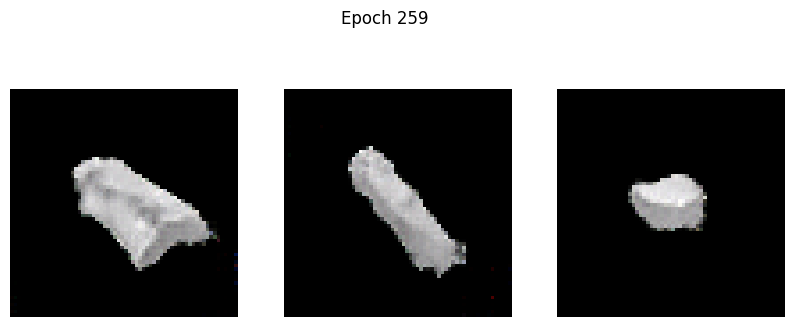

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -16.1419 - g_loss: 3.5600
Epoch 260/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 10.0858 - g_loss: 11.2008

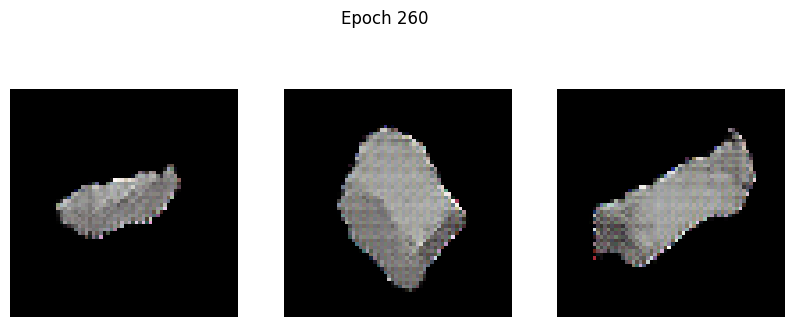

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 10.2298 - g_loss: 11.2470
Epoch 261/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -9.8766 - g_loss: 5.8612

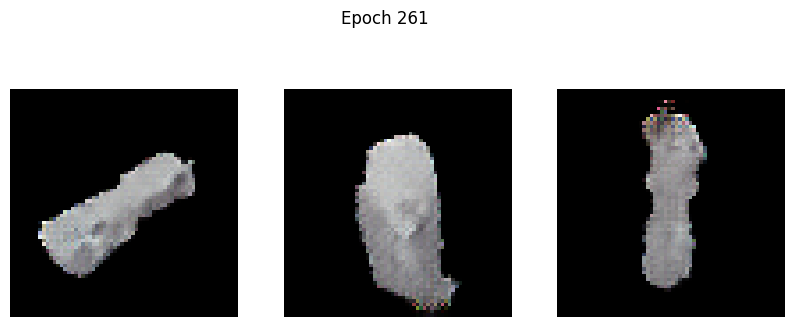

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -9.8998 - g_loss: 5.8559
Epoch 262/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -14.5379 - g_loss: 3.6586

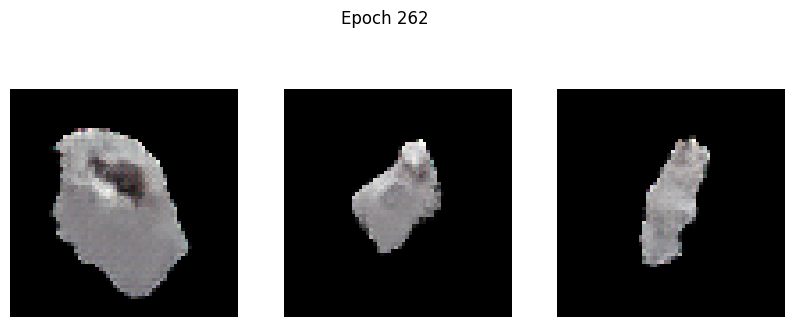

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -14.5348 - g_loss: 3.6590
Epoch 263/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -17.0731 - g_loss: 3.1650

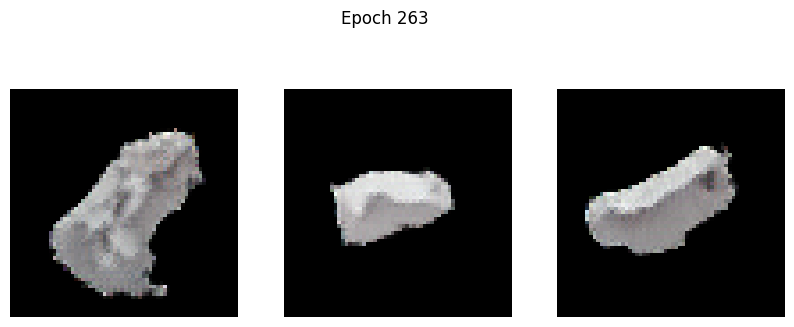

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -17.0698 - g_loss: 3.1657
Epoch 264/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -16.0449 - g_loss: 3.1559

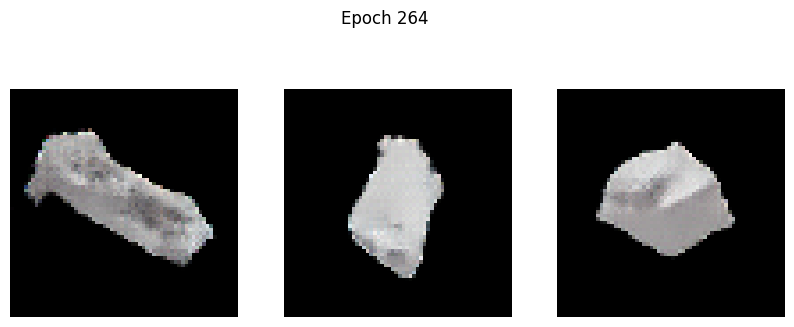

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -16.0471 - g_loss: 3.1569
Epoch 265/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -19.7798 - g_loss: 3.2437

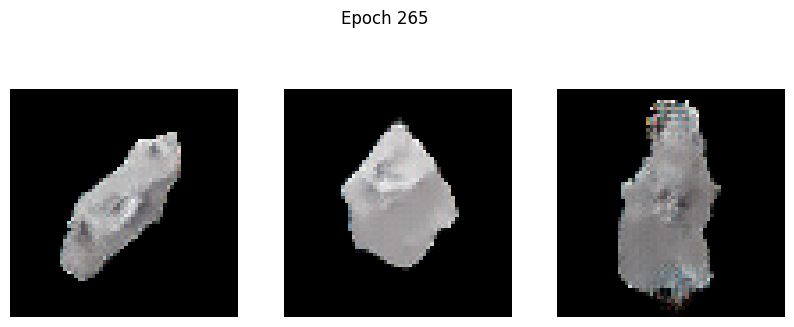

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -19.7558 - g_loss: 3.2459
Epoch 266/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -17.9459 - g_loss: 4.1072

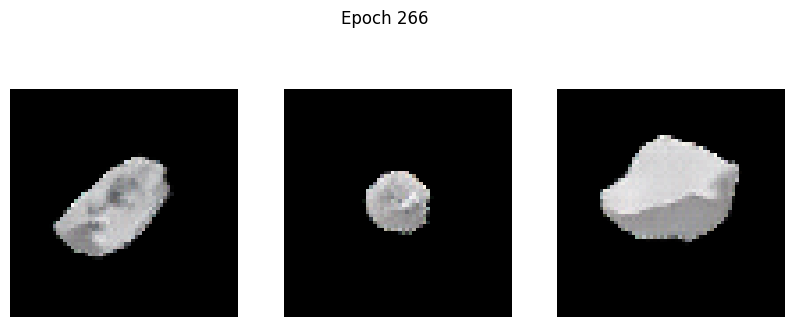

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -17.9490 - g_loss: 4.1065
Epoch 267/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -18.4090 - g_loss: 3.9767

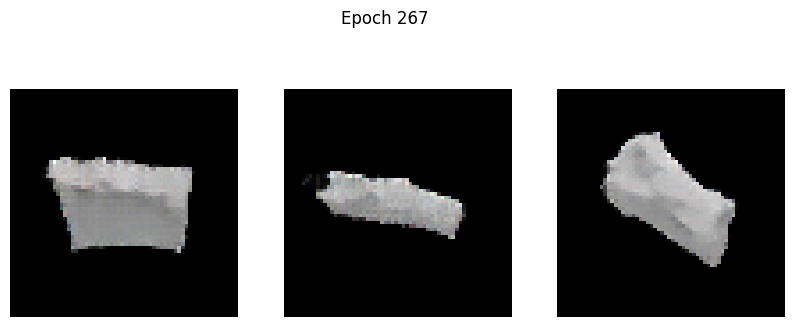

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -18.4180 - g_loss: 3.9758
Epoch 268/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -16.0977 - g_loss: 4.4663

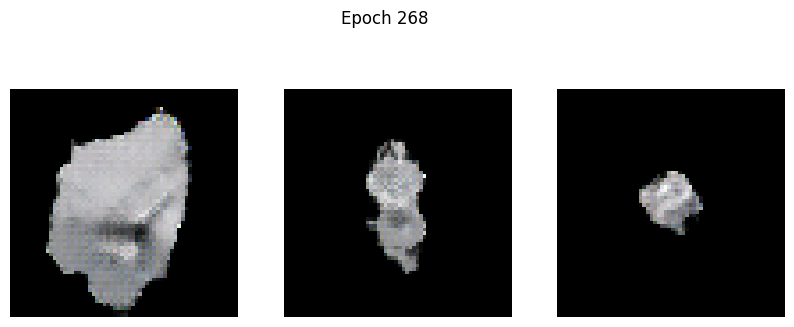

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -16.0813 - g_loss: 4.4666
Epoch 269/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -18.1296 - g_loss: 3.7982

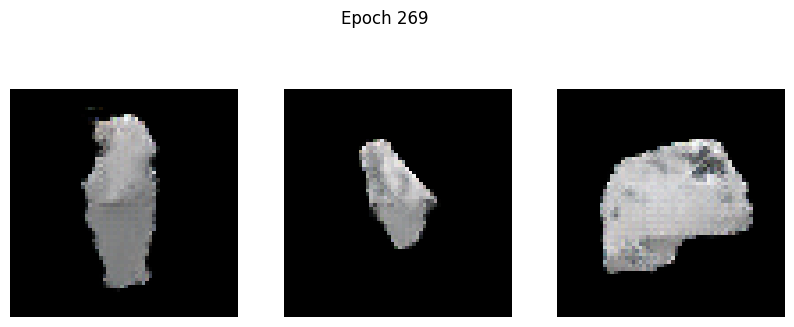

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -18.1664 - g_loss: 3.7957
Epoch 270/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -21.9132 - g_loss: 3.4214

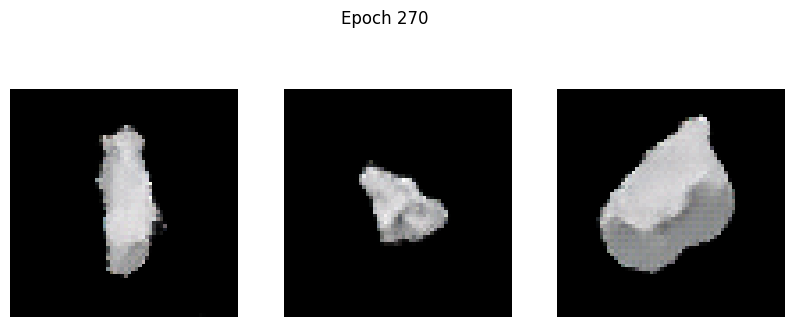

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -21.8939 - g_loss: 3.4240
Epoch 271/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -22.0292 - g_loss: 3.4130

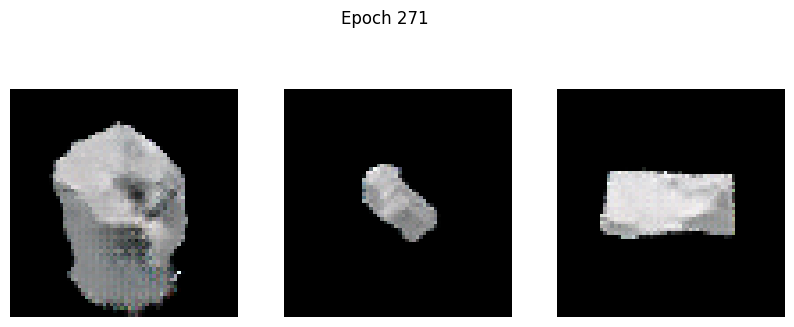

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -22.0205 - g_loss: 3.4142
Epoch 272/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -19.2853 - g_loss: 4.4318

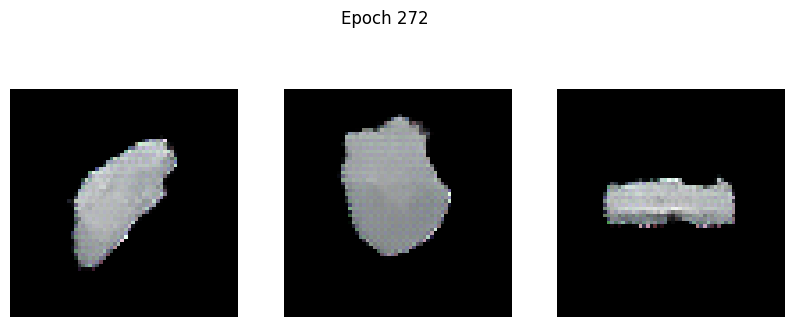

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -19.2128 - g_loss: 4.4506
Epoch 273/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -27.2303 - g_loss: 4.0347

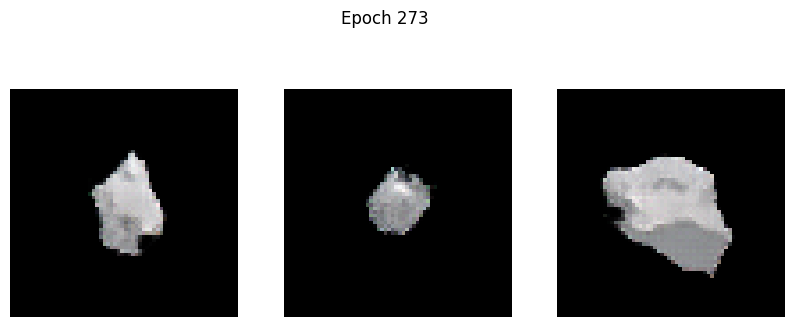

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -27.1919 - g_loss: 4.0324
Epoch 274/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -24.0207 - g_loss: 3.7444

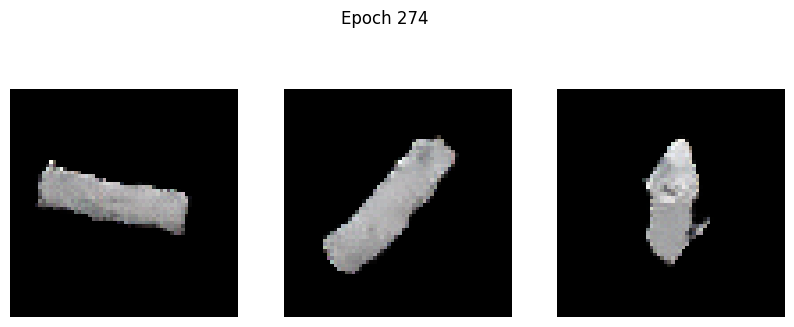

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -24.0454 - g_loss: 3.7437
Epoch 275/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -25.3712 - g_loss: 4.9235

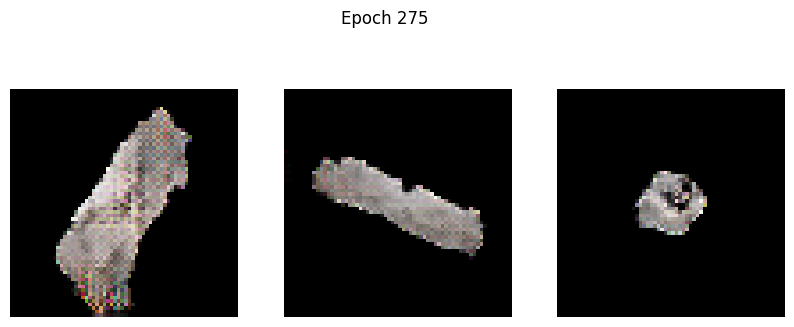

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -25.3064 - g_loss: 4.9364
Epoch 276/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -20.3869 - g_loss: 6.1709

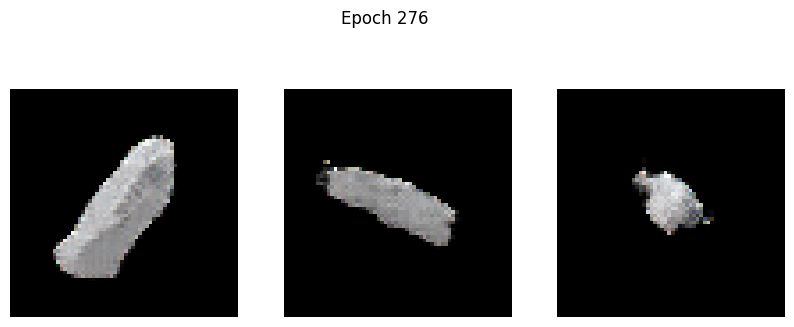

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -20.4597 - g_loss: 6.1581
Epoch 277/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -28.1788 - g_loss: 3.5693

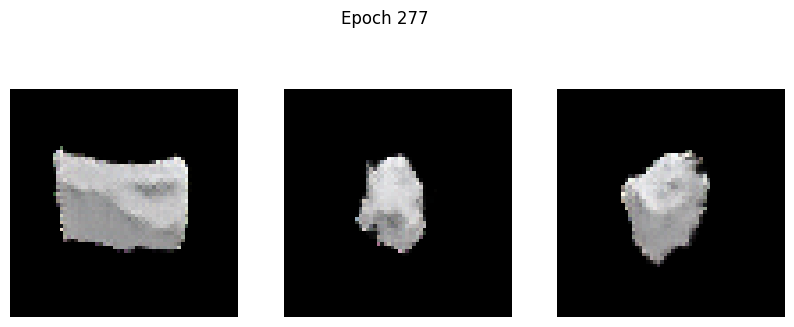

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -28.1800 - g_loss: 3.5697
Epoch 278/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -24.8292 - g_loss: 5.4093

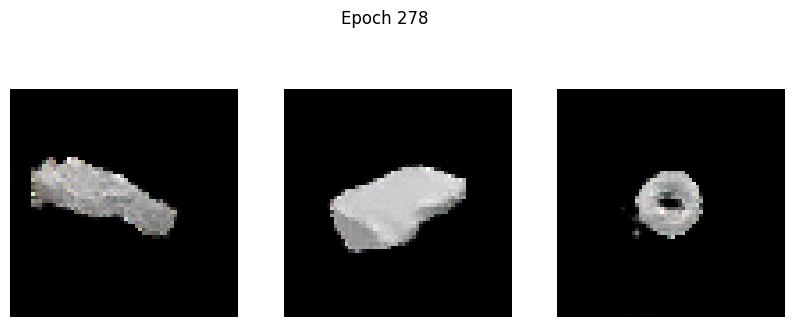

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -24.8538 - g_loss: 5.4009
Epoch 279/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -34.4679 - g_loss: 3.7831

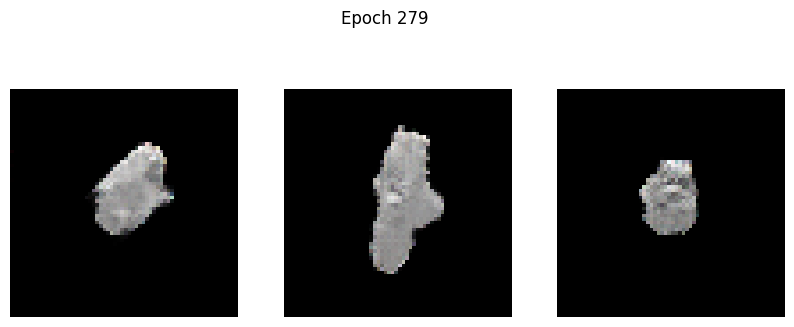

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -34.4663 - g_loss: 3.7831
Epoch 280/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -29.8125 - g_loss: 5.2509

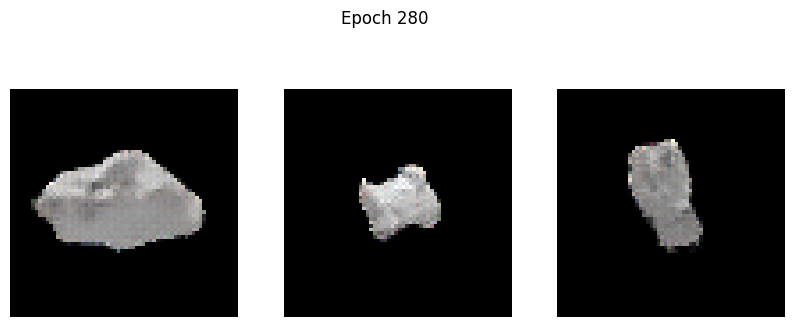

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -29.8176 - g_loss: 5.2503
Epoch 281/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -31.5031 - g_loss: 6.1872

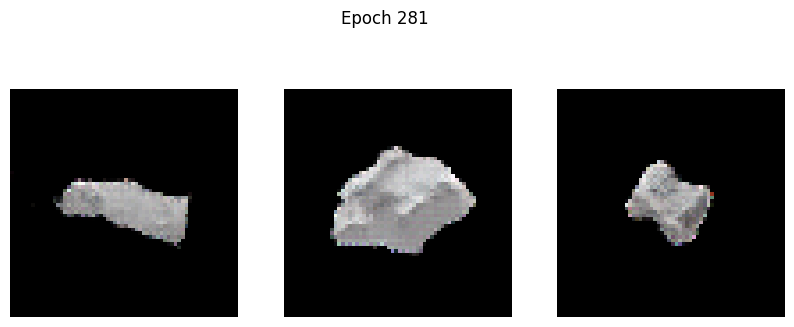

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -31.4692 - g_loss: 6.1851
Epoch 282/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -1.4648 - g_loss: 9.5281

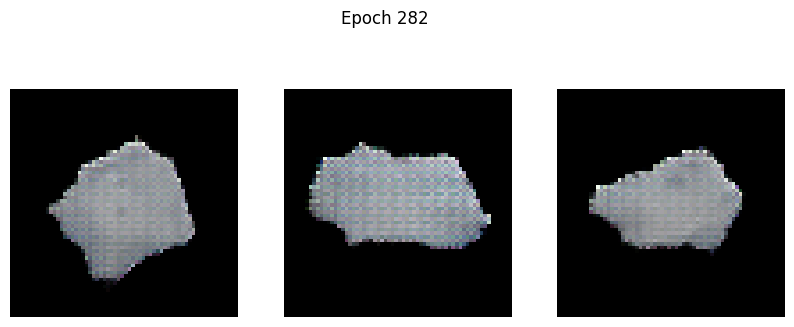

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -1.3006 - g_loss: 9.5672
Epoch 283/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -34.1943 - g_loss: 5.6744

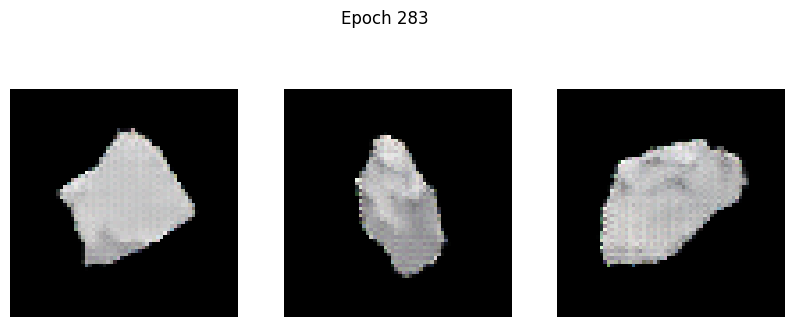

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -34.1804 - g_loss: 5.6672
Epoch 284/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -36.6051 - g_loss: 4.0588

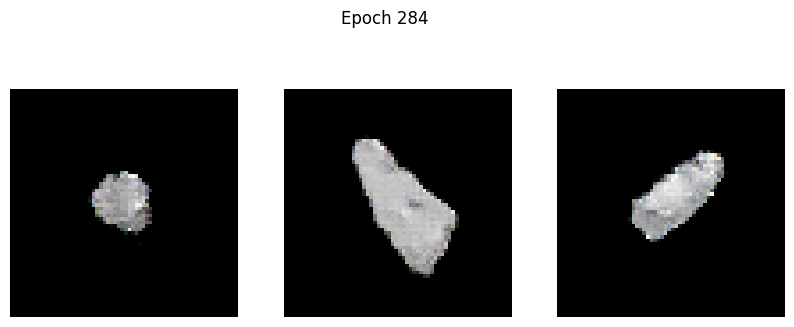

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -36.6105 - g_loss: 4.0581
Epoch 285/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: -42.5158 - g_loss: 3.7342

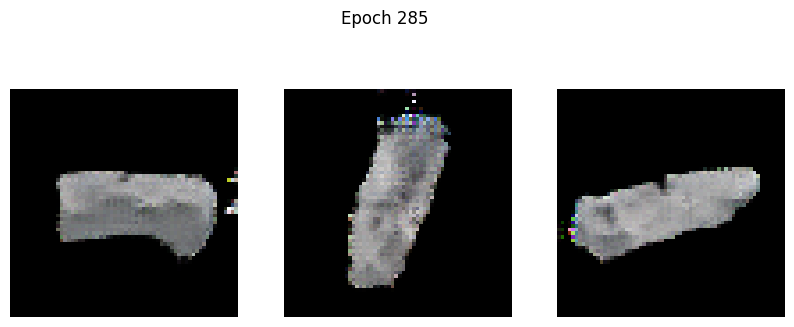

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -42.4754 - g_loss: 3.7350
Epoch 286/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -46.1439 - g_loss: 4.2940

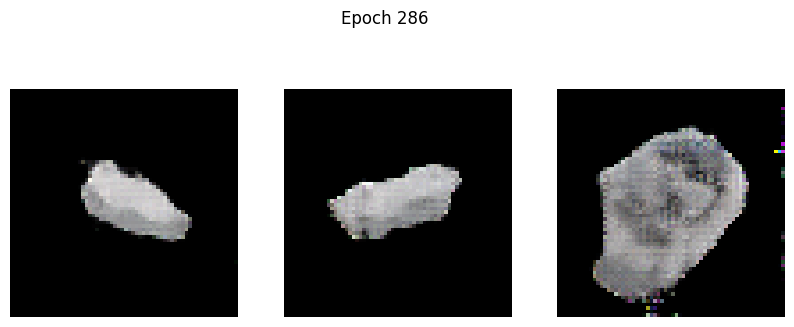

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: -46.0709 - g_loss: 4.2941
Epoch 287/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 235.4508 - g_loss: 21.0755

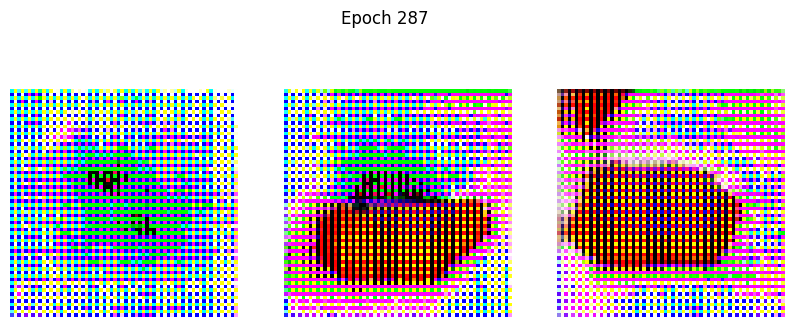

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 265.9986 - g_loss: 21.9799
Epoch 288/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 5820.5044 - g_loss: 8857.6416

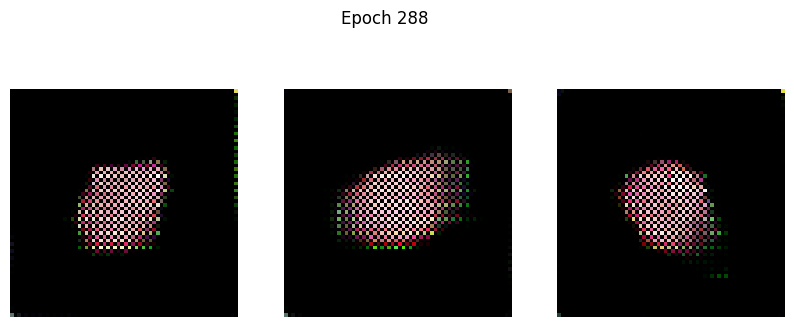

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 5780.3706 - g_loss: 8819.3574
Epoch 289/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 374.2518 - g_loss: 1575.8057

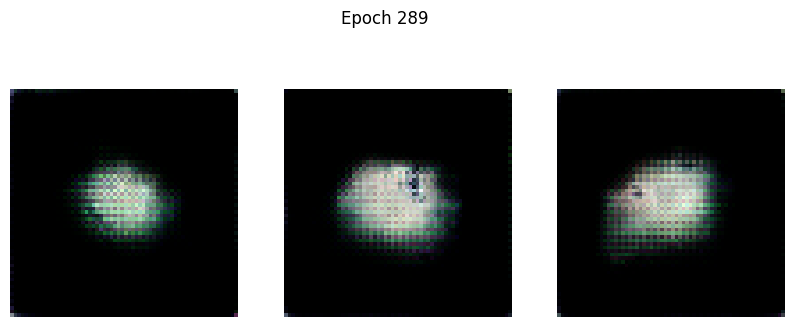

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 375.6035 - g_loss: 1571.0234
Epoch 290/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - d_loss: 519.8423 - g_loss: 135.5339

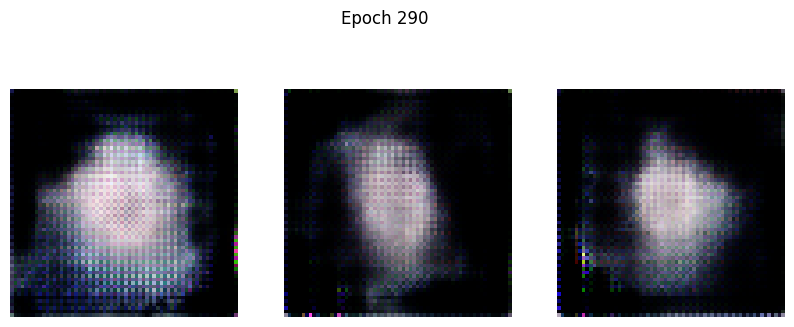

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 519.2506 - g_loss: 135.6843
Epoch 291/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - d_loss: 248.1993 - g_loss: 53.4006

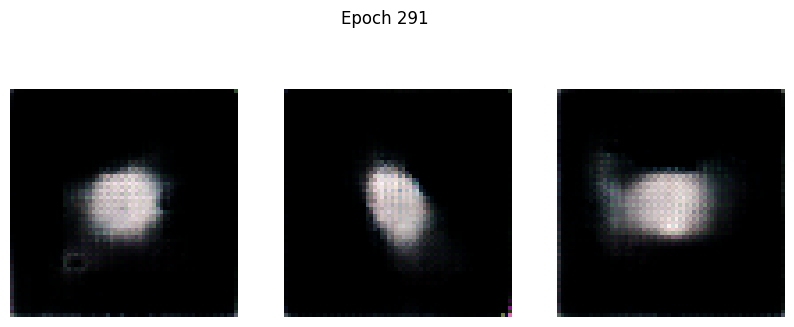

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - d_loss: 248.2074 - g_loss: 54.0584
Epoch 292/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 228.9903 - g_loss: 145.2188

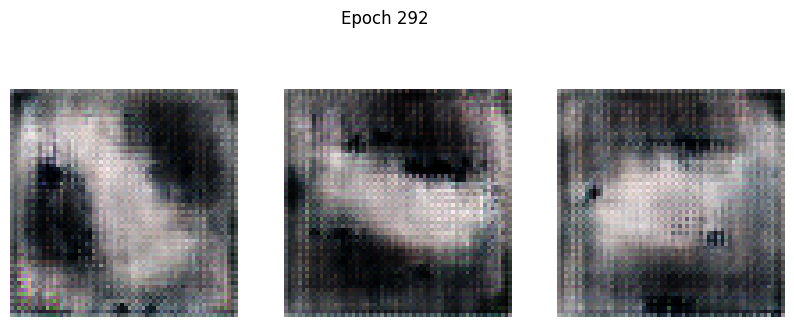

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 228.5673 - g_loss: 144.6214
Epoch 293/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 118.8566 - g_loss: 19.6481

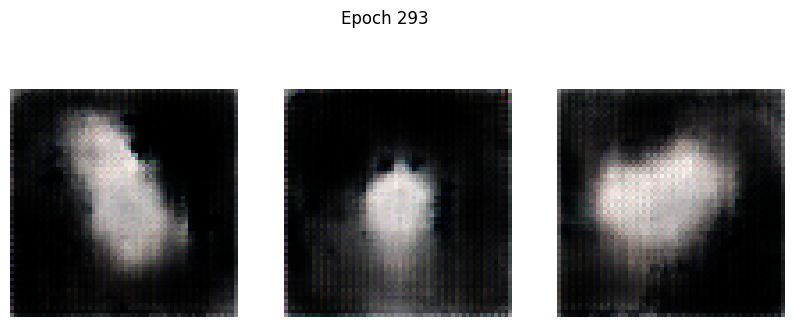

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 118.9461 - g_loss: 20.0140
Epoch 294/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 141.9106 - g_loss: 82.4566

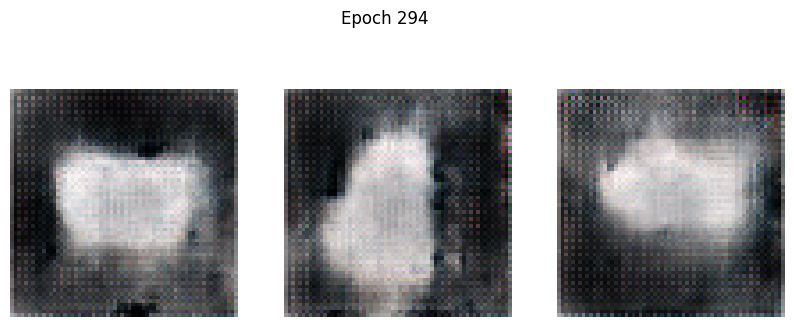

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 141.7266 - g_loss: 82.2874
Epoch 295/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 102.4755 - g_loss: 60.6576

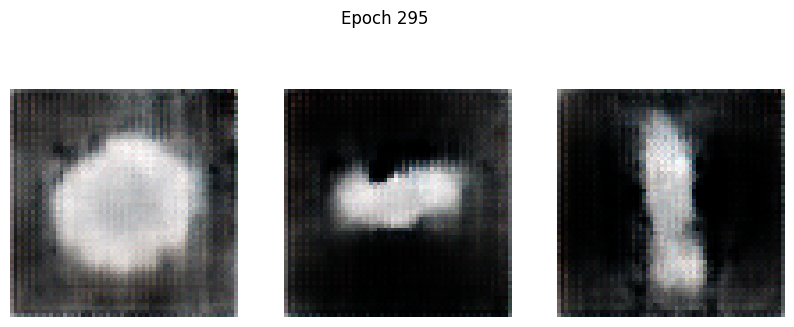

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 102.4568 - g_loss: 60.6348
Epoch 296/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 92.8595 - g_loss: 56.2972

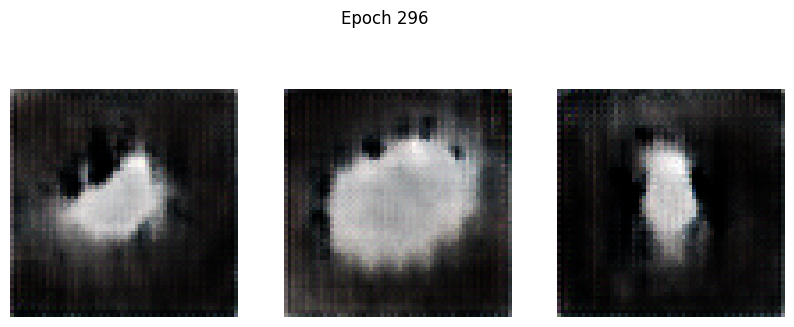

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 92.8081 - g_loss: 56.3199
Epoch 297/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 96.0507 - g_loss: 58.9623

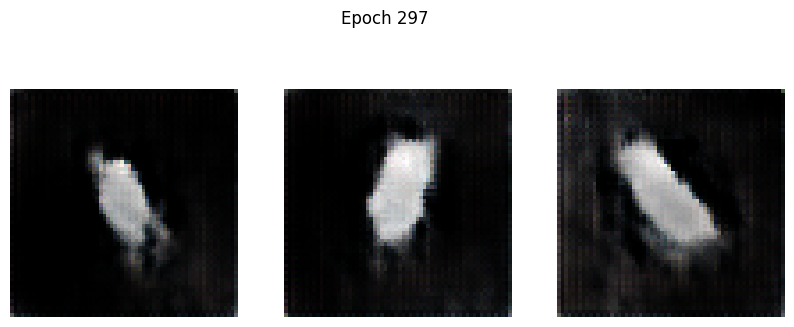

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 96.0450 - g_loss: 58.9625
Epoch 298/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 80.4831 - g_loss: 53.2461

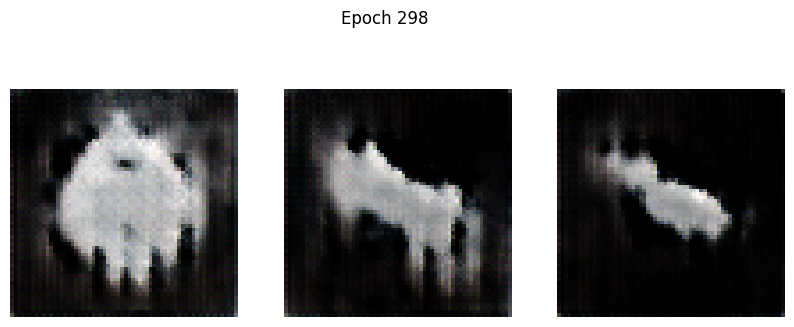

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 80.5996 - g_loss: 53.2321
Epoch 299/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 78.5926 - g_loss: 52.7276

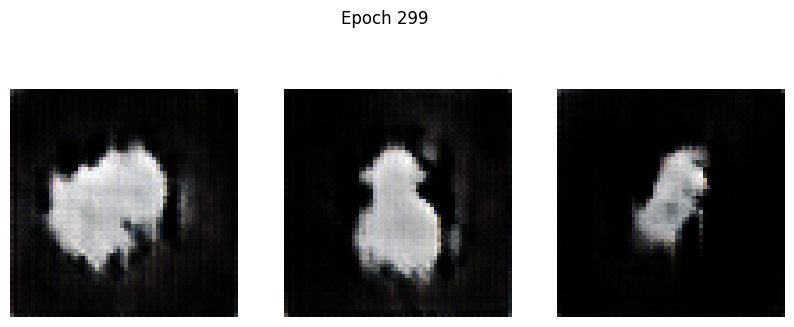

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 78.6007 - g_loss: 52.6813
Epoch 300/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 64.5617 - g_loss: 35.8739

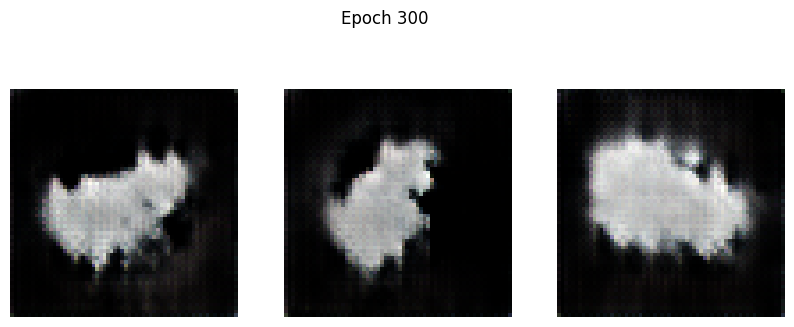

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 64.5975 - g_loss: 35.8901
Epoch 301/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 65.9992 - g_loss: 35.7259

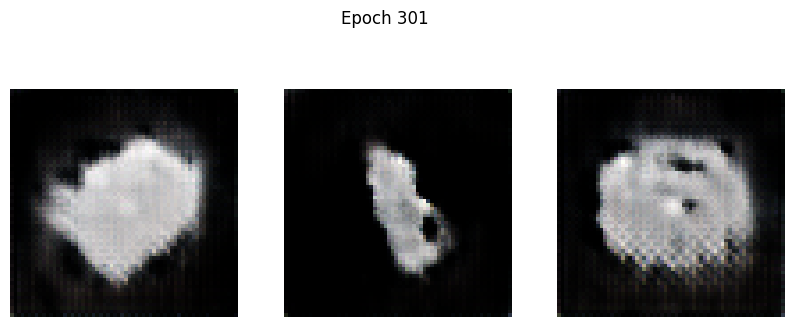

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 65.9799 - g_loss: 35.7423
Epoch 302/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 56.3474 - g_loss: 30.1691

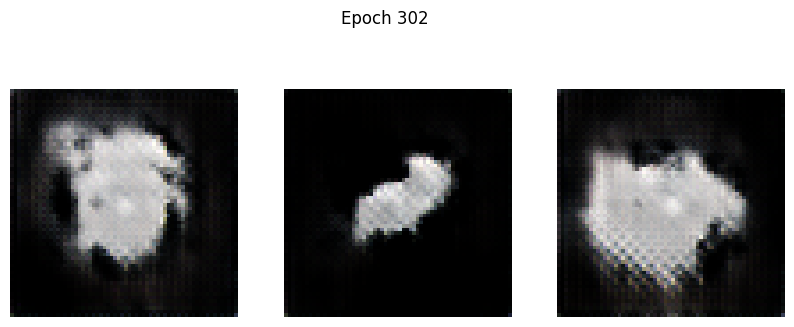

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 56.3574 - g_loss: 30.1988
Epoch 303/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 51.4700 - g_loss: 32.9604

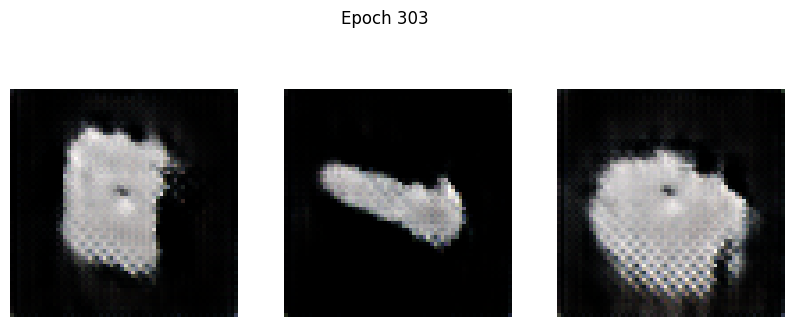

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 51.5035 - g_loss: 32.9472
Epoch 304/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 50.0870 - g_loss: 29.3273

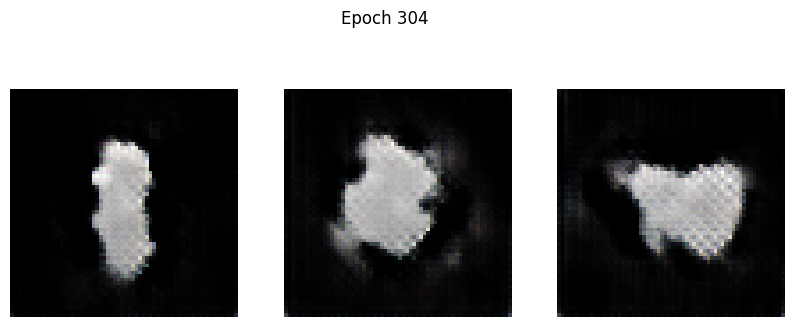

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 50.0785 - g_loss: 29.3466
Epoch 305/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 47.2567 - g_loss: 28.6376

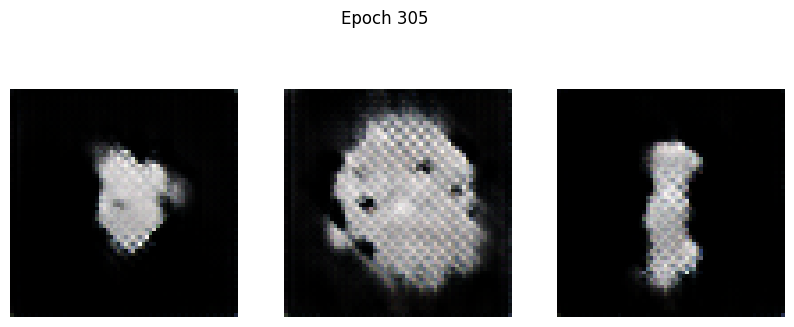

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 47.2535 - g_loss: 28.6384
Epoch 306/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 48.6266 - g_loss: 32.8462

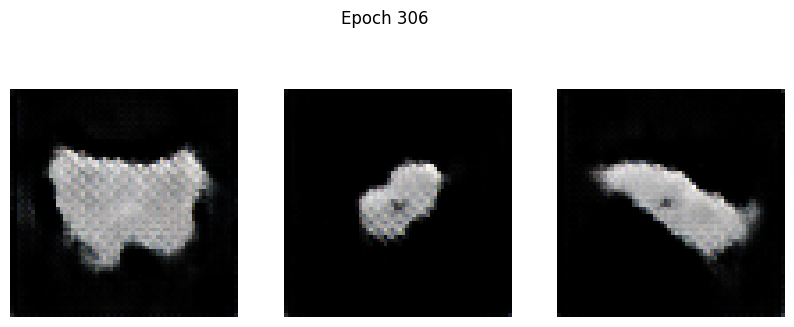

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 48.5919 - g_loss: 32.7947
Epoch 307/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 39.0953 - g_loss: 27.3587

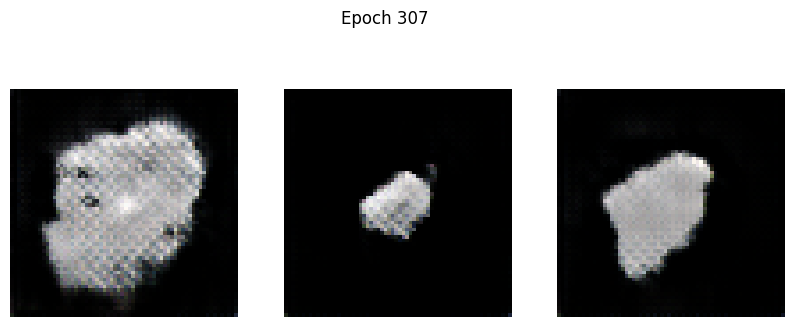

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 39.0976 - g_loss: 27.3556
Epoch 308/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 31.2932 - g_loss: 19.1378

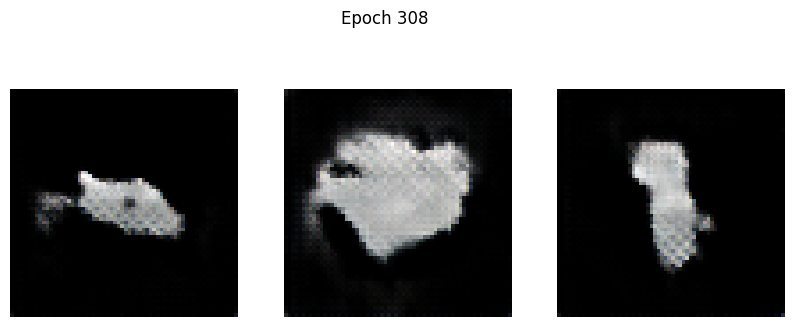

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 31.2917 - g_loss: 19.1441
Epoch 309/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 34.2199 - g_loss: 30.6836

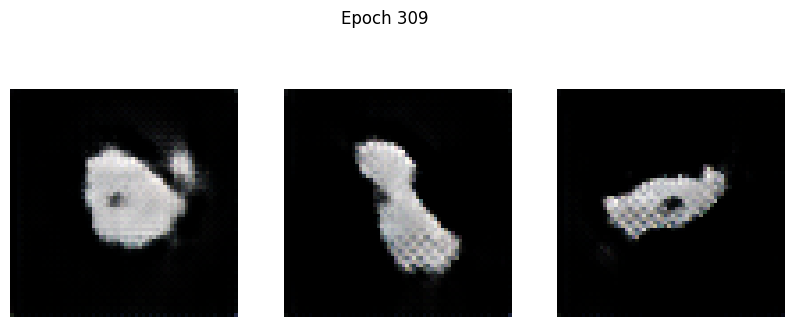

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 34.2362 - g_loss: 30.6642
Epoch 310/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 30.9563 - g_loss: 21.5619

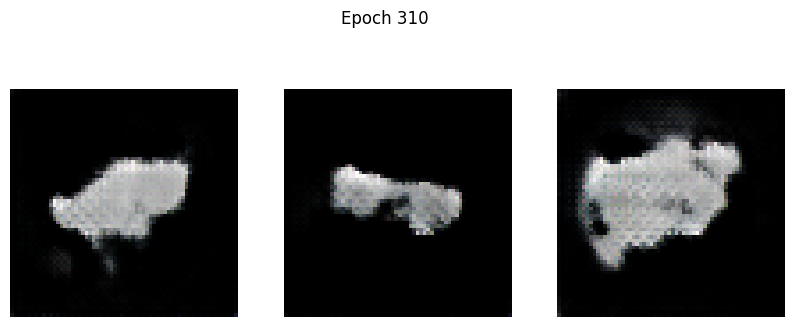

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: 30.9538 - g_loss: 21.5996
Epoch 311/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 26.5916 - g_loss: 14.9841

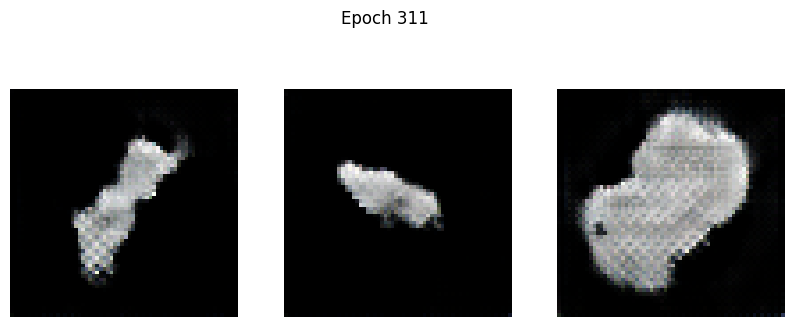

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 26.6114 - g_loss: 15.0365
Epoch 312/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 24.7979 - g_loss: 23.6899

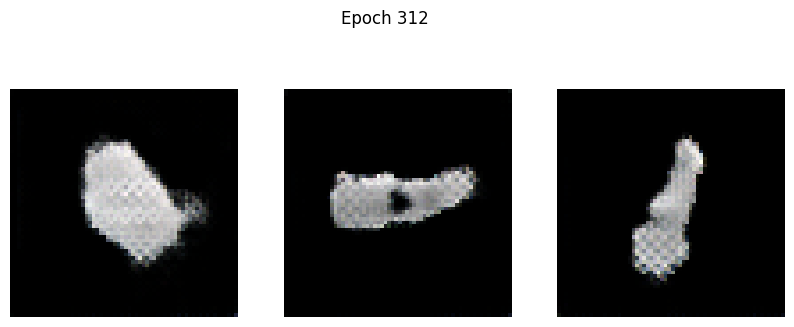

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 24.7958 - g_loss: 23.6614
Epoch 313/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 23.6427 - g_loss: 18.2161

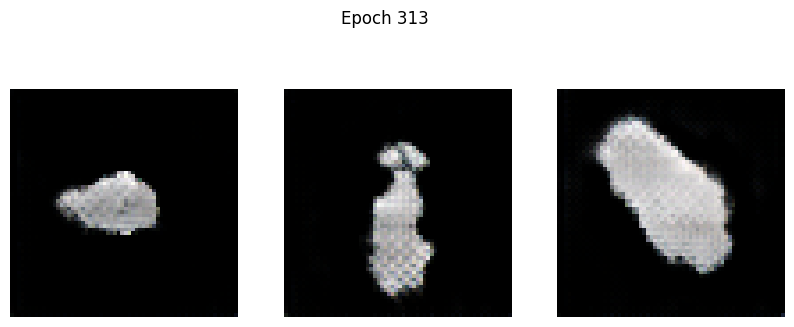

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 23.6467 - g_loss: 18.2477
Epoch 314/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 22.5538 - g_loss: 20.0593

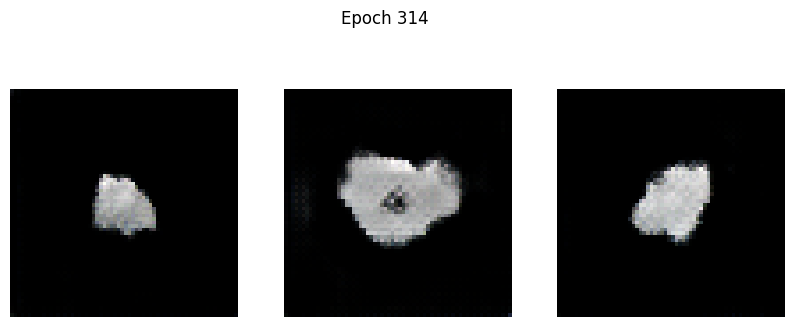

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 22.5294 - g_loss: 20.0638
Epoch 315/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 25.0695 - g_loss: 20.8151

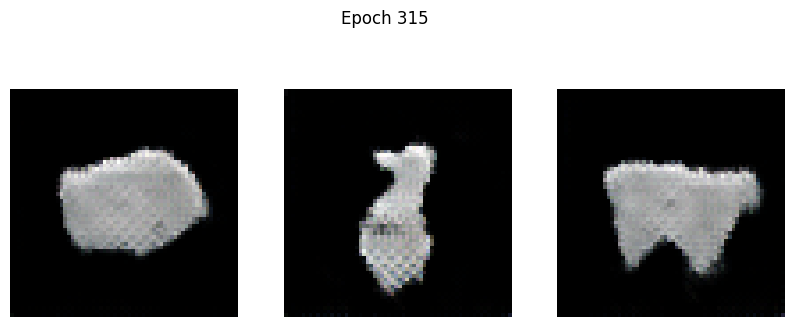

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 25.0643 - g_loss: 20.8339
Epoch 316/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 17.9767 - g_loss: 17.4919

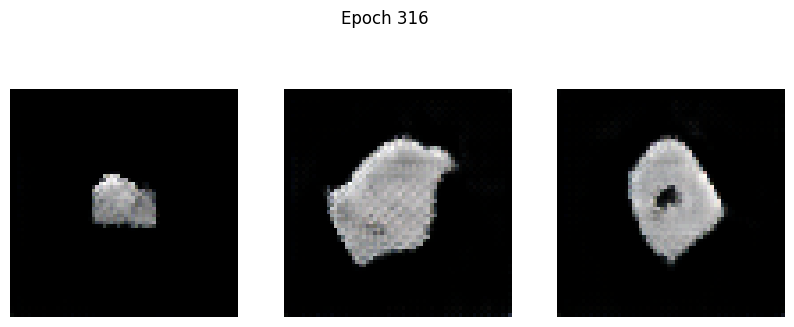

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 17.9828 - g_loss: 17.4989
Epoch 317/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 20.5723 - g_loss: 17.2173

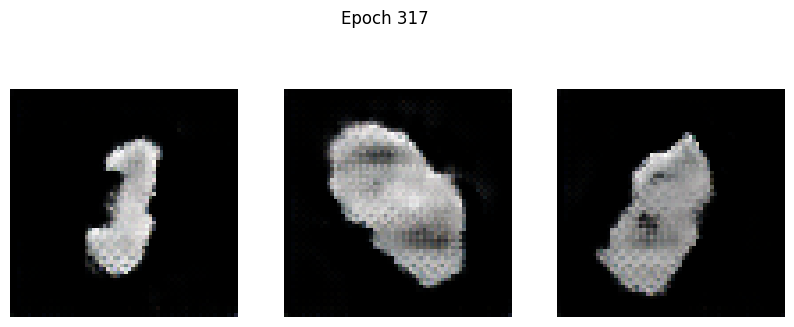

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 20.5779 - g_loss: 17.2308
Epoch 318/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 15.2249 - g_loss: 13.8652

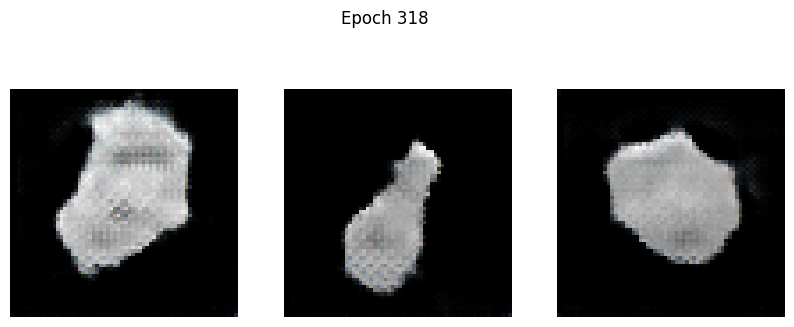

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 15.2240 - g_loss: 13.8899
Epoch 319/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 11.6664 - g_loss: 15.2048

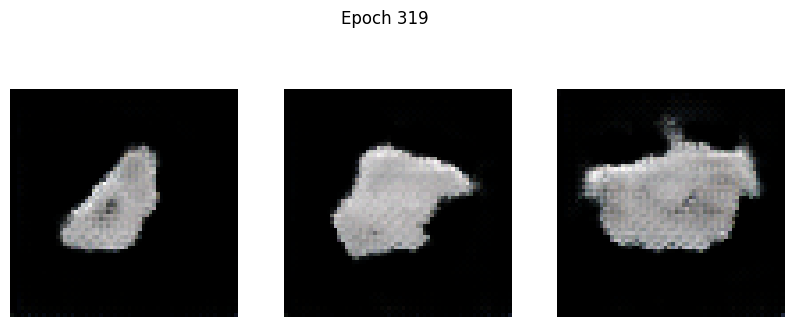

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 11.6887 - g_loss: 15.2069
Epoch 320/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 18.9722 - g_loss: 24.0580

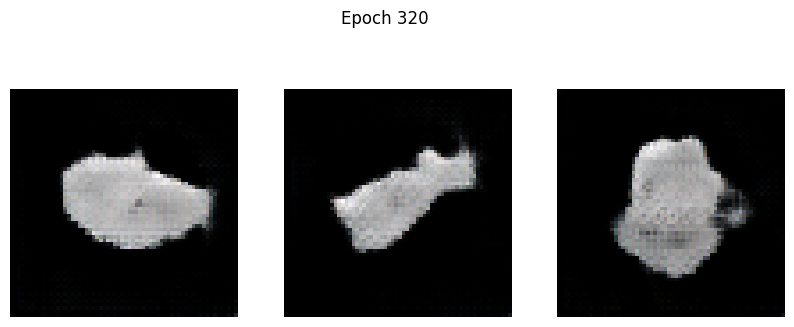

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 18.9517 - g_loss: 24.0168
Epoch 321/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 18.1383 - g_loss: 23.6181

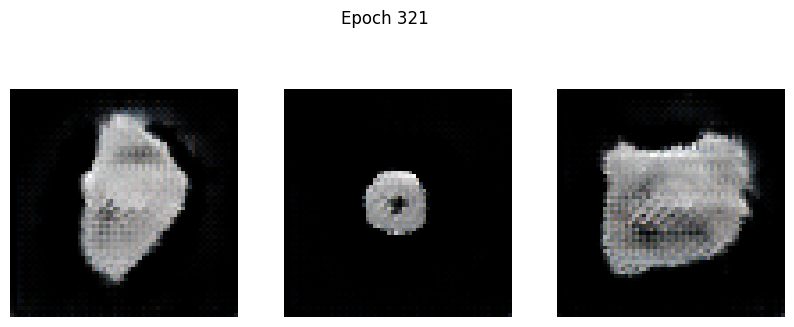

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 18.1090 - g_loss: 23.5621
Epoch 322/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 10.3119 - g_loss: 14.0212

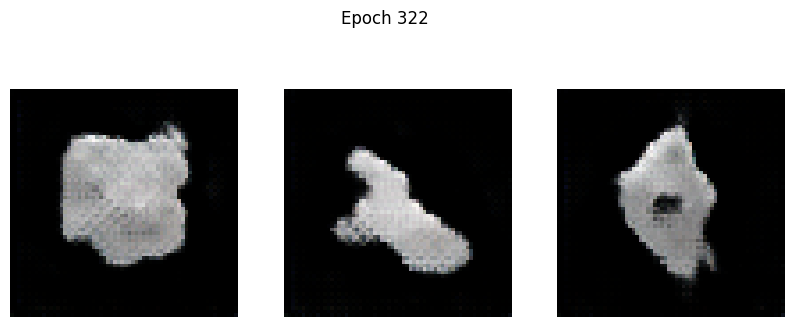

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 10.3253 - g_loss: 14.0287
Epoch 323/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 13.3194 - g_loss: 15.5800

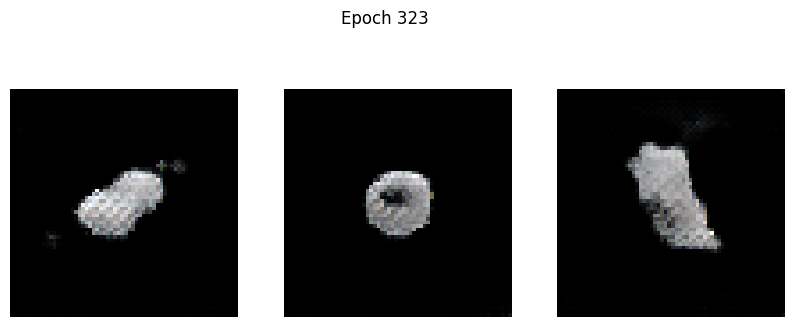

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 13.3216 - g_loss: 15.5903
Epoch 324/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 9.9512 - g_loss: 13.1033

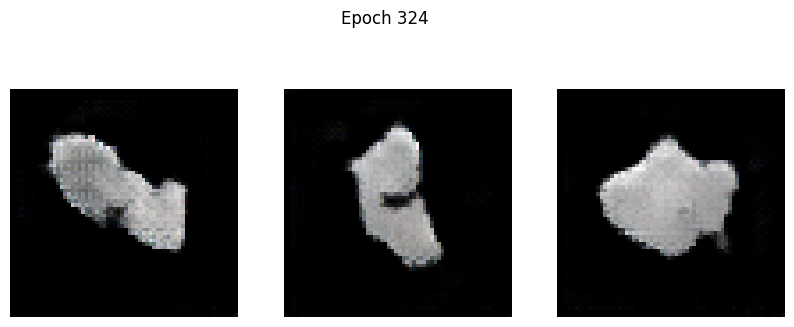

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 9.9417 - g_loss: 13.1030
Epoch 325/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 8.2785 - g_loss: 13.3981

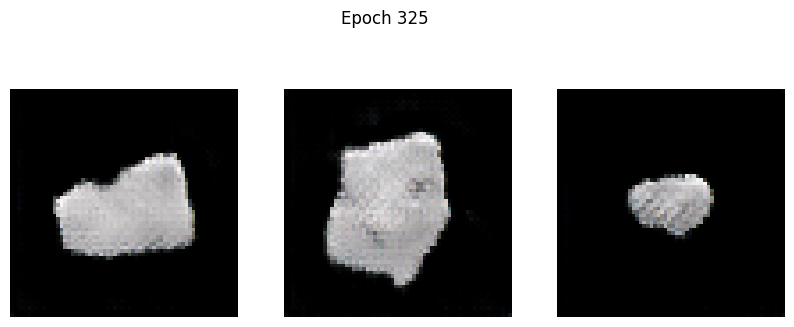

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 8.2844 - g_loss: 13.3981
Epoch 326/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 9.2098 - g_loss: 13.4409

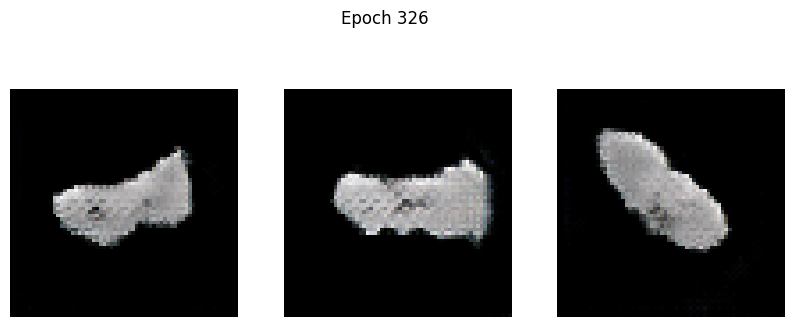

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 9.2032 - g_loss: 13.4345
Epoch 327/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 10.2984 - g_loss: 14.7762

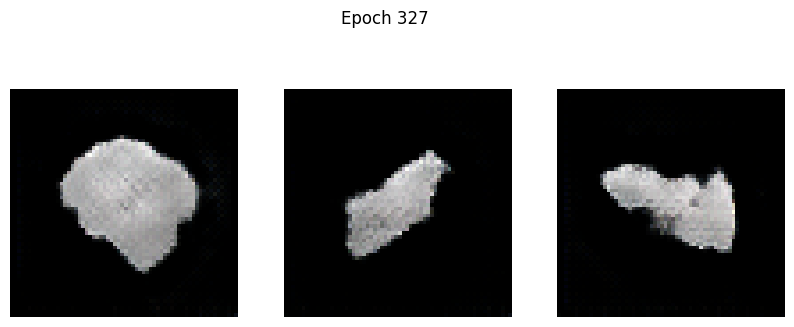

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 10.2841 - g_loss: 14.7701
Epoch 328/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 12.6958 - g_loss: 16.9973

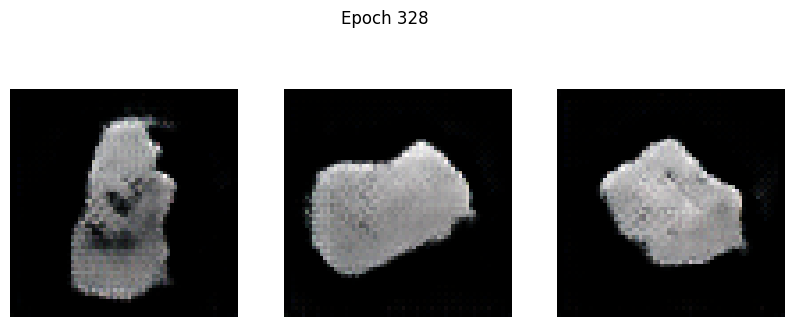

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 12.6635 - g_loss: 16.9750
Epoch 329/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 8.8135 - g_loss: 14.8037

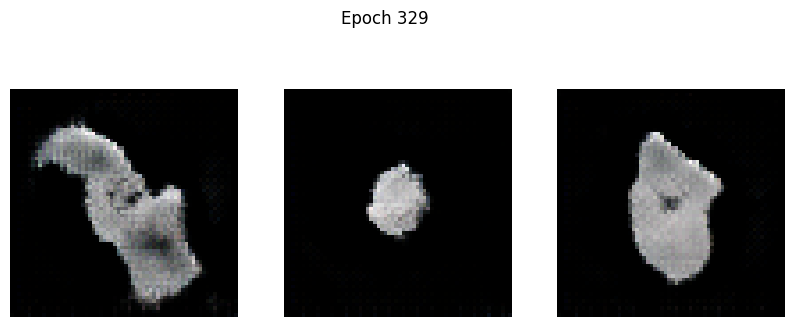

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 8.8146 - g_loss: 14.8085
Epoch 330/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 6.3605 - g_loss: 11.4984

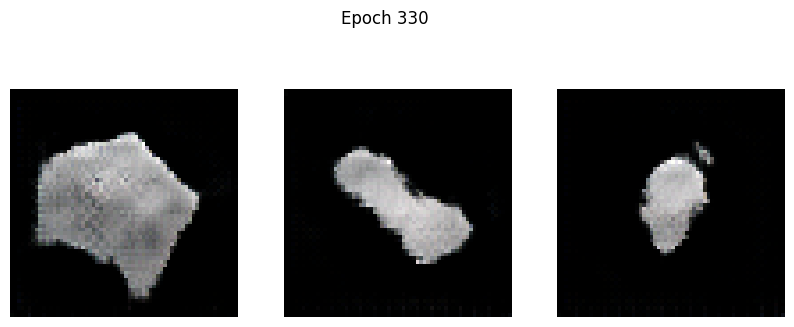

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 6.3546 - g_loss: 11.5127
Epoch 331/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 5.1948 - g_loss: 10.4738

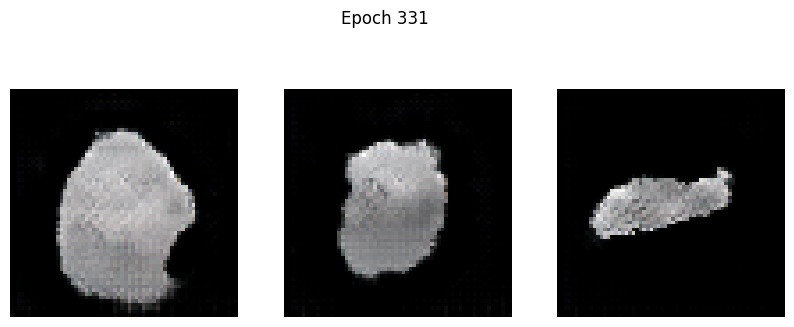

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 5.1697 - g_loss: 10.4763
Epoch 332/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 2.2814 - g_loss: 11.3670

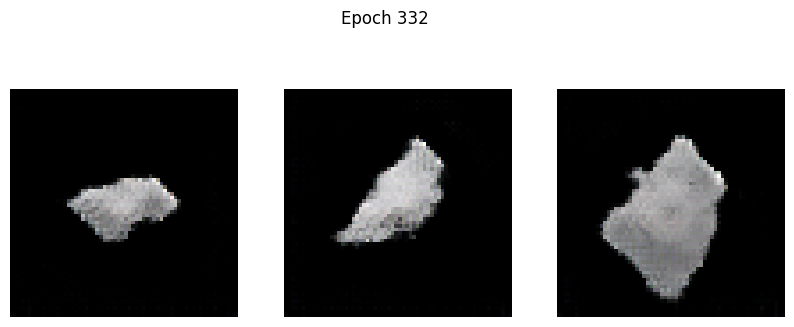

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 2.2667 - g_loss: 11.3440
Epoch 333/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 2.8205 - g_loss: 10.5543

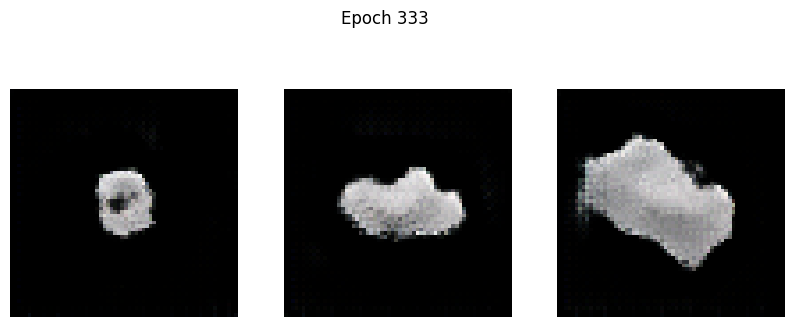

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 2.8324 - g_loss: 10.5612
Epoch 334/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 0.3587 - g_loss: 7.0598

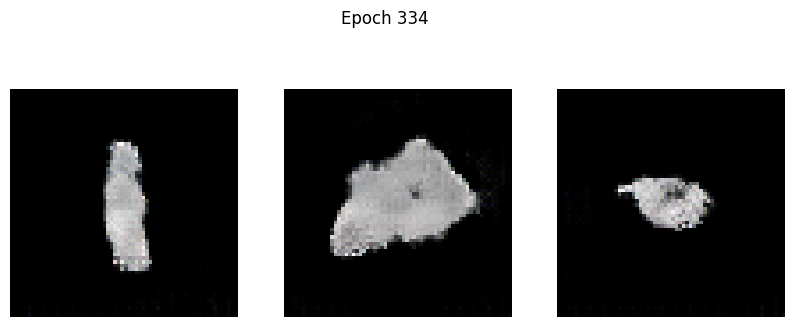

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 0.3492 - g_loss: 7.0694
Epoch 335/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 2.7875 - g_loss: 9.8240

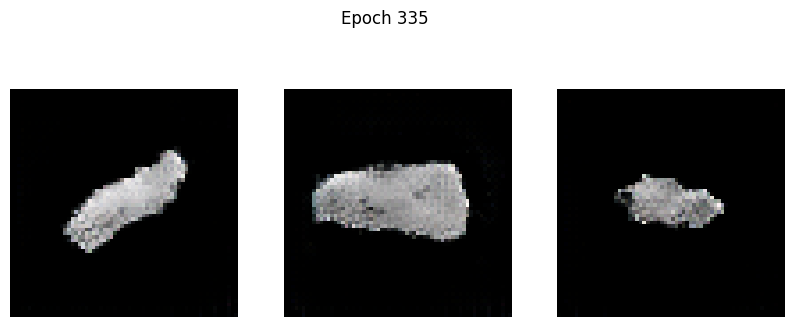

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 2.7712 - g_loss: 9.8206
Epoch 336/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -4.4544 - g_loss: 7.8963

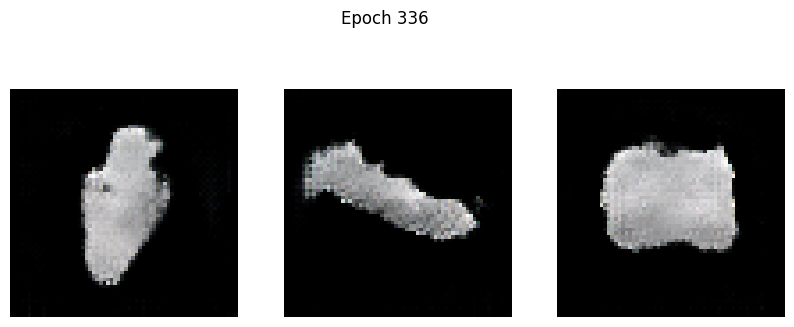

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -4.4341 - g_loss: 7.8898
Epoch 337/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -2.4743 - g_loss: 5.7067

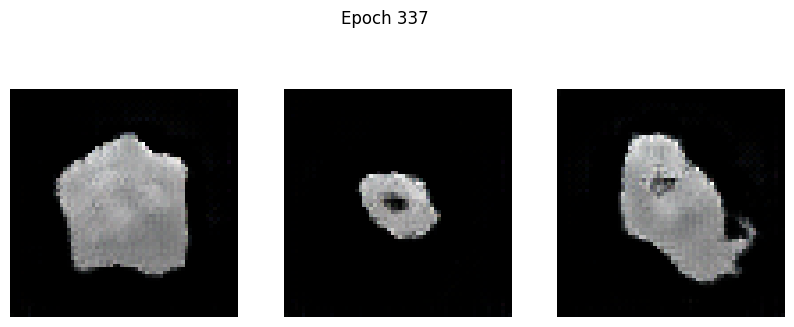

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -2.4874 - g_loss: 5.7113
Epoch 338/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -6.2699 - g_loss: 5.9941

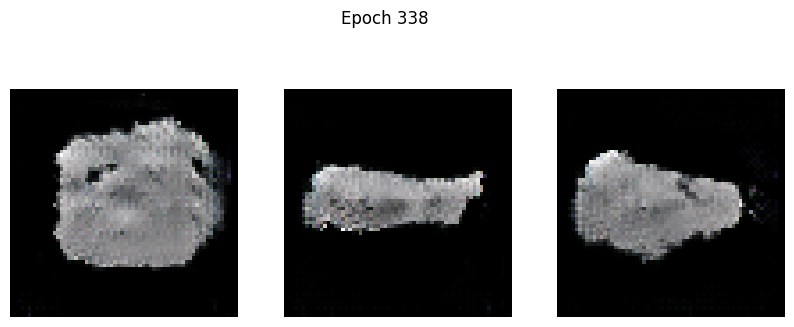

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -6.2586 - g_loss: 5.9891
Epoch 339/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -4.9322 - g_loss: 5.3474

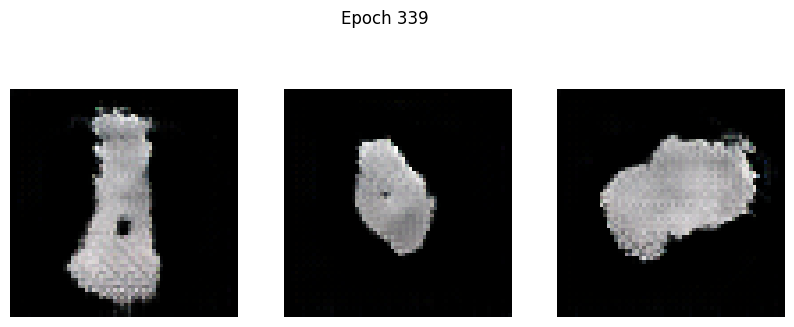

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -4.9481 - g_loss: 5.3451
Epoch 340/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -2.9578 - g_loss: 6.5031

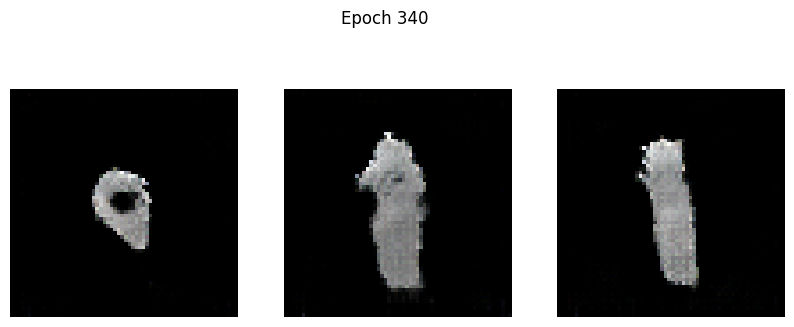

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -2.9932 - g_loss: 6.4975
Epoch 341/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -6.4343 - g_loss: 6.0446

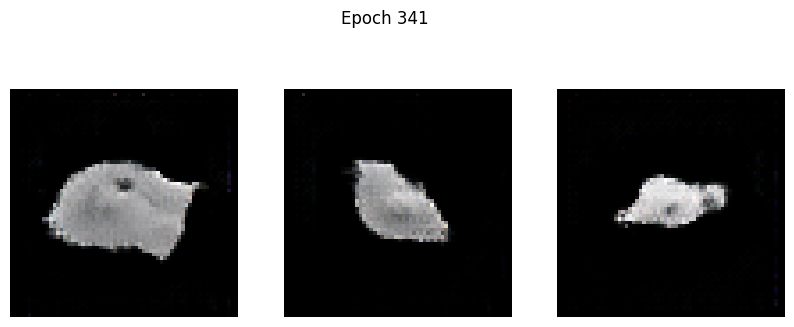

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -6.4268 - g_loss: 6.0524
Epoch 342/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -6.8412 - g_loss: 5.1500

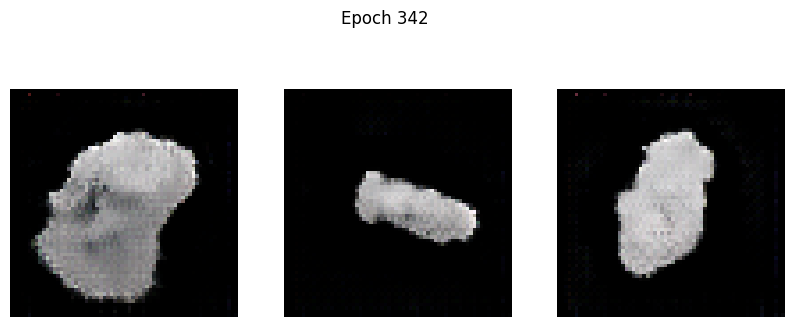

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -6.8521 - g_loss: 5.1495
Epoch 343/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -12.4544 - g_loss: 4.2207

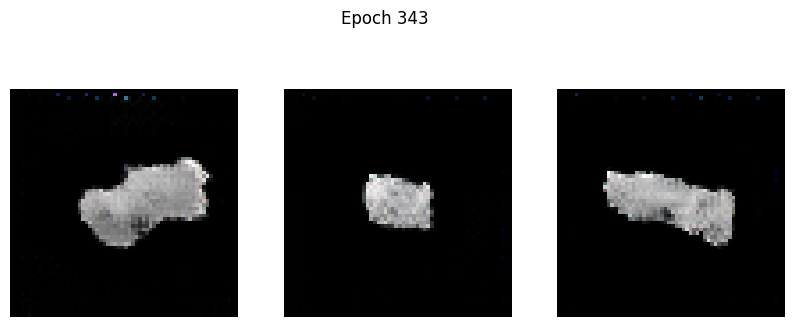

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -12.4198 - g_loss: 4.2234
Epoch 344/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -14.9943 - g_loss: 4.2944

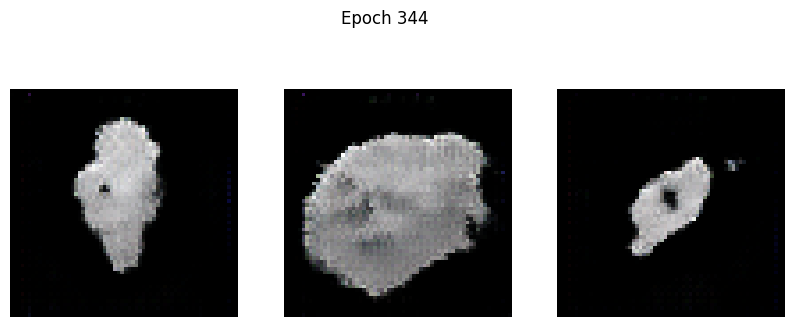

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -14.9688 - g_loss: 4.2968
Epoch 345/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -9.6299 - g_loss: 4.4729

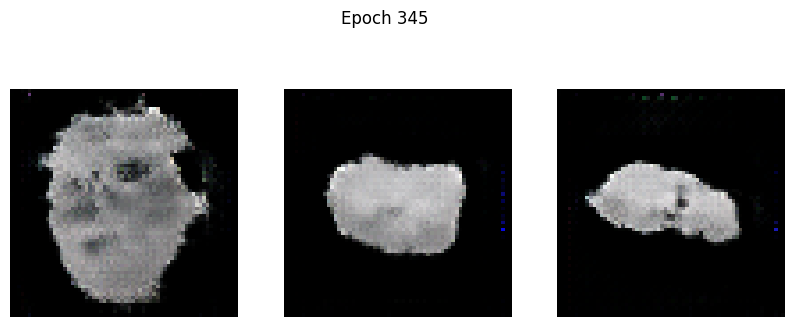

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -9.6478 - g_loss: 4.4737
Epoch 346/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -14.3906 - g_loss: 4.3267

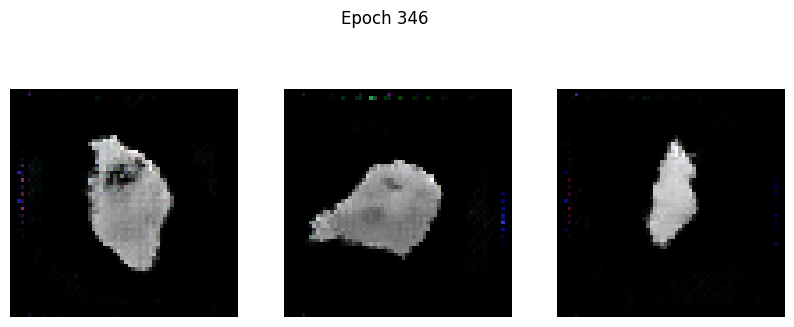

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -14.3893 - g_loss: 4.3274
Epoch 347/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -10.1941 - g_loss: 4.3855

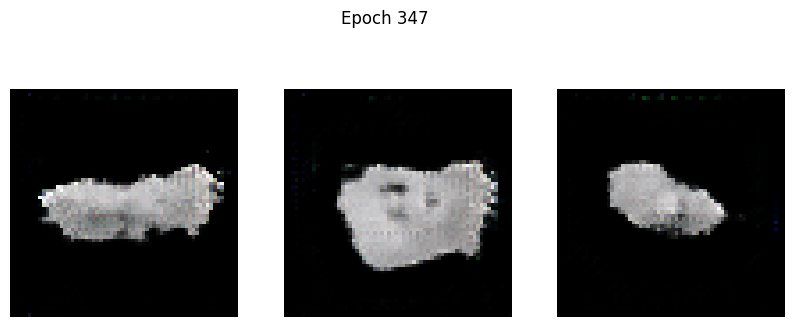

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -10.2169 - g_loss: 4.3873
Epoch 348/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -18.1339 - g_loss: 4.2035

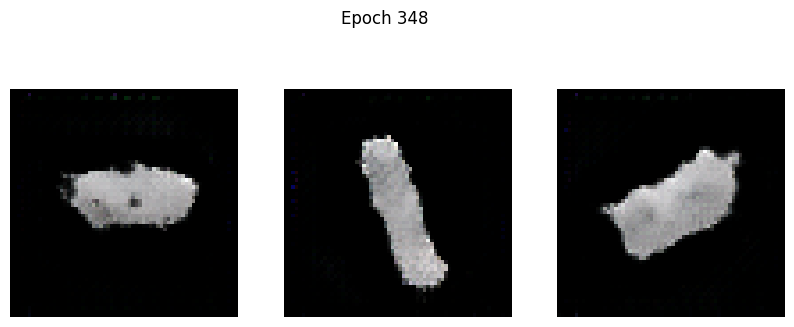

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -18.1082 - g_loss: 4.2032
Epoch 349/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -11.0184 - g_loss: 4.1856

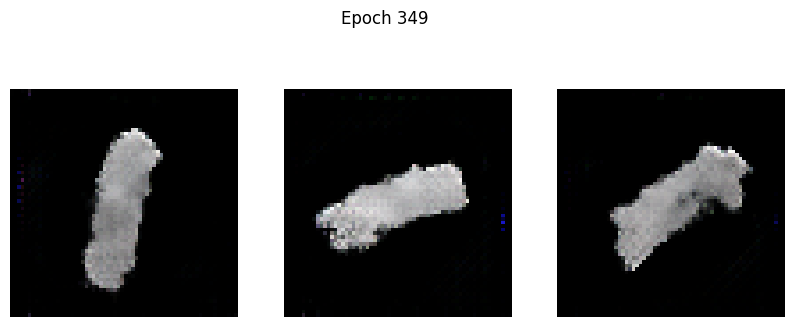

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -11.0585 - g_loss: 4.1852
Epoch 350/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -14.6402 - g_loss: 3.7044

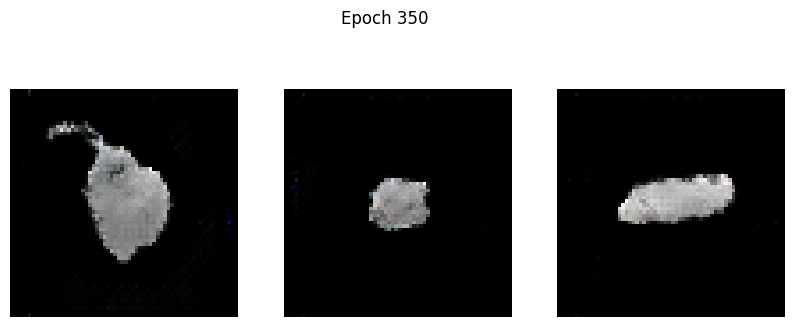

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -14.6607 - g_loss: 3.7078
Epoch 351/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -15.1317 - g_loss: 3.7016

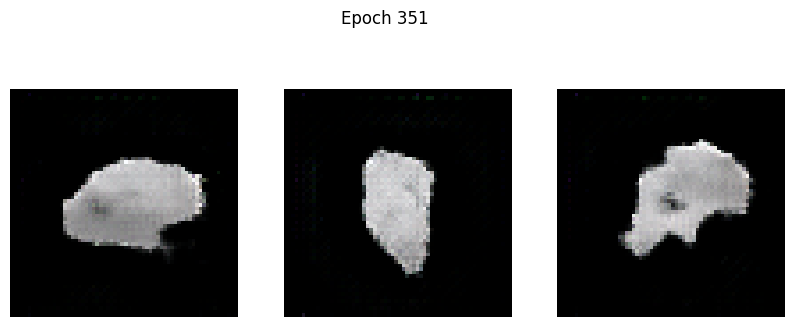

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -15.1624 - g_loss: 3.7035
Epoch 352/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -22.5370 - g_loss: 4.0104

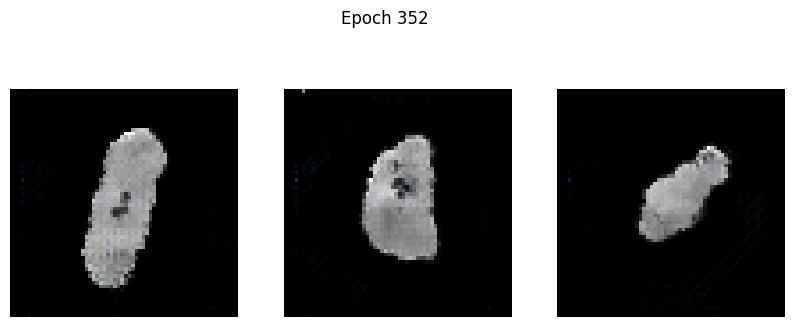

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -22.5008 - g_loss: 4.0096
Epoch 353/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -20.6242 - g_loss: 3.9084

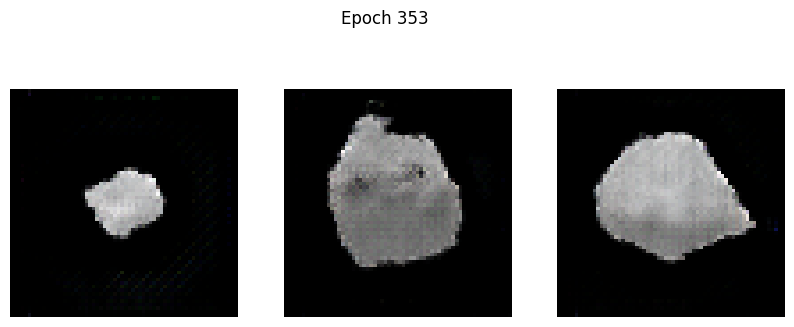

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -20.6047 - g_loss: 3.9071
Epoch 354/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -17.7906 - g_loss: 3.7563

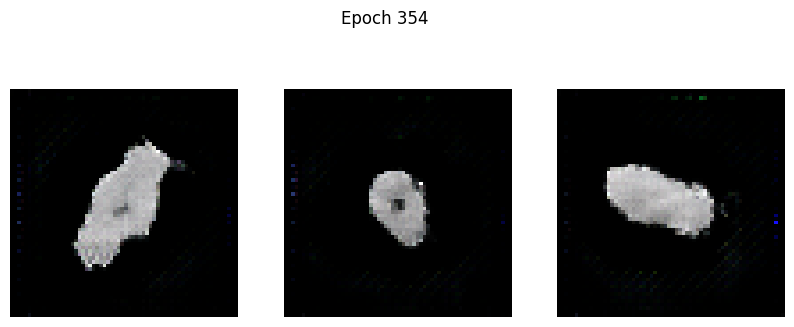

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -17.8431 - g_loss: 3.7561
Epoch 355/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -18.6454 - g_loss: 3.6617

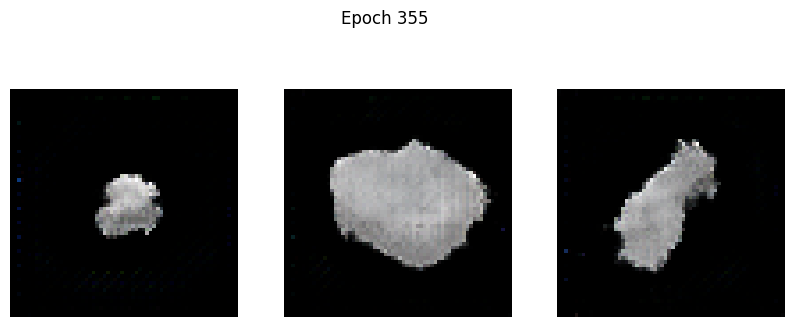

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -18.6833 - g_loss: 3.6601
Epoch 356/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -25.7715 - g_loss: 3.1793

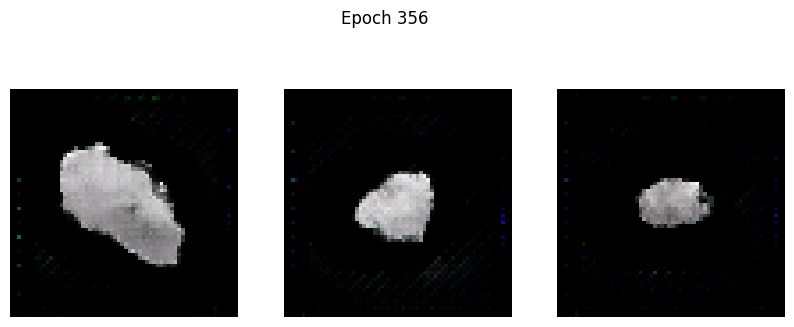

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -25.7808 - g_loss: 3.1810
Epoch 357/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -23.1683 - g_loss: 3.6139

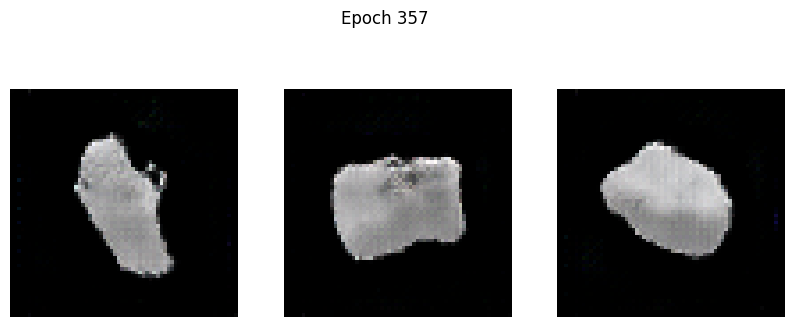

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -23.1778 - g_loss: 3.6109
Epoch 358/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -33.7386 - g_loss: 3.3922

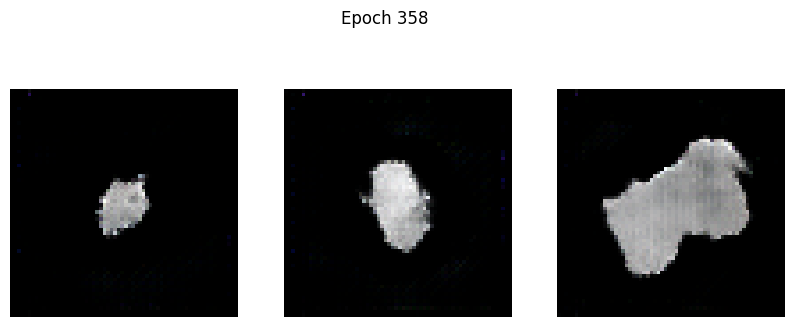

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -33.6924 - g_loss: 3.3929
Epoch 359/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -29.5034 - g_loss: 4.0661

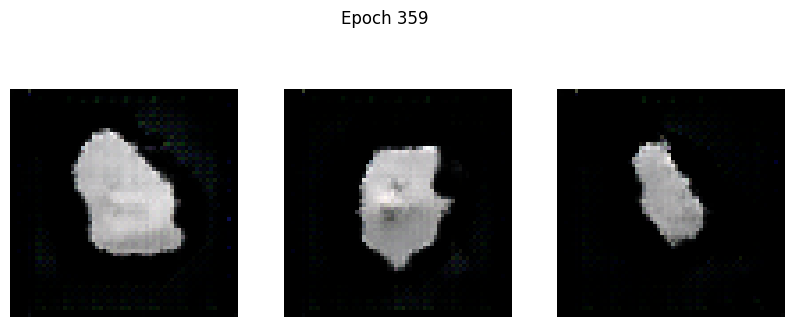

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -29.4751 - g_loss: 4.0714
Epoch 360/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -32.5674 - g_loss: 4.0895

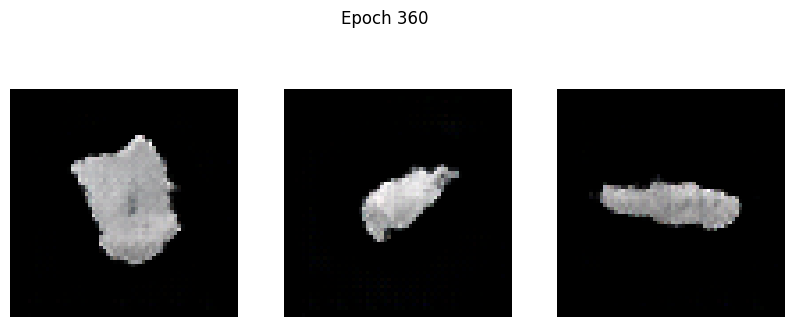

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -32.5630 - g_loss: 4.0858
Epoch 361/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -32.8048 - g_loss: 3.3280

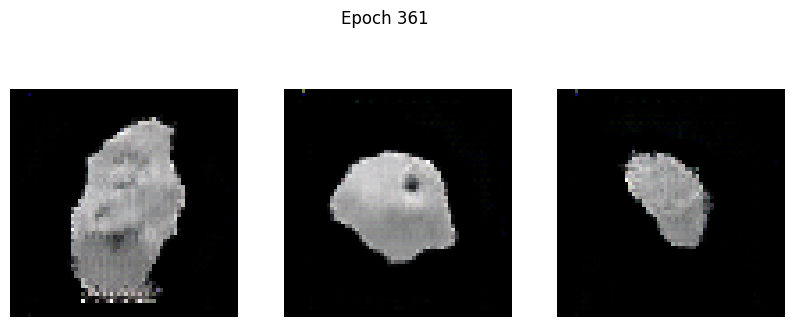

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -32.8103 - g_loss: 3.3291
Epoch 362/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: -36.1272 - g_loss: 3.3396

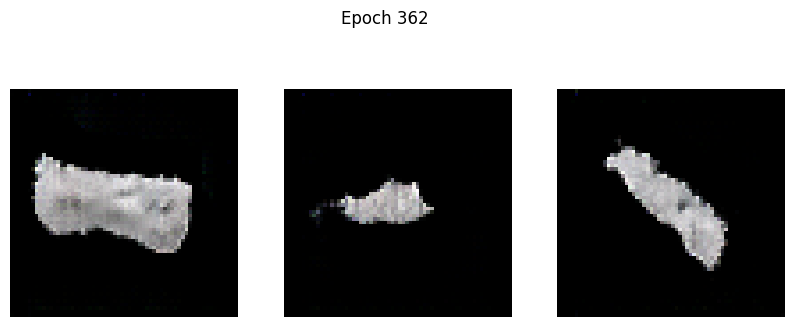

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - d_loss: -36.0989 - g_loss: 3.3416
Epoch 363/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: -28.6089 - g_loss: 3.5375

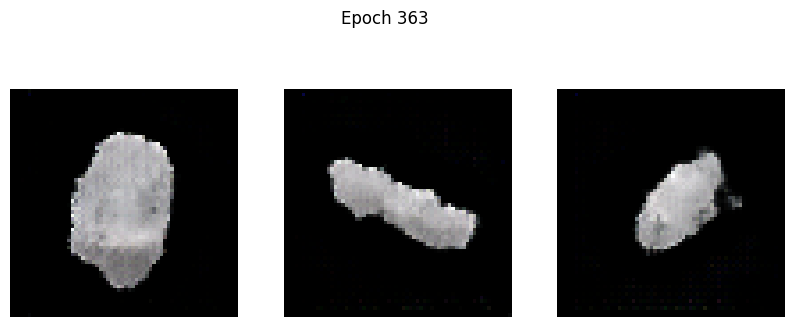

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: -28.6156 - g_loss: 3.5371
Epoch 364/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: -34.5081 - g_loss: 3.7482

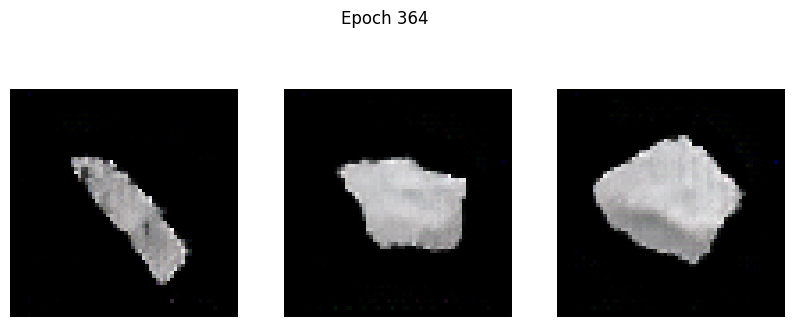

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: -34.5030 - g_loss: 3.7473
Epoch 365/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: -34.3384 - g_loss: 3.8960

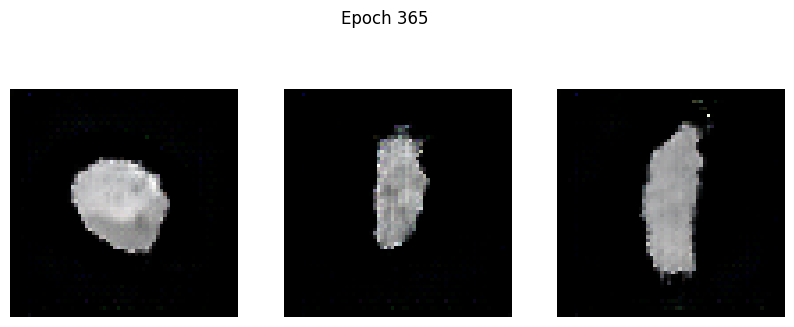

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -34.3500 - g_loss: 3.8962
Epoch 366/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: -25.1412 - g_loss: 3.8299

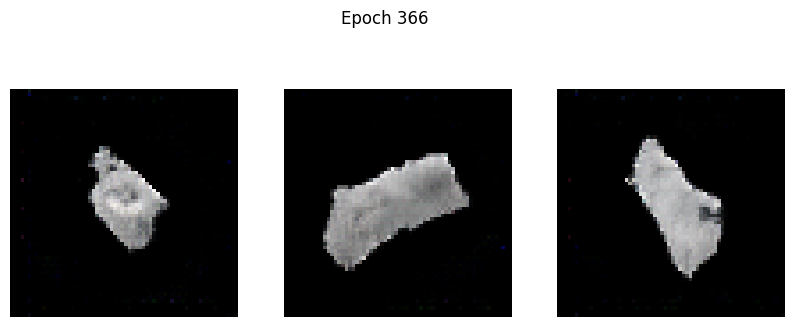

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -25.2525 - g_loss: 3.8297
Epoch 367/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: -44.9431 - g_loss: 3.9394

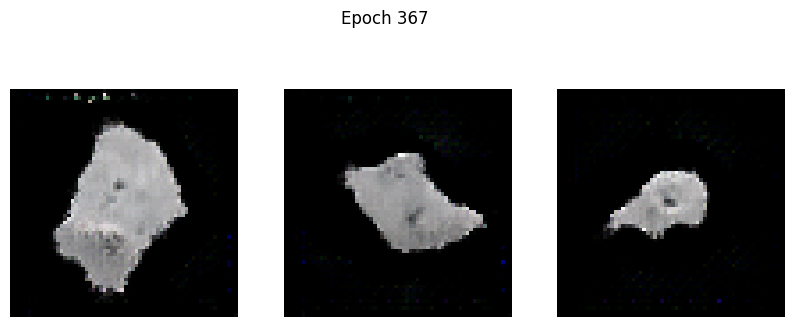

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: -44.8927 - g_loss: 3.9390
Epoch 368/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -37.2054 - g_loss: 4.3766

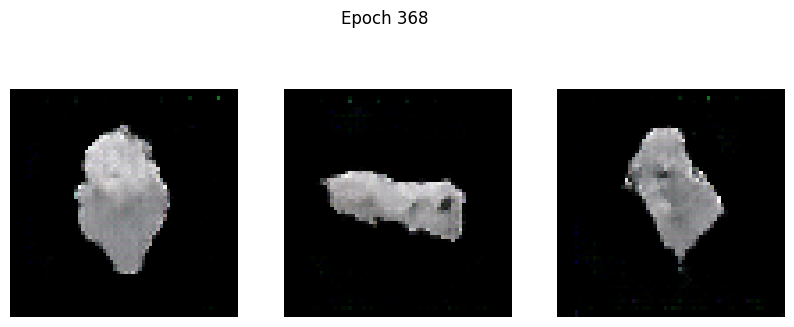

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -37.1962 - g_loss: 4.3784
Epoch 369/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: -39.8222 - g_loss: 4.1777

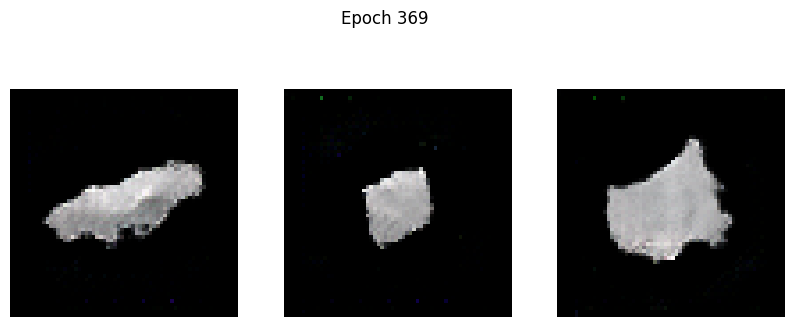

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: -39.8397 - g_loss: 4.1760
Epoch 370/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: -44.0258 - g_loss: 4.1868

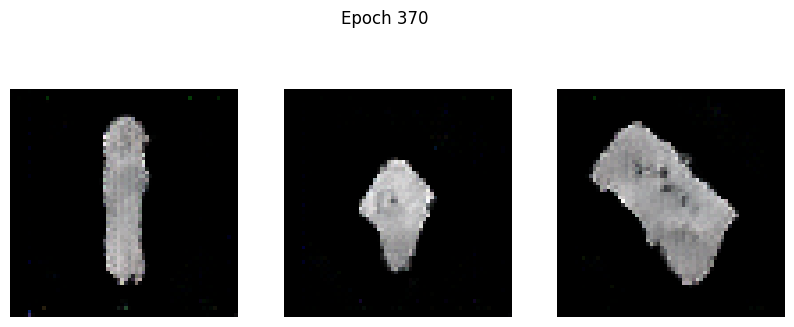

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: -44.0039 - g_loss: 4.1867
Epoch 371/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -66.1631 - g_loss: 3.9858

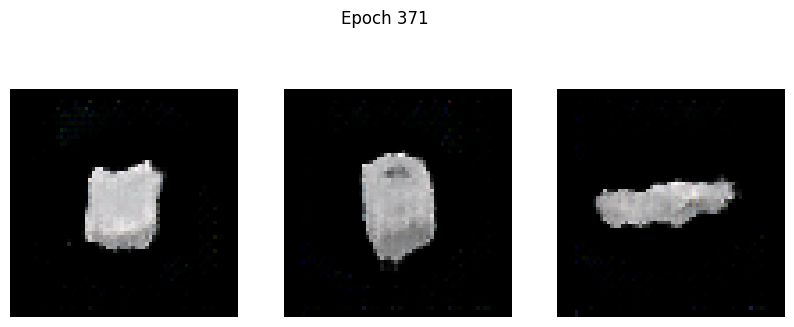

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -66.0110 - g_loss: 3.9862
Epoch 372/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -51.6191 - g_loss: 5.8941

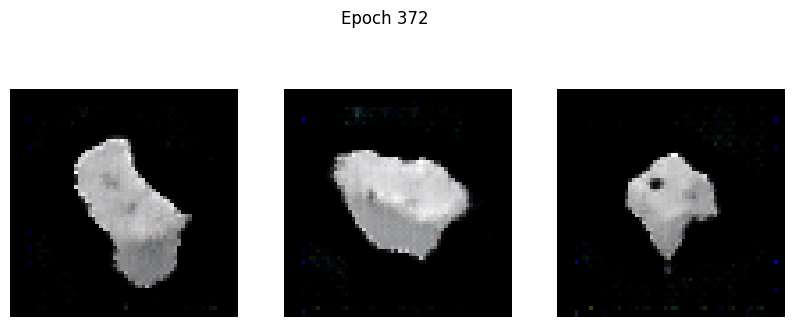

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -51.5826 - g_loss: 5.8901
Epoch 373/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -63.7067 - g_loss: 3.9200

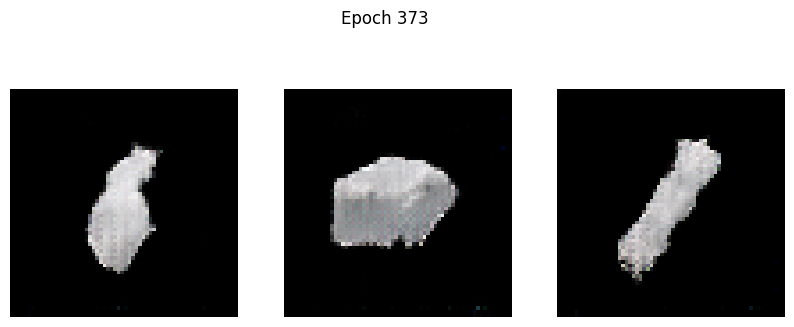

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -63.6523 - g_loss: 3.9232
Epoch 374/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -51.2835 - g_loss: 3.9356

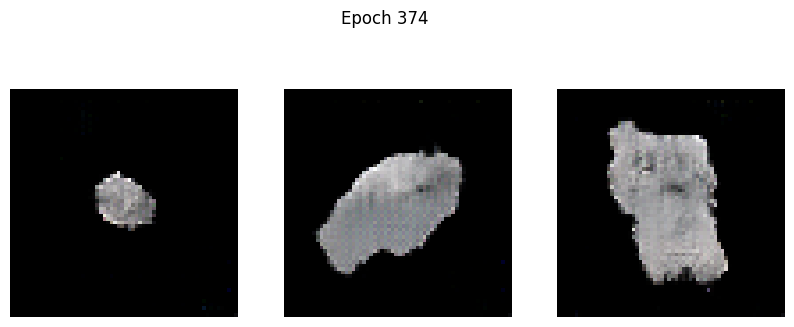

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -51.3249 - g_loss: 3.9405
Epoch 375/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -53.2592 - g_loss: 4.9555

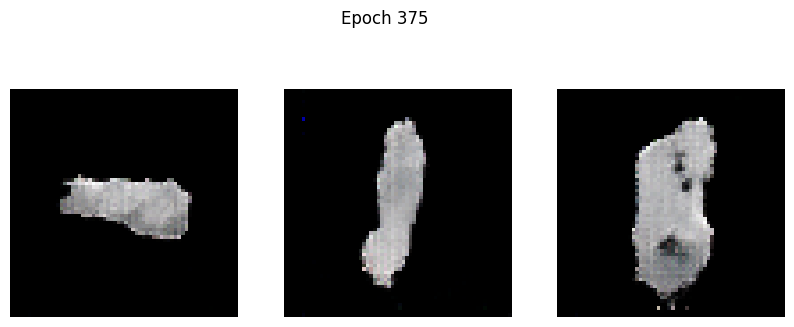

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -53.3484 - g_loss: 4.9537
Epoch 376/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -47.1971 - g_loss: 6.3230

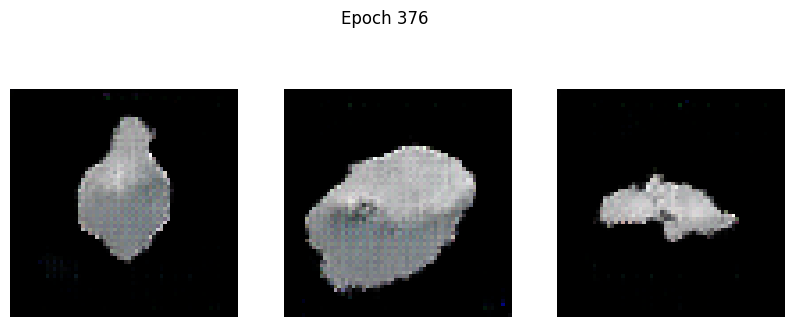

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -47.2288 - g_loss: 6.3234
Epoch 377/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -52.2173 - g_loss: 6.4787

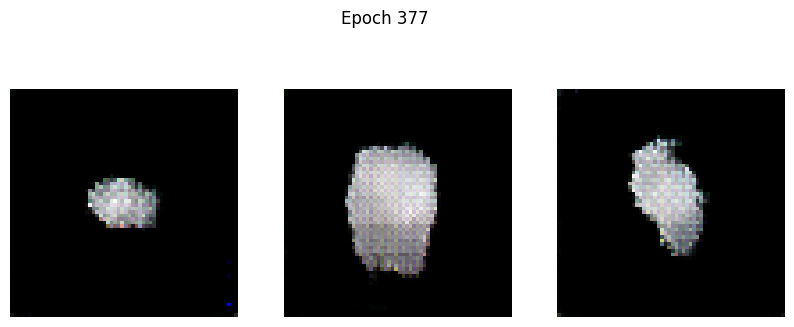

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -52.1240 - g_loss: 6.5275
Epoch 378/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -78.2000 - g_loss: 6.9962

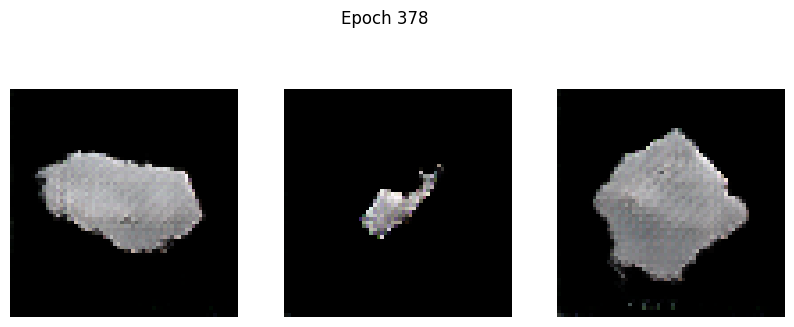

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -78.0839 - g_loss: 6.9810
Epoch 379/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -57.8795 - g_loss: 3.9131

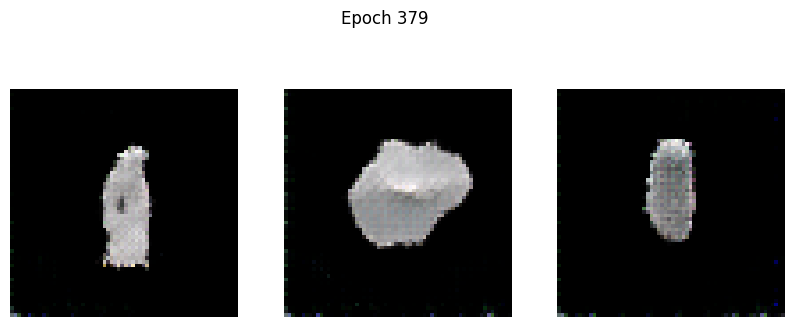

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -57.9657 - g_loss: 3.9192
Epoch 380/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -69.0835 - g_loss: 7.9052

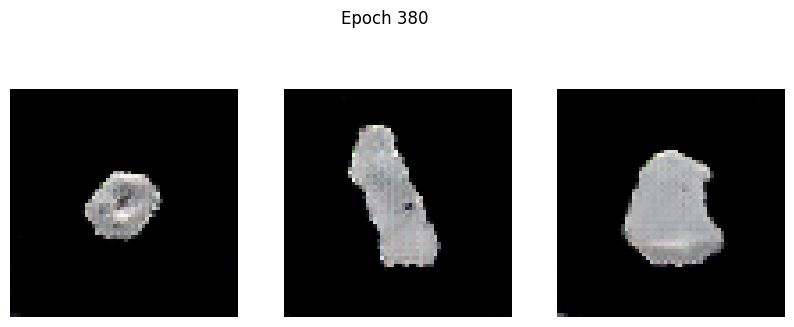

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -68.9748 - g_loss: 7.9026
Epoch 381/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: -50.7127 - g_loss: 7.8989

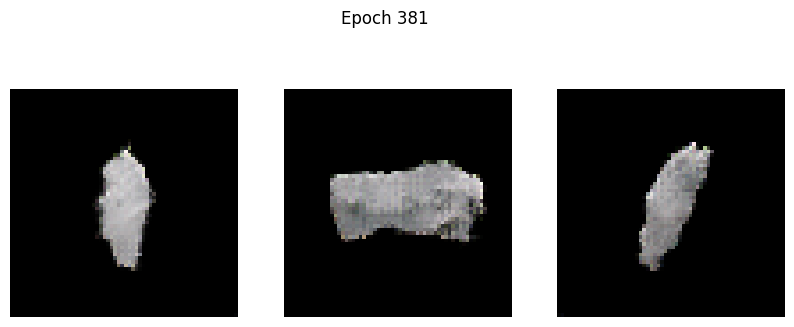

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: -50.7910 - g_loss: 7.8940
Epoch 382/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: -61.7369 - g_loss: 11.6226

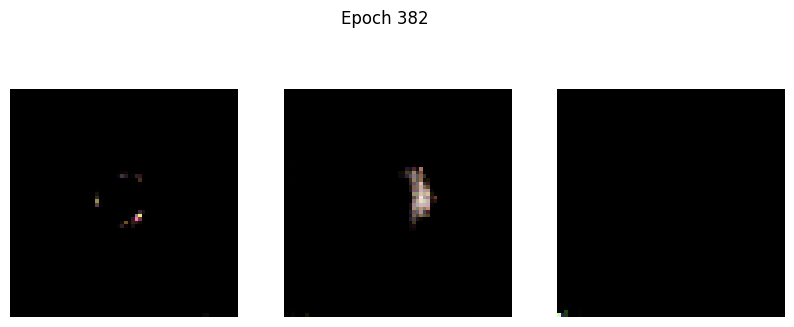

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -60.9586 - g_loss: 11.9399
Epoch 383/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: -52.4387 - g_loss: 73.6941

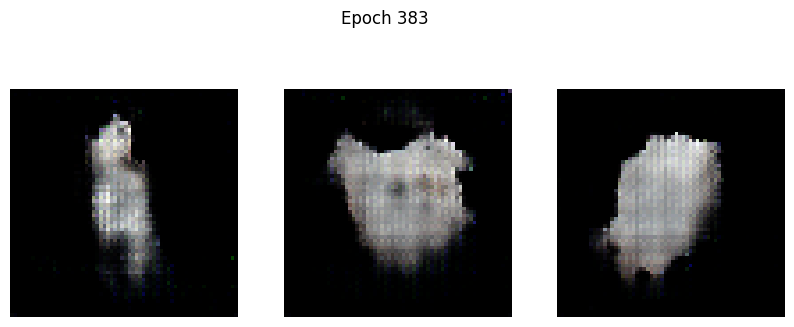

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: -52.3232 - g_loss: 73.4806
Epoch 384/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -71.7890 - g_loss: 8.0677

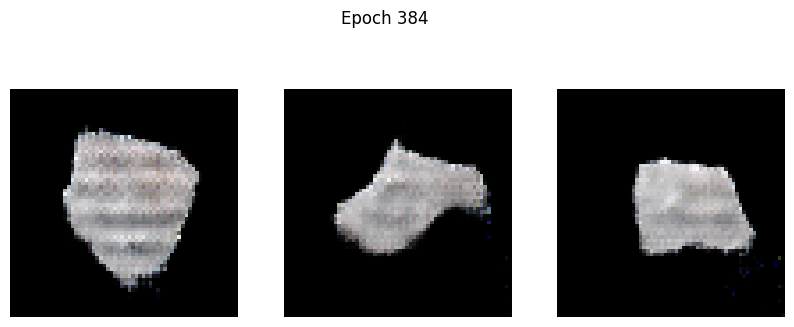

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -71.7545 - g_loss: 8.0612
Epoch 385/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: -78.6386 - g_loss: 5.7171

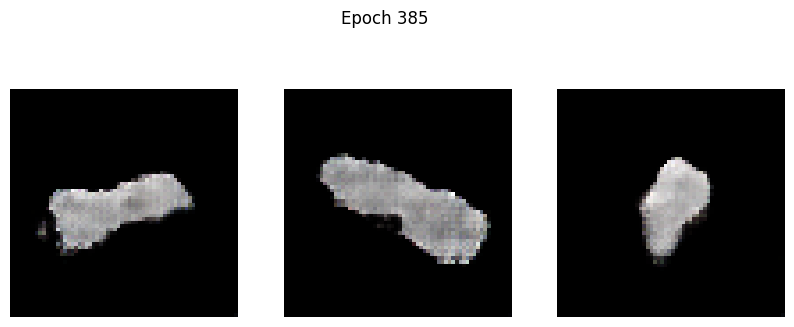

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: -78.6453 - g_loss: 5.7135
Epoch 386/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 120.7653 - g_loss: 16.7899

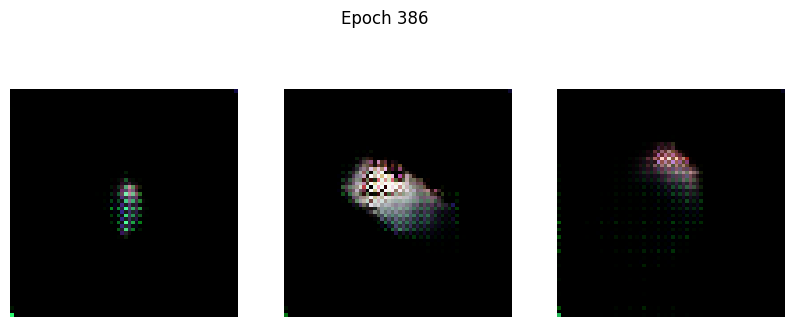

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 143.5572 - g_loss: 17.9239
Epoch 387/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - d_loss: 364.4256 - g_loss: 572.3983

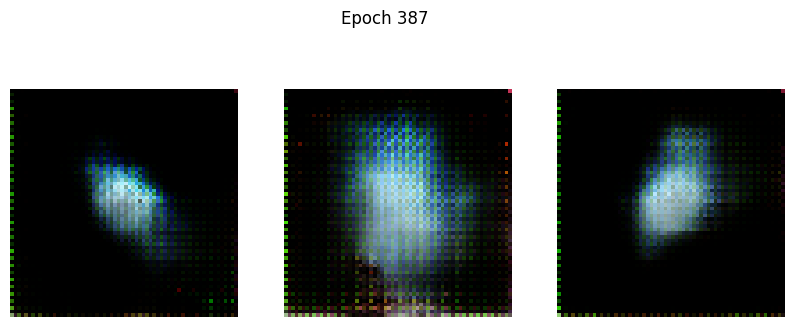

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - d_loss: 363.3346 - g_loss: 569.3336
Epoch 388/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 148.0124 - g_loss: 139.1426

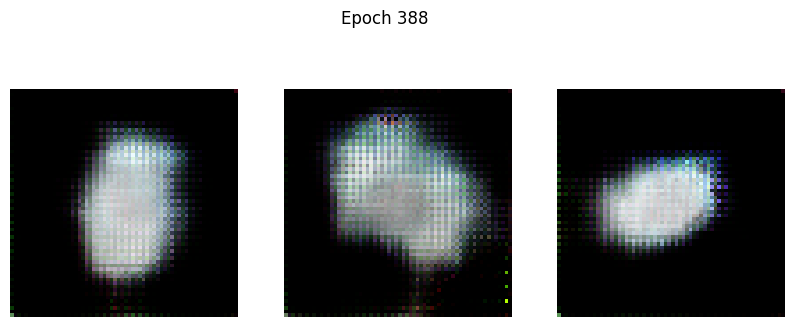

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 147.6975 - g_loss: 138.9928
Epoch 389/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 72.0256 - g_loss: 80.0188

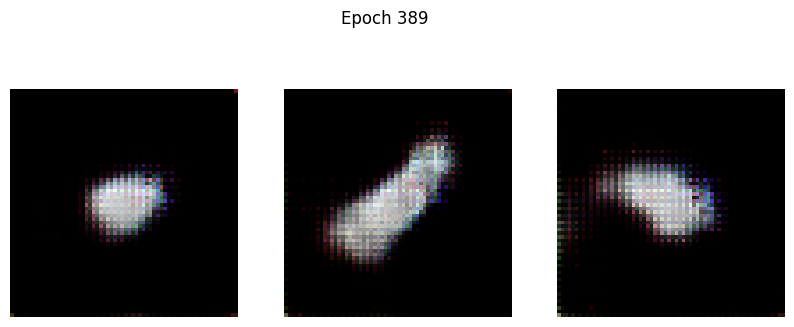

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 72.0077 - g_loss: 80.0626
Epoch 390/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 55.4832 - g_loss: 75.4110

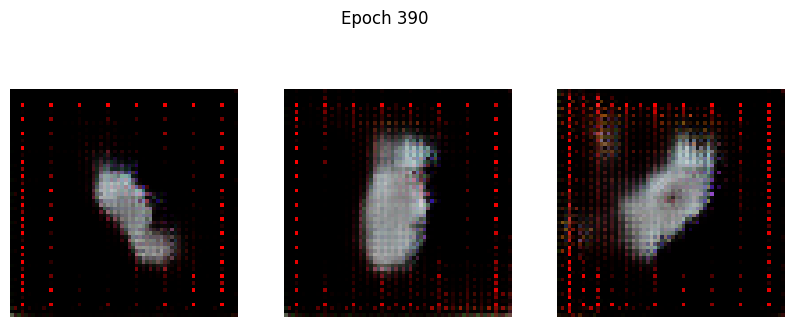

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 55.4581 - g_loss: 75.3805
Epoch 391/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 41.2431 - g_loss: 53.4310

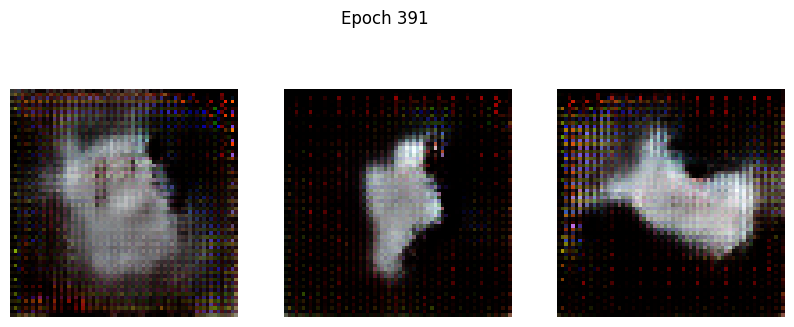

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 41.2103 - g_loss: 53.4209
Epoch 392/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 44.2093 - g_loss: 66.7612

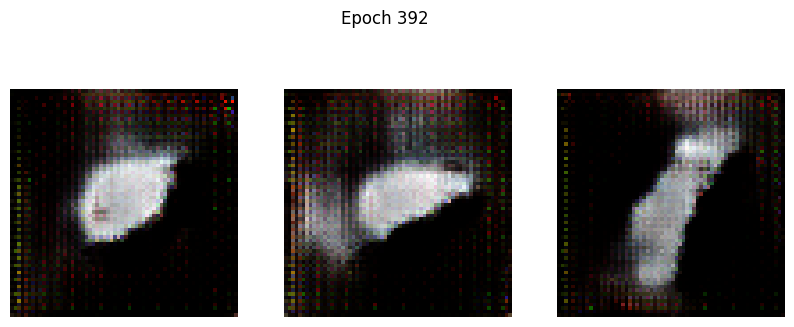

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 44.0959 - g_loss: 66.6828
Epoch 393/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 39.2773 - g_loss: 54.6298

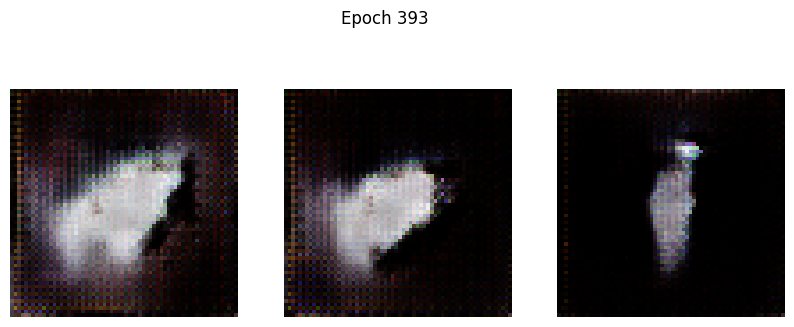

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 39.2021 - g_loss: 54.6164
Epoch 394/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 15.6049 - g_loss: 47.8770

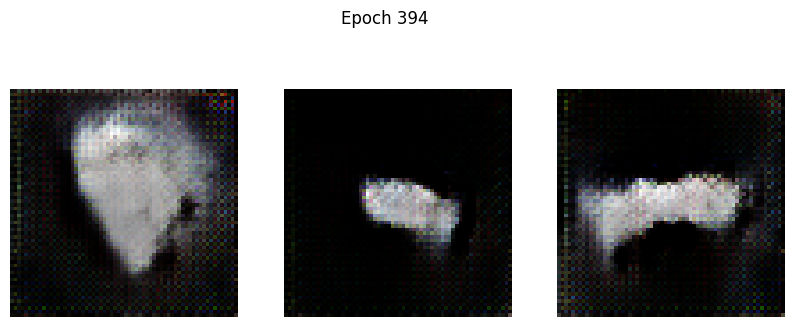

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: 15.6695 - g_loss: 47.9129
Epoch 395/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: -1.7490 - g_loss: 36.8794

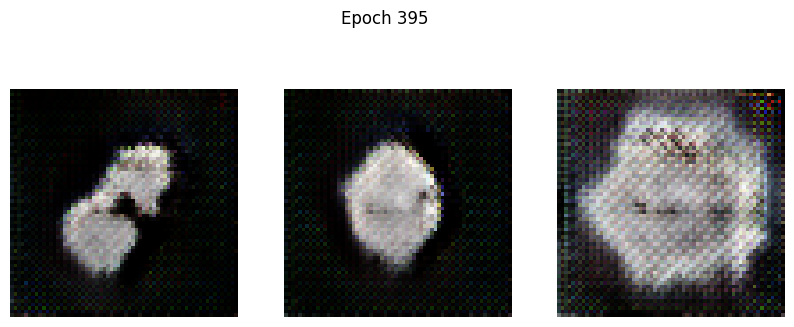

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - d_loss: -1.6563 - g_loss: 36.9191
Epoch 396/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - d_loss: 2.1491 - g_loss: 38.6690

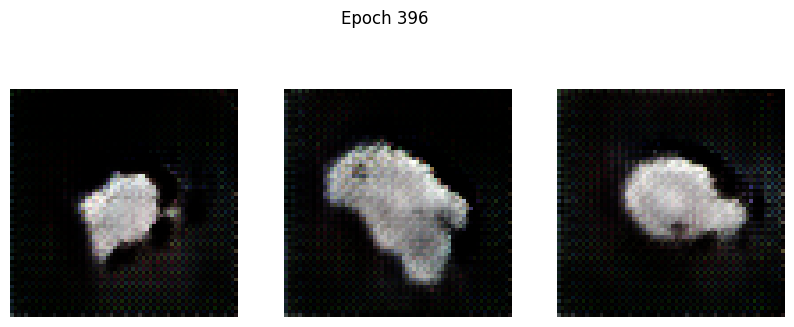

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 2.1790 - g_loss: 38.6499
Epoch 397/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 0.9416 - g_loss: 34.2824

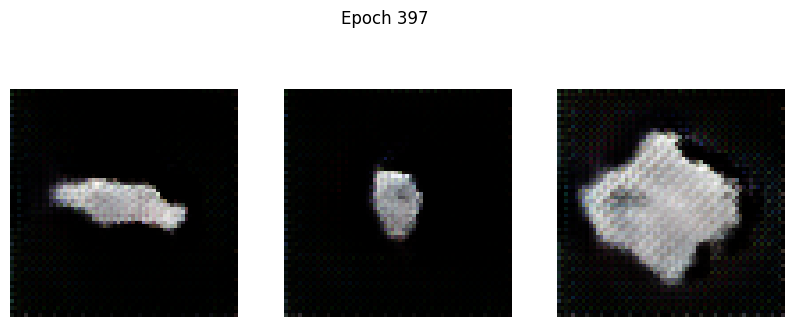

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 111ms/step - d_loss: 0.9112 - g_loss: 34.3076
Epoch 398/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: -1.0764 - g_loss: 39.0868

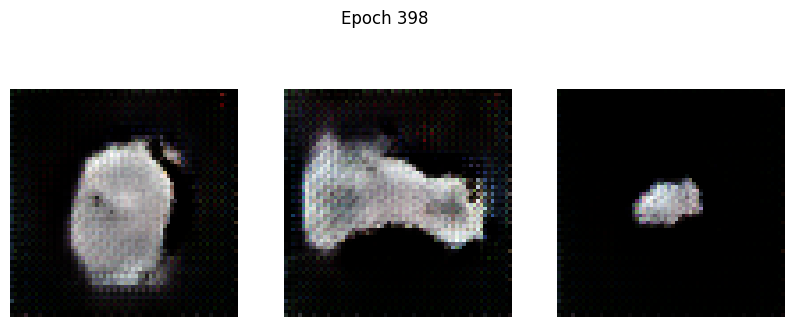

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: -1.0678 - g_loss: 39.0805
Epoch 399/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -5.1414 - g_loss: 29.3539

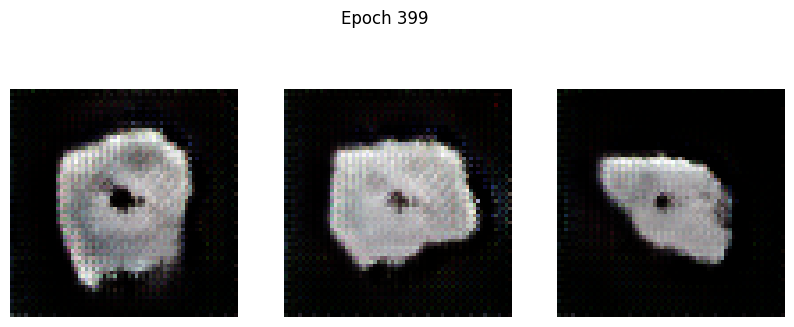

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -5.1717 - g_loss: 29.3227
Epoch 400/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - d_loss: -0.8297 - g_loss: 24.9494

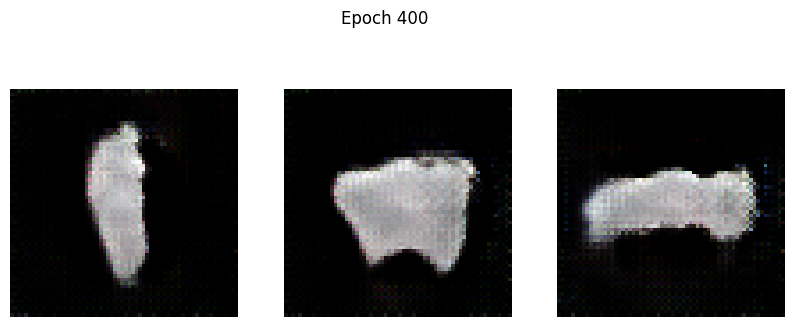

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - d_loss: -0.8926 - g_loss: 24.9798
Epoch 401/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - d_loss: -13.7281 - g_loss: 37.8301

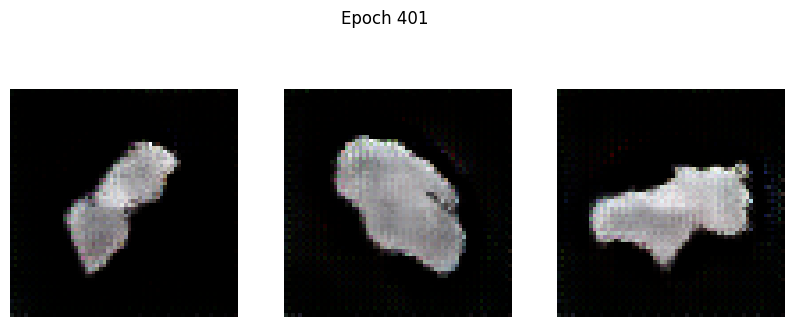

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - d_loss: -13.6612 - g_loss: 37.7622
Epoch 402/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -12.1253 - g_loss: 23.7864

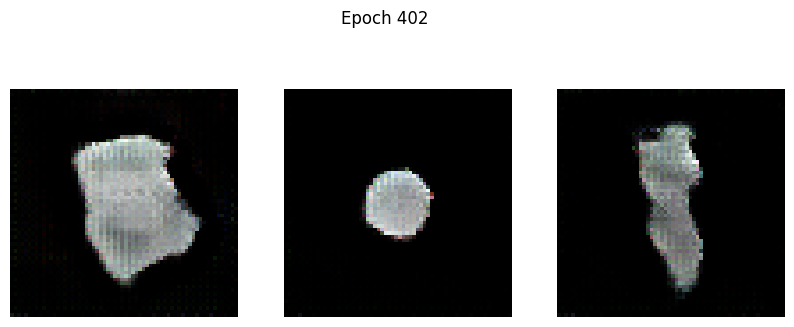

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -12.1307 - g_loss: 23.8060
Epoch 403/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_loss: -17.1494 - g_loss: 21.7050

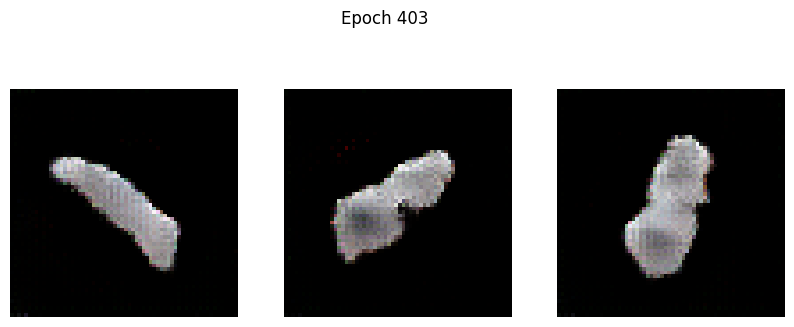

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - d_loss: -17.1268 - g_loss: 21.7228
Epoch 404/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: -7.3820 - g_loss: 19.9161

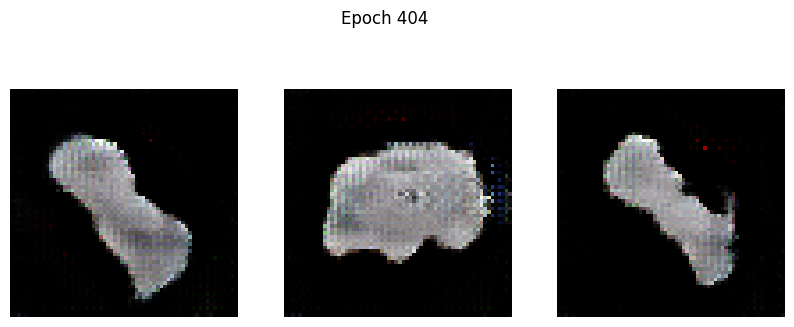

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - d_loss: -7.4699 - g_loss: 19.9356
Epoch 405/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_loss: -12.0275 - g_loss: 17.6332

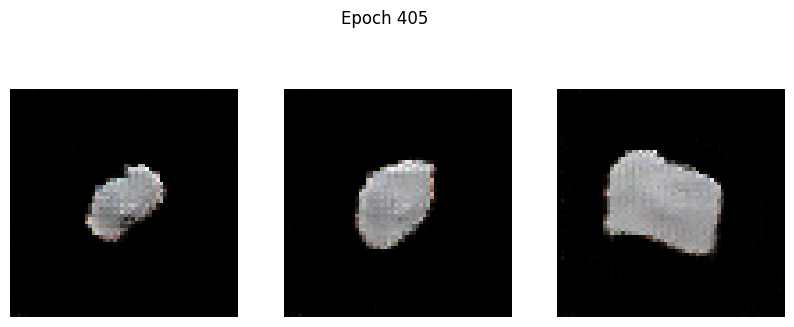

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - d_loss: -12.1029 - g_loss: 17.6411
Epoch 406/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -23.8529 - g_loss: 15.4720

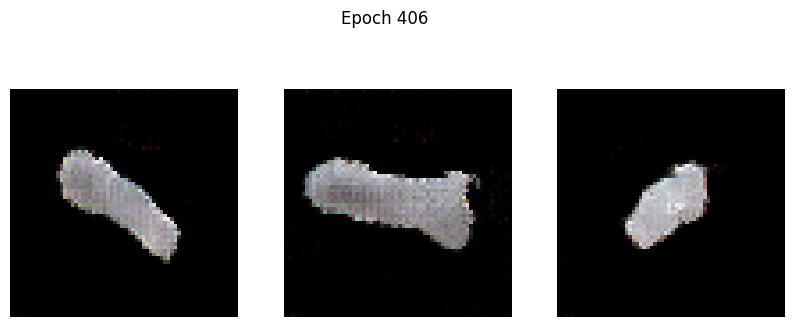

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -23.8529 - g_loss: 15.4976
Epoch 407/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -18.2867 - g_loss: 17.9627

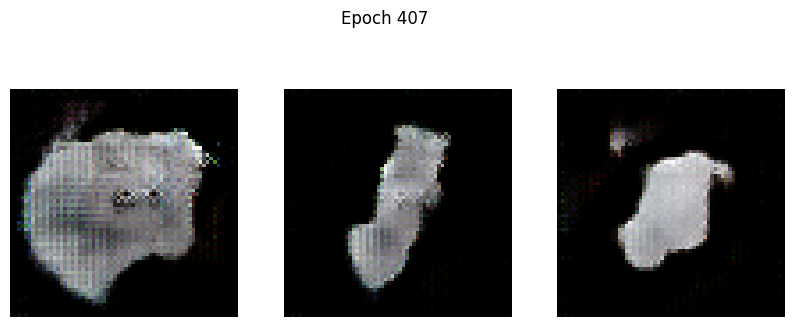

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -18.3335 - g_loss: 17.9410
Epoch 408/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -27.1238 - g_loss: 19.1782

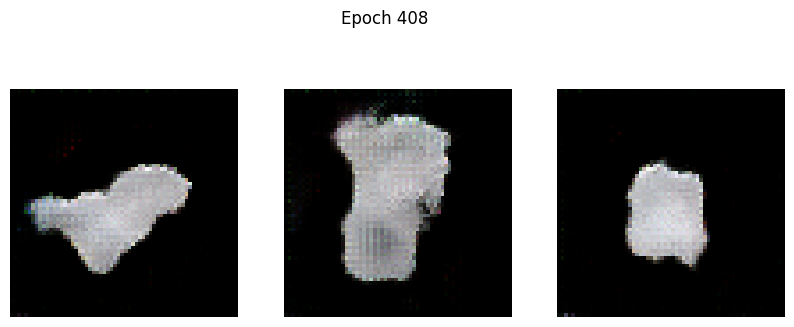

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -27.1354 - g_loss: 19.1296
Epoch 409/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -43.5678 - g_loss: 10.9363

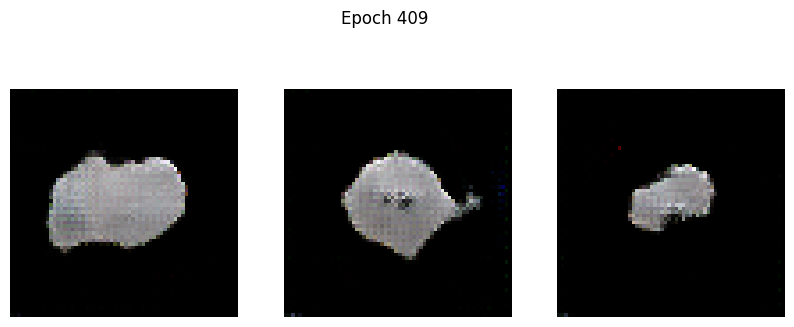

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -43.4638 - g_loss: 10.9463
Epoch 410/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -35.1247 - g_loss: 7.2457

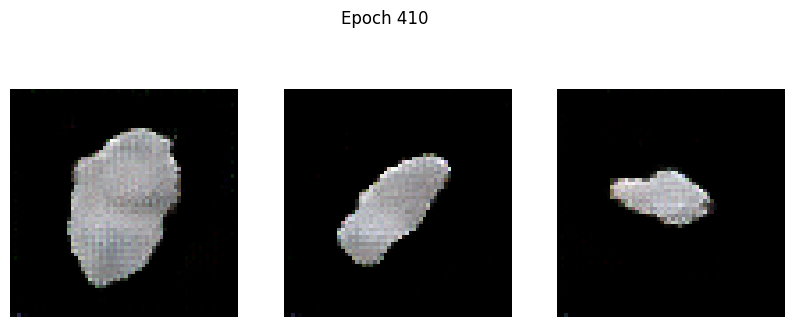

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -35.1220 - g_loss: 7.2421
Epoch 411/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -46.8356 - g_loss: 10.7036

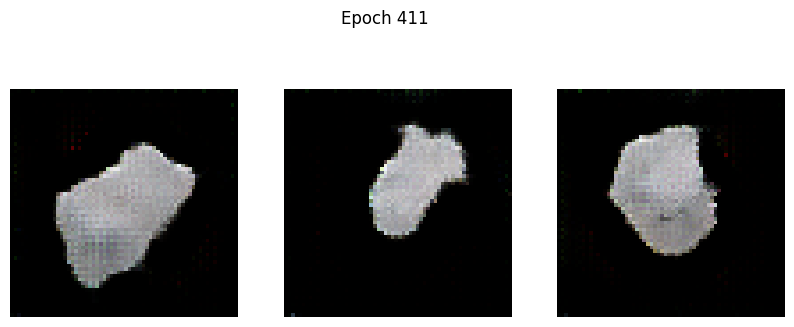

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -46.7563 - g_loss: 10.7098
Epoch 412/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -42.0440 - g_loss: 7.7103

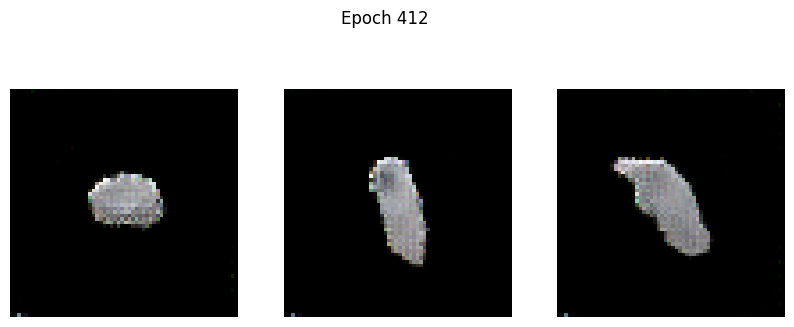

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -42.0287 - g_loss: 7.7141
Epoch 413/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -40.7439 - g_loss: 6.3067

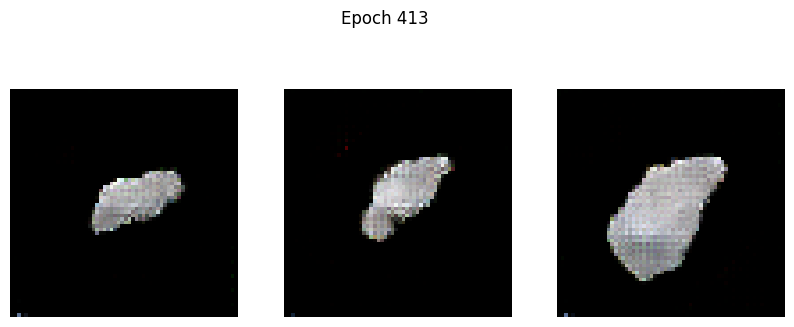

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -40.7602 - g_loss: 6.3094
Epoch 414/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -56.4415 - g_loss: 6.1338

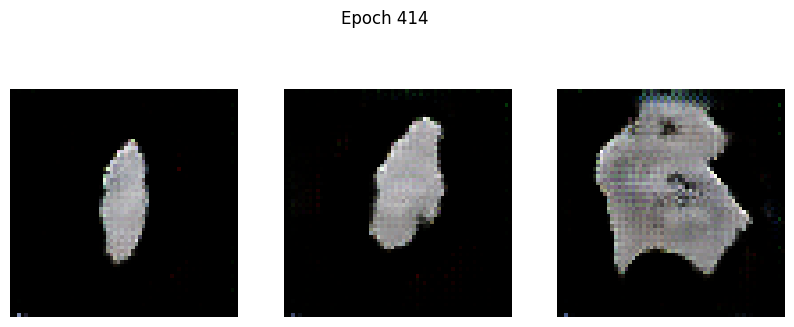

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -56.3167 - g_loss: 6.1449
Epoch 415/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -52.5701 - g_loss: 4.7161

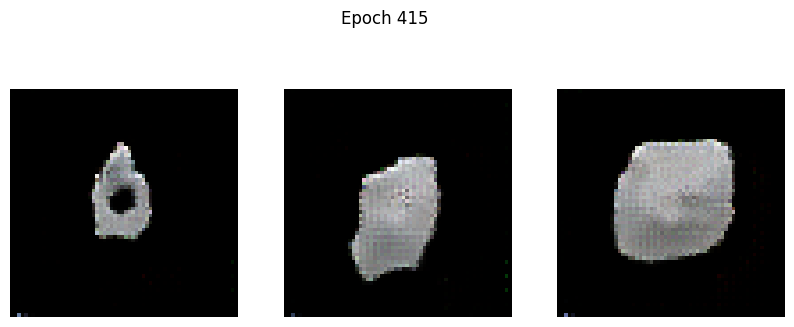

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -52.4940 - g_loss: 4.7231
Epoch 416/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -63.9920 - g_loss: 5.4727

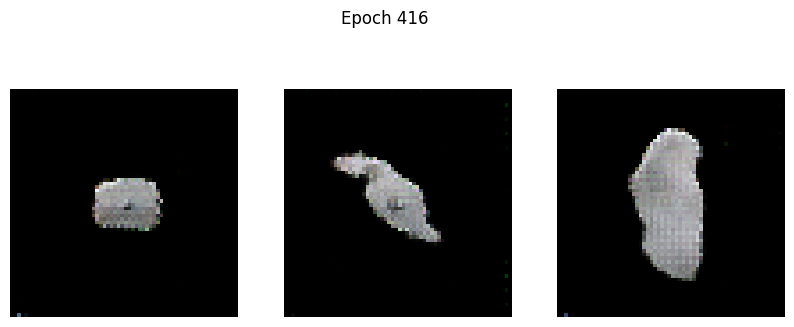

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -63.8885 - g_loss: 5.4733
Epoch 417/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -48.3277 - g_loss: 4.7194

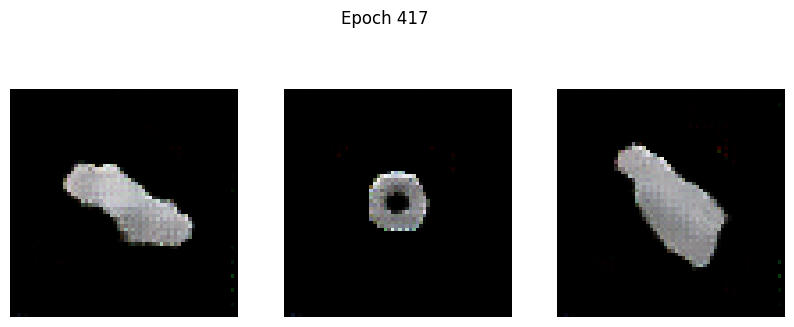

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -48.2938 - g_loss: 4.7201
Epoch 418/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -59.3528 - g_loss: 4.9571

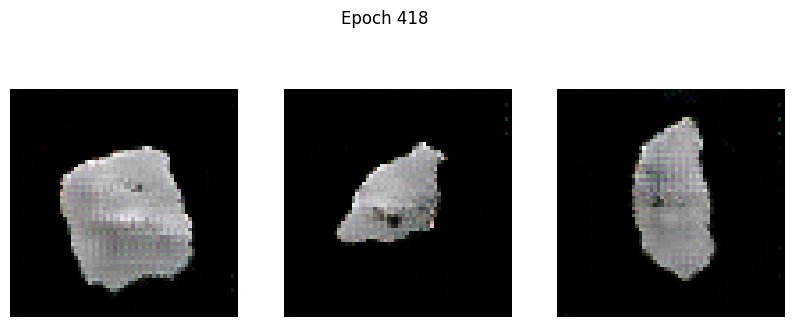

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -59.3313 - g_loss: 4.9581
Epoch 419/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -51.4157 - g_loss: 4.7120

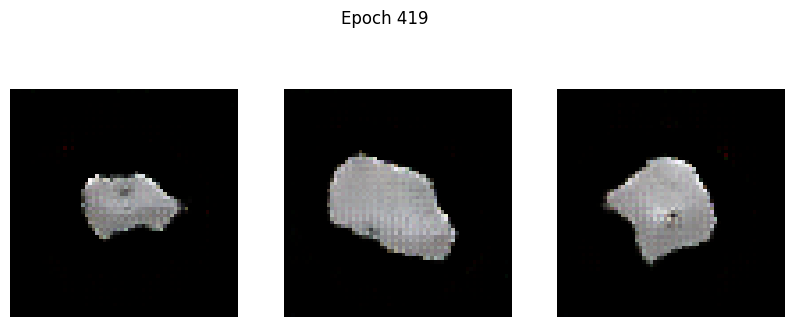

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -51.4458 - g_loss: 4.7127
Epoch 420/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -48.8967 - g_loss: 3.9500

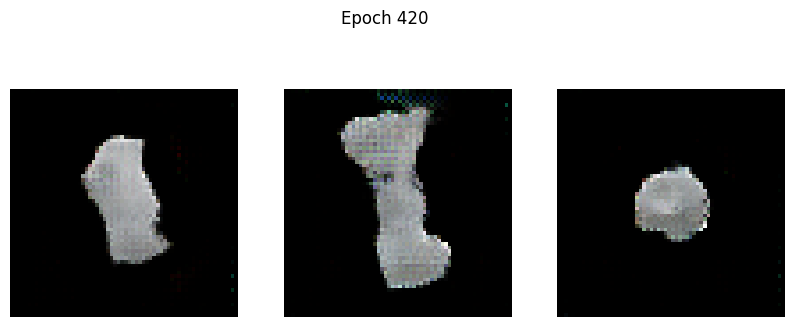

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -48.9357 - g_loss: 3.9529
Epoch 421/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -54.3868 - g_loss: 4.4646

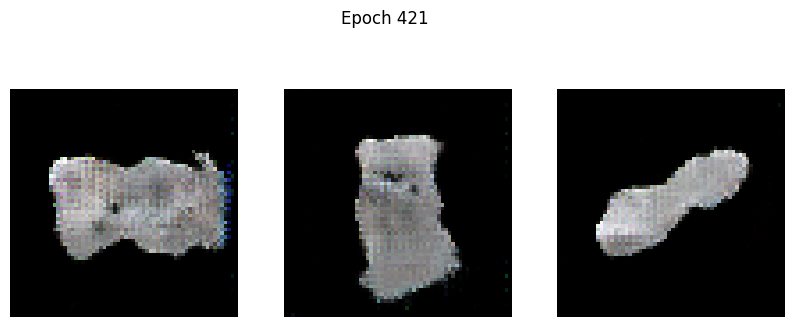

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -54.3822 - g_loss: 4.4613
Epoch 422/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -46.6016 - g_loss: 4.2686

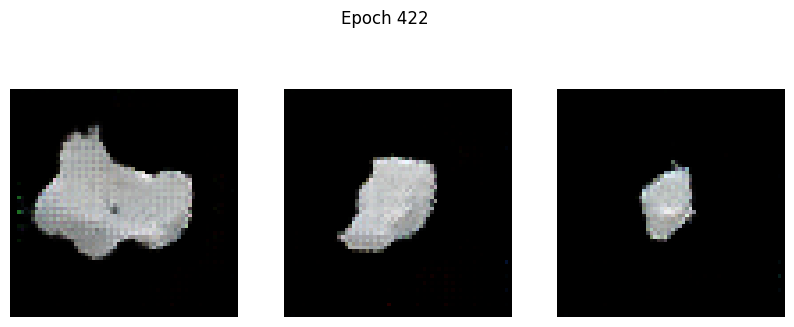

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -46.6928 - g_loss: 4.2663
Epoch 423/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -46.7637 - g_loss: 4.0367

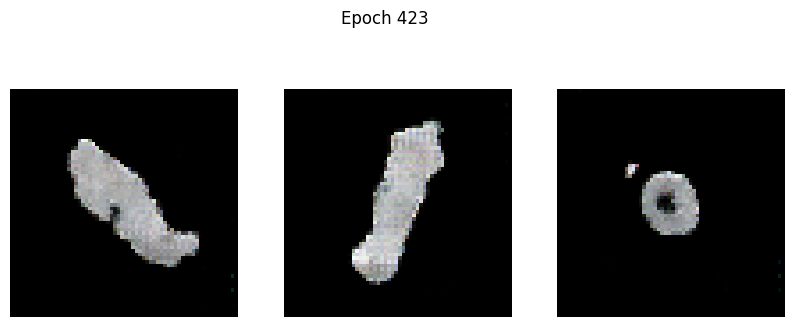

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -46.8256 - g_loss: 4.0354
Epoch 424/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -46.1890 - g_loss: 3.6231

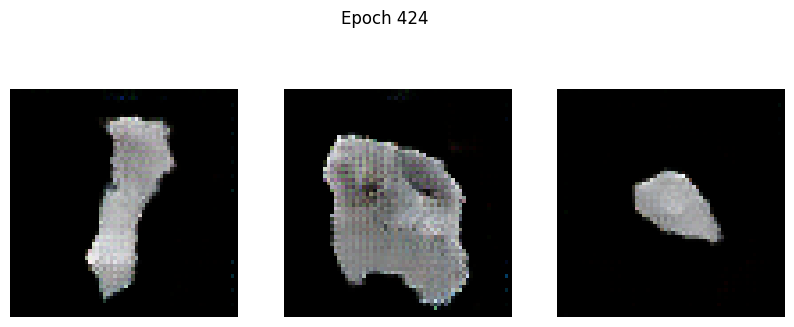

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -46.2514 - g_loss: 3.6250
Epoch 425/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -72.7233 - g_loss: 3.8871

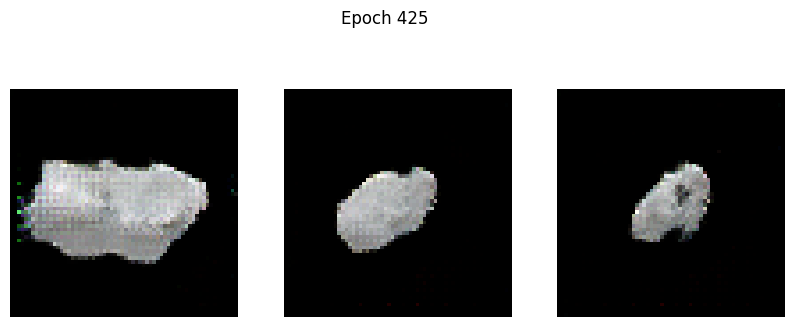

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -72.5682 - g_loss: 3.8894
Epoch 426/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -67.5063 - g_loss: 4.1516

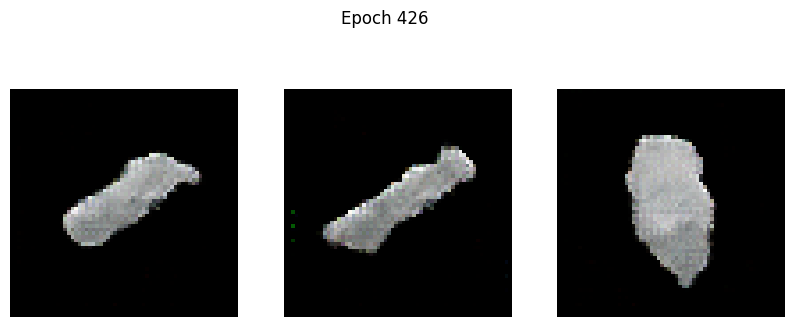

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -67.4873 - g_loss: 4.1532
Epoch 427/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -68.8212 - g_loss: 3.4316

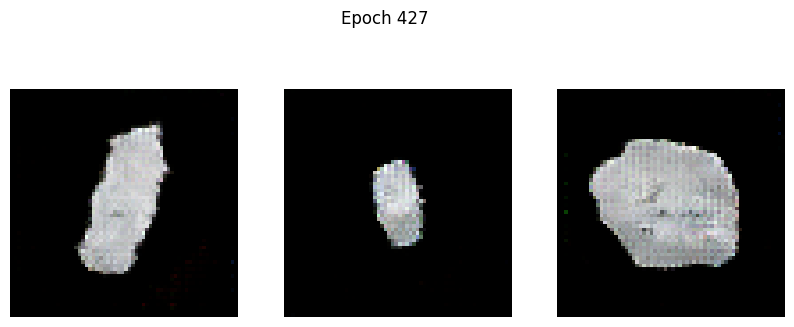

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -68.8107 - g_loss: 3.4325
Epoch 428/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -63.7305 - g_loss: 3.6755

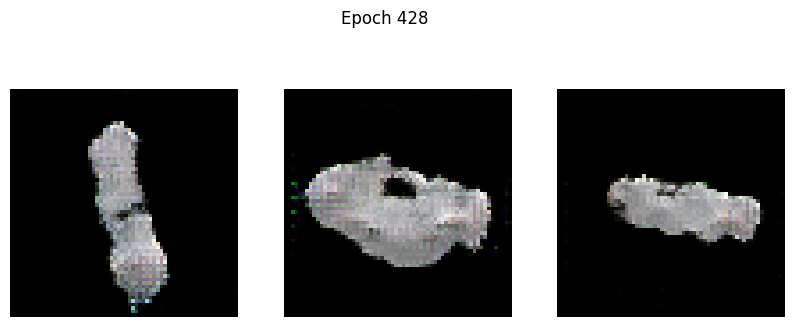

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -63.7381 - g_loss: 3.6728
Epoch 429/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -68.1288 - g_loss: 3.7434

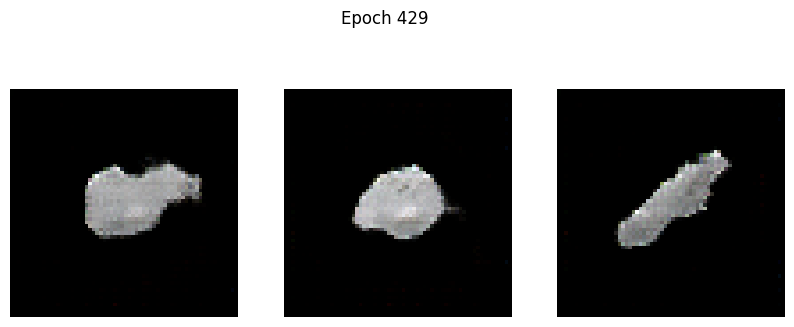

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -68.1225 - g_loss: 3.7411
Epoch 430/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -60.6183 - g_loss: 3.3761

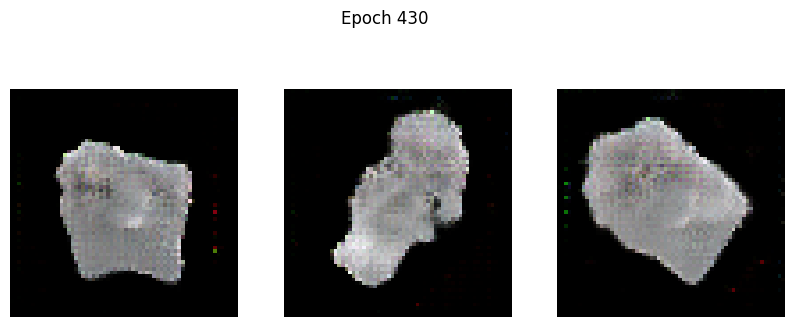

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -60.7154 - g_loss: 3.3762
Epoch 431/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -52.6268 - g_loss: 3.3367

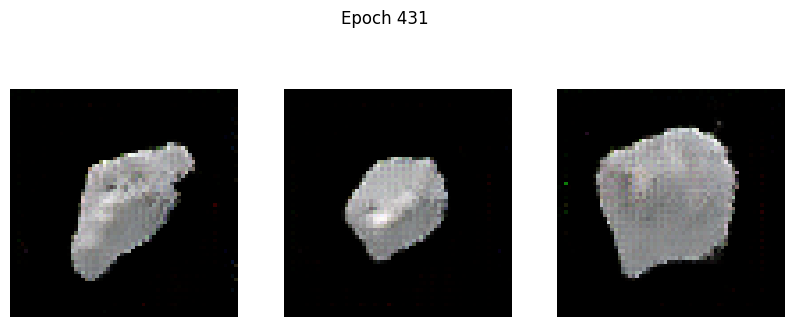

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -52.7898 - g_loss: 3.3380
Epoch 432/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -53.9081 - g_loss: 3.6372

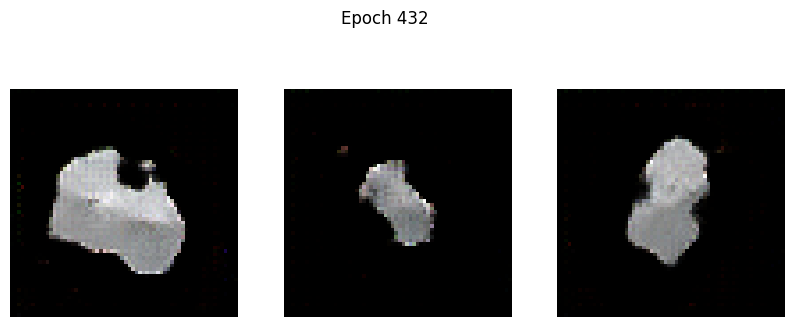

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -54.0714 - g_loss: 3.6394
Epoch 433/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -58.6087 - g_loss: 4.4312

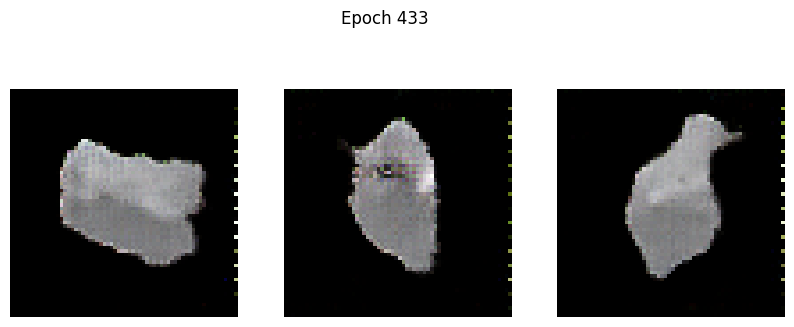

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -58.7290 - g_loss: 4.4370
Epoch 434/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -77.8482 - g_loss: 4.5390

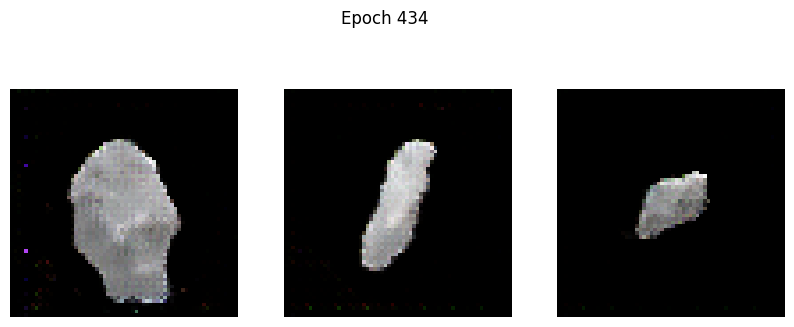

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -77.8372 - g_loss: 4.5348
Epoch 435/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -76.0673 - g_loss: 3.9241

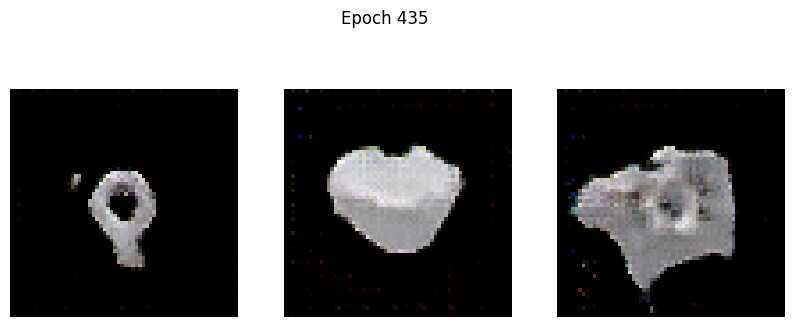

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -76.0857 - g_loss: 3.9207
Epoch 436/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -79.5079 - g_loss: 4.7324

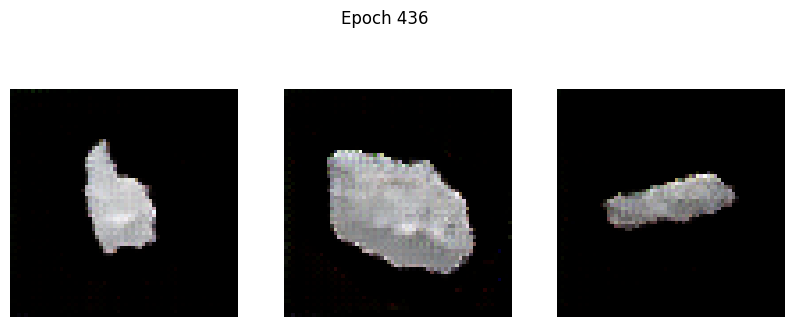

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -79.4034 - g_loss: 4.7442
Epoch 437/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: 11.3143 - g_loss: 18.3776

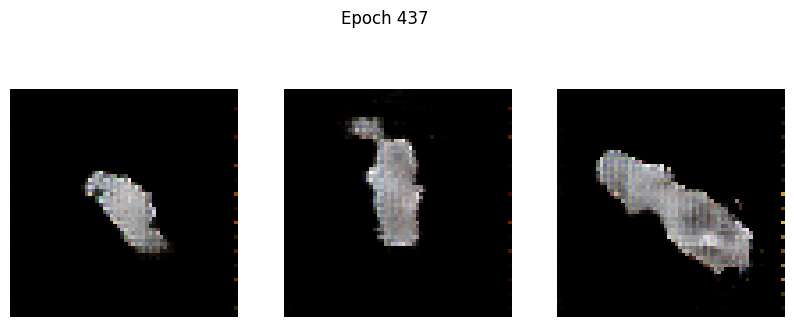

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: 11.3281 - g_loss: 18.4314
Epoch 438/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -36.9175 - g_loss: 15.5888

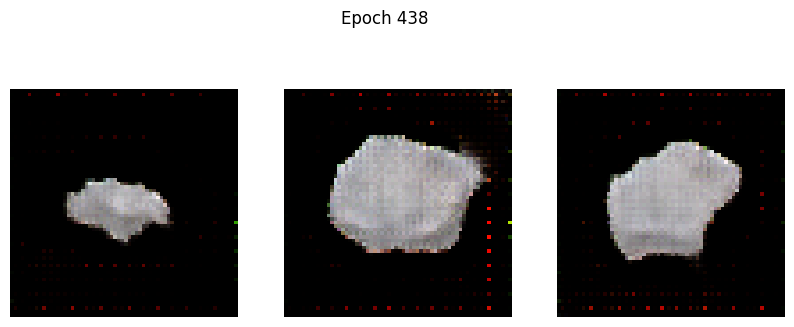

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -36.9146 - g_loss: 15.6180
Epoch 439/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -62.5383 - g_loss: 12.7612

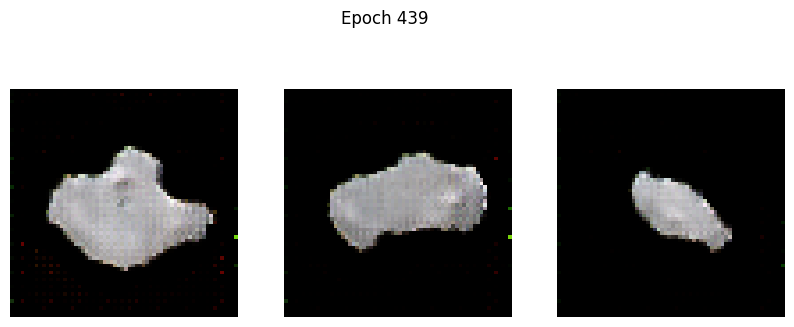

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -62.5378 - g_loss: 12.7368
Epoch 440/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -62.5293 - g_loss: 5.3802

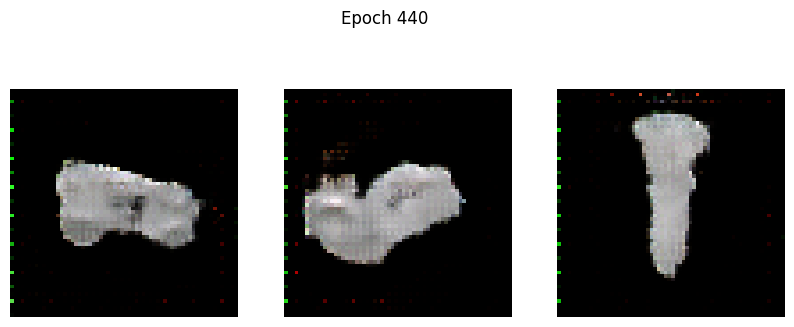

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -62.6349 - g_loss: 5.3811
Epoch 441/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -68.1234 - g_loss: 4.6218

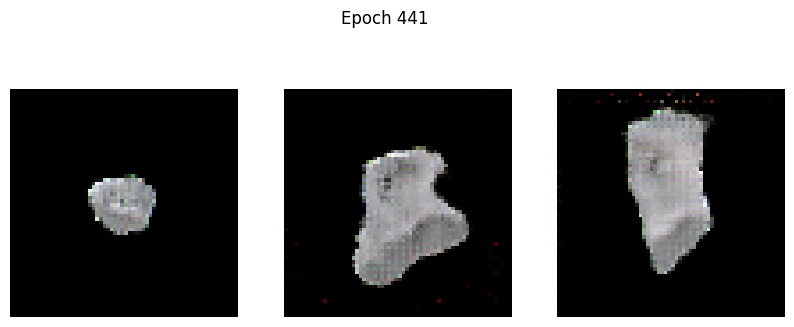

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -68.2257 - g_loss: 4.6180
Epoch 442/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -82.5345 - g_loss: 3.9835

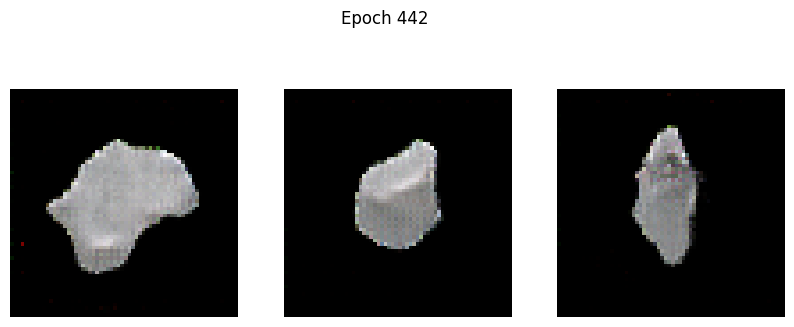

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -82.5304 - g_loss: 3.9818
Epoch 443/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -89.7033 - g_loss: 3.1113

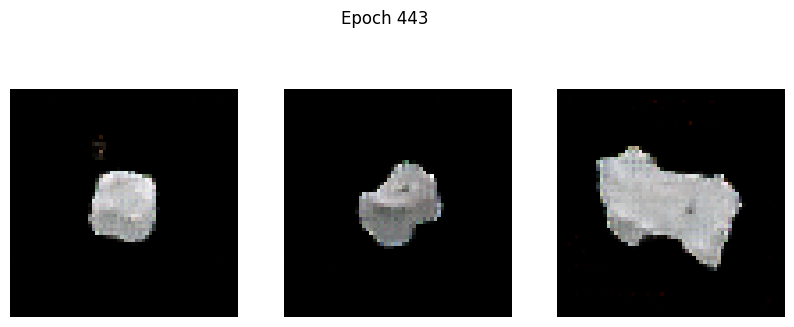

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -89.7570 - g_loss: 3.1105
Epoch 444/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -103.2282 - g_loss: 2.8432

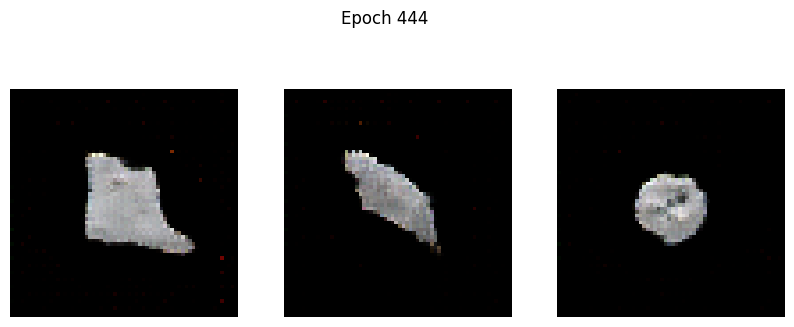

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -103.1739 - g_loss: 2.8508
Epoch 445/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -88.5483 - g_loss: 3.8216

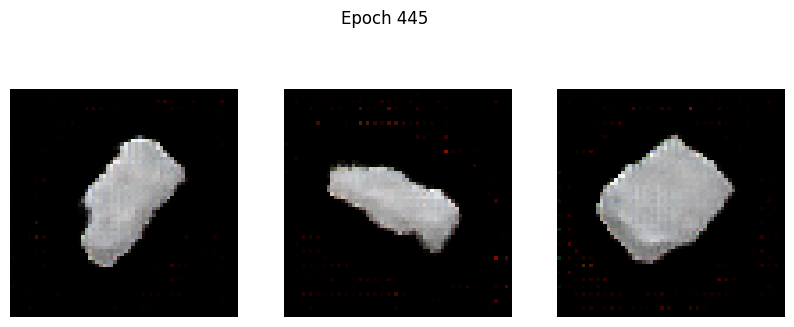

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -88.5594 - g_loss: 3.8240
Epoch 446/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -92.0625 - g_loss: 4.4167

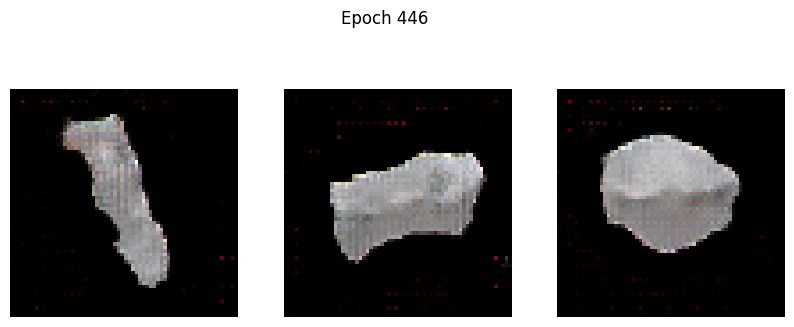

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -92.0787 - g_loss: 4.4166
Epoch 447/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -89.3170 - g_loss: 6.8926

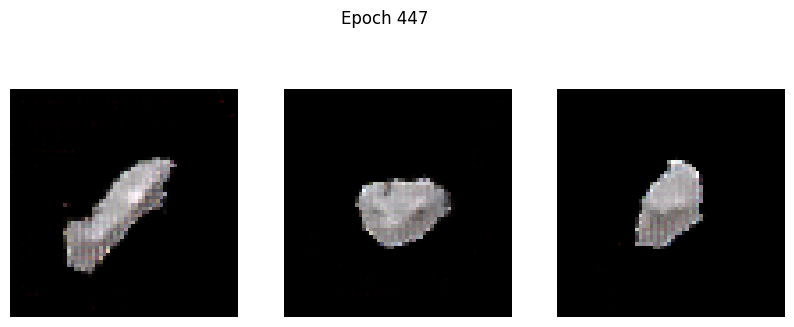

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -89.2686 - g_loss: 6.8945
Epoch 448/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -106.1891 - g_loss: 5.4001

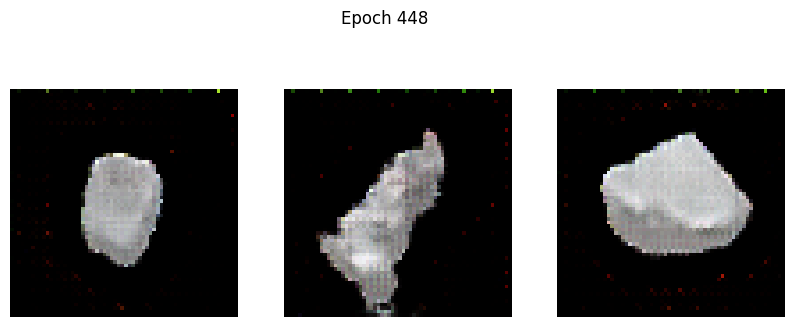

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -106.1843 - g_loss: 5.3951
Epoch 449/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -89.9727 - g_loss: 3.6806

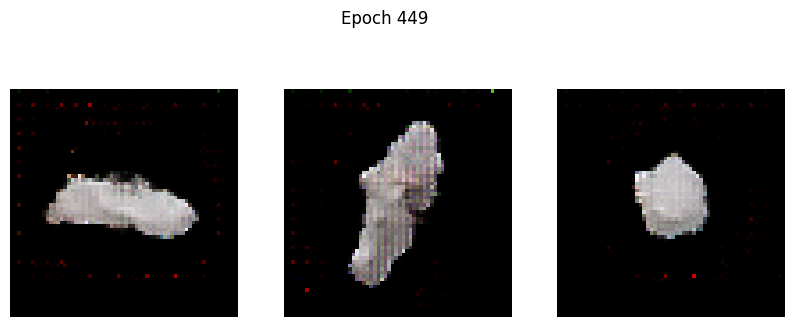

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -90.0881 - g_loss: 3.6832
Epoch 450/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -92.6120 - g_loss: 4.4662

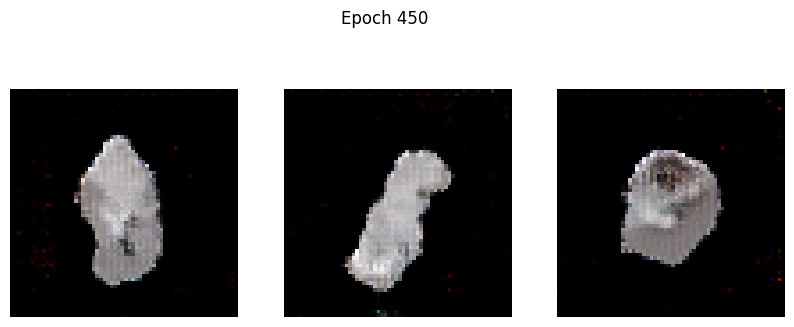

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -92.7301 - g_loss: 4.4634
Epoch 451/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -98.5539 - g_loss: 4.0589

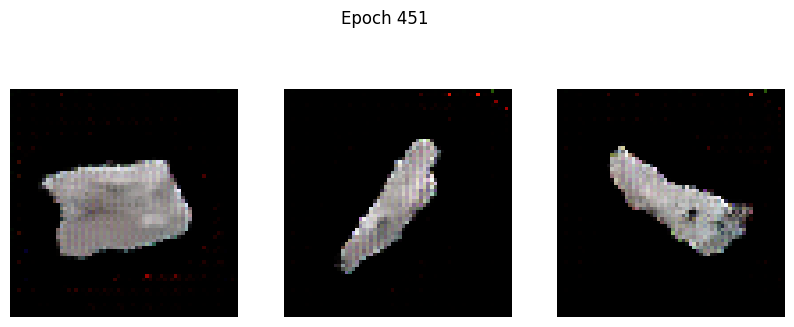

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -98.6480 - g_loss: 4.0620
Epoch 452/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -108.9574 - g_loss: 5.1938

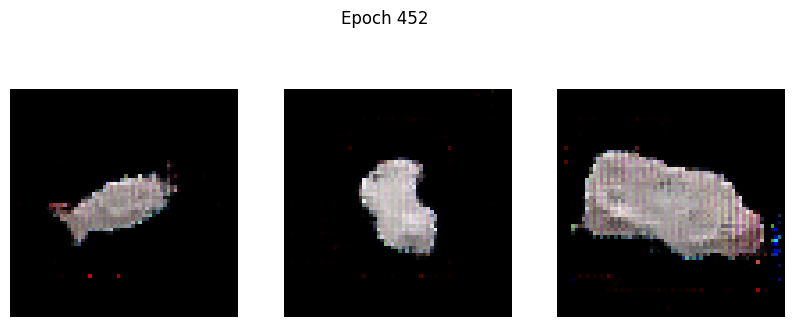

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -108.9405 - g_loss: 5.2002
Epoch 453/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -130.2178 - g_loss: 7.9415

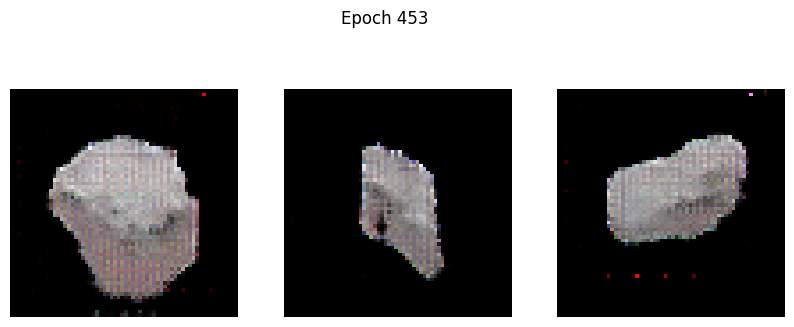

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -130.0432 - g_loss: 7.9374
Epoch 454/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -111.6869 - g_loss: 7.4223

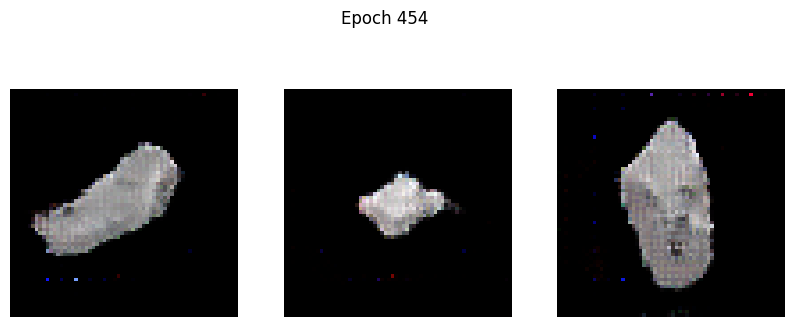

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -111.8094 - g_loss: 7.4010
Epoch 455/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: -79.0543 - g_loss: 7.9334

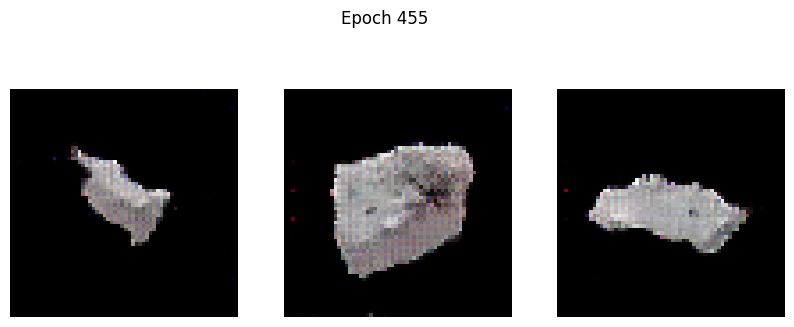

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: -79.4313 - g_loss: 7.9223
Epoch 456/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: 2602.5283 - g_loss: 79.0651

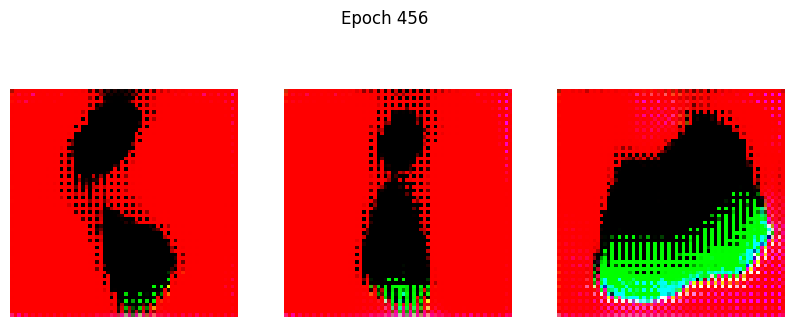

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: 2744.2581 - g_loss: 85.4935
Epoch 457/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_loss: 4146.2095 - g_loss: 9951.6299

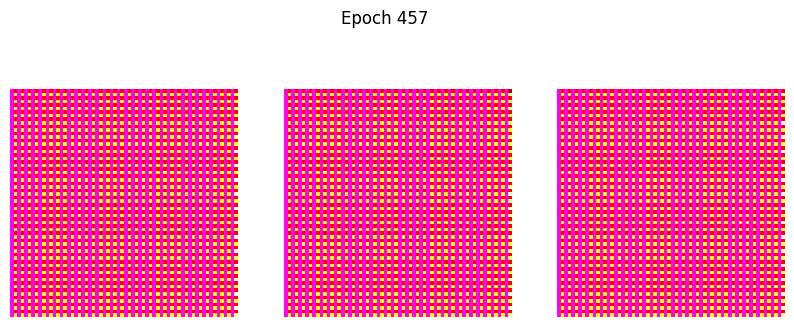

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 114ms/step - d_loss: 4123.1333 - g_loss: 9941.2822
Epoch 458/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - d_loss: -2216.6257 - g_loss: 10533.3066

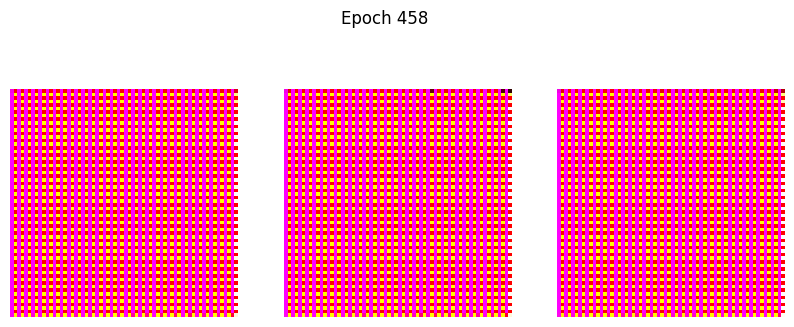

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: -2238.7505 - g_loss: 10558.6504
Epoch 459/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: 30266.7832 - g_loss: 35855.3438

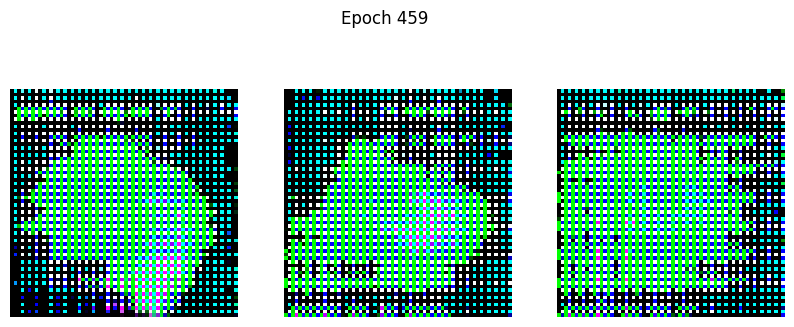

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 116ms/step - d_loss: 30801.4004 - g_loss: 35871.0938
Epoch 460/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_loss: 8457.2822 - g_loss: 25163.9707

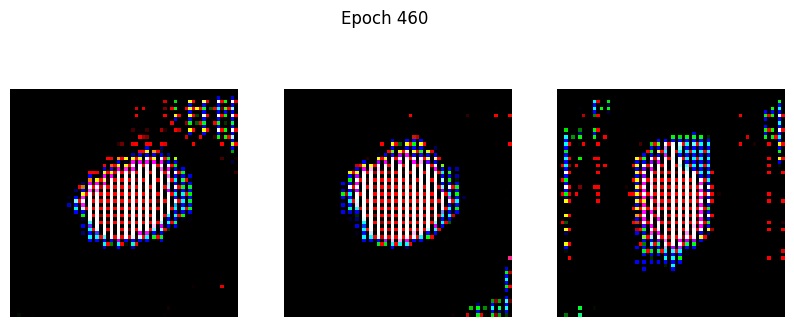

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - d_loss: 8469.7061 - g_loss: 25062.9082
Epoch 461/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 11860.3486 - g_loss: 8639.9570

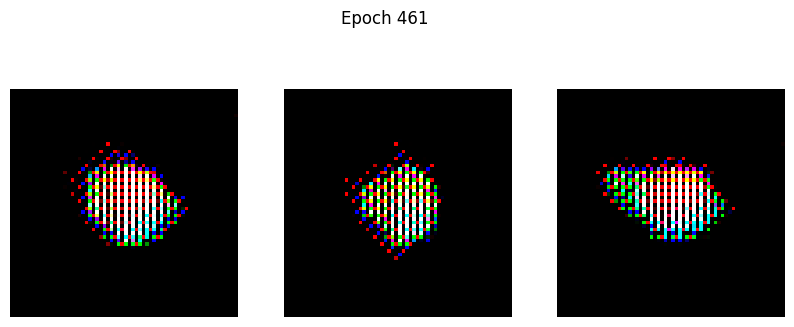

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 11835.8457 - g_loss: 8655.8672
Epoch 462/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 2997.5669 - g_loss: 9003.9395

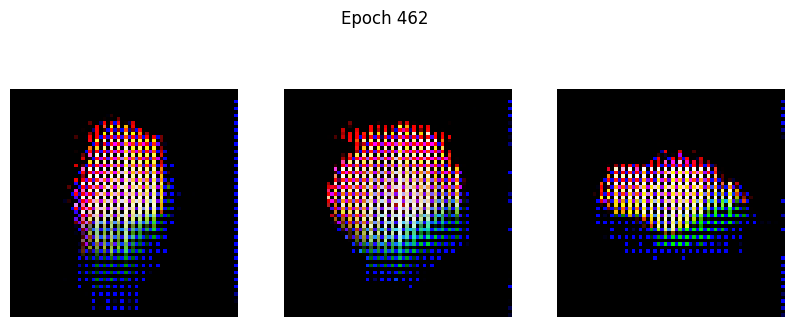

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 3004.6050 - g_loss: 8999.1855
Epoch 463/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 2856.4651 - g_loss: 4750.8184

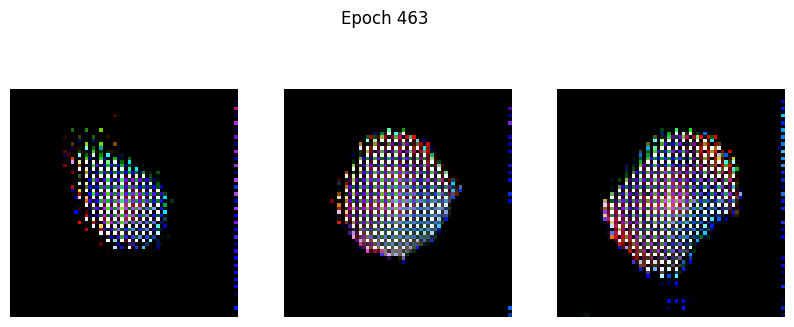

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 2864.6750 - g_loss: 4737.0986
Epoch 464/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 4307.0430 - g_loss: 2828.0752

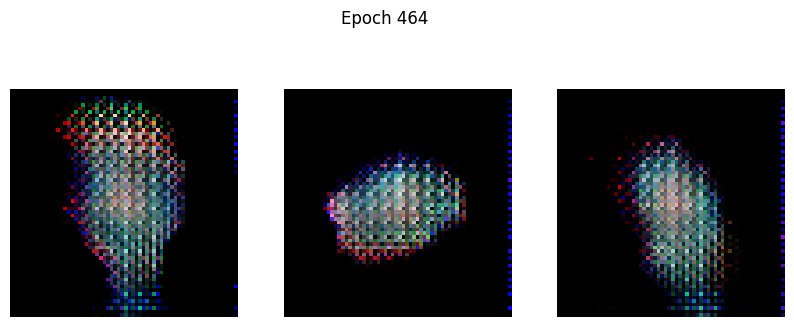

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 4308.1504 - g_loss: 2824.2434
Epoch 465/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 4602.3003 - g_loss: 1057.1387

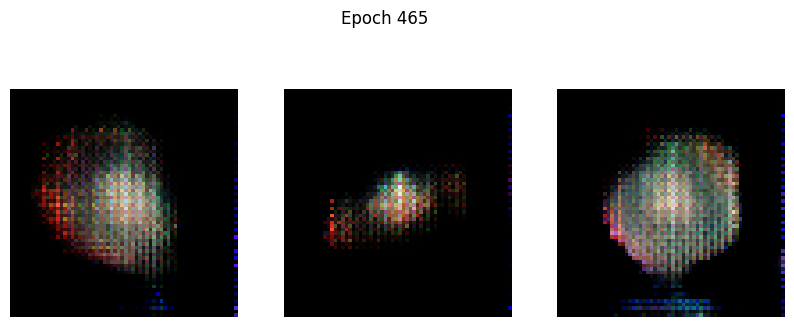

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 4604.0571 - g_loss: 1061.0553
Epoch 466/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - d_loss: 4315.8467 - g_loss: 834.1202

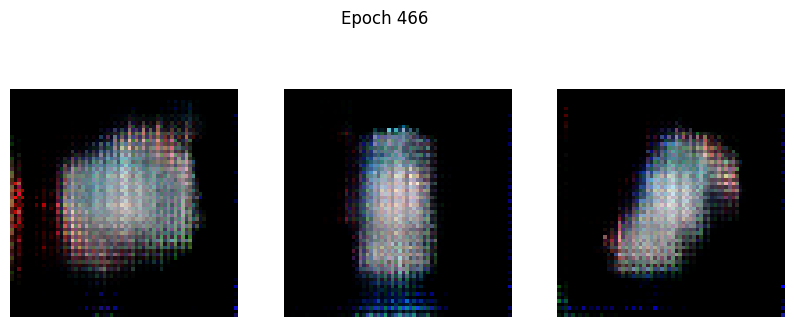

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 111ms/step - d_loss: 4316.9365 - g_loss: 835.0208
Epoch 467/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 4179.9868 - g_loss: 942.2611

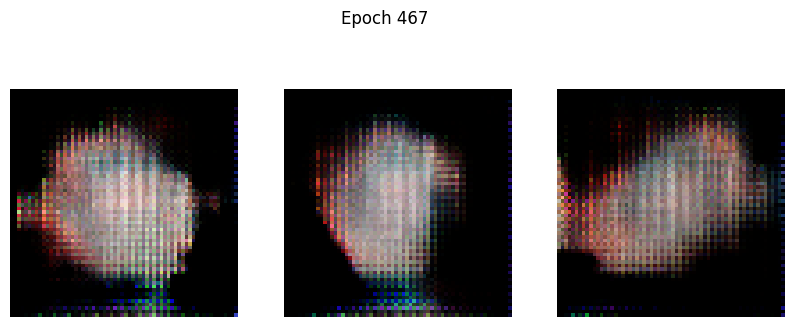

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - d_loss: 4180.5073 - g_loss: 942.3508
Epoch 468/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_loss: 4203.0483 - g_loss: 1160.9369

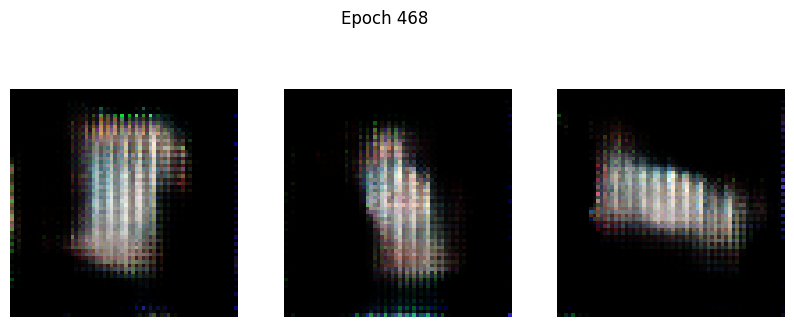

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 114ms/step - d_loss: 4202.6016 - g_loss: 1162.1145
Epoch 469/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 4385.8682 - g_loss: 1147.4556

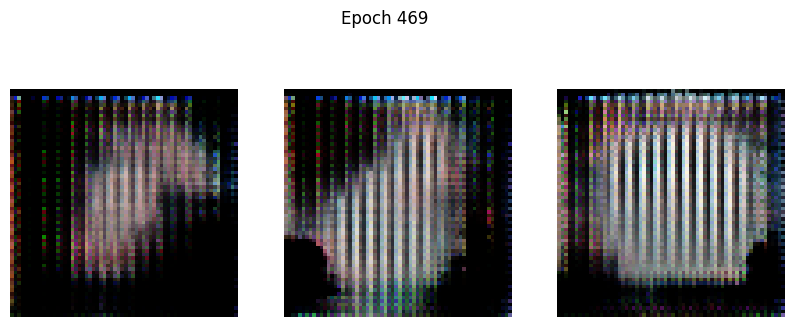

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - d_loss: 4388.8735 - g_loss: 1146.4062
Epoch 470/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 5234.4634 - g_loss: 746.3138

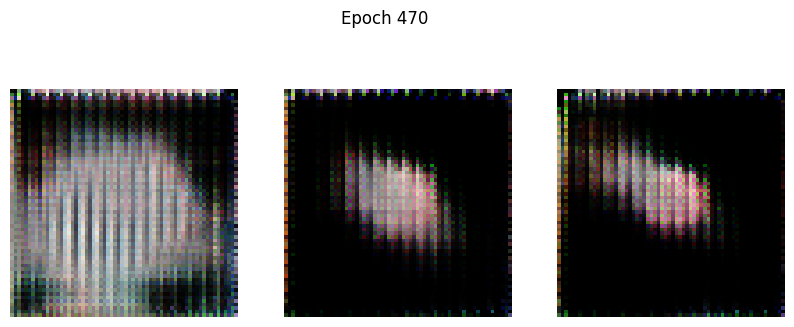

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 5233.8047 - g_loss: 747.6176
Epoch 471/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 4824.3862 - g_loss: 1198.9508

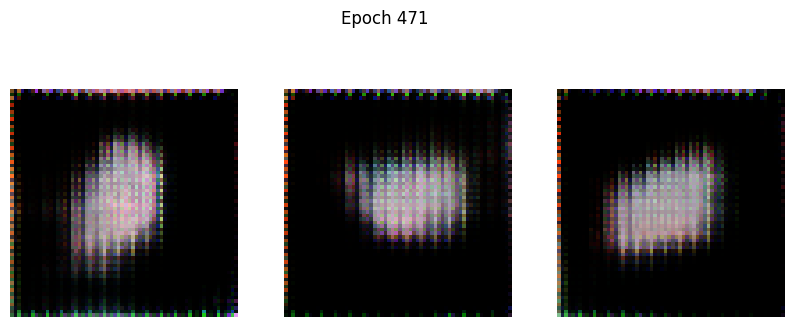

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 4820.9214 - g_loss: 1198.5862
Epoch 472/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 3871.2842 - g_loss: 1579.2526

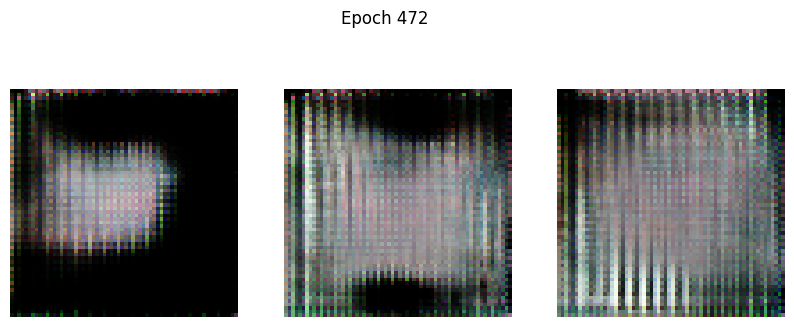

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 3869.6780 - g_loss: 1578.8198
Epoch 473/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 3572.0637 - g_loss: 1671.7522

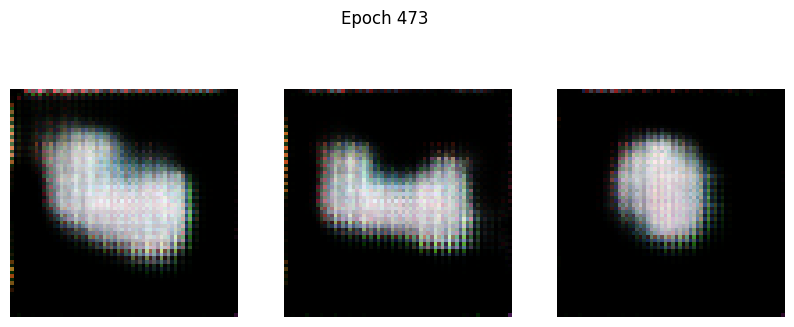

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 3574.0410 - g_loss: 1671.6381
Epoch 474/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 3329.5542 - g_loss: 1307.7389

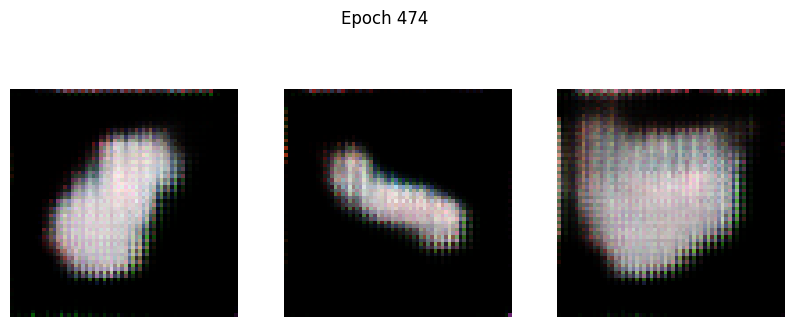

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 3330.7896 - g_loss: 1309.9771
Epoch 475/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 3816.8496 - g_loss: 1323.1537

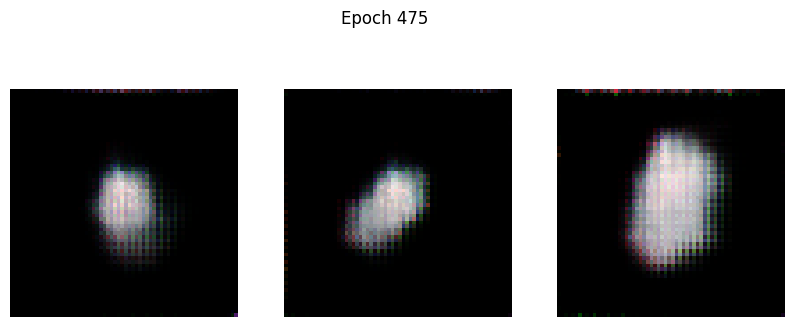

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 3813.0190 - g_loss: 1324.6057
Epoch 476/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 3233.0200 - g_loss: 1473.5881

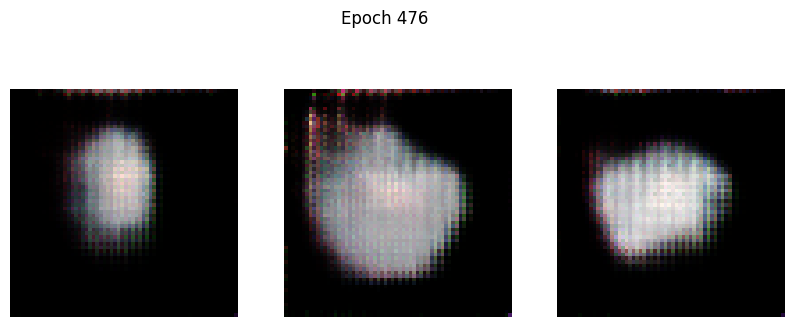

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - d_loss: 3231.5325 - g_loss: 1473.5909
Epoch 477/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 3076.9641 - g_loss: 1178.5430

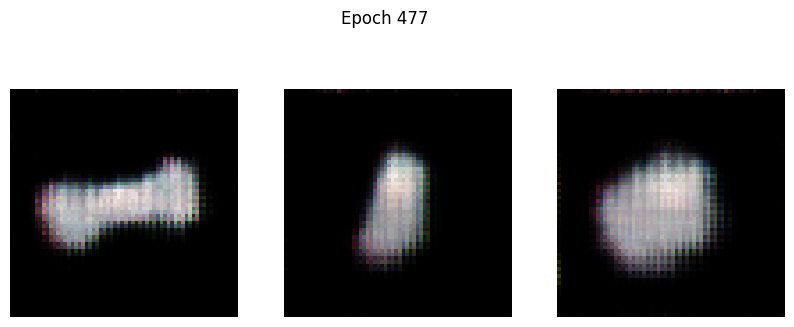

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 3075.2864 - g_loss: 1179.2572
Epoch 478/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 3071.4604 - g_loss: 1348.1256

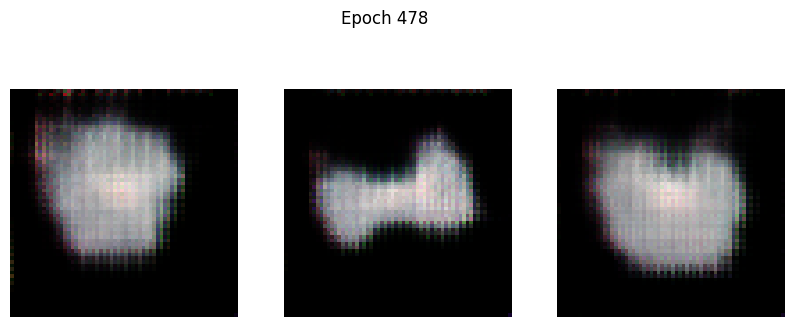

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - d_loss: 3070.8940 - g_loss: 1347.5896
Epoch 479/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 2453.0942 - g_loss: 1074.7073

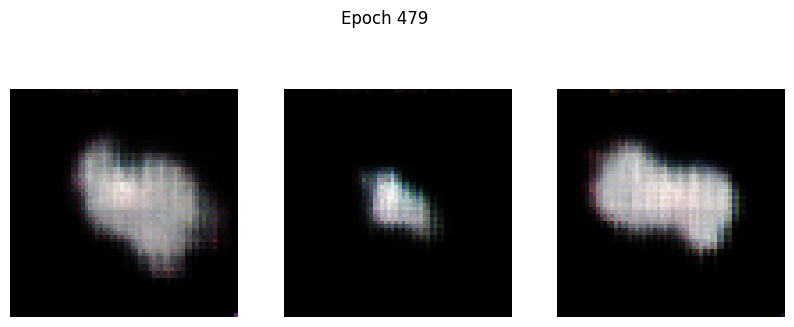

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 2453.1819 - g_loss: 1075.2056
Epoch 480/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 2682.3025 - g_loss: 1187.5428

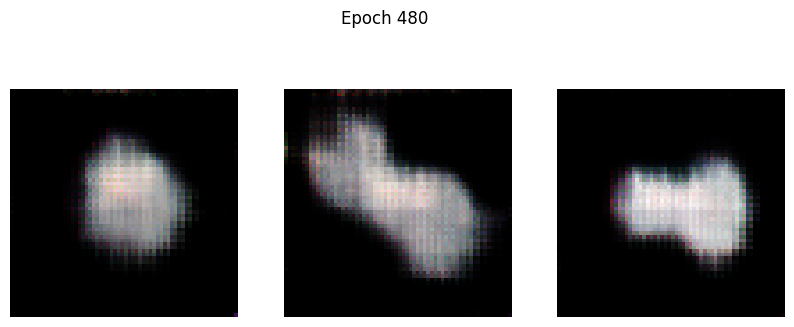

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 2680.1384 - g_loss: 1186.6593
Epoch 481/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 2494.1057 - g_loss: 1054.7369

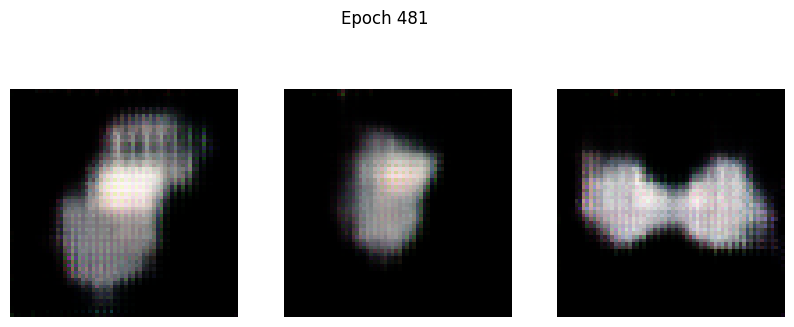

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 2494.2615 - g_loss: 1055.0862
Epoch 482/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 2249.4177 - g_loss: 1108.1621

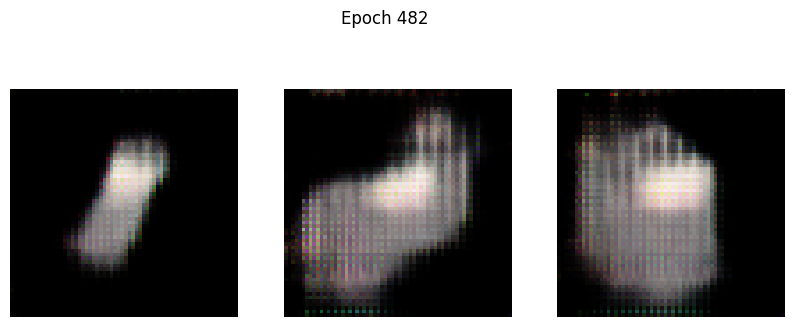

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 2249.2800 - g_loss: 1108.8490
Epoch 483/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 2131.0059 - g_loss: 1051.7867

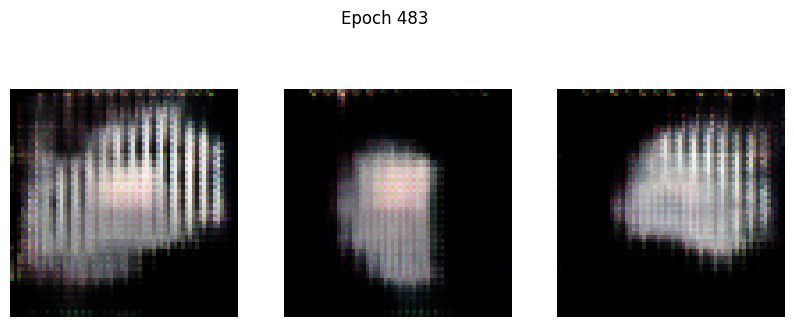

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 2132.7349 - g_loss: 1050.6755
Epoch 484/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 2930.3523 - g_loss: 714.1561

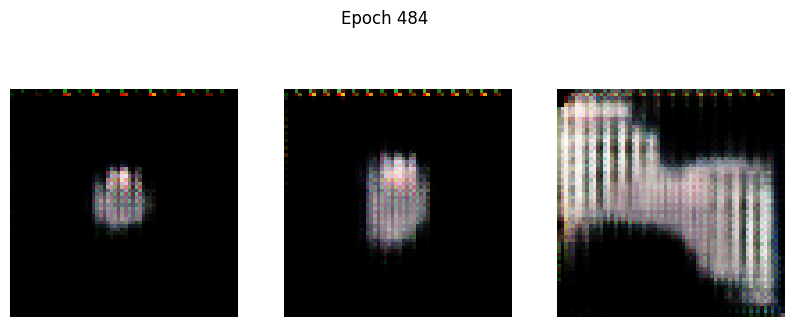

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 2928.0103 - g_loss: 715.6630
Epoch 485/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 1651.5417 - g_loss: 1010.9402

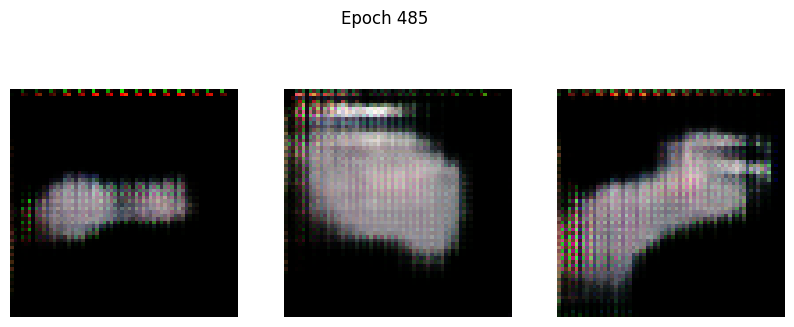

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - d_loss: 1652.3839 - g_loss: 1010.8705
Epoch 486/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 1954.9319 - g_loss: 869.9523

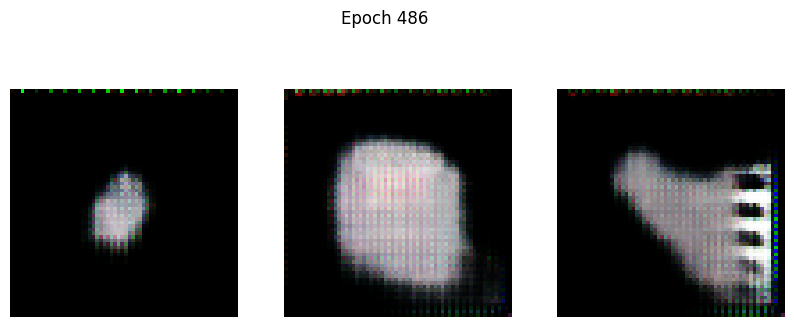

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 1954.6775 - g_loss: 870.8948
Epoch 487/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 1981.3441 - g_loss: 1001.3839

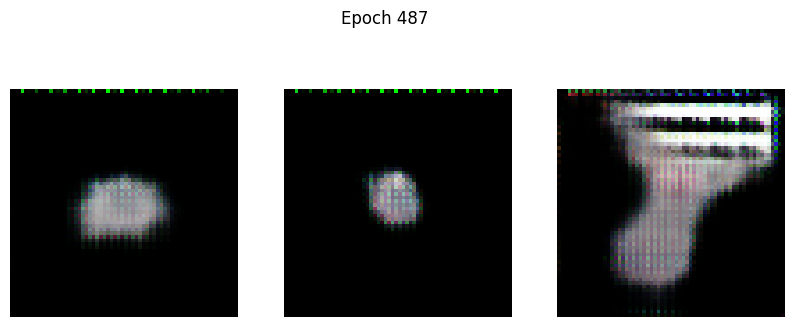

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - d_loss: 1980.4154 - g_loss: 1001.2182
Epoch 488/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 2055.8213 - g_loss: 1087.4708

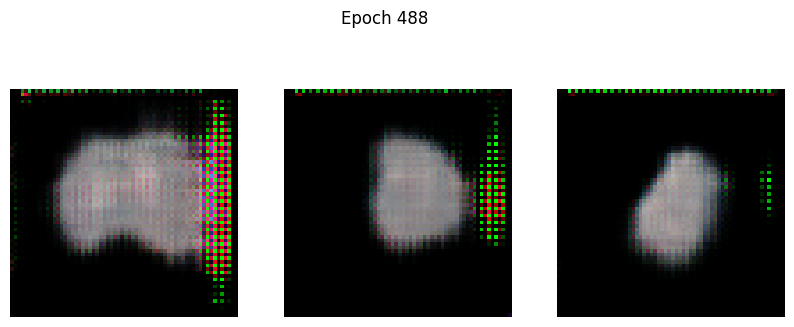

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - d_loss: 2055.0874 - g_loss: 1086.0497
Epoch 489/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 2015.7573 - g_loss: 935.5433

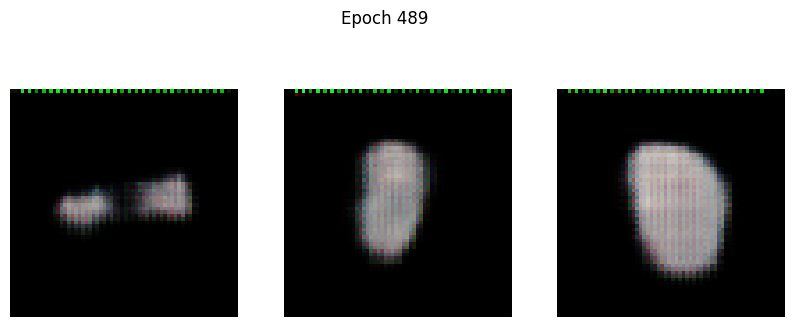

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - d_loss: 2016.2174 - g_loss: 936.3375
Epoch 490/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 2037.4065 - g_loss: 1138.8799

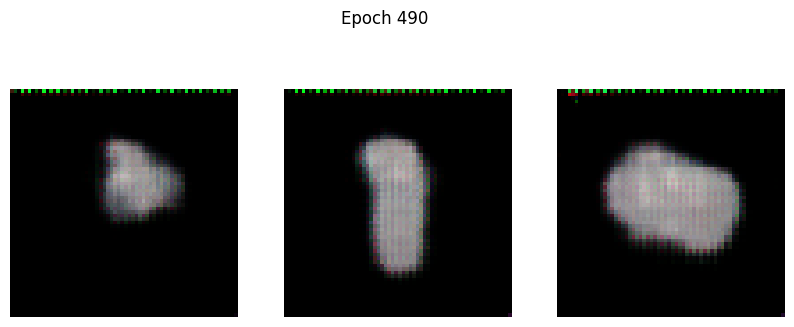

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 2037.2648 - g_loss: 1137.7175
Epoch 491/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 1953.3894 - g_loss: 1228.9803

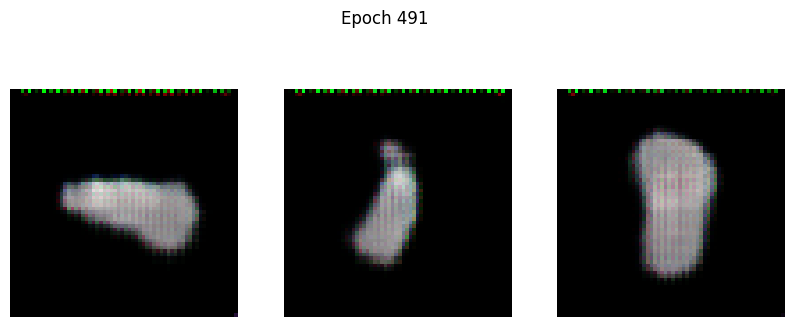

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 1952.9093 - g_loss: 1227.1927
Epoch 492/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 1852.5664 - g_loss: 856.2996

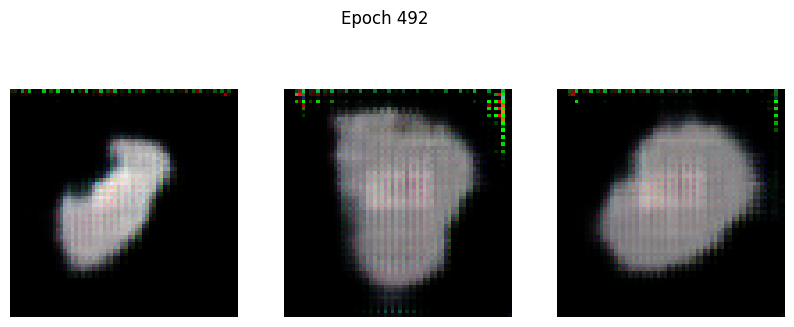

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 1852.6885 - g_loss: 857.5563
Epoch 493/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - d_loss: 1890.8036 - g_loss: 992.9688

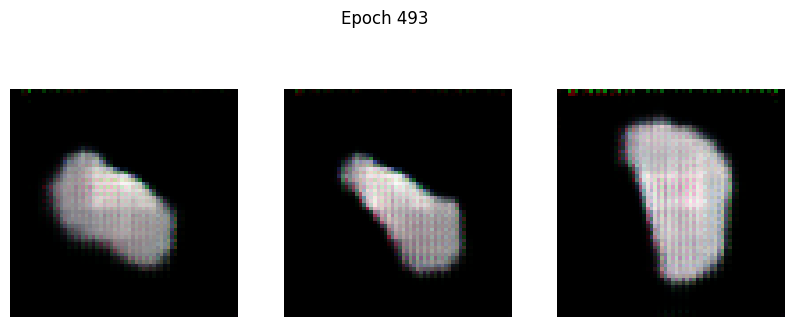

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 1890.7603 - g_loss: 993.5292
Epoch 494/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 1780.8458 - g_loss: 837.2797

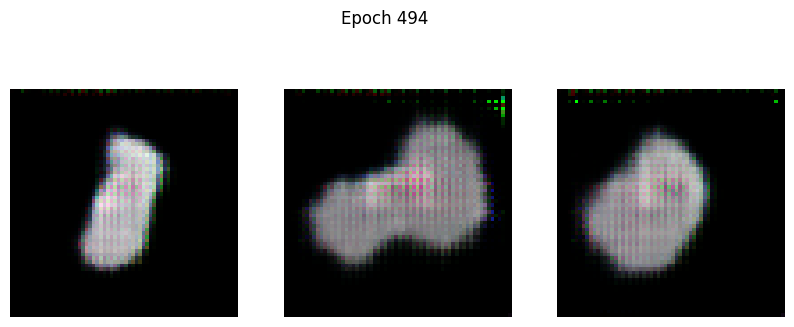

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 1780.6113 - g_loss: 837.4651
Epoch 495/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 1600.7180 - g_loss: 881.6432

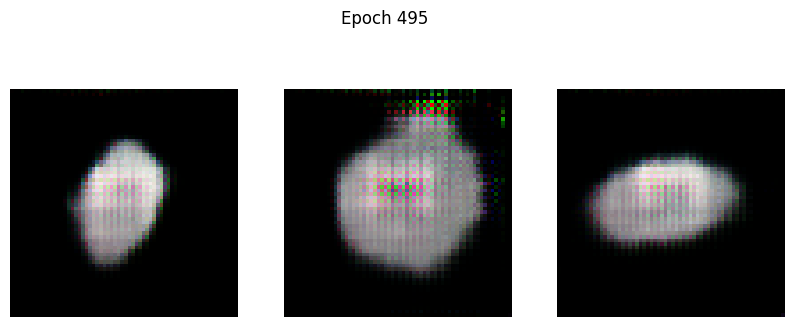

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 1601.0814 - g_loss: 881.8629
Epoch 496/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 1535.2333 - g_loss: 847.1042

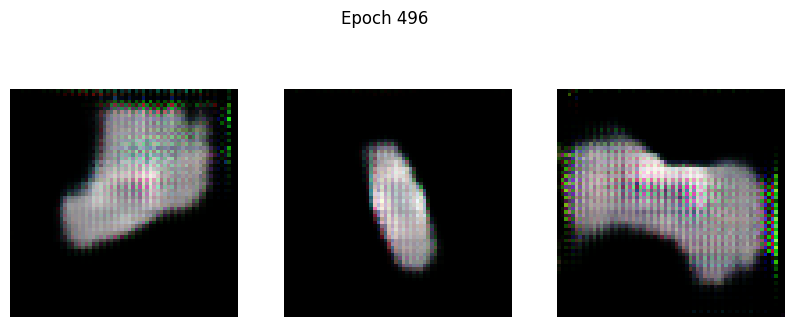

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 1536.8308 - g_loss: 847.4700
Epoch 497/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 1609.1001 - g_loss: 886.2494

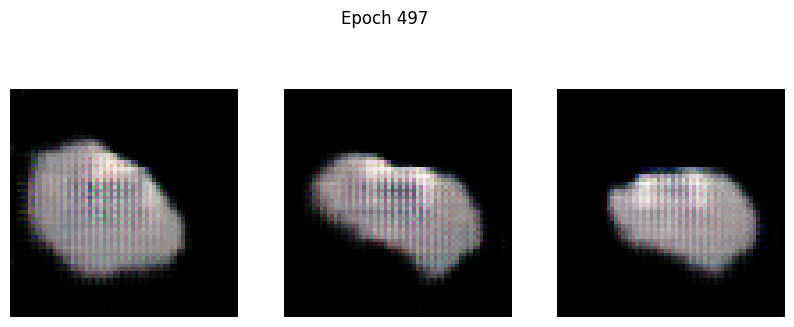

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 1608.5938 - g_loss: 885.9124
Epoch 498/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 1679.7979 - g_loss: 839.1626

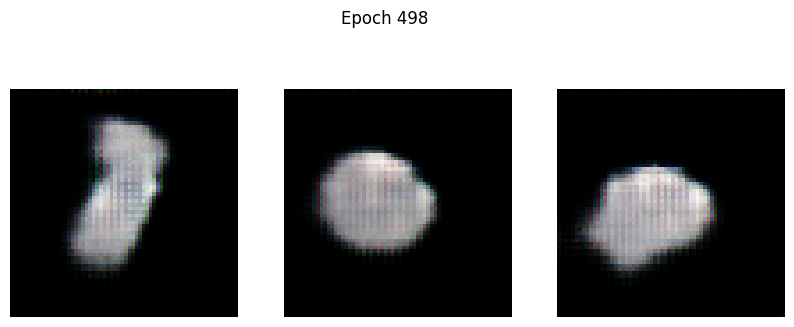

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step - d_loss: 1679.4625 - g_loss: 838.9244
Epoch 499/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 1499.7456 - g_loss: 820.6121

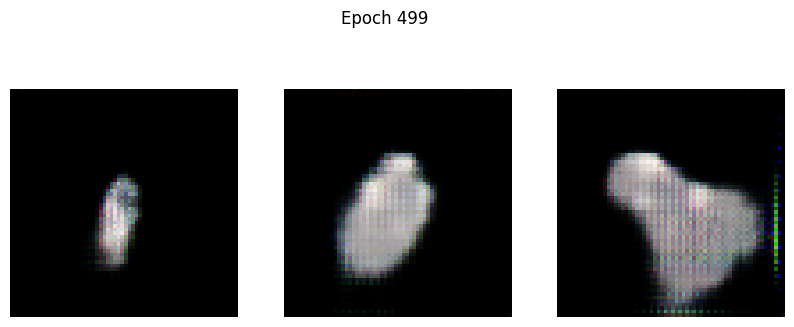

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 1499.7588 - g_loss: 820.4338
Epoch 500/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - d_loss: 1462.9037 - g_loss: 720.0032

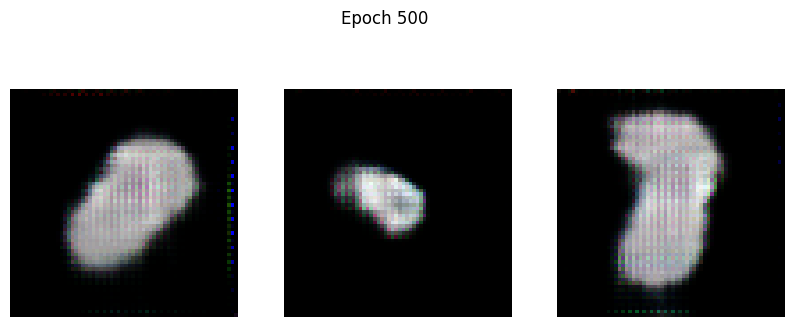

102/102 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - d_loss: 1463.3942 - g_loss: 720.5149


In [17]:
# Hyperparameters
EPOCHS = 500  # Tambahkan jumlah epoch untuk hasil lebih baik (misal: 100-200)
lr_generator = 0.0002
lr_discriminator = 0.0002

# Inisialisasi DCGAN
dcgan = DCGAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

# Compile
dcgan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=lr_discriminator, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=lr_generator, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

# Jalankan Training
print("Mulai Training...")
dcgan.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[GANMonitor(num_img=3, latent_dim=latent_dim)]
)

In [18]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

latent_dim = 128

In [19]:
# Asumsi: Variabel 'generator' adalah model Keras yang sudah terlatih.
try:
    generator.save('generator_model.keras')
    print("Generator model saved successfully as 'generator_model.keras'")
except Exception as e:
    print(f"Error saving generator model: {e}")

Generator model saved successfully as 'generator_model.keras'


In [20]:
print("\n--- Memuat Model Generator yang Tersimpan ---")

try:
    loaded_generator = tf.keras.models.load_model('generator_model.keras')
    print("Generator model loaded successfully.")
except Exception as e:
    print(f"Error loading generator model: {e}")
    loaded_generator = None


--- Memuat Model Generator yang Tersimpan ---
Generator model loaded successfully.



--- 3. Generasi 5 Gambar Baru Acak ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


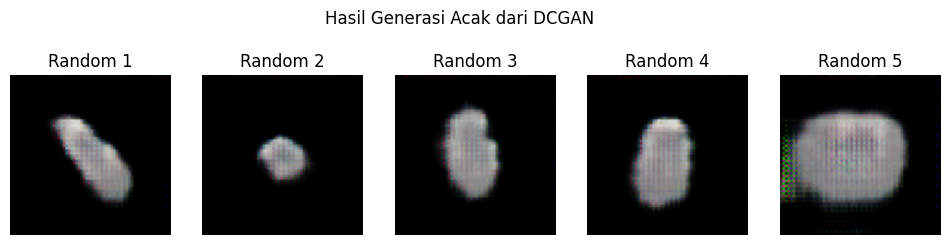

In [21]:
num_images = 5

print(f"\n--- 3. Generasi {num_images} Gambar Baru Acak ---")

if loaded_generator is not None:
    # 1. Buat 5 vektor random noise
    noise_input_random = np.random.normal(0, 1, size=(num_images, latent_dim))

    # 2. Generator menghasilkan gambar (prediksi)
    generated_images_random = loaded_generator.predict(noise_input_random)

    # 3. Denormalisasi dan Tampilkan/Plot Gambar

    # KEMUNGKINAN DENORMALISASI: Jika output generator Anda [-1, 1], gunakan baris ini:
    generated_images_random = (generated_images_random + 1) / 2.0
    # Jika output generator Anda [0, 1], abaikan baris di atas.

    plt.figure(figsize=(12, 3))
    for i in range(num_images):
        plt.subplot(1, num_images, i + 1)
        image = generated_images_random[i, :, :, :]
        plt.imshow(image)
        plt.title(f'Random {i+1}')
        plt.axis('off')

    plt.suptitle("Hasil Generasi Acak dari DCGAN")
    plt.show()


--- 4. Generasi 5 Gambar dengan Latent Space Interpolation ---
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


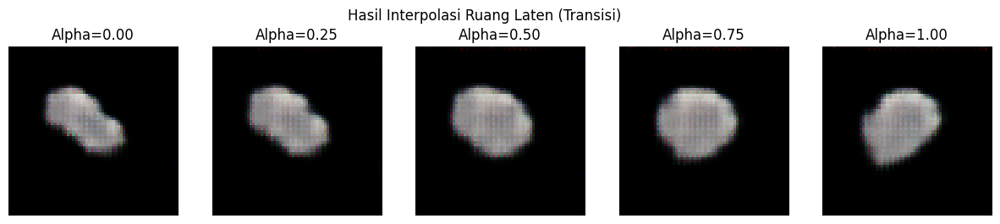

In [22]:
print(f"\n--- 4. Generasi 5 Gambar dengan Latent Space Interpolation ---")

if loaded_generator is not None:
    # 1. Tentukan dua vektor latent acak (titik awal z_A dan titik akhir z_B)
    z_A = np.random.normal(0, 1, size=(1, latent_dim))
    z_B = np.random.normal(0, 1, size=(1, latent_dim))

    # Kita ingin 5 gambar interpolasi. Kita gunakan 5 langkah (alpha) antara 0 dan 1.
    num_interpolated_steps = 5
    alphas = np.linspace(0.0, 1.0, num_interpolated_steps)

    interpolated_vectors = []
    for alpha in alphas:
        # Rumus interpolasi linier: z_interp = (1 - alpha) * z_A + alpha * z_B
        z_interp = (1 - alpha) * z_A + alpha * z_B
        interpolated_vectors.append(z_interp)

    # Gabungkan vektor interpolasi menjadi satu array
    interpolated_input = np.vstack(interpolated_vectors)

    # 2. Generator menghasilkan gambar
    interpolated_images = loaded_generator.predict(interpolated_input)

    # 3. Denormalisasi dari [-1, 1] ke [0, 1]
    interpolated_images = (interpolated_images + 1.0) / 2.0

    # 4. Tampilkan Gambar
    plt.figure(figsize=(15, 3))
    for i in range(num_interpolated_steps):
        plt.subplot(1, num_interpolated_steps, i + 1)
        image = interpolated_images[i]
        plt.imshow(image)
        # Menampilkan bobot alpha untuk menunjukkan transisi
        plt.title(f'Alpha={alphas[i]:.2f}')
        plt.axis('off')

    plt.suptitle("Hasil Interpolasi Ruang Laten (Transisi)")
    plt.show()